## Deep Q learning

In [2]:
# memory.py
import numpy as np
np.random.seed(42)

class Memory:
    def __init__(self, memory_size, obs_dim, action_dim):
        self.memory_size = memory_size
        self.memory_counter = 0 
        self.state_memory = np.zeros((self.memory_size, 1, *obs_dim))
        self.next_state_memory = np.zeros((self.memory_size, 1, *obs_dim))
        self.action_memory = np.zeros((self.memory_size, action_dim))
        self.reward_memory = np.zeros(self.memory_size)
        self.done_memory = np.zeros(self.memory_size, dtype=np.bool)

    # Stores the transition in the memory
    def add_memory(self, state, action, reward, next_state, done):
        index = self.memory_counter % self.memory_size
        self.memory_counter += 1
        self.state_memory[index] = state
        self.action_memory[index] = action
        self.reward_memory[index] = reward
        self.next_state_memory[index] = next_state
        self.done_memory[index] = done
    
    # Get random batch from the memory
    def sample_batch(self, batch_size):
        max_memory = min(self.memory_counter, self.memory_size)
        batch_index = np.random.choice(max_memory, batch_size)

        states = self.state_memory[batch_index]
        actions = self.action_memory[batch_index]
        rewards = self.reward_memory[batch_index]
        next_states = self.next_state_memory[batch_index]
        dones = self.done_memory[batch_index]

        return states, actions, rewards, next_states, dones

In [3]:
# agent.py
import os
import numpy as np
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as k

class Agent():
    def __init__(self, obs_dim, action_dim, gamma,
                lr, eps, eps_decay, eps_min, env=None, memory_size=50000,
                batch_size=256, dir='dqn'):
        self.obs_dim = obs_dim
        self.action_dim = action_dim
        self.action_limit = env.action_space.high
        self.gamma = gamma # Discount factor
        self.lr = lr # Learning rate for all networks
        self.epsilon = eps
        self.epsilon_decay = eps_decay
        self.epsilon_min = eps_min
        self.memory = Memory(memory_size, obs_dim, action_dim)
        self.batch_size = batch_size
        self.dir = dir


        # Q Network
        self.q = self.network(obs_dim[0], action_dim)

        # Target Network
        self.q_target = self.network(obs_dim[0], action_dim)


    def get_action(self, observation):
        if np.random.rand() <= self.epsilon:
            return np.random.uniform(-1, 1, 4)
        action = self.q.predict(observation)
        return action[0]

    def network(self, obs_dim, action_dim):
        q_network = Sequential()
        q_network.add(Dense(64, activation='relu', input_dim=obs_dim))
        q_network.add(Dense(64, activation='relu'))
        q_network.add(Dense(action_dim, activation='linear'))
        q_network.compile(optimizer=Adam(lr=self.lr), loss='mse')
        return q_network

    def learn(self):
        if self.memory.memory_counter > self.batch_size:
            state, action, reward, next_state, done = self.memory.sample_batch(self.batch_size)
            for batch_index in range(self.batch_size):
                q_next = self.q_target.predict(next_state[batch_index])
                q_target = reward[batch_index] + self.gamma * (1-done[batch_index]) * np.max(q_next)
                q_target_old = self.q.predict(state[batch_index])
                q_target_old[0] = q_target
                self.q.fit(state[batch_index], q_target_old, verbose=0, epochs=1)
                k.clear_session()

    def update(self, q, q_target):
        for target_weight, q_weight in zip(q_target.trainable_weights, q.trainable_weights):
            target_weight.assign(q_weight)
        return q_target
            
    def greedy(self):
            self.epsilon *= self.epsilon_decay
            if self.epsilon < self.epsilon_min:
                self.epsilon = self.epsilon_min
    
    def add_memory(self, state, action, reward, next_state, done):
        self.memory.add_memory(state, action, reward, next_state, done)

    def save(self):
        self.q.save_weights(self.dir + "/q.ckpt")
        print("Models saved")
    
    def load(self):
        self.q.load_weights(self.dir+"/q.ckpt")
        print("Models loaded")

In [4]:
# playBipedalWalker.py
import gym, time
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

if __name__ == "__main__":

    gamma = 0.99
    learning_rate = 0.0005
    memory_size = 50000
    batch_size = 32
    epsilon = 0
    eps_decay = 0.999
    eps_min = 0.05
    test_episodes = 5
    max_steps = 1600


    env = gym.make('BipedalWalker-v3')
    env = env.unwrapped

    state_dim = env.observation_space.shape[0]
    action_dim = env.action_space.shape[0]

    agent = Agent(obs_dim=env.observation_space.shape,
                      action_dim=env.action_space.shape[0], gamma=gamma,
                      lr=learning_rate, eps=epsilon, eps_decay=eps_decay, eps_min=eps_min,
                      env=env, memory_size=memory_size, batch_size=batch_size, dir='deep-q-model')

    t0 = time.time()
    agent.load()
    rewards = []
    epsilon_history = []
    steps = 0

    for epoch in range(test_episodes):
        done = False
        state = env.reset()
        state = state.reshape(1, -1)
        start = time.time()
        total_reward = 0
        steps = 0
        for step in range(max_steps):
            steps += 1
            action = agent.get_action(state)
            next_state, reward, done, info = env.step(action)
            next_state = next_state.reshape(1, -1)
            total_reward += reward
            env.render()

            state = next_state
            if done:
                break
"""         print(
            'Testing  | Episode: {}/{}  | Reward: {:.4f} | Steps: {:.4f} | Running Time: {:.4f}'.format(
                epoch + 1, test_episodes, reward, steps,
                time.time() - t0
            )
        ) """

/var/folders/18/27kk04gn68z8t3bc0npl90x00000gn/T/ipykernel_78531/3202649513.py:13: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  self.done_memory = np.zeros(self.memory_size, dtype=np.bool)
2023-05-12 14:53:25.670626: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


Models loaded
1/1 [==============================] - 0s 62ms/step


2023-05-12 14:53:26.142 Python[78531:6178724] ApplePersistenceIgnoreState: Existing state will not be touched. New state will be written to /var/folders/18/27kk04gn68z8t3bc0npl90x00000gn/T/org.python.python.savedState


1/1 [==============================] - 0s 10ms/step


"         print(\n            'Testing  | Episode: {}/{}  | Reward: {:.4f} | Steps: {:.4f} | Running Time: {:.4f}'.format(\n                epoch + 1, test_episodes, reward, steps,\n                time.time() - t0\n            )\n        ) "

In [10]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="-1"    
import gym
import numpy as np
from tqdm import tqdm

gamma = 0.99
learning_rate = 0.0005
memory_size = 50000
batch_size = 32
epsilon = 1.0
eps_decay = 0.999
eps_min = 0.05
episodes = 5000
target_update = 10

if __name__ == '__main__':
    env = gym.make('BipedalWalker-v3')
    env.seed(42)
    agent = Agent(obs_dim=env.observation_space.shape,
            action_dim=env.action_space.shape[0], gamma=gamma,
            lr=learning_rate, eps=epsilon, eps_decay=eps_decay, eps_min=eps_min,
            env=env, memory_size=memory_size, batch_size=batch_size, dir='deep-q-model')

    best_score = env.reward_range[0]
    max_steps = env._max_episode_steps
    total_steps = 0
    scores = []
    steps = []
    verbose = False
    progress = tqdm(range(episodes), desc='Training', unit=' episode')
    for i in progress:
        observation = env.reset()
        observation = observation.reshape(1, -1)
        done = False
        score = 0
        episode_steps = 0
        for step in range(max_steps):
            action = agent.get_action(observation)
            next_observation, reward, done, info = env.step(action)
            next_observation = next_observation.reshape(1, -1)

            score += reward
            episode_steps += 1
            total_steps += 1

            agent.add_memory(observation, action, reward, next_observation, done)
            observation = next_observation
            if done:
                break

        if (i % target_update) == 0:
            agent.q_target = agent.update(agent.q, agent.q_target)
            print('Updated')

        agent.learn()
        agent.greedy()
        scores.append(score)
        steps.append(episode_steps)
        average_score = np.mean(scores[-100:])

        print('\n')

        if average_score > best_score:
            best_score = average_score
            agent.save()
        if i % 20:
            np.save("reward.npy", np.array(scores))
            np.save("steps.npy", np.array(steps))
      
        print('Score %.1f' % score, 'Average Score %1f' % average_score, 'Steps %d' % episode_steps,
         'Total Steps %d' % total_steps, 'Epsilon %3f' % agent.epsilon)
        if average_score > 300:
            break
    np.save("reward.npy", np.array(scores))
    np.save("steps.npy", np.array(steps))

/var/folders/18/27kk04gn68z8t3bc0npl90x00000gn/T/ipykernel_69439/3202649513.py:13: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  self.done_memory = np.zeros(self.memory_size, dtype=np.bool)
Training:   0%|          | 0/5000 [00:00<?, ? episode/s]

Updated
1/1 [==============================] - 0s 17ms/step




Training:   0%|          | 1/5000 [00:04<6:23:50,  4.61s/ episode]

Models saved
Score -104.1 Average Score -104.071377 Steps 79 Total Steps 79 Epsilon 0.999000
1/1 [==============================] - 0s 17ms/step




Training:   0%|          | 2/5000 [00:08<6:12:08,  4.47s/ episode]

Models saved
Score -89.3 Average Score -96.689851 Steps 1600 Total Steps 1679 Epsilon 0.998001
1/1 [==============================] - 0s 17ms/step


Training:   0%|          | 3/5000 [00:13<5:59:28,  4.32s/ episode]



Score -107.0 Average Score -100.114508 Steps 72 Total Steps 1751 Epsilon 0.997003
1/1 [==============================] - 0s 18ms/step


Training:   0%|          | 4/5000 [00:17<5:51:42,  4.22s/ episode]



Score -125.2 Average Score -106.389239 Steps 179 Total Steps 1930 Epsilon 0.996006
1/1 [==============================] - 0s 16ms/step


Training:   0%|          | 5/5000 [00:21<5:56:24,  4.28s/ episode]



Score -86.9 Average Score -102.491033 Steps 1600 Total Steps 3530 Epsilon 0.995010
1/1 [==============================] - 0s 17ms/step


Training:   0%|          | 6/5000 [00:25<5:49:48,  4.20s/ episode]



Score -101.2 Average Score -102.268308 Steps 57 Total Steps 3587 Epsilon 0.994015
1/1 [==============================] - 0s 17ms/step


Training:   0%|          | 7/5000 [00:30<5:56:19,  4.28s/ episode]



Score -85.7 Average Score -99.903899 Steps 1600 Total Steps 5187 Epsilon 0.993021
1/1 [==============================] - 0s 17ms/step


Training:   0%|          | 8/5000 [00:34<5:49:30,  4.20s/ episode]



Score -99.1 Average Score -99.808166 Steps 63 Total Steps 5250 Epsilon 0.992028
1/1 [==============================] - 0s 17ms/step


Training:   0%|          | 9/5000 [00:38<6:01:30,  4.35s/ episode]



Score -80.7 Average Score -97.685160 Steps 1600 Total Steps 6850 Epsilon 0.991036
1/1 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 16ms/step


Training:   0%|          | 10/5000 [00:43<6:01:06,  4.34s/ episode]



Score -107.6 Average Score -98.680119 Steps 73 Total Steps 6923 Epsilon 0.990045
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:   0%|          | 11/5000 [00:47<5:55:57,  4.28s/ episode]



Score -101.6 Average Score -98.943179 Steps 62 Total Steps 6985 Epsilon 0.989055
1/1 [==============================] - 0s 17ms/step


Training:   0%|          | 12/5000 [00:51<5:53:04,  4.25s/ episode]



Score -113.7 Average Score -100.174983 Steps 80 Total Steps 7065 Epsilon 0.988066
1/1 [==============================] - 0s 17ms/step


Training:   0%|          | 13/5000 [00:55<5:49:11,  4.20s/ episode]



Score -115.6 Average Score -101.360248 Steps 63 Total Steps 7128 Epsilon 0.987078
1/1 [==============================] - 0s 17ms/step


Training:   0%|          | 14/5000 [01:00<5:59:02,  4.32s/ episode]



Score -79.2 Average Score -99.777638 Steps 1600 Total Steps 8728 Epsilon 0.986091
1/1 [==============================] - 0s 17ms/step


Training:   0%|          | 15/5000 [01:04<5:52:55,  4.25s/ episode]



Score -104.5 Average Score -100.092039 Steps 57 Total Steps 8785 Epsilon 0.985105
1/1 [==============================] - 0s 18ms/step


Training:   0%|          | 16/5000 [01:09<6:07:43,  4.43s/ episode]



Score -74.8 Average Score -98.514334 Steps 1600 Total Steps 10385 Epsilon 0.984119
1/1 [==============================] - 0s 17ms/step


Training:   0%|          | 17/5000 [01:14<6:23:39,  4.62s/ episode]



Score -75.7 Average Score -97.171924 Steps 1600 Total Steps 11985 Epsilon 0.983135
1/1 [==============================] - 0s 17ms/step


Training:   0%|          | 18/5000 [01:18<6:09:18,  4.45s/ episode]



Score -103.3 Average Score -97.510784 Steps 98 Total Steps 12083 Epsilon 0.982152
1/1 [==============================] - 0s 16ms/step


Training:   0%|          | 19/5000 [01:22<6:06:46,  4.42s/ episode]



Score -98.1 Average Score -97.540222 Steps 84 Total Steps 12167 Epsilon 0.981170
1/1 [==============================] - 0s 16ms/step


Training:   0%|          | 20/5000 [01:26<5:56:09,  4.29s/ episode]



Score -103.4 Average Score -97.833464 Steps 85 Total Steps 12252 Epsilon 0.980189
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 19ms/step


Training:   0%|          | 21/5000 [01:31<6:12:30,  4.49s/ episode]



Score -76.7 Average Score -96.828520 Steps 1600 Total Steps 13852 Epsilon 0.979209
1/1 [==============================] - 0s 16ms/step


Training:   0%|          | 22/5000 [01:35<6:04:44,  4.40s/ episode]



Score -105.0 Average Score -97.198461 Steps 69 Total Steps 13921 Epsilon 0.978229
1/1 [==============================] - 0s 18ms/step


Training:   0%|          | 23/5000 [01:39<5:57:49,  4.31s/ episode]



Score -99.9 Average Score -97.315633 Steps 97 Total Steps 14018 Epsilon 0.977251
1/1 [==============================] - 0s 16ms/step


Training:   0%|          | 24/5000 [01:44<5:57:50,  4.31s/ episode]



Score -113.1 Average Score -97.975094 Steps 68 Total Steps 14086 Epsilon 0.976274
1/1 [==============================] - 0s 16ms/step


Training:   0%|          | 25/5000 [01:48<5:55:23,  4.29s/ episode]



Score -98.4 Average Score -97.992970 Steps 71 Total Steps 14157 Epsilon 0.975298
1/1 [==============================] - 0s 18ms/step


Training:   1%|          | 26/5000 [01:52<5:51:38,  4.24s/ episode]



Score -98.3 Average Score -98.004793 Steps 76 Total Steps 14233 Epsilon 0.974322
1/1 [==============================] - 0s 16ms/step


Training:   1%|          | 27/5000 [01:56<5:50:44,  4.23s/ episode]



Score -121.8 Average Score -98.885403 Steps 110 Total Steps 14343 Epsilon 0.973348
1/1 [==============================] - 0s 17ms/step


Training:   1%|          | 28/5000 [02:00<5:47:38,  4.20s/ episode]



Score -115.7 Average Score -99.487520 Steps 69 Total Steps 14412 Epsilon 0.972375
1/1 [==============================] - 0s 16ms/step


Training:   1%|          | 29/5000 [02:06<6:16:39,  4.55s/ episode]



Score -81.2 Average Score -98.858608 Steps 1600 Total Steps 16012 Epsilon 0.971402
1/1 [==============================] - 0s 18ms/step


Score -102.9 Average Score -98.994029 Steps 89 Total Steps 16101 Epsilon 0.970431


Training:   1%|          | 30/5000 [02:10<6:04:26,  4.40s/ episode]

1/1 [==============================] - 0s 20ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:   1%|          | 31/5000 [02:14<5:58:27,  4.33s/ episode]



Score -99.4 Average Score -99.007058 Steps 66 Total Steps 16167 Epsilon 0.969461
1/1 [==============================] - 0s 17ms/step


Training:   1%|          | 32/5000 [02:18<5:54:11,  4.28s/ episode]



Score -99.8 Average Score -99.030289 Steps 92 Total Steps 16259 Epsilon 0.968491
1/1 [==============================] - 0s 17ms/step


Training:   1%|          | 33/5000 [02:22<5:53:57,  4.28s/ episode]



Score -102.0 Average Score -99.120040 Steps 87 Total Steps 16346 Epsilon 0.967523
1/1 [==============================] - 0s 17ms/step


Training:   1%|          | 34/5000 [02:28<6:20:27,  4.60s/ episode]



Score -82.0 Average Score -98.615058 Steps 1600 Total Steps 17946 Epsilon 0.966555
1/1 [==============================] - 0s 18ms/step


Training:   1%|          | 35/5000 [02:32<6:08:26,  4.45s/ episode]



Score -101.6 Average Score -98.700386 Steps 102 Total Steps 18048 Epsilon 0.965589
1/1 [==============================] - 0s 16ms/step


Training:   1%|          | 36/5000 [02:36<6:00:06,  4.35s/ episode]



Score -111.3 Average Score -99.049003 Steps 61 Total Steps 18109 Epsilon 0.964623
1/1 [==============================] - 0s 16ms/step


Training:   1%|          | 37/5000 [02:40<5:53:31,  4.27s/ episode]



Score -116.7 Average Score -99.524908 Steps 86 Total Steps 18195 Epsilon 0.963658
1/1 [==============================] - 0s 18ms/step


Training:   1%|          | 38/5000 [02:44<5:51:05,  4.25s/ episode]



Score -111.8 Average Score -99.848802 Steps 74 Total Steps 18269 Epsilon 0.962695
1/1 [==============================] - 0s 16ms/step




Training:   1%|          | 39/5000 [02:48<5:53:34,  4.28s/ episode]

Score -117.6 Average Score -100.304581 Steps 82 Total Steps 18351 Epsilon 0.961732
1/1 [==============================] - 0s 16ms/step




Training:   1%|          | 40/5000 [02:53<5:50:03,  4.23s/ episode]

Score -116.0 Average Score -100.697501 Steps 77 Total Steps 18428 Epsilon 0.960770
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 18ms/step


Training:   1%|          | 41/5000 [02:57<5:49:50,  4.23s/ episode]



Score -102.1 Average Score -100.732795 Steps 54 Total Steps 18482 Epsilon 0.959809
1/1 [==============================] - 0s 18ms/step




Training:   1%|          | 42/5000 [03:03<6:27:50,  4.69s/ episode]

Score -74.8 Average Score -100.115376 Steps 1600 Total Steps 20082 Epsilon 0.958850
1/1 [==============================] - 0s 17ms/step


Training:   1%|          | 43/5000 [03:07<6:18:35,  4.58s/ episode]



Score -100.7 Average Score -100.129448 Steps 77 Total Steps 20159 Epsilon 0.957891
1/1 [==============================] - 0s 18ms/step


Training:   1%|          | 44/5000 [03:11<6:09:50,  4.48s/ episode]



Score -103.2 Average Score -100.199498 Steps 60 Total Steps 20219 Epsilon 0.956933
1/1 [==============================] - 0s 19ms/step


Training:   1%|          | 45/5000 [03:15<6:02:26,  4.39s/ episode]



Score -116.0 Average Score -100.551044 Steps 55 Total Steps 20274 Epsilon 0.955976
1/1 [==============================] - 0s 17ms/step


Training:   1%|          | 46/5000 [03:19<5:55:43,  4.31s/ episode]



Score -103.2 Average Score -100.608511 Steps 91 Total Steps 20365 Epsilon 0.955020
1/1 [==============================] - 0s 17ms/step


Training:   1%|          | 47/5000 [03:26<6:44:23,  4.90s/ episode]



Score -84.0 Average Score -100.254530 Steps 1600 Total Steps 21965 Epsilon 0.954065
1/1 [==============================] - 0s 15ms/step


Training:   1%|          | 48/5000 [03:30<6:29:51,  4.72s/ episode]



Score -102.6 Average Score -100.302607 Steps 59 Total Steps 22024 Epsilon 0.953111
1/1 [==============================] - 0s 17ms/step


Training:   1%|          | 49/5000 [03:34<6:12:38,  4.52s/ episode]



Score -118.8 Average Score -100.680444 Steps 99 Total Steps 22123 Epsilon 0.952158
1/1 [==============================] - 0s 17ms/step


Training:   1%|          | 50/5000 [03:38<6:05:42,  4.43s/ episode]



Score -115.3 Average Score -100.972576 Steps 71 Total Steps 22194 Epsilon 0.951206
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 18ms/step


Training:   1%|          | 51/5000 [03:43<6:01:10,  4.38s/ episode]



Score -114.3 Average Score -101.233228 Steps 53 Total Steps 22247 Epsilon 0.950254
1/1 [==============================] - 0s 18ms/step


Training:   1%|          | 52/5000 [03:47<5:58:54,  4.35s/ episode]



Score -112.5 Average Score -101.449804 Steps 100 Total Steps 22347 Epsilon 0.949304
1/1 [==============================] - 0s 18ms/step


Training:   1%|          | 53/5000 [03:51<5:58:41,  4.35s/ episode]



Score -104.1 Average Score -101.498865 Steps 89 Total Steps 22436 Epsilon 0.948355
1/1 [==============================] - 0s 17ms/step


Training:   1%|          | 54/5000 [03:55<5:56:26,  4.32s/ episode]



Score -103.1 Average Score -101.527857 Steps 76 Total Steps 22512 Epsilon 0.947407
1/1 [==============================] - 0s 18ms/step


Training:   1%|          | 55/5000 [04:00<5:54:58,  4.31s/ episode]



Score -100.5 Average Score -101.508368 Steps 72 Total Steps 22584 Epsilon 0.946459
1/1 [==============================] - 0s 18ms/step


Training:   1%|          | 56/5000 [04:04<5:52:53,  4.28s/ episode]



Score -117.3 Average Score -101.791142 Steps 68 Total Steps 22652 Epsilon 0.945513
1/1 [==============================] - 0s 18ms/step


Training:   1%|          | 57/5000 [04:08<5:52:42,  4.28s/ episode]



Score -106.5 Average Score -101.873614 Steps 64 Total Steps 22716 Epsilon 0.944567
1/1 [==============================] - 0s 16ms/step


Training:   1%|          | 58/5000 [04:13<5:57:54,  4.35s/ episode]



Score -109.3 Average Score -102.001576 Steps 56 Total Steps 22772 Epsilon 0.943623
1/1 [==============================] - 0s 19ms/step


Training:   1%|          | 59/5000 [04:17<5:54:31,  4.31s/ episode]



Score -103.0 Average Score -102.018691 Steps 67 Total Steps 22839 Epsilon 0.942679
1/1 [==============================] - 0s 17ms/step


Training:   1%|          | 60/5000 [04:21<5:52:52,  4.29s/ episode]



Score -109.8 Average Score -102.148889 Steps 63 Total Steps 22902 Epsilon 0.941736
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:   1%|          | 61/5000 [04:25<5:51:14,  4.27s/ episode]



Score -101.5 Average Score -102.138705 Steps 74 Total Steps 22976 Epsilon 0.940795
1/1 [==============================] - 0s 18ms/step


Training:   1%|          | 62/5000 [04:30<5:50:52,  4.26s/ episode]



Score -100.6 Average Score -102.113409 Steps 81 Total Steps 23057 Epsilon 0.939854
1/1 [==============================] - 0s 18ms/step


Training:   1%|▏         | 63/5000 [04:36<6:41:53,  4.88s/ episode]



Score -73.6 Average Score -101.661407 Steps 1600 Total Steps 24657 Epsilon 0.938914
1/1 [==============================] - 0s 19ms/step


Training:   1%|▏         | 64/5000 [04:43<7:31:40,  5.49s/ episode]



Score -76.9 Average Score -101.273950 Steps 1600 Total Steps 26257 Epsilon 0.937975
1/1 [==============================] - 0s 20ms/step


Training:   1%|▏         | 65/5000 [04:47<7:06:03,  5.18s/ episode]



Score -100.6 Average Score -101.263703 Steps 65 Total Steps 26322 Epsilon 0.937037
1/1 [==============================] - 0s 19ms/step


Training:   1%|▏         | 66/5000 [04:52<6:43:58,  4.91s/ episode]



Score -99.5 Average Score -101.236460 Steps 99 Total Steps 26421 Epsilon 0.936100
1/1 [==============================] - 0s 17ms/step




Training:   1%|▏         | 67/5000 [04:58<7:31:52,  5.50s/ episode]

Score -80.9 Average Score -100.932384 Steps 1600 Total Steps 28021 Epsilon 0.935164
1/1 [==============================] - 0s 17ms/step


Training:   1%|▏         | 68/5000 [05:03<7:00:42,  5.12s/ episode]



Score -98.7 Average Score -100.899521 Steps 91 Total Steps 28112 Epsilon 0.934229
1/1 [==============================] - 0s 18ms/step


Training:   1%|▏         | 69/5000 [05:10<7:45:35,  5.67s/ episode]



Score -74.8 Average Score -100.520981 Steps 1600 Total Steps 29712 Epsilon 0.933294
1/1 [==============================] - 0s 17ms/step


Training:   1%|▏         | 70/5000 [05:14<7:10:19,  5.24s/ episode]



Score -102.4 Average Score -100.548146 Steps 56 Total Steps 29768 Epsilon 0.932361
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:   1%|▏         | 71/5000 [05:18<6:46:57,  4.95s/ episode]



Score -102.6 Average Score -100.577076 Steps 80 Total Steps 29848 Epsilon 0.931429
1/1 [==============================] - 0s 18ms/step


Training:   1%|▏         | 72/5000 [05:23<6:31:11,  4.76s/ episode]



Score -123.1 Average Score -100.889502 Steps 120 Total Steps 29968 Epsilon 0.930497
1/1 [==============================] - 0s 18ms/step


Training:   1%|▏         | 73/5000 [05:27<6:19:42,  4.62s/ episode]



Score -113.1 Average Score -101.056514 Steps 45 Total Steps 30013 Epsilon 0.929567
1/1 [==============================] - 0s 18ms/step


Training:   1%|▏         | 74/5000 [05:31<6:13:35,  4.55s/ episode]



Score -99.8 Average Score -101.039974 Steps 72 Total Steps 30085 Epsilon 0.928637
1/1 [==============================] - 0s 16ms/step


Training:   2%|▏         | 75/5000 [05:36<6:09:09,  4.50s/ episode]



Score -101.3 Average Score -101.043079 Steps 78 Total Steps 30163 Epsilon 0.927709
1/1 [==============================] - 0s 17ms/step


Training:   2%|▏         | 76/5000 [05:43<7:17:03,  5.33s/ episode]



Score -74.2 Average Score -100.689943 Steps 1600 Total Steps 31763 Epsilon 0.926781
1/1 [==============================] - 0s 17ms/step




Training:   2%|▏         | 77/5000 [05:50<8:06:39,  5.93s/ episode]

Score -79.4 Average Score -100.413343 Steps 1600 Total Steps 33363 Epsilon 0.925854
1/1 [==============================] - 0s 18ms/step


Training:   2%|▏         | 78/5000 [05:55<7:29:32,  5.48s/ episode]



Score -116.9 Average Score -100.624435 Steps 73 Total Steps 33436 Epsilon 0.924928
1/1 [==============================] - 0s 17ms/step


Training:   2%|▏         | 79/5000 [06:02<8:10:21,  5.98s/ episode]



Score -76.6 Average Score -100.320178 Steps 1600 Total Steps 35036 Epsilon 0.924003
1/1 [==============================] - 0s 18ms/step




Training:   2%|▏         | 80/5000 [06:06<7:29:43,  5.48s/ episode]

Score -98.9 Average Score -100.302374 Steps 85 Total Steps 35121 Epsilon 0.923079
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:   2%|▏         | 81/5000 [06:10<7:02:10,  5.15s/ episode]



Score -98.4 Average Score -100.278937 Steps 74 Total Steps 35195 Epsilon 0.922156
1/1 [==============================] - 0s 17ms/step


Training:   2%|▏         | 82/5000 [06:18<7:54:23,  5.79s/ episode]



Score -78.5 Average Score -100.013855 Steps 1600 Total Steps 36795 Epsilon 0.921234
1/1 [==============================] - 0s 19ms/step


Training:   2%|▏         | 83/5000 [06:22<7:14:58,  5.31s/ episode]



Score -115.0 Average Score -100.194957 Steps 69 Total Steps 36864 Epsilon 0.920313
1/1 [==============================] - 0s 18ms/step


Training:   2%|▏         | 84/5000 [06:26<6:50:04,  5.00s/ episode]



Score -111.9 Average Score -100.334343 Steps 45 Total Steps 36909 Epsilon 0.919393
1/1 [==============================] - 0s 17ms/step




Training:   2%|▏         | 85/5000 [06:33<7:45:42,  5.69s/ episode]

Score -75.1 Average Score -100.036906 Steps 1600 Total Steps 38509 Epsilon 0.918473
1/1 [==============================] - 0s 18ms/step


Training:   2%|▏         | 86/5000 [06:38<7:13:34,  5.29s/ episode]



Score -109.9 Average Score -100.151774 Steps 50 Total Steps 38559 Epsilon 0.917555
1/1 [==============================] - 0s 18ms/step




Training:   2%|▏         | 87/5000 [06:46<8:17:31,  6.08s/ episode]

Score -80.2 Average Score -99.922775 Steps 1600 Total Steps 40159 Epsilon 0.916637
1/1 [==============================] - 0s 17ms/step


Training:   2%|▏         | 88/5000 [06:50<7:34:07,  5.55s/ episode]



Score -112.3 Average Score -100.063943 Steps 56 Total Steps 40215 Epsilon 0.915721
1/1 [==============================] - 0s 19ms/step


Training:   2%|▏         | 89/5000 [06:55<7:08:19,  5.23s/ episode]



Score -108.6 Average Score -100.159862 Steps 86 Total Steps 40301 Epsilon 0.914805
1/1 [==============================] - 0s 21ms/step




Training:   2%|▏         | 90/5000 [06:59<6:47:36,  4.98s/ episode]

Score -107.5 Average Score -100.241716 Steps 123 Total Steps 40424 Epsilon 0.913890
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 18ms/step


Training:   2%|▏         | 91/5000 [07:03<6:33:58,  4.82s/ episode]



Score -98.8 Average Score -100.225411 Steps 98 Total Steps 40522 Epsilon 0.912976
1/1 [==============================] - 0s 18ms/step


Training:   2%|▏         | 92/5000 [07:08<6:21:24,  4.66s/ episode]



Score -104.2 Average Score -100.268150 Steps 67 Total Steps 40589 Epsilon 0.912063
1/1 [==============================] - 0s 18ms/step


Training:   2%|▏         | 93/5000 [07:12<6:14:57,  4.58s/ episode]



Score -100.1 Average Score -100.266425 Steps 82 Total Steps 40671 Epsilon 0.911151
1/1 [==============================] - 0s 17ms/step


Score -125.4 Average Score -100.533317 Steps 89 Total Steps 40760 Epsilon 0.910240


Training:   2%|▏         | 94/5000 [07:16<6:10:23,  4.53s/ episode]

1/1 [==============================] - 0s 17ms/step




Training:   2%|▏         | 95/5000 [07:21<6:05:19,  4.47s/ episode]

Score -100.6 Average Score -100.534371 Steps 59 Total Steps 40819 Epsilon 0.909330
1/1 [==============================] - 0s 17ms/step


Training:   2%|▏         | 96/5000 [07:25<5:59:11,  4.39s/ episode]



Score -114.8 Average Score -100.683423 Steps 80 Total Steps 40899 Epsilon 0.908420
1/1 [==============================] - 0s 17ms/step


Training:   2%|▏         | 97/5000 [07:29<5:58:45,  4.39s/ episode]



Score -102.9 Average Score -100.706753 Steps 68 Total Steps 40967 Epsilon 0.907512
1/1 [==============================] - 0s 18ms/step


Training:   2%|▏         | 98/5000 [07:34<5:53:51,  4.33s/ episode]



Score -98.7 Average Score -100.686521 Steps 69 Total Steps 41036 Epsilon 0.906604
1/1 [==============================] - 0s 18ms/step


Training:   2%|▏         | 99/5000 [07:38<5:59:55,  4.41s/ episode]



Score -97.6 Average Score -100.655846 Steps 87 Total Steps 41123 Epsilon 0.905698
1/1 [==============================] - 0s 15ms/step


Training:   2%|▏         | 100/5000 [07:46<7:25:45,  5.46s/ episode]



Score -81.9 Average Score -100.468308 Steps 1600 Total Steps 42723 Epsilon 0.904792
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 19ms/step


Training:   2%|▏         | 101/5000 [07:50<6:56:04,  5.10s/ episode]



Score -118.7 Average Score -100.614607 Steps 82 Total Steps 42805 Epsilon 0.903887
1/1 [==============================] - 0s 17ms/step


Training:   2%|▏         | 102/5000 [07:55<6:40:46,  4.91s/ episode]



Score -125.9 Average Score -100.980434 Steps 143 Total Steps 42948 Epsilon 0.902983
1/1 [==============================] - 0s 18ms/step


Training:   2%|▏         | 103/5000 [07:59<6:28:51,  4.76s/ episode]



Score -101.8 Average Score -100.929157 Steps 81 Total Steps 43029 Epsilon 0.902080
1/1 [==============================] - 0s 19ms/step


Training:   2%|▏         | 104/5000 [08:04<6:22:01,  4.68s/ episode]



Score -98.3 Average Score -100.659844 Steps 79 Total Steps 43108 Epsilon 0.901178
1/1 [==============================] - 0s 18ms/step


Training:   2%|▏         | 105/5000 [08:08<6:16:38,  4.62s/ episode]



Score -100.5 Average Score -100.796033 Steps 100 Total Steps 43208 Epsilon 0.900277
1/1 [==============================] - 0s 18ms/step


Training:   2%|▏         | 106/5000 [08:12<6:07:43,  4.51s/ episode]



Score -101.4 Average Score -100.798359 Steps 63 Total Steps 43271 Epsilon 0.899377
1/1 [==============================] - 0s 15ms/step


Training:   2%|▏         | 107/5000 [08:21<7:39:35,  5.64s/ episode]



Score -83.5 Average Score -100.776487 Steps 1600 Total Steps 44871 Epsilon 0.898478
1/1 [==============================] - 0s 17ms/step


Training:   2%|▏         | 108/5000 [08:25<7:03:20,  5.19s/ episode]



Score -99.3 Average Score -100.777774 Steps 74 Total Steps 44945 Epsilon 0.897579
1/1 [==============================] - 0s 16ms/step


Training:   2%|▏         | 109/5000 [08:29<6:39:18,  4.90s/ episode]



Score -124.0 Average Score -101.210831 Steps 113 Total Steps 45058 Epsilon 0.896682
1/1 [==============================] - 0s 17ms/step


Training:   2%|▏         | 110/5000 [08:33<6:22:43,  4.70s/ episode]



Score -101.5 Average Score -101.149283 Steps 62 Total Steps 45120 Epsilon 0.895785
1/1 [==============================] - 0s 13ms/step
Updated
1/1 [==============================] - 0s 16ms/step




Training:   2%|▏         | 111/5000 [08:41<7:46:03,  5.72s/ episode]

Score -82.9 Average Score -100.962797 Steps 1600 Total Steps 46720 Epsilon 0.894889
1/1 [==============================] - 0s 17ms/step


Training:   2%|▏         | 112/5000 [08:46<7:11:12,  5.29s/ episode]



Score -99.5 Average Score -100.820243 Steps 66 Total Steps 46786 Epsilon 0.893994
1/1 [==============================] - 0s 16ms/step


Training:   2%|▏         | 113/5000 [08:50<6:49:45,  5.03s/ episode]



Score -101.5 Average Score -100.679093 Steps 75 Total Steps 46861 Epsilon 0.893100
1/1 [==============================] - 0s 15ms/step


Training:   2%|▏         | 114/5000 [08:59<8:15:30,  6.08s/ episode]



Score -89.2 Average Score -100.778775 Steps 1600 Total Steps 48461 Epsilon 0.892207
1/1 [==============================] - 0s 16ms/step


Training:   2%|▏         | 115/5000 [09:03<7:28:49,  5.51s/ episode]



Score -102.3 Average Score -100.757329 Steps 101 Total Steps 48562 Epsilon 0.891315
1/1 [==============================] - 0s 15ms/step


Training:   2%|▏         | 116/5000 [09:07<6:58:33,  5.14s/ episode]



Score -105.2 Average Score -101.060893 Steps 101 Total Steps 48663 Epsilon 0.890424
1/1 [==============================] - 0s 17ms/step


Training:   2%|▏         | 117/5000 [09:16<8:21:51,  6.17s/ episode]



Score -75.7 Average Score -101.060651 Steps 1600 Total Steps 50263 Epsilon 0.889533
1/1 [==============================] - 0s 15ms/step


Training:   2%|▏         | 118/5000 [09:20<7:35:30,  5.60s/ episode]



Score -99.5 Average Score -101.022932 Steps 67 Total Steps 50330 Epsilon 0.888644
1/1 [==============================] - 0s 16ms/step


Training:   2%|▏         | 119/5000 [09:24<7:04:40,  5.22s/ episode]



Score -101.6 Average Score -101.058177 Steps 71 Total Steps 50401 Epsilon 0.887755
1/1 [==============================] - 0s 16ms/step


Training:   2%|▏         | 120/5000 [09:29<6:46:26,  5.00s/ episode]



Score -101.7 Average Score -101.041238 Steps 79 Total Steps 50480 Epsilon 0.886867
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:   2%|▏         | 121/5000 [09:33<6:27:03,  4.76s/ episode]



Score -102.8 Average Score -101.301535 Steps 71 Total Steps 50551 Epsilon 0.885980
1/1 [==============================] - 0s 16ms/step


Training:   2%|▏         | 122/5000 [09:37<6:15:07,  4.61s/ episode]



Score -113.7 Average Score -101.388364 Steps 58 Total Steps 50609 Epsilon 0.885094
1/1 [==============================] - 0s 15ms/step


Training:   2%|▏         | 123/5000 [09:42<6:10:53,  4.56s/ episode]



Score -122.8 Average Score -101.617540 Steps 82 Total Steps 50691 Epsilon 0.884209
1/1 [==============================] - 0s 16ms/step


Training:   2%|▏         | 124/5000 [09:46<6:02:55,  4.47s/ episode]



Score -99.2 Average Score -101.478297 Steps 76 Total Steps 50767 Epsilon 0.883325
1/1 [==============================] - 0s 16ms/step


Training:   2%|▎         | 125/5000 [09:51<6:04:55,  4.49s/ episode]



Score -103.1 Average Score -101.524642 Steps 71 Total Steps 50838 Epsilon 0.882442
1/1 [==============================] - 0s 16ms/step


Training:   3%|▎         | 126/5000 [09:55<5:56:36,  4.39s/ episode]



Score -101.4 Average Score -101.555176 Steps 45 Total Steps 50883 Epsilon 0.881559
1/1 [==============================] - 0s 20ms/step


Training:   3%|▎         | 127/5000 [09:59<5:57:12,  4.40s/ episode]



Score -100.0 Average Score -101.337105 Steps 100 Total Steps 50983 Epsilon 0.880678
1/1 [==============================] - 0s 16ms/step


Training:   3%|▎         | 128/5000 [10:03<5:53:40,  4.36s/ episode]



Score -104.7 Average Score -101.226891 Steps 50 Total Steps 51033 Epsilon 0.879797
1/1 [==============================] - 0s 15ms/step


Training:   3%|▎         | 129/5000 [10:07<5:48:39,  4.29s/ episode]



Score -98.8 Average Score -101.402322 Steps 86 Total Steps 51119 Epsilon 0.878917
1/1 [==============================] - 0s 16ms/step


Training:   3%|▎         | 130/5000 [10:12<5:53:08,  4.35s/ episode]



Score -100.0 Average Score -101.372637 Steps 63 Total Steps 51182 Epsilon 0.878038
1/1 [==============================] - 0s 12ms/step
Updated
1/1 [==============================] - 0s 18ms/step


Training:   3%|▎         | 131/5000 [10:16<5:51:21,  4.33s/ episode]



Score -99.4 Average Score -101.372338 Steps 93 Total Steps 51275 Epsilon 0.877160
1/1 [==============================] - 0s 14ms/step




Training:   3%|▎         | 132/5000 [10:21<5:58:09,  4.41s/ episode]

Score -104.6 Average Score -101.420530 Steps 145 Total Steps 51420 Epsilon 0.876283
1/1 [==============================] - 0s 16ms/step


Training:   3%|▎         | 133/5000 [10:25<5:47:11,  4.28s/ episode]



Score -100.3 Average Score -101.403492 Steps 63 Total Steps 51483 Epsilon 0.875407
1/1 [==============================] - 0s 15ms/step


Training:   3%|▎         | 134/5000 [10:29<5:42:54,  4.23s/ episode]



Score -101.0 Average Score -101.594463 Steps 59 Total Steps 51542 Epsilon 0.874531
1/1 [==============================] - 0s 16ms/step


Training:   3%|▎         | 135/5000 [10:33<5:41:29,  4.21s/ episode]



Score -102.6 Average Score -101.604018 Steps 64 Total Steps 51606 Epsilon 0.873657
1/1 [==============================] - 0s 16ms/step


Training:   3%|▎         | 136/5000 [10:37<5:43:03,  4.23s/ episode]



Score -103.4 Average Score -101.525666 Steps 58 Total Steps 51664 Epsilon 0.872783
1/1 [==============================] - 0s 17ms/step


Training:   3%|▎         | 137/5000 [10:45<7:10:04,  5.31s/ episode]



Score -75.9 Average Score -101.118426 Steps 1600 Total Steps 53264 Epsilon 0.871910
1/1 [==============================] - 0s 17ms/step


Training:   3%|▎         | 138/5000 [10:50<6:54:51,  5.12s/ episode]



Score -105.6 Average Score -101.056181 Steps 85 Total Steps 53349 Epsilon 0.871039
1/1 [==============================] - 0s 17ms/step




Training:   3%|▎         | 139/5000 [10:54<6:35:16,  4.88s/ episode]

Score -117.0 Average Score -101.049829 Steps 63 Total Steps 53412 Epsilon 0.870168
1/1 [==============================] - 0s 17ms/step


Training:   3%|▎         | 140/5000 [10:59<6:21:31,  4.71s/ episode]



Score -108.8 Average Score -100.977586 Steps 82 Total Steps 53494 Epsilon 0.869297
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:   3%|▎         | 141/5000 [11:03<6:19:15,  4.68s/ episode]



Score -101.8 Average Score -100.974166 Steps 47 Total Steps 53541 Epsilon 0.868428
1/1 [==============================] - 0s 15ms/step


Training:   3%|▎         | 142/5000 [11:07<6:08:43,  4.55s/ episode]



Score -98.4 Average Score -101.210592 Steps 76 Total Steps 53617 Epsilon 0.867560
1/1 [==============================] - 0s 15ms/step


Training:   3%|▎         | 143/5000 [11:12<6:00:57,  4.46s/ episode]



Score -98.8 Average Score -101.191412 Steps 69 Total Steps 53686 Epsilon 0.866692
1/1 [==============================] - 0s 16ms/step


Training:   3%|▎         | 144/5000 [11:22<8:13:14,  6.09s/ episode]



Score -82.4 Average Score -100.983570 Steps 1600 Total Steps 55286 Epsilon 0.865825
1/1 [==============================] - 0s 17ms/step


Training:   3%|▎         | 145/5000 [11:26<7:39:06,  5.67s/ episode]



Score -108.8 Average Score -100.911666 Steps 125 Total Steps 55411 Epsilon 0.864960
1/1 [==============================] - 0s 17ms/step


Training:   3%|▎         | 146/5000 [11:31<7:11:11,  5.33s/ episode]



Score -99.8 Average Score -100.877776 Steps 81 Total Steps 55492 Epsilon 0.864095
1/1 [==============================] - 0s 17ms/step


Training:   3%|▎         | 147/5000 [11:35<6:48:30,  5.05s/ episode]



Score -103.7 Average Score -101.074882 Steps 70 Total Steps 55562 Epsilon 0.863230
1/1 [==============================] - 0s 15ms/step


Training:   3%|▎         | 148/5000 [11:45<8:38:30,  6.41s/ episode]



Score -83.4 Average Score -100.883703 Steps 1600 Total Steps 57162 Epsilon 0.862367
1/1 [==============================] - 0s 16ms/step


Training:   3%|▎         | 149/5000 [11:49<7:46:52,  5.77s/ episode]



Score -99.5 Average Score -100.690832 Steps 81 Total Steps 57243 Epsilon 0.861505
1/1 [==============================] - 0s 15ms/step


Training:   3%|▎         | 150/5000 [11:53<7:11:18,  5.34s/ episode]



Score -106.7 Average Score -100.604600 Steps 82 Total Steps 57325 Epsilon 0.860643
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:   3%|▎         | 151/5000 [11:58<6:46:25,  5.03s/ episode]



Score -105.5 Average Score -100.516646 Steps 69 Total Steps 57394 Epsilon 0.859783
1/1 [==============================] - 0s 16ms/step


Training:   3%|▎         | 152/5000 [12:03<7:03:49,  5.25s/ episode]



Score -156.0 Average Score -100.951826 Steps 602 Total Steps 57996 Epsilon 0.858923
1/1 [==============================] - 0s 15ms/step


Training:   3%|▎         | 153/5000 [12:13<8:50:16,  6.56s/ episode]



Score -98.4 Average Score -100.895028 Steps 1600 Total Steps 59596 Epsilon 0.858064
1/1 [==============================] - 0s 15ms/step


Training:   3%|▎         | 154/5000 [12:18<8:00:21,  5.95s/ episode]



Score -100.5 Average Score -100.869853 Steps 73 Total Steps 59669 Epsilon 0.857206
1/1 [==============================] - 0s 16ms/step


Training:   3%|▎         | 155/5000 [12:22<7:18:47,  5.43s/ episode]



Score -105.3 Average Score -100.917958 Steps 91 Total Steps 59760 Epsilon 0.856349
1/1 [==============================] - 0s 15ms/step


Training:   3%|▎         | 156/5000 [12:27<7:05:47,  5.27s/ episode]



Score -133.9 Average Score -101.083843 Steps 183 Total Steps 59943 Epsilon 0.855492
1/1 [==============================] - 0s 17ms/step


Training:   3%|▎         | 157/5000 [12:31<6:41:30,  4.97s/ episode]



Score -107.5 Average Score -101.093464 Steps 53 Total Steps 59996 Epsilon 0.854637
1/1 [==============================] - 0s 16ms/step


Training:   3%|▎         | 158/5000 [12:36<6:31:20,  4.85s/ episode]



Score -98.8 Average Score -100.988626 Steps 92 Total Steps 60088 Epsilon 0.853782
1/1 [==============================] - 0s 17ms/step


Training:   3%|▎         | 159/5000 [12:40<6:20:24,  4.71s/ episode]



Score -101.9 Average Score -100.977467 Steps 86 Total Steps 60174 Epsilon 0.852929
1/1 [==============================] - 0s 17ms/step


Training:   3%|▎         | 160/5000 [12:45<6:17:12,  4.68s/ episode]



Score -99.2 Average Score -100.871488 Steps 93 Total Steps 60267 Epsilon 0.852076
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:   3%|▎         | 161/5000 [12:49<6:10:49,  4.60s/ episode]



Score -104.8 Average Score -100.904320 Steps 82 Total Steps 60349 Epsilon 0.851223
1/1 [==============================] - 0s 18ms/step


Training:   3%|▎         | 162/5000 [12:53<6:07:09,  4.55s/ episode]



Score -103.5 Average Score -100.933436 Steps 80 Total Steps 60429 Epsilon 0.850372
1/1 [==============================] - 0s 19ms/step




Training:   3%|▎         | 163/5000 [12:58<6:01:26,  4.48s/ episode]

Score -102.1 Average Score -101.218148 Steps 51 Total Steps 60480 Epsilon 0.849522
1/1 [==============================] - 0s 15ms/step


Training:   3%|▎         | 164/5000 [13:02<5:58:25,  4.45s/ episode]



Score -101.8 Average Score -101.467692 Steps 77 Total Steps 60557 Epsilon 0.848672
1/1 [==============================] - 0s 15ms/step


Training:   3%|▎         | 165/5000 [13:06<5:52:19,  4.37s/ episode]



Score -100.2 Average Score -101.463322 Steps 55 Total Steps 60612 Epsilon 0.847824
1/1 [==============================] - 0s 16ms/step


Training:   3%|▎         | 166/5000 [13:13<6:52:39,  5.12s/ episode]



Score -168.0 Average Score -102.148233 Steps 856 Total Steps 61468 Epsilon 0.846976
1/1 [==============================] - 0s 17ms/step


Training:   3%|▎         | 167/5000 [13:17<6:30:37,  4.85s/ episode]



Score -104.0 Average Score -102.379799 Steps 62 Total Steps 61530 Epsilon 0.846129
1/1 [==============================] - 0s 16ms/step


Training:   3%|▎         | 168/5000 [13:22<6:19:18,  4.71s/ episode]



Score -118.1 Average Score -102.573999 Steps 88 Total Steps 61618 Epsilon 0.845283
1/1 [==============================] - 0s 17ms/step


Training:   3%|▎         | 169/5000 [13:26<6:12:37,  4.63s/ episode]



Score -107.4 Average Score -102.900424 Steps 70 Total Steps 61688 Epsilon 0.844437
1/1 [==============================] - 0s 16ms/step


Training:   3%|▎         | 170/5000 [13:30<6:03:11,  4.51s/ episode]



Score -114.7 Average Score -103.023692 Steps 49 Total Steps 61737 Epsilon 0.843593
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:   3%|▎         | 171/5000 [13:35<6:10:02,  4.60s/ episode]



Score -129.2 Average Score -103.289271 Steps 186 Total Steps 61923 Epsilon 0.842749
1/1 [==============================] - 0s 15ms/step


Training:   3%|▎         | 172/5000 [13:40<6:10:59,  4.61s/ episode]



Score -121.7 Average Score -103.275313 Steps 101 Total Steps 62024 Epsilon 0.841907
1/1 [==============================] - 0s 15ms/step


Training:   3%|▎         | 173/5000 [13:44<6:02:51,  4.51s/ episode]



Score -102.8 Average Score -103.172812 Steps 71 Total Steps 62095 Epsilon 0.841065
1/1 [==============================] - 0s 16ms/step


Training:   3%|▎         | 174/5000 [13:49<6:00:12,  4.48s/ episode]



Score -101.5 Average Score -103.189575 Steps 69 Total Steps 62164 Epsilon 0.840224
1/1 [==============================] - 0s 17ms/step


Training:   4%|▎         | 175/5000 [13:53<5:59:17,  4.47s/ episode]



Score -97.3 Average Score -103.150044 Steps 77 Total Steps 62241 Epsilon 0.839384
1/1 [==============================] - 0s 17ms/step


Training:   4%|▎         | 176/5000 [13:57<5:56:21,  4.43s/ episode]



Score -98.6 Average Score -103.393556 Steps 81 Total Steps 62322 Epsilon 0.838544
1/1 [==============================] - 0s 17ms/step


Training:   4%|▎         | 177/5000 [14:02<5:55:43,  4.43s/ episode]



Score -100.8 Average Score -103.607667 Steps 81 Total Steps 62403 Epsilon 0.837706
1/1 [==============================] - 0s 16ms/step


Training:   4%|▎         | 178/5000 [14:06<5:52:10,  4.38s/ episode]



Score -116.3 Average Score -103.602158 Steps 50 Total Steps 62453 Epsilon 0.836868
1/1 [==============================] - 0s 17ms/step


Training:   4%|▎         | 179/5000 [14:10<5:50:31,  4.36s/ episode]



Score -116.7 Average Score -104.003312 Steps 51 Total Steps 62504 Epsilon 0.836031
1/1 [==============================] - 0s 17ms/step


Training:   4%|▎         | 180/5000 [14:15<5:57:42,  4.45s/ episode]



Score -101.7 Average Score -104.031605 Steps 89 Total Steps 62593 Epsilon 0.835195
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:   4%|▎         | 181/5000 [14:19<5:56:05,  4.43s/ episode]



Score -99.5 Average Score -104.042839 Steps 66 Total Steps 62659 Epsilon 0.834360
1/1 [==============================] - 0s 15ms/step


Training:   4%|▎         | 182/5000 [14:24<6:01:50,  4.51s/ episode]



Score -105.0 Average Score -104.307207 Steps 86 Total Steps 62745 Epsilon 0.833525
1/1 [==============================] - 0s 15ms/step


Training:   4%|▎         | 183/5000 [14:28<5:57:40,  4.46s/ episode]



Score -102.2 Average Score -104.178293 Steps 66 Total Steps 62811 Epsilon 0.832692
1/1 [==============================] - 0s 16ms/step


Training:   4%|▎         | 184/5000 [14:33<5:54:34,  4.42s/ episode]



Score -105.1 Average Score -104.110598 Steps 82 Total Steps 62893 Epsilon 0.831859
1/1 [==============================] - 0s 16ms/step


Training:   4%|▎         | 185/5000 [14:37<5:52:56,  4.40s/ episode]



Score -99.0 Average Score -104.350362 Steps 73 Total Steps 62966 Epsilon 0.831027
1/1 [==============================] - 0s 16ms/step


Training:   4%|▎         | 186/5000 [14:42<5:53:37,  4.41s/ episode]



Score -102.2 Average Score -104.273422 Steps 66 Total Steps 63032 Epsilon 0.830196
1/1 [==============================] - 0s 17ms/step


Training:   4%|▎         | 187/5000 [14:46<5:52:39,  4.40s/ episode]



Score -101.9 Average Score -104.490201 Steps 61 Total Steps 63093 Epsilon 0.829366
1/1 [==============================] - 0s 16ms/step


Training:   4%|▍         | 188/5000 [14:50<5:53:08,  4.40s/ episode]



Score -102.0 Average Score -104.386580 Steps 67 Total Steps 63160 Epsilon 0.828537
1/1 [==============================] - 0s 17ms/step


Training:   4%|▍         | 189/5000 [14:55<5:49:09,  4.35s/ episode]



Score -100.1 Average Score -104.301853 Steps 63 Total Steps 63223 Epsilon 0.827708
1/1 [==============================] - 0s 17ms/step


Training:   4%|▍         | 190/5000 [14:59<5:52:16,  4.39s/ episode]



Score -103.7 Average Score -104.264008 Steps 90 Total Steps 63313 Epsilon 0.826881
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:   4%|▍         | 191/5000 [15:04<5:59:15,  4.48s/ episode]



Score -97.9 Average Score -104.255562 Steps 99 Total Steps 63412 Epsilon 0.826054
1/1 [==============================] - 0s 15ms/step


Training:   4%|▍         | 192/5000 [15:08<5:55:51,  4.44s/ episode]



Score -103.8 Average Score -104.252022 Steps 75 Total Steps 63487 Epsilon 0.825228
1/1 [==============================] - 0s 16ms/step


Training:   4%|▍         | 193/5000 [15:12<5:54:48,  4.43s/ episode]



Score -103.2 Average Score -104.283369 Steps 70 Total Steps 63557 Epsilon 0.824402
1/1 [==============================] - 0s 16ms/step


Training:   4%|▍         | 194/5000 [15:17<5:53:43,  4.42s/ episode]



Score -103.6 Average Score -104.065616 Steps 73 Total Steps 63630 Epsilon 0.823578
1/1 [==============================] - 0s 17ms/step


Training:   4%|▍         | 195/5000 [15:21<5:58:43,  4.48s/ episode]



Score -124.0 Average Score -104.299152 Steps 138 Total Steps 63768 Epsilon 0.822754
1/1 [==============================] - 0s 16ms/step


Training:   4%|▍         | 196/5000 [15:26<5:56:21,  4.45s/ episode]



Score -109.1 Average Score -104.241345 Steps 75 Total Steps 63843 Epsilon 0.821932
1/1 [==============================] - 0s 17ms/step


Training:   4%|▍         | 197/5000 [15:30<5:56:11,  4.45s/ episode]



Score -102.3 Average Score -104.235068 Steps 58 Total Steps 63901 Epsilon 0.821110
1/1 [==============================] - 0s 17ms/step


Training:   4%|▍         | 198/5000 [15:35<5:57:18,  4.46s/ episode]



Score -121.2 Average Score -104.460055 Steps 84 Total Steps 63985 Epsilon 0.820289
1/1 [==============================] - 0s 15ms/step


Training:   4%|▍         | 199/5000 [15:39<5:56:15,  4.45s/ episode]



Score -99.3 Average Score -104.476205 Steps 75 Total Steps 64060 Epsilon 0.819468
1/1 [==============================] - 0s 17ms/step


Training:   4%|▍         | 200/5000 [15:44<5:56:54,  4.46s/ episode]



Score -102.2 Average Score -104.678759 Steps 102 Total Steps 64162 Epsilon 0.818649
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:   4%|▍         | 201/5000 [15:48<5:57:27,  4.47s/ episode]



Score -104.5 Average Score -104.536890 Steps 72 Total Steps 64234 Epsilon 0.817830
1/1 [==============================] - 0s 15ms/step


Training:   4%|▍         | 202/5000 [15:52<5:49:49,  4.37s/ episode]



Score -100.6 Average Score -104.284319 Steps 70 Total Steps 64304 Epsilon 0.817012
1/1 [==============================] - 0s 16ms/step




Training:   4%|▍         | 203/5000 [15:57<5:49:46,  4.37s/ episode]

Score -100.1 Average Score -104.267201 Steps 70 Total Steps 64374 Epsilon 0.816195
1/1 [==============================] - 0s 16ms/step


Training:   4%|▍         | 204/5000 [16:01<5:51:56,  4.40s/ episode]



Score -100.8 Average Score -104.292751 Steps 88 Total Steps 64462 Epsilon 0.815379
1/1 [==============================] - 0s 17ms/step




Training:   4%|▍         | 205/5000 [16:06<5:54:09,  4.43s/ episode]

Score -100.1 Average Score -104.288423 Steps 90 Total Steps 64552 Epsilon 0.814564
1/1 [==============================] - 0s 16ms/step


Training:   4%|▍         | 206/5000 [16:10<5:55:56,  4.45s/ episode]



Score -119.6 Average Score -104.470403 Steps 65 Total Steps 64617 Epsilon 0.813749
1/1 [==============================] - 0s 17ms/step


Training:   4%|▍         | 207/5000 [16:15<5:56:34,  4.46s/ episode]



Score -100.7 Average Score -104.641760 Steps 74 Total Steps 64691 Epsilon 0.812935
1/1 [==============================] - 0s 15ms/step


Training:   4%|▍         | 208/5000 [16:25<8:25:11,  6.33s/ episode]



Score -75.6 Average Score -104.405089 Steps 1600 Total Steps 66291 Epsilon 0.812123
1/1 [==============================] - 0s 16ms/step


Training:   4%|▍         | 209/5000 [16:30<7:36:05,  5.71s/ episode]



Score -102.9 Average Score -104.194459 Steps 59 Total Steps 66350 Epsilon 0.811310
1/1 [==============================] - 0s 17ms/step


Training:   4%|▍         | 210/5000 [16:40<9:37:56,  7.24s/ episode]



Score -83.3 Average Score -104.013057 Steps 1600 Total Steps 67950 Epsilon 0.810499
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step




Training:   4%|▍         | 211/5000 [16:45<8:32:03,  6.42s/ episode]

Score -119.5 Average Score -104.379293 Steps 76 Total Steps 68026 Epsilon 0.809689
1/1 [==============================] - 0s 17ms/step


Training:   4%|▍         | 212/5000 [16:49<7:45:00,  5.83s/ episode]



Score -101.8 Average Score -104.402534 Steps 78 Total Steps 68104 Epsilon 0.808879
1/1 [==============================] - 0s 17ms/step


Training:   4%|▍         | 213/5000 [16:54<7:14:18,  5.44s/ episode]



Score -124.5 Average Score -104.633191 Steps 103 Total Steps 68207 Epsilon 0.808070
1/1 [==============================] - 0s 16ms/step


Training:   4%|▍         | 214/5000 [16:58<6:51:33,  5.16s/ episode]



Score -102.9 Average Score -104.770576 Steps 63 Total Steps 68270 Epsilon 0.807262
1/1 [==============================] - 0s 15ms/step


Training:   4%|▍         | 215/5000 [17:04<7:03:21,  5.31s/ episode]



Score -132.2 Average Score -105.069253 Steps 376 Total Steps 68646 Epsilon 0.806455
1/1 [==============================] - 0s 16ms/step


Training:   4%|▍         | 216/5000 [17:08<6:41:19,  5.03s/ episode]



Score -100.3 Average Score -105.020292 Steps 82 Total Steps 68728 Epsilon 0.805648
1/1 [==============================] - 0s 18ms/step


Training:   4%|▍         | 217/5000 [17:13<6:25:09,  4.83s/ episode]



Score -100.6 Average Score -105.269354 Steps 69 Total Steps 68797 Epsilon 0.804843
1/1 [==============================] - 0s 17ms/step


Training:   4%|▍         | 218/5000 [17:17<6:18:02,  4.74s/ episode]



Score -100.9 Average Score -105.283732 Steps 70 Total Steps 68867 Epsilon 0.804038
1/1 [==============================] - 0s 17ms/step


Training:   4%|▍         | 219/5000 [17:22<6:10:53,  4.65s/ episode]



Score -104.7 Average Score -105.314567 Steps 72 Total Steps 68939 Epsilon 0.803234
1/1 [==============================] - 0s 17ms/step


Training:   4%|▍         | 220/5000 [17:26<6:03:58,  4.57s/ episode]



Score -119.6 Average Score -105.493504 Steps 75 Total Steps 69014 Epsilon 0.802430
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:   4%|▍         | 221/5000 [17:31<5:58:38,  4.50s/ episode]



Score -113.4 Average Score -105.600175 Steps 46 Total Steps 69060 Epsilon 0.801628
1/1 [==============================] - 0s 17ms/step


Training:   4%|▍         | 222/5000 [17:35<5:55:42,  4.47s/ episode]



Score -104.1 Average Score -105.504310 Steps 84 Total Steps 69144 Epsilon 0.800826
1/1 [==============================] - 0s 16ms/step


Training:   4%|▍         | 223/5000 [17:39<5:54:28,  4.45s/ episode]



Score -104.6 Average Score -105.321780 Steps 74 Total Steps 69218 Epsilon 0.800026
1/1 [==============================] - 0s 15ms/step


Training:   4%|▍         | 224/5000 [17:44<5:58:04,  4.50s/ episode]



Score -100.6 Average Score -105.335968 Steps 82 Total Steps 69300 Epsilon 0.799226
1/1 [==============================] - 0s 15ms/step


Training:   4%|▍         | 225/5000 [17:48<5:53:55,  4.45s/ episode]



Score -98.6 Average Score -105.291602 Steps 74 Total Steps 69374 Epsilon 0.798426
1/1 [==============================] - 0s 19ms/step


Training:   5%|▍         | 226/5000 [17:53<5:50:26,  4.40s/ episode]



Score -99.3 Average Score -105.271519 Steps 72 Total Steps 69446 Epsilon 0.797628
1/1 [==============================] - 0s 16ms/step


Training:   5%|▍         | 227/5000 [17:57<5:50:37,  4.41s/ episode]



Score -106.2 Average Score -105.333300 Steps 75 Total Steps 69521 Epsilon 0.796830
1/1 [==============================] - 0s 18ms/step




Training:   5%|▍         | 228/5000 [18:02<5:53:28,  4.44s/ episode]

Score -99.8 Average Score -105.284473 Steps 83 Total Steps 69604 Epsilon 0.796033
1/1 [==============================] - 0s 15ms/step


Training:   5%|▍         | 229/5000 [18:06<5:54:18,  4.46s/ episode]



Score -99.4 Average Score -105.290682 Steps 69 Total Steps 69673 Epsilon 0.795237
1/1 [==============================] - 0s 17ms/step


Training:   5%|▍         | 230/5000 [18:10<5:52:16,  4.43s/ episode]



Score -101.3 Average Score -105.303774 Steps 56 Total Steps 69729 Epsilon 0.794442
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:   5%|▍         | 231/5000 [18:15<5:55:22,  4.47s/ episode]



Score -101.6 Average Score -105.326098 Steps 75 Total Steps 69804 Epsilon 0.793648
1/1 [==============================] - 0s 17ms/step


Training:   5%|▍         | 232/5000 [18:19<5:53:30,  4.45s/ episode]



Score -100.7 Average Score -105.287811 Steps 79 Total Steps 69883 Epsilon 0.792854
1/1 [==============================] - 0s 15ms/step


Training:   5%|▍         | 233/5000 [18:25<6:17:50,  4.76s/ episode]



Score -116.5 Average Score -105.449993 Steps 77 Total Steps 69960 Epsilon 0.792061
1/1 [==============================] - 0s 17ms/step


Training:   5%|▍         | 234/5000 [18:29<6:09:19,  4.65s/ episode]



Score -104.8 Average Score -105.487448 Steps 85 Total Steps 70045 Epsilon 0.791269
1/1 [==============================] - 0s 15ms/step


Training:   5%|▍         | 235/5000 [18:34<6:01:46,  4.56s/ episode]



Score -101.6 Average Score -105.477748 Steps 95 Total Steps 70140 Epsilon 0.790478
1/1 [==============================] - 0s 17ms/step


Training:   5%|▍         | 236/5000 [18:38<6:00:27,  4.54s/ episode]



Score -100.9 Average Score -105.452491 Steps 123 Total Steps 70263 Epsilon 0.789687
1/1 [==============================] - 0s 16ms/step


Training:   5%|▍         | 237/5000 [18:43<6:03:24,  4.58s/ episode]



Score -104.9 Average Score -105.742477 Steps 92 Total Steps 70355 Epsilon 0.788898
1/1 [==============================] - 0s 16ms/step


Training:   5%|▍         | 238/5000 [18:47<6:06:40,  4.62s/ episode]



Score -98.6 Average Score -105.672497 Steps 85 Total Steps 70440 Epsilon 0.788109
1/1 [==============================] - 0s 17ms/step


Training:   5%|▍         | 239/5000 [18:52<6:04:43,  4.60s/ episode]



Score -123.0 Average Score -105.732510 Steps 102 Total Steps 70542 Epsilon 0.787321
1/1 [==============================] - 0s 17ms/step


Training:   5%|▍         | 240/5000 [18:58<6:41:39,  5.06s/ episode]



Score -145.1 Average Score -106.095320 Steps 353 Total Steps 70895 Epsilon 0.786533
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:   5%|▍         | 241/5000 [19:03<6:28:17,  4.90s/ episode]



Score -98.9 Average Score -106.065799 Steps 60 Total Steps 70955 Epsilon 0.785747
1/1 [==============================] - 0s 15ms/step


Training:   5%|▍         | 242/5000 [19:07<6:19:03,  4.78s/ episode]



Score -103.6 Average Score -106.117408 Steps 63 Total Steps 71018 Epsilon 0.784961
1/1 [==============================] - 0s 16ms/step


Training:   5%|▍         | 243/5000 [19:12<6:15:05,  4.73s/ episode]



Score -104.4 Average Score -106.173684 Steps 89 Total Steps 71107 Epsilon 0.784176
1/1 [==============================] - 0s 15ms/step


Training:   5%|▍         | 244/5000 [19:16<6:08:31,  4.65s/ episode]



Score -104.0 Average Score -106.389248 Steps 93 Total Steps 71200 Epsilon 0.783392
1/1 [==============================] - 0s 15ms/step


Training:   5%|▍         | 245/5000 [19:20<5:58:24,  4.52s/ episode]



Score -100.0 Average Score -106.301289 Steps 79 Total Steps 71279 Epsilon 0.782609
1/1 [==============================] - 0s 16ms/step


Training:   5%|▍         | 246/5000 [19:25<5:53:31,  4.46s/ episode]



Score -99.2 Average Score -106.295372 Steps 68 Total Steps 71347 Epsilon 0.781826
1/1 [==============================] - 0s 20ms/step


Training:   5%|▍         | 247/5000 [19:29<5:48:10,  4.40s/ episode]



Score -104.4 Average Score -106.303046 Steps 63 Total Steps 71410 Epsilon 0.781044
1/1 [==============================] - 0s 16ms/step


Training:   5%|▍         | 248/5000 [19:33<5:43:57,  4.34s/ episode]



Score -105.2 Average Score -106.520346 Steps 73 Total Steps 71483 Epsilon 0.780263
1/1 [==============================] - 0s 16ms/step


Training:   5%|▍         | 249/5000 [19:38<5:44:58,  4.36s/ episode]



Score -99.9 Average Score -106.524056 Steps 89 Total Steps 71572 Epsilon 0.779483
1/1 [==============================] - 0s 16ms/step


Training:   5%|▌         | 250/5000 [19:42<5:42:23,  4.33s/ episode]



Score -100.7 Average Score -106.464408 Steps 75 Total Steps 71647 Epsilon 0.778703
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 14ms/step




Training:   5%|▌         | 251/5000 [19:46<5:40:47,  4.31s/ episode]

Score -113.2 Average Score -106.542042 Steps 46 Total Steps 71693 Epsilon 0.777925
1/1 [==============================] - 0s 15ms/step


Training:   5%|▌         | 252/5000 [19:50<5:39:32,  4.29s/ episode]



Score -105.0 Average Score -106.031446 Steps 69 Total Steps 71762 Epsilon 0.777147
1/1 [==============================] - 0s 15ms/step


Training:   5%|▌         | 253/5000 [19:55<5:41:03,  4.31s/ episode]



Score -100.3 Average Score -106.050778 Steps 103 Total Steps 71865 Epsilon 0.776370
1/1 [==============================] - 0s 16ms/step


Training:   5%|▌         | 254/5000 [19:59<5:37:44,  4.27s/ episode]



Score -101.0 Average Score -106.055538 Steps 60 Total Steps 71925 Epsilon 0.775593
1/1 [==============================] - 0s 17ms/step


Training:   5%|▌         | 255/5000 [20:03<5:40:42,  4.31s/ episode]



Score -99.1 Average Score -105.993771 Steps 87 Total Steps 72012 Epsilon 0.774818
1/1 [==============================] - 0s 16ms/step


Training:   5%|▌         | 256/5000 [20:08<5:50:49,  4.44s/ episode]



Score -99.6 Average Score -105.650545 Steps 88 Total Steps 72100 Epsilon 0.774043
1/1 [==============================] - 0s 16ms/step


Training:   5%|▌         | 257/5000 [20:12<5:43:32,  4.35s/ episode]



Score -104.2 Average Score -105.617790 Steps 66 Total Steps 72166 Epsilon 0.773269
1/1 [==============================] - 0s 17ms/step


Training:   5%|▌         | 258/5000 [20:17<5:57:48,  4.53s/ episode]



Score -100.5 Average Score -105.634556 Steps 103 Total Steps 72269 Epsilon 0.772496
1/1 [==============================] - 0s 19ms/step


Training:   5%|▌         | 259/5000 [20:21<5:53:34,  4.47s/ episode]



Score -103.9 Average Score -105.654403 Steps 73 Total Steps 72342 Epsilon 0.771723
1/1 [==============================] - 0s 17ms/step




Training:   5%|▌         | 260/5000 [20:27<6:06:44,  4.64s/ episode]

Score -101.4 Average Score -105.676357 Steps 110 Total Steps 72452 Epsilon 0.770951
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:   5%|▌         | 261/5000 [20:31<6:05:11,  4.62s/ episode]



Score -100.5 Average Score -105.633148 Steps 112 Total Steps 72564 Epsilon 0.770180
1/1 [==============================] - 0s 17ms/step


Training:   5%|▌         | 262/5000 [20:36<6:01:52,  4.58s/ episode]



Score -103.7 Average Score -105.635202 Steps 85 Total Steps 72649 Epsilon 0.769410
1/1 [==============================] - 0s 16ms/step


Training:   5%|▌         | 263/5000 [20:40<6:04:44,  4.62s/ episode]



Score -106.4 Average Score -105.677672 Steps 135 Total Steps 72784 Epsilon 0.768641
1/1 [==============================] - 0s 16ms/step


Training:   5%|▌         | 264/5000 [20:45<6:00:36,  4.57s/ episode]



Score -100.3 Average Score -105.662516 Steps 84 Total Steps 72868 Epsilon 0.767872
1/1 [==============================] - 0s 16ms/step


Training:   5%|▌         | 265/5000 [20:49<5:55:34,  4.51s/ episode]



Score -115.3 Average Score -105.813496 Steps 39 Total Steps 72907 Epsilon 0.767104
1/1 [==============================] - 0s 16ms/step


Training:   5%|▌         | 266/5000 [20:53<5:49:26,  4.43s/ episode]



Score -105.9 Average Score -105.192907 Steps 64 Total Steps 72971 Epsilon 0.766337
1/1 [==============================] - 0s 15ms/step


Training:   5%|▌         | 267/5000 [20:58<5:47:19,  4.40s/ episode]



Score -99.2 Average Score -105.145204 Steps 71 Total Steps 73042 Epsilon 0.765571
1/1 [==============================] - 0s 17ms/step


Training:   5%|▌         | 268/5000 [21:02<5:43:30,  4.36s/ episode]



Score -100.2 Average Score -104.965572 Steps 61 Total Steps 73103 Epsilon 0.764805
1/1 [==============================] - 0s 14ms/step


Training:   5%|▌         | 269/5000 [21:06<5:47:17,  4.40s/ episode]



Score -99.0 Average Score -104.881644 Steps 68 Total Steps 73171 Epsilon 0.764040
1/1 [==============================] - 0s 16ms/step


Training:   5%|▌         | 270/5000 [21:11<5:44:41,  4.37s/ episode]



Score -130.6 Average Score -105.040180 Steps 114 Total Steps 73285 Epsilon 0.763276
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:   5%|▌         | 271/5000 [21:15<5:47:13,  4.41s/ episode]



Score -103.9 Average Score -104.787523 Steps 95 Total Steps 73380 Epsilon 0.762513
1/1 [==============================] - 0s 15ms/step


Training:   5%|▌         | 272/5000 [21:19<5:42:36,  4.35s/ episode]



Score -98.4 Average Score -104.554682 Steps 67 Total Steps 73447 Epsilon 0.761751
1/1 [==============================] - 0s 15ms/step


Training:   5%|▌         | 273/5000 [21:24<5:46:01,  4.39s/ episode]



Score -101.3 Average Score -104.539057 Steps 94 Total Steps 73541 Epsilon 0.760989
1/1 [==============================] - 0s 16ms/step


Training:   5%|▌         | 274/5000 [21:28<5:47:12,  4.41s/ episode]



Score -104.6 Average Score -104.570252 Steps 95 Total Steps 73636 Epsilon 0.760228
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 275/5000 [21:33<5:42:27,  4.35s/ episode]



Score -100.5 Average Score -104.602166 Steps 63 Total Steps 73699 Epsilon 0.759468
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 276/5000 [21:37<5:46:57,  4.41s/ episode]



Score -105.7 Average Score -104.673878 Steps 109 Total Steps 73808 Epsilon 0.758708
1/1 [==============================] - 0s 17ms/step


Training:   6%|▌         | 277/5000 [21:42<5:56:26,  4.53s/ episode]



Score -128.9 Average Score -104.955005 Steps 148 Total Steps 73956 Epsilon 0.757949
1/1 [==============================] - 0s 15ms/step




Training:   6%|▌         | 278/5000 [21:46<5:52:33,  4.48s/ episode]

Score -117.1 Average Score -104.963036 Steps 48 Total Steps 74004 Epsilon 0.757191
1/1 [==============================] - 0s 15ms/step


Training:   6%|▌         | 279/5000 [21:51<5:49:52,  4.45s/ episode]



Score -100.7 Average Score -104.803427 Steps 77 Total Steps 74081 Epsilon 0.756434
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 280/5000 [21:56<6:01:07,  4.59s/ episode]



Score -129.9 Average Score -105.084872 Steps 217 Total Steps 74298 Epsilon 0.755678
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 281/5000 [22:00<5:56:49,  4.54s/ episode]



Score -99.7 Average Score -105.087044 Steps 80 Total Steps 74378 Epsilon 0.754922
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 282/5000 [22:05<5:59:58,  4.58s/ episode]



Score -104.8 Average Score -105.085666 Steps 57 Total Steps 74435 Epsilon 0.754167
1/1 [==============================] - 0s 15ms/step


Training:   6%|▌         | 283/5000 [22:09<5:58:11,  4.56s/ episode]



Score -100.9 Average Score -105.072878 Steps 82 Total Steps 74517 Epsilon 0.753413
1/1 [==============================] - 0s 15ms/step


Training:   6%|▌         | 284/5000 [22:14<5:53:55,  4.50s/ episode]



Score -103.9 Average Score -105.060774 Steps 80 Total Steps 74597 Epsilon 0.752660
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 285/5000 [22:18<5:49:14,  4.44s/ episode]



Score -99.7 Average Score -105.067947 Steps 66 Total Steps 74663 Epsilon 0.751907
1/1 [==============================] - 0s 18ms/step


Training:   6%|▌         | 286/5000 [22:22<5:50:50,  4.47s/ episode]



Score -105.3 Average Score -105.098689 Steps 116 Total Steps 74779 Epsilon 0.751155
1/1 [==============================] - 0s 15ms/step


Training:   6%|▌         | 287/5000 [22:27<5:53:29,  4.50s/ episode]



Score -104.3 Average Score -105.123098 Steps 95 Total Steps 74874 Epsilon 0.750404
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 288/5000 [22:31<5:47:19,  4.42s/ episode]



Score -101.1 Average Score -105.113788 Steps 75 Total Steps 74949 Epsilon 0.749654
1/1 [==============================] - 0s 15ms/step


Training:   6%|▌         | 289/5000 [22:35<5:42:05,  4.36s/ episode]



Score -105.9 Average Score -105.171832 Steps 79 Total Steps 75028 Epsilon 0.748904
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 290/5000 [22:40<5:37:50,  4.30s/ episode]



Score -103.3 Average Score -105.166949 Steps 74 Total Steps 75102 Epsilon 0.748155
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:   6%|▌         | 291/5000 [22:44<5:39:50,  4.33s/ episode]



Score -100.0 Average Score -105.187437 Steps 74 Total Steps 75176 Epsilon 0.747407
1/1 [==============================] - 0s 17ms/step


Training:   6%|▌         | 292/5000 [22:49<5:44:27,  4.39s/ episode]



Score -120.8 Average Score -105.356999 Steps 75 Total Steps 75251 Epsilon 0.746659
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 293/5000 [22:53<5:47:03,  4.42s/ episode]



Score -101.2 Average Score -105.336769 Steps 89 Total Steps 75340 Epsilon 0.745913
1/1 [==============================] - 0s 17ms/step


Training:   6%|▌         | 294/5000 [22:57<5:44:33,  4.39s/ episode]



Score -99.4 Average Score -105.294759 Steps 75 Total Steps 75415 Epsilon 0.745167
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 295/5000 [23:02<5:45:24,  4.40s/ episode]



Score -102.2 Average Score -105.076733 Steps 79 Total Steps 75494 Epsilon 0.744422
1/1 [==============================] - 0s 15ms/step


Training:   6%|▌         | 296/5000 [23:06<5:46:41,  4.42s/ episode]



Score -100.2 Average Score -104.987748 Steps 88 Total Steps 75582 Epsilon 0.743677
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 297/5000 [23:11<5:44:45,  4.40s/ episode]



Score -124.6 Average Score -105.211056 Steps 91 Total Steps 75673 Epsilon 0.742934
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 298/5000 [23:15<5:45:03,  4.40s/ episode]



Score -99.3 Average Score -104.991879 Steps 62 Total Steps 75735 Epsilon 0.742191
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 299/5000 [23:19<5:45:55,  4.42s/ episode]



Score -102.4 Average Score -105.022873 Steps 99 Total Steps 75834 Epsilon 0.741448
1/1 [==============================] - 0s 17ms/step


Training:   6%|▌         | 300/5000 [23:24<5:42:16,  4.37s/ episode]



Score -101.0 Average Score -105.011035 Steps 63 Total Steps 75897 Epsilon 0.740707
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:   6%|▌         | 301/5000 [23:28<5:46:12,  4.42s/ episode]



Score -104.1 Average Score -105.006488 Steps 94 Total Steps 75991 Epsilon 0.739966
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 302/5000 [23:33<5:49:48,  4.47s/ episode]



Score -102.3 Average Score -105.022743 Steps 89 Total Steps 76080 Epsilon 0.739226
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 303/5000 [23:37<5:47:08,  4.43s/ episode]



Score -102.3 Average Score -105.044099 Steps 65 Total Steps 76145 Epsilon 0.738487
1/1 [==============================] - 0s 15ms/step


Training:   6%|▌         | 304/5000 [23:42<5:53:37,  4.52s/ episode]



Score -104.5 Average Score -105.080840 Steps 127 Total Steps 76272 Epsilon 0.737749
1/1 [==============================] - 0s 17ms/step


Training:   6%|▌         | 305/5000 [23:46<5:48:17,  4.45s/ episode]



Score -108.0 Average Score -105.160367 Steps 80 Total Steps 76352 Epsilon 0.737011
1/1 [==============================] - 0s 15ms/step


Training:   6%|▌         | 306/5000 [23:50<5:43:48,  4.39s/ episode]



Score -99.4 Average Score -104.958816 Steps 64 Total Steps 76416 Epsilon 0.736274
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 307/5000 [23:55<5:40:28,  4.35s/ episode]



Score -103.0 Average Score -104.981923 Steps 53 Total Steps 76469 Epsilon 0.735538
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 308/5000 [23:59<5:44:15,  4.40s/ episode]



Score -104.0 Average Score -105.266281 Steps 79 Total Steps 76548 Epsilon 0.734802
1/1 [==============================] - 0s 15ms/step


Training:   6%|▌         | 309/5000 [24:04<5:45:07,  4.41s/ episode]



Score -124.3 Average Score -105.479782 Steps 85 Total Steps 76633 Epsilon 0.734067
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 310/5000 [24:08<5:43:50,  4.40s/ episode]



Score -99.2 Average Score -105.638046 Steps 64 Total Steps 76697 Epsilon 0.733333
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 311/5000 [24:12<5:43:03,  4.39s/ episode]



Score -103.2 Average Score -105.475021 Steps 63 Total Steps 76760 Epsilon 0.732600
1/1 [==============================] - 0s 16ms/step


Training:   6%|▌         | 312/5000 [24:17<5:50:17,  4.48s/ episode]



Score -101.9 Average Score -105.476388 Steps 103 Total Steps 76863 Epsilon 0.731867
1/1 [==============================] - 0s 14ms/step


Training:   6%|▋         | 313/5000 [24:22<5:51:40,  4.50s/ episode]



Score -100.2 Average Score -105.233301 Steps 64 Total Steps 76927 Epsilon 0.731135
1/1 [==============================] - 0s 15ms/step


Training:   6%|▋         | 314/5000 [24:26<5:52:35,  4.51s/ episode]



Score -102.4 Average Score -105.228472 Steps 102 Total Steps 77029 Epsilon 0.730404
1/1 [==============================] - 0s 15ms/step


Training:   6%|▋         | 315/5000 [24:30<5:46:19,  4.44s/ episode]



Score -104.6 Average Score -104.951998 Steps 58 Total Steps 77087 Epsilon 0.729674
1/1 [==============================] - 0s 16ms/step


Training:   6%|▋         | 316/5000 [24:35<5:45:28,  4.43s/ episode]



Score -105.2 Average Score -105.000470 Steps 78 Total Steps 77165 Epsilon 0.728944
1/1 [==============================] - 0s 17ms/step


Training:   6%|▋         | 317/5000 [24:39<5:43:54,  4.41s/ episode]



Score -100.2 Average Score -104.997098 Steps 70 Total Steps 77235 Epsilon 0.728215
1/1 [==============================] - 0s 16ms/step


Training:   6%|▋         | 318/5000 [24:44<5:44:25,  4.41s/ episode]



Score -120.9 Average Score -105.196406 Steps 77 Total Steps 77312 Epsilon 0.727487
1/1 [==============================] - 0s 15ms/step


Training:   6%|▋         | 319/5000 [24:48<5:41:48,  4.38s/ episode]



Score -100.4 Average Score -105.153942 Steps 74 Total Steps 77386 Epsilon 0.726760
1/1 [==============================] - 0s 16ms/step


Training:   6%|▋         | 320/5000 [24:52<5:37:44,  4.33s/ episode]



Score -103.5 Average Score -104.993016 Steps 58 Total Steps 77444 Epsilon 0.726033
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:   6%|▋         | 321/5000 [24:57<5:40:26,  4.37s/ episode]



Score -105.6 Average Score -104.914659 Steps 95 Total Steps 77539 Epsilon 0.725307
1/1 [==============================] - 0s 15ms/step


Training:   6%|▋         | 322/5000 [25:01<5:42:58,  4.40s/ episode]



Score -102.4 Average Score -104.897662 Steps 62 Total Steps 77601 Epsilon 0.724581
1/1 [==============================] - 0s 15ms/step


Training:   6%|▋         | 323/5000 [25:05<5:38:51,  4.35s/ episode]



Score -106.5 Average Score -104.917135 Steps 79 Total Steps 77680 Epsilon 0.723857
1/1 [==============================] - 0s 15ms/step


Training:   6%|▋         | 324/5000 [25:10<5:38:50,  4.35s/ episode]



Score -106.9 Average Score -104.979907 Steps 88 Total Steps 77768 Epsilon 0.723133
1/1 [==============================] - 0s 15ms/step


Training:   6%|▋         | 325/5000 [25:14<5:37:10,  4.33s/ episode]



Score -101.3 Average Score -105.006617 Steps 67 Total Steps 77835 Epsilon 0.722410
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 326/5000 [25:18<5:31:36,  4.26s/ episode]



Score -103.3 Average Score -105.046460 Steps 40 Total Steps 77875 Epsilon 0.721687
1/1 [==============================] - 0s 17ms/step


Training:   7%|▋         | 327/5000 [25:22<5:35:45,  4.31s/ episode]



Score -103.6 Average Score -105.021320 Steps 79 Total Steps 77954 Epsilon 0.720966
1/1 [==============================] - 0s 15ms/step




Training:   7%|▋         | 328/5000 [25:27<5:32:48,  4.27s/ episode]

Score -103.2 Average Score -105.054587 Steps 47 Total Steps 78001 Epsilon 0.720245
1/1 [==============================] - 0s 15ms/step


Training:   7%|▋         | 329/5000 [25:31<5:33:57,  4.29s/ episode]



Score -100.7 Average Score -105.067583 Steps 59 Total Steps 78060 Epsilon 0.719525
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 330/5000 [25:35<5:33:17,  4.28s/ episode]



Score -98.2 Average Score -105.036618 Steps 69 Total Steps 78129 Epsilon 0.718805
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step




Training:   7%|▋         | 331/5000 [25:40<5:44:47,  4.43s/ episode]

Score -105.5 Average Score -105.075832 Steps 93 Total Steps 78222 Epsilon 0.718086
1/1 [==============================] - 0s 14ms/step


Training:   7%|▋         | 332/5000 [25:44<5:41:16,  4.39s/ episode]



Score -100.0 Average Score -105.068300 Steps 80 Total Steps 78302 Epsilon 0.717368
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 333/5000 [25:49<5:42:26,  4.40s/ episode]



Score -101.1 Average Score -104.914021 Steps 76 Total Steps 78378 Epsilon 0.716651
1/1 [==============================] - 0s 14ms/step


Training:   7%|▋         | 334/5000 [25:53<5:40:13,  4.37s/ episode]



Score -98.8 Average Score -104.853945 Steps 69 Total Steps 78447 Epsilon 0.715934
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 335/5000 [25:58<5:44:37,  4.43s/ episode]



Score -105.5 Average Score -104.893141 Steps 89 Total Steps 78536 Epsilon 0.715218
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 336/5000 [26:02<5:45:49,  4.45s/ episode]



Score -102.2 Average Score -104.906196 Steps 76 Total Steps 78612 Epsilon 0.714503
1/1 [==============================] - 0s 17ms/step




Training:   7%|▋         | 337/5000 [26:07<6:00:28,  4.64s/ episode]

Score -102.4 Average Score -104.881363 Steps 87 Total Steps 78699 Epsilon 0.713788
1/1 [==============================] - 0s 19ms/step


Training:   7%|▋         | 338/5000 [26:12<6:09:46,  4.76s/ episode]



Score -102.2 Average Score -104.917086 Steps 69 Total Steps 78768 Epsilon 0.713075
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 339/5000 [26:17<6:19:30,  4.89s/ episode]



Score -106.2 Average Score -104.748760 Steps 103 Total Steps 78871 Epsilon 0.712362
1/1 [==============================] - 0s 15ms/step


Training:   7%|▋         | 340/5000 [26:23<6:25:31,  4.96s/ episode]



Score -104.5 Average Score -104.342774 Steps 109 Total Steps 78980 Epsilon 0.711649
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 18ms/step


Training:   7%|▋         | 341/5000 [26:27<6:19:07,  4.88s/ episode]



Score -106.3 Average Score -104.417467 Steps 106 Total Steps 79086 Epsilon 0.710938
1/1 [==============================] - 0s 15ms/step


Training:   7%|▋         | 342/5000 [26:32<6:17:53,  4.87s/ episode]



Score -107.8 Average Score -104.459038 Steps 103 Total Steps 79189 Epsilon 0.710227
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 343/5000 [26:37<6:09:18,  4.76s/ episode]



Score -102.6 Average Score -104.440667 Steps 85 Total Steps 79274 Epsilon 0.709516
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 344/5000 [26:41<6:08:41,  4.75s/ episode]



Score -100.2 Average Score -104.402498 Steps 79 Total Steps 79353 Epsilon 0.708807
1/1 [==============================] - 0s 20ms/step


Training:   7%|▋         | 345/5000 [26:46<6:09:26,  4.76s/ episode]



Score -104.6 Average Score -104.448320 Steps 88 Total Steps 79441 Epsilon 0.708098
1/1 [==============================] - 0s 17ms/step


Training:   7%|▋         | 346/5000 [26:51<6:07:59,  4.74s/ episode]



Score -103.8 Average Score -104.493752 Steps 90 Total Steps 79531 Epsilon 0.707390
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 347/5000 [26:55<6:01:35,  4.66s/ episode]



Score -100.6 Average Score -104.455572 Steps 70 Total Steps 79601 Epsilon 0.706683
1/1 [==============================] - 0s 15ms/step


Training:   7%|▋         | 348/5000 [27:00<6:08:48,  4.76s/ episode]



Score -101.4 Average Score -104.418232 Steps 79 Total Steps 79680 Epsilon 0.705976
1/1 [==============================] - 0s 15ms/step


Training:   7%|▋         | 349/5000 [27:04<5:56:08,  4.59s/ episode]



Score -100.1 Average Score -104.420574 Steps 64 Total Steps 79744 Epsilon 0.705270
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 350/5000 [27:09<5:47:33,  4.48s/ episode]



Score -103.4 Average Score -104.447912 Steps 75 Total Steps 79819 Epsilon 0.704565
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:   7%|▋         | 351/5000 [27:13<5:51:29,  4.54s/ episode]



Score -107.0 Average Score -104.385828 Steps 106 Total Steps 79925 Epsilon 0.703860
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 352/5000 [27:18<5:44:02,  4.44s/ episode]



Score -102.4 Average Score -104.360517 Steps 49 Total Steps 79974 Epsilon 0.703156
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 353/5000 [27:22<5:45:00,  4.45s/ episode]



Score -101.2 Average Score -104.369398 Steps 89 Total Steps 80063 Epsilon 0.702453
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 354/5000 [27:26<5:41:30,  4.41s/ episode]



Score -99.6 Average Score -104.355663 Steps 83 Total Steps 80146 Epsilon 0.701751
1/1 [==============================] - 0s 18ms/step


Training:   7%|▋         | 355/5000 [27:31<5:43:55,  4.44s/ episode]



Score -103.9 Average Score -104.403713 Steps 89 Total Steps 80235 Epsilon 0.701049
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 356/5000 [27:35<5:40:01,  4.39s/ episode]



Score -105.0 Average Score -104.457335 Steps 64 Total Steps 80299 Epsilon 0.700348
1/1 [==============================] - 0s 14ms/step


Training:   7%|▋         | 357/5000 [27:40<5:49:24,  4.52s/ episode]



Score -106.6 Average Score -104.481615 Steps 115 Total Steps 80414 Epsilon 0.699648
1/1 [==============================] - 0s 15ms/step


Training:   7%|▋         | 358/5000 [27:45<5:50:35,  4.53s/ episode]



Score -101.3 Average Score -104.489651 Steps 74 Total Steps 80488 Epsilon 0.698948
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 359/5000 [27:49<5:42:00,  4.42s/ episode]



Score -103.1 Average Score -104.481965 Steps 61 Total Steps 80549 Epsilon 0.698249
1/1 [==============================] - 0s 15ms/step


Training:   7%|▋         | 360/5000 [27:53<5:41:59,  4.42s/ episode]



Score -102.2 Average Score -104.489514 Steps 62 Total Steps 80611 Epsilon 0.697551
1/1 [==============================] - 0s 12ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 361/5000 [27:58<5:43:11,  4.44s/ episode]



Score -110.4 Average Score -104.588805 Steps 119 Total Steps 80730 Epsilon 0.696853
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 362/5000 [28:02<5:42:31,  4.43s/ episode]



Score -104.7 Average Score -104.599313 Steps 87 Total Steps 80817 Epsilon 0.696156
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 363/5000 [28:06<5:40:26,  4.41s/ episode]



Score -100.2 Average Score -104.537937 Steps 79 Total Steps 80896 Epsilon 0.695460
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 364/5000 [28:11<5:38:26,  4.38s/ episode]



Score -104.0 Average Score -104.575098 Steps 80 Total Steps 80976 Epsilon 0.694765
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 365/5000 [28:15<5:41:50,  4.43s/ episode]



Score -103.1 Average Score -104.452945 Steps 73 Total Steps 81049 Epsilon 0.694070
1/1 [==============================] - 0s 15ms/step


Training:   7%|▋         | 366/5000 [28:20<5:42:35,  4.44s/ episode]



Score -100.5 Average Score -104.398558 Steps 62 Total Steps 81111 Epsilon 0.693376
1/1 [==============================] - 0s 15ms/step


Training:   7%|▋         | 367/5000 [28:24<5:46:15,  4.48s/ episode]



Score -104.4 Average Score -104.449779 Steps 96 Total Steps 81207 Epsilon 0.692682
1/1 [==============================] - 0s 14ms/step


Training:   7%|▋         | 368/5000 [28:29<5:45:17,  4.47s/ episode]



Score -107.1 Average Score -104.518920 Steps 71 Total Steps 81278 Epsilon 0.691990
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 369/5000 [28:33<5:41:23,  4.42s/ episode]



Score -119.2 Average Score -104.720298 Steps 66 Total Steps 81344 Epsilon 0.691298
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 370/5000 [28:38<5:44:28,  4.46s/ episode]



Score -100.4 Average Score -104.417998 Steps 80 Total Steps 81424 Epsilon 0.690606
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 371/5000 [28:42<5:40:18,  4.41s/ episode]



Score -103.5 Average Score -104.414148 Steps 45 Total Steps 81469 Epsilon 0.689916
1/1 [==============================] - 0s 16ms/step


Training:   7%|▋         | 372/5000 [28:46<5:39:47,  4.41s/ episode]



Score -101.0 Average Score -104.440099 Steps 66 Total Steps 81535 Epsilon 0.689226
1/1 [==============================] - 0s 17ms/step


Training:   7%|▋         | 373/5000 [28:51<5:44:31,  4.47s/ episode]



Score -99.1 Average Score -104.418017 Steps 104 Total Steps 81639 Epsilon 0.688537
1/1 [==============================] - 0s 15ms/step




Training:   7%|▋         | 374/5000 [28:56<5:48:16,  4.52s/ episode]

Score -102.7 Average Score -104.398851 Steps 74 Total Steps 81713 Epsilon 0.687848
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 375/5000 [29:00<5:37:55,  4.38s/ episode]



Score -103.1 Average Score -104.424398 Steps 71 Total Steps 81784 Epsilon 0.687160
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 376/5000 [29:04<5:34:37,  4.34s/ episode]



Score -101.2 Average Score -104.379188 Steps 69 Total Steps 81853 Epsilon 0.686473
1/1 [==============================] - 0s 17ms/step


Training:   8%|▊         | 377/5000 [29:08<5:35:59,  4.36s/ episode]



Score -99.9 Average Score -104.089197 Steps 74 Total Steps 81927 Epsilon 0.685787
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 378/5000 [29:13<5:34:19,  4.34s/ episode]



Score -105.6 Average Score -103.974248 Steps 58 Total Steps 81985 Epsilon 0.685101
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 379/5000 [29:17<5:36:47,  4.37s/ episode]



Score -100.6 Average Score -103.973198 Steps 76 Total Steps 82061 Epsilon 0.684416
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 380/5000 [29:21<5:36:22,  4.37s/ episode]



Score -100.8 Average Score -103.682563 Steps 70 Total Steps 82131 Epsilon 0.683731
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 381/5000 [29:26<5:42:20,  4.45s/ episode]



Score -102.4 Average Score -103.709616 Steps 103 Total Steps 82234 Epsilon 0.683048
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 382/5000 [29:30<5:40:04,  4.42s/ episode]



Score -100.0 Average Score -103.661681 Steps 71 Total Steps 82305 Epsilon 0.682365
1/1 [==============================] - 0s 15ms/step




Training:   8%|▊         | 383/5000 [29:35<5:46:52,  4.51s/ episode]

Score -100.8 Average Score -103.661018 Steps 98 Total Steps 82403 Epsilon 0.681682
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 384/5000 [29:39<5:44:43,  4.48s/ episode]



Score -105.6 Average Score -103.677767 Steps 102 Total Steps 82505 Epsilon 0.681001
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 385/5000 [29:44<5:40:43,  4.43s/ episode]



Score -100.5 Average Score -103.685135 Steps 58 Total Steps 82563 Epsilon 0.680320
1/1 [==============================] - 0s 18ms/step


Training:   8%|▊         | 386/5000 [29:48<5:41:11,  4.44s/ episode]



Score -99.8 Average Score -103.630170 Steps 77 Total Steps 82640 Epsilon 0.679639
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 387/5000 [29:53<5:42:11,  4.45s/ episode]



Score -99.1 Average Score -103.577244 Steps 87 Total Steps 82727 Epsilon 0.678960
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 388/5000 [29:57<5:41:37,  4.44s/ episode]



Score -100.9 Average Score -103.575333 Steps 75 Total Steps 82802 Epsilon 0.678281
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 389/5000 [30:01<5:36:21,  4.38s/ episode]



Score -100.0 Average Score -103.516267 Steps 56 Total Steps 82858 Epsilon 0.677602
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 390/5000 [30:06<5:38:10,  4.40s/ episode]



Score -98.9 Average Score -103.472866 Steps 67 Total Steps 82925 Epsilon 0.676925
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 391/5000 [30:10<5:44:15,  4.48s/ episode]



Score -99.9 Average Score -103.472517 Steps 95 Total Steps 83020 Epsilon 0.676248
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 392/5000 [30:16<6:02:44,  4.72s/ episode]



Score -105.4 Average Score -103.319087 Steps 126 Total Steps 83146 Epsilon 0.675572
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 393/5000 [30:20<6:01:17,  4.71s/ episode]



Score -121.2 Average Score -103.519183 Steps 77 Total Steps 83223 Epsilon 0.674896
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 394/5000 [30:25<5:57:17,  4.65s/ episode]



Score -119.7 Average Score -103.722834 Steps 93 Total Steps 83316 Epsilon 0.674221
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 395/5000 [30:30<6:08:09,  4.80s/ episode]



Score -129.3 Average Score -103.993971 Steps 148 Total Steps 83464 Epsilon 0.673547
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 396/5000 [30:35<6:04:24,  4.75s/ episode]



Score -99.7 Average Score -103.989515 Steps 75 Total Steps 83539 Epsilon 0.672873
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 397/5000 [30:40<6:05:19,  4.76s/ episode]



Score -102.2 Average Score -103.765178 Steps 77 Total Steps 83616 Epsilon 0.672200
1/1 [==============================] - 0s 18ms/step


Training:   8%|▊         | 398/5000 [30:45<6:12:33,  4.86s/ episode]



Score -121.6 Average Score -103.987650 Steps 69 Total Steps 83685 Epsilon 0.671528
1/1 [==============================] - 0s 20ms/step


Training:   8%|▊         | 399/5000 [30:49<6:11:01,  4.84s/ episode]



Score -101.8 Average Score -103.982427 Steps 57 Total Steps 83742 Epsilon 0.670857
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 400/5000 [30:54<6:12:00,  4.85s/ episode]



Score -103.0 Average Score -104.002793 Steps 53 Total Steps 83795 Epsilon 0.670186
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 401/5000 [30:59<6:02:04,  4.72s/ episode]



Score -102.4 Average Score -103.986259 Steps 71 Total Steps 83866 Epsilon 0.669516
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 402/5000 [31:03<5:55:26,  4.64s/ episode]



Score -105.8 Average Score -104.021383 Steps 85 Total Steps 83951 Epsilon 0.668846
1/1 [==============================] - 0s 16ms/step




Training:   8%|▊         | 403/5000 [31:08<5:55:24,  4.64s/ episode]

Score -100.0 Average Score -103.998812 Steps 71 Total Steps 84022 Epsilon 0.668177
1/1 [==============================] - 0s 18ms/step


Training:   8%|▊         | 404/5000 [31:13<5:57:06,  4.66s/ episode]



Score -99.6 Average Score -103.949539 Steps 81 Total Steps 84103 Epsilon 0.667509
1/1 [==============================] - 0s 17ms/step


Training:   8%|▊         | 405/5000 [31:17<5:56:40,  4.66s/ episode]



Score -102.5 Average Score -103.894014 Steps 79 Total Steps 84182 Epsilon 0.666842
1/1 [==============================] - 0s 17ms/step


Training:   8%|▊         | 406/5000 [31:22<6:01:30,  4.72s/ episode]



Score -107.5 Average Score -103.974531 Steps 120 Total Steps 84302 Epsilon 0.666175
1/1 [==============================] - 0s 18ms/step


Training:   8%|▊         | 407/5000 [31:27<5:56:51,  4.66s/ episode]



Score -99.7 Average Score -103.941461 Steps 66 Total Steps 84368 Epsilon 0.665509
1/1 [==============================] - 0s 19ms/step


Training:   8%|▊         | 408/5000 [31:32<6:06:59,  4.80s/ episode]



Score -104.4 Average Score -103.944954 Steps 93 Total Steps 84461 Epsilon 0.664843
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 409/5000 [31:37<6:10:41,  4.84s/ episode]



Score -106.6 Average Score -103.768162 Steps 93 Total Steps 84554 Epsilon 0.664178
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 410/5000 [31:41<6:06:30,  4.79s/ episode]



Score -100.6 Average Score -103.782706 Steps 95 Total Steps 84649 Epsilon 0.663514
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:   8%|▊         | 411/5000 [31:46<6:01:27,  4.73s/ episode]



Score -100.7 Average Score -103.756764 Steps 65 Total Steps 84714 Epsilon 0.662851
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 412/5000 [31:50<5:58:55,  4.69s/ episode]



Score -100.3 Average Score -103.740806 Steps 88 Total Steps 84802 Epsilon 0.662188
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 413/5000 [31:55<5:58:13,  4.69s/ episode]



Score -106.7 Average Score -103.805726 Steps 108 Total Steps 84910 Epsilon 0.661526
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 414/5000 [32:00<5:55:26,  4.65s/ episode]



Score -103.2 Average Score -103.813206 Steps 82 Total Steps 84992 Epsilon 0.660864
1/1 [==============================] - 0s 18ms/step




Training:   8%|▊         | 415/5000 [32:04<5:51:51,  4.60s/ episode]

Score -121.2 Average Score -103.979790 Steps 73 Total Steps 85065 Epsilon 0.660203
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 416/5000 [32:09<5:50:32,  4.59s/ episode]



Score -103.5 Average Score -103.963220 Steps 73 Total Steps 85138 Epsilon 0.659543
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 417/5000 [32:14<5:55:17,  4.65s/ episode]



Score -100.6 Average Score -103.966948 Steps 88 Total Steps 85226 Epsilon 0.658883
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 418/5000 [32:18<5:48:16,  4.56s/ episode]



Score -100.6 Average Score -103.764251 Steps 74 Total Steps 85300 Epsilon 0.658225
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 419/5000 [32:22<5:42:19,  4.48s/ episode]



Score -101.2 Average Score -103.771609 Steps 62 Total Steps 85362 Epsilon 0.657566
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 420/5000 [32:27<5:39:32,  4.45s/ episode]



Score -101.0 Average Score -103.746513 Steps 80 Total Steps 85442 Epsilon 0.656909
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:   8%|▊         | 421/5000 [32:31<5:38:04,  4.43s/ episode]



Score -103.4 Average Score -103.725024 Steps 72 Total Steps 85514 Epsilon 0.656252
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 422/5000 [32:35<5:39:34,  4.45s/ episode]



Score -105.1 Average Score -103.751903 Steps 77 Total Steps 85591 Epsilon 0.655596
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 423/5000 [32:41<5:53:44,  4.64s/ episode]



Score -114.4 Average Score -103.830469 Steps 168 Total Steps 85759 Epsilon 0.654940
1/1 [==============================] - 0s 16ms/step


Training:   8%|▊         | 424/5000 [32:45<5:46:13,  4.54s/ episode]



Score -115.0 Average Score -103.911194 Steps 36 Total Steps 85795 Epsilon 0.654285
1/1 [==============================] - 0s 14ms/step


Training:   8%|▊         | 425/5000 [32:49<5:43:28,  4.50s/ episode]



Score -104.0 Average Score -103.938183 Steps 56 Total Steps 85851 Epsilon 0.653631
1/1 [==============================] - 0s 15ms/step


Training:   9%|▊         | 426/5000 [32:54<5:48:47,  4.58s/ episode]



Score -109.8 Average Score -104.003158 Steps 127 Total Steps 85978 Epsilon 0.652977
1/1 [==============================] - 0s 15ms/step


Training:   9%|▊         | 427/5000 [32:58<5:44:48,  4.52s/ episode]



Score -104.1 Average Score -104.007394 Steps 80 Total Steps 86058 Epsilon 0.652324
1/1 [==============================] - 0s 16ms/step


Training:   9%|▊         | 428/5000 [33:03<5:42:48,  4.50s/ episode]



Score -100.3 Average Score -103.978227 Steps 79 Total Steps 86137 Epsilon 0.651672
1/1 [==============================] - 0s 16ms/step


Training:   9%|▊         | 429/5000 [33:07<5:37:46,  4.43s/ episode]



Score -103.5 Average Score -104.005807 Steps 64 Total Steps 86201 Epsilon 0.651020
1/1 [==============================] - 0s 16ms/step


Training:   9%|▊         | 430/5000 [33:12<5:40:11,  4.47s/ episode]



Score -101.9 Average Score -104.042955 Steps 89 Total Steps 86290 Epsilon 0.650369
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:   9%|▊         | 431/5000 [33:16<5:36:31,  4.42s/ episode]



Score -99.7 Average Score -103.984350 Steps 65 Total Steps 86355 Epsilon 0.649719
1/1 [==============================] - 0s 26ms/step


Training:   9%|▊         | 432/5000 [33:20<5:38:19,  4.44s/ episode]



Score -102.0 Average Score -104.004537 Steps 85 Total Steps 86440 Epsilon 0.649069
1/1 [==============================] - 0s 15ms/step


Training:   9%|▊         | 433/5000 [33:25<5:45:39,  4.54s/ episode]



Score -101.8 Average Score -104.012096 Steps 93 Total Steps 86533 Epsilon 0.648420
1/1 [==============================] - 0s 14ms/step




Training:   9%|▊         | 434/5000 [33:30<5:53:01,  4.64s/ episode]

Score -102.2 Average Score -104.046590 Steps 90 Total Steps 86623 Epsilon 0.647772
1/1 [==============================] - 0s 14ms/step


Training:   9%|▊         | 435/5000 [33:35<6:09:38,  4.86s/ episode]



Score -133.3 Average Score -104.324186 Steps 218 Total Steps 86841 Epsilon 0.647124
1/1 [==============================] - 0s 15ms/step


Training:   9%|▊         | 436/5000 [33:40<5:59:06,  4.72s/ episode]



Score -98.9 Average Score -104.291566 Steps 78 Total Steps 86919 Epsilon 0.646477
1/1 [==============================] - 0s 16ms/step


Training:   9%|▊         | 437/5000 [33:45<6:02:01,  4.76s/ episode]



Score -105.1 Average Score -104.317642 Steps 114 Total Steps 87033 Epsilon 0.645830
1/1 [==============================] - 0s 17ms/step


Training:   9%|▉         | 438/5000 [33:50<6:04:19,  4.79s/ episode]



Score -104.4 Average Score -104.339372 Steps 101 Total Steps 87134 Epsilon 0.645184
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 439/5000 [33:54<5:54:58,  4.67s/ episode]



Score -100.6 Average Score -104.283651 Steps 79 Total Steps 87213 Epsilon 0.644539
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 440/5000 [33:59<6:13:06,  4.91s/ episode]



Score -106.6 Average Score -104.305174 Steps 154 Total Steps 87367 Epsilon 0.643895
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:   9%|▉         | 441/5000 [34:04<6:12:47,  4.91s/ episode]



Score -100.1 Average Score -104.242566 Steps 83 Total Steps 87450 Epsilon 0.643251
1/1 [==============================] - 0s 15ms/step


Training:   9%|▉         | 442/5000 [34:09<6:02:15,  4.77s/ episode]



Score -100.1 Average Score -104.165606 Steps 77 Total Steps 87527 Epsilon 0.642608
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 443/5000 [34:13<5:59:36,  4.73s/ episode]



Score -104.4 Average Score -104.183870 Steps 118 Total Steps 87645 Epsilon 0.641965
1/1 [==============================] - 0s 17ms/step


Training:   9%|▉         | 444/5000 [34:18<5:51:10,  4.62s/ episode]



Score -103.6 Average Score -104.218536 Steps 57 Total Steps 87702 Epsilon 0.641323
1/1 [==============================] - 0s 15ms/step


Training:   9%|▉         | 445/5000 [34:22<5:49:10,  4.60s/ episode]



Score -102.7 Average Score -104.198886 Steps 70 Total Steps 87772 Epsilon 0.640682
1/1 [==============================] - 0s 15ms/step


Training:   9%|▉         | 446/5000 [34:27<5:55:57,  4.69s/ episode]



Score -108.1 Average Score -104.242351 Steps 121 Total Steps 87893 Epsilon 0.640041
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 447/5000 [34:32<5:50:29,  4.62s/ episode]



Score -99.4 Average Score -104.230445 Steps 78 Total Steps 87971 Epsilon 0.639401
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 448/5000 [34:36<5:42:06,  4.51s/ episode]



Score -103.0 Average Score -104.246166 Steps 60 Total Steps 88031 Epsilon 0.638761
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 449/5000 [34:40<5:38:03,  4.46s/ episode]



Score -99.8 Average Score -104.242973 Steps 62 Total Steps 88093 Epsilon 0.638123
1/1 [==============================] - 0s 15ms/step


Training:   9%|▉         | 450/5000 [34:45<5:42:05,  4.51s/ episode]



Score -103.0 Average Score -104.238672 Steps 72 Total Steps 88165 Epsilon 0.637485
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 451/5000 [34:49<5:37:38,  4.45s/ episode]



Score -105.4 Average Score -104.221934 Steps 65 Total Steps 88230 Epsilon 0.636847
1/1 [==============================] - 0s 15ms/step


Training:   9%|▉         | 452/5000 [34:54<5:35:34,  4.43s/ episode]



Score -105.5 Average Score -104.252417 Steps 67 Total Steps 88297 Epsilon 0.636210
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 453/5000 [34:58<5:38:04,  4.46s/ episode]



Score -123.3 Average Score -104.473559 Steps 87 Total Steps 88384 Epsilon 0.635574
1/1 [==============================] - 0s 15ms/step


Training:   9%|▉         | 454/5000 [35:03<5:38:05,  4.46s/ episode]



Score -103.8 Average Score -104.514594 Steps 68 Total Steps 88452 Epsilon 0.634938
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 455/5000 [35:07<5:36:16,  4.44s/ episode]



Score -102.3 Average Score -104.499127 Steps 72 Total Steps 88524 Epsilon 0.634304
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 456/5000 [35:11<5:36:45,  4.45s/ episode]



Score -101.1 Average Score -104.460457 Steps 79 Total Steps 88603 Epsilon 0.633669
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 457/5000 [35:17<5:50:08,  4.62s/ episode]



Score -127.6 Average Score -104.670088 Steps 122 Total Steps 88725 Epsilon 0.633036
1/1 [==============================] - 0s 15ms/step


Training:   9%|▉         | 458/5000 [35:21<5:51:15,  4.64s/ episode]



Score -99.7 Average Score -104.654267 Steps 68 Total Steps 88793 Epsilon 0.632403
1/1 [==============================] - 0s 15ms/step


Training:   9%|▉         | 459/5000 [35:26<5:51:12,  4.64s/ episode]



Score -129.4 Average Score -104.917285 Steps 102 Total Steps 88895 Epsilon 0.631770
1/1 [==============================] - 0s 15ms/step


Training:   9%|▉         | 460/5000 [35:30<5:46:35,  4.58s/ episode]



Score -100.8 Average Score -104.903126 Steps 72 Total Steps 88967 Epsilon 0.631138
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:   9%|▉         | 461/5000 [35:35<5:39:41,  4.49s/ episode]



Score -101.4 Average Score -104.812668 Steps 74 Total Steps 89041 Epsilon 0.630507
1/1 [==============================] - 0s 15ms/step




Training:   9%|▉         | 462/5000 [35:39<5:39:16,  4.49s/ episode]

Score -103.1 Average Score -104.796092 Steps 54 Total Steps 89095 Epsilon 0.629877
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 463/5000 [35:44<5:40:58,  4.51s/ episode]



Score -103.3 Average Score -104.826496 Steps 65 Total Steps 89160 Epsilon 0.629247
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 464/5000 [35:48<5:42:47,  4.53s/ episode]



Score -105.9 Average Score -104.845408 Steps 94 Total Steps 89254 Epsilon 0.628618
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 465/5000 [35:53<5:43:19,  4.54s/ episode]



Score -103.0 Average Score -104.844994 Steps 67 Total Steps 89321 Epsilon 0.627989
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 466/5000 [35:57<5:41:47,  4.52s/ episode]



Score -100.0 Average Score -104.840171 Steps 60 Total Steps 89381 Epsilon 0.627361
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 467/5000 [36:02<5:39:49,  4.50s/ episode]



Score -99.4 Average Score -104.790586 Steps 66 Total Steps 89447 Epsilon 0.626734
1/1 [==============================] - 0s 15ms/step


Training:   9%|▉         | 468/5000 [36:06<5:41:31,  4.52s/ episode]



Score -100.7 Average Score -104.726478 Steps 73 Total Steps 89520 Epsilon 0.626107
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 469/5000 [36:11<5:50:48,  4.65s/ episode]



Score -106.9 Average Score -104.603404 Steps 104 Total Steps 89624 Epsilon 0.625481
1/1 [==============================] - 0s 15ms/step


Training:   9%|▉         | 470/5000 [36:16<5:47:00,  4.60s/ episode]



Score -103.4 Average Score -104.633291 Steps 69 Total Steps 89693 Epsilon 0.624855
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 471/5000 [36:20<5:50:23,  4.64s/ episode]



Score -105.8 Average Score -104.655771 Steps 105 Total Steps 89798 Epsilon 0.624230
1/1 [==============================] - 0s 16ms/step


Training:   9%|▉         | 472/5000 [36:25<5:41:08,  4.52s/ episode]



Score -99.3 Average Score -104.638844 Steps 70 Total Steps 89868 Epsilon 0.623606
1/1 [==============================] - 0s 15ms/step


Training:   9%|▉         | 473/5000 [36:29<5:39:09,  4.50s/ episode]



Score -101.3 Average Score -104.661078 Steps 75 Total Steps 89943 Epsilon 0.622983
1/1 [==============================] - 0s 17ms/step


Training:   9%|▉         | 474/5000 [36:34<5:39:22,  4.50s/ episode]



Score -104.5 Average Score -104.678566 Steps 70 Total Steps 90013 Epsilon 0.622360
1/1 [==============================] - 0s 15ms/step




Training:  10%|▉         | 475/5000 [36:38<5:42:59,  4.55s/ episode]

Score -105.2 Average Score -104.700185 Steps 79 Total Steps 90092 Epsilon 0.621737
1/1 [==============================] - 0s 15ms/step


Training:  10%|▉         | 476/5000 [36:43<5:46:49,  4.60s/ episode]



Score -128.9 Average Score -104.977152 Steps 133 Total Steps 90225 Epsilon 0.621116
1/1 [==============================] - 0s 16ms/step


Training:  10%|▉         | 477/5000 [36:48<5:56:12,  4.73s/ episode]



Score -106.5 Average Score -105.043107 Steps 116 Total Steps 90341 Epsilon 0.620494
1/1 [==============================] - 0s 16ms/step


Training:  10%|▉         | 478/5000 [36:52<5:49:35,  4.64s/ episode]



Score -101.2 Average Score -104.999203 Steps 63 Total Steps 90404 Epsilon 0.619874
1/1 [==============================] - 0s 17ms/step


Training:  10%|▉         | 479/5000 [36:58<6:02:52,  4.82s/ episode]



Score -108.0 Average Score -105.073022 Steps 127 Total Steps 90531 Epsilon 0.619254
1/1 [==============================] - 0s 16ms/step


Training:  10%|▉         | 480/5000 [37:02<6:01:39,  4.80s/ episode]



Score -101.3 Average Score -105.078006 Steps 102 Total Steps 90633 Epsilon 0.618635
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  10%|▉         | 481/5000 [37:07<5:50:11,  4.65s/ episode]



Score -100.1 Average Score -105.054647 Steps 65 Total Steps 90698 Epsilon 0.618016
1/1 [==============================] - 0s 16ms/step


Training:  10%|▉         | 482/5000 [37:11<5:48:42,  4.63s/ episode]



Score -100.2 Average Score -105.055915 Steps 73 Total Steps 90771 Epsilon 0.617398
1/1 [==============================] - 0s 15ms/step


Training:  10%|▉         | 483/5000 [37:16<5:47:57,  4.62s/ episode]



Score -99.6 Average Score -105.044035 Steps 70 Total Steps 90841 Epsilon 0.616781
1/1 [==============================] - 0s 15ms/step


Training:  10%|▉         | 484/5000 [37:20<5:40:50,  4.53s/ episode]



Score -104.0 Average Score -105.027678 Steps 54 Total Steps 90895 Epsilon 0.616164
1/1 [==============================] - 0s 15ms/step


Training:  10%|▉         | 485/5000 [37:25<5:40:54,  4.53s/ episode]



Score -104.7 Average Score -105.070024 Steps 70 Total Steps 90965 Epsilon 0.615548
1/1 [==============================] - 0s 16ms/step


Training:  10%|▉         | 486/5000 [37:29<5:35:29,  4.46s/ episode]



Score -101.8 Average Score -105.090030 Steps 60 Total Steps 91025 Epsilon 0.614932
1/1 [==============================] - 0s 15ms/step


Training:  10%|▉         | 487/5000 [37:33<5:31:37,  4.41s/ episode]



Score -103.4 Average Score -105.133120 Steps 50 Total Steps 91075 Epsilon 0.614317
1/1 [==============================] - 0s 16ms/step


Training:  10%|▉         | 488/5000 [37:38<5:33:55,  4.44s/ episode]



Score -103.2 Average Score -105.156578 Steps 76 Total Steps 91151 Epsilon 0.613703
1/1 [==============================] - 0s 15ms/step


Training:  10%|▉         | 489/5000 [37:42<5:35:10,  4.46s/ episode]



Score -104.0 Average Score -105.196124 Steps 82 Total Steps 91233 Epsilon 0.613089
1/1 [==============================] - 0s 16ms/step


Training:  10%|▉         | 490/5000 [37:47<5:40:03,  4.52s/ episode]



Score -102.0 Average Score -105.226762 Steps 102 Total Steps 91335 Epsilon 0.612476
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step




Training:  10%|▉         | 491/5000 [37:52<5:41:59,  4.55s/ episode]

Score -100.2 Average Score -105.229858 Steps 68 Total Steps 91403 Epsilon 0.611864
1/1 [==============================] - 0s 18ms/step


Training:  10%|▉         | 492/5000 [37:57<5:48:58,  4.64s/ episode]



Score -110.2 Average Score -105.277799 Steps 126 Total Steps 91529 Epsilon 0.611252
1/1 [==============================] - 0s 17ms/step


Training:  10%|▉         | 493/5000 [38:02<6:04:50,  4.86s/ episode]



Score -100.0 Average Score -105.065059 Steps 72 Total Steps 91601 Epsilon 0.610641
1/1 [==============================] - 0s 16ms/step


Training:  10%|▉         | 494/5000 [38:06<5:59:05,  4.78s/ episode]



Score -103.5 Average Score -104.902263 Steps 58 Total Steps 91659 Epsilon 0.610030
1/1 [==============================] - 0s 15ms/step


Training:  10%|▉         | 495/5000 [38:11<6:03:08,  4.84s/ episode]



Score -106.8 Average Score -104.677193 Steps 93 Total Steps 91752 Epsilon 0.609420
1/1 [==============================] - 0s 16ms/step




Training:  10%|▉         | 496/5000 [38:16<6:07:28,  4.90s/ episode]

Score -100.0 Average Score -104.680175 Steps 80 Total Steps 91832 Epsilon 0.608811
1/1 [==============================] - 0s 16ms/step


Training:  10%|▉         | 497/5000 [38:21<5:56:17,  4.75s/ episode]



Score -103.6 Average Score -104.693609 Steps 45 Total Steps 91877 Epsilon 0.608202
1/1 [==============================] - 0s 16ms/step


Training:  10%|▉         | 498/5000 [38:26<6:15:31,  5.00s/ episode]



Score -107.0 Average Score -104.547891 Steps 106 Total Steps 91983 Epsilon 0.607594
1/1 [==============================] - 0s 17ms/step


Training:  10%|▉         | 499/5000 [38:32<6:22:30,  5.10s/ episode]



Score -103.6 Average Score -104.565344 Steps 86 Total Steps 92069 Epsilon 0.606986
1/1 [==============================] - 0s 15ms/step


Training:  10%|█         | 500/5000 [38:37<6:23:22,  5.11s/ episode]



Score -103.9 Average Score -104.573921 Steps 92 Total Steps 92161 Epsilon 0.606379
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  10%|█         | 501/5000 [38:41<6:04:59,  4.87s/ episode]



Score -103.7 Average Score -104.586949 Steps 50 Total Steps 92211 Epsilon 0.605773
1/1 [==============================] - 0s 15ms/step


Training:  10%|█         | 502/5000 [38:46<6:00:31,  4.81s/ episode]



Score -99.6 Average Score -104.524766 Steps 71 Total Steps 92282 Epsilon 0.605167
1/1 [==============================] - 0s 17ms/step


Training:  10%|█         | 503/5000 [38:51<5:58:08,  4.78s/ episode]



Score -99.6 Average Score -104.520989 Steps 61 Total Steps 92343 Epsilon 0.604562
1/1 [==============================] - 0s 16ms/step


Training:  10%|█         | 504/5000 [38:56<6:01:29,  4.82s/ episode]



Score -100.3 Average Score -104.528458 Steps 73 Total Steps 92416 Epsilon 0.603957
1/1 [==============================] - 0s 19ms/step


Training:  10%|█         | 505/5000 [39:00<6:02:51,  4.84s/ episode]



Score -100.8 Average Score -104.511665 Steps 77 Total Steps 92493 Epsilon 0.603353
1/1 [==============================] - 0s 16ms/step


Training:  10%|█         | 506/5000 [39:05<6:02:17,  4.84s/ episode]



Score -106.8 Average Score -104.505328 Steps 98 Total Steps 92591 Epsilon 0.602750
1/1 [==============================] - 0s 15ms/step


Training:  10%|█         | 507/5000 [39:11<6:16:34,  5.03s/ episode]



Score -114.0 Average Score -104.648191 Steps 185 Total Steps 92776 Epsilon 0.602147
1/1 [==============================] - 0s 15ms/step


Training:  10%|█         | 508/5000 [39:15<6:06:03,  4.89s/ episode]



Score -102.8 Average Score -104.631952 Steps 66 Total Steps 92842 Epsilon 0.601545
1/1 [==============================] - 0s 15ms/step


Training:  10%|█         | 509/5000 [39:20<6:02:06,  4.84s/ episode]



Score -100.3 Average Score -104.569068 Steps 73 Total Steps 92915 Epsilon 0.600943
1/1 [==============================] - 0s 16ms/step


Training:  10%|█         | 510/5000 [39:25<5:56:02,  4.76s/ episode]



Score -100.4 Average Score -104.566641 Steps 64 Total Steps 92979 Epsilon 0.600342
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  10%|█         | 511/5000 [39:29<5:50:14,  4.68s/ episode]



Score -101.1 Average Score -104.571500 Steps 71 Total Steps 93050 Epsilon 0.599742
1/1 [==============================] - 0s 15ms/step


Training:  10%|█         | 512/5000 [39:34<5:46:47,  4.64s/ episode]



Score -100.0 Average Score -104.568642 Steps 58 Total Steps 93108 Epsilon 0.599142
1/1 [==============================] - 0s 16ms/step


Training:  10%|█         | 513/5000 [39:38<5:46:25,  4.63s/ episode]



Score -102.2 Average Score -104.523523 Steps 85 Total Steps 93193 Epsilon 0.598543
1/1 [==============================] - 0s 16ms/step


Training:  10%|█         | 514/5000 [39:43<5:57:07,  4.78s/ episode]



Score -107.6 Average Score -104.567461 Steps 116 Total Steps 93309 Epsilon 0.597945
1/1 [==============================] - 0s 16ms/step


Training:  10%|█         | 515/5000 [39:48<5:55:15,  4.75s/ episode]



Score -102.1 Average Score -104.376386 Steps 74 Total Steps 93383 Epsilon 0.597347
1/1 [==============================] - 0s 15ms/step


Training:  10%|█         | 516/5000 [39:53<6:03:27,  4.86s/ episode]



Score -121.0 Average Score -104.551495 Steps 69 Total Steps 93452 Epsilon 0.596749
1/1 [==============================] - 0s 14ms/step


Training:  10%|█         | 517/5000 [39:58<5:59:36,  4.81s/ episode]



Score -102.0 Average Score -104.565295 Steps 91 Total Steps 93543 Epsilon 0.596153
1/1 [==============================] - 0s 15ms/step


Training:  10%|█         | 518/5000 [40:03<5:58:42,  4.80s/ episode]



Score -100.8 Average Score -104.567662 Steps 92 Total Steps 93635 Epsilon 0.595556
1/1 [==============================] - 0s 16ms/step


Training:  10%|█         | 519/5000 [40:07<5:54:00,  4.74s/ episode]



Score -105.1 Average Score -104.607042 Steps 86 Total Steps 93721 Epsilon 0.594961
1/1 [==============================] - 0s 17ms/step


Training:  10%|█         | 520/5000 [40:12<5:51:38,  4.71s/ episode]



Score -102.4 Average Score -104.621497 Steps 85 Total Steps 93806 Epsilon 0.594366
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  10%|█         | 521/5000 [40:17<5:50:21,  4.69s/ episode]



Score -101.1 Average Score -104.598264 Steps 62 Total Steps 93868 Epsilon 0.593772
1/1 [==============================] - 0s 16ms/step


Training:  10%|█         | 522/5000 [40:21<5:44:59,  4.62s/ episode]



Score -100.0 Average Score -104.548088 Steps 57 Total Steps 93925 Epsilon 0.593178
1/1 [==============================] - 0s 16ms/step


Training:  10%|█         | 523/5000 [40:26<5:47:25,  4.66s/ episode]



Score -105.2 Average Score -104.456269 Steps 63 Total Steps 93988 Epsilon 0.592585
1/1 [==============================] - 0s 14ms/step


Training:  10%|█         | 524/5000 [40:31<5:53:05,  4.73s/ episode]



Score -100.3 Average Score -104.309534 Steps 70 Total Steps 94058 Epsilon 0.591992
1/1 [==============================] - 0s 15ms/step


Training:  10%|█         | 525/5000 [40:35<5:45:44,  4.64s/ episode]



Score -99.1 Average Score -104.260839 Steps 64 Total Steps 94122 Epsilon 0.591400
1/1 [==============================] - 0s 15ms/step


Training:  11%|█         | 526/5000 [40:40<5:45:37,  4.64s/ episode]



Score -127.1 Average Score -104.433463 Steps 107 Total Steps 94229 Epsilon 0.590809
1/1 [==============================] - 0s 16ms/step


Training:  11%|█         | 527/5000 [40:44<5:44:12,  4.62s/ episode]



Score -99.8 Average Score -104.391207 Steps 69 Total Steps 94298 Epsilon 0.590218
1/1 [==============================] - 0s 15ms/step


Training:  11%|█         | 528/5000 [40:49<5:39:34,  4.56s/ episode]



Score -103.5 Average Score -104.424195 Steps 64 Total Steps 94362 Epsilon 0.589628
1/1 [==============================] - 0s 17ms/step




Training:  11%|█         | 529/5000 [40:53<5:39:13,  4.55s/ episode]

Score -103.4 Average Score -104.423157 Steps 90 Total Steps 94452 Epsilon 0.589038
1/1 [==============================] - 0s 15ms/step


Training:  11%|█         | 530/5000 [40:58<5:37:43,  4.53s/ episode]



Score -105.7 Average Score -104.461761 Steps 90 Total Steps 94542 Epsilon 0.588449
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step




Training:  11%|█         | 531/5000 [41:02<5:42:35,  4.60s/ episode]

Score -103.7 Average Score -104.501656 Steps 54 Total Steps 94596 Epsilon 0.587860
1/1 [==============================] - 0s 15ms/step


Training:  11%|█         | 532/5000 [41:07<5:37:51,  4.54s/ episode]



Score -102.1 Average Score -104.502139 Steps 75 Total Steps 94671 Epsilon 0.587273
1/1 [==============================] - 0s 15ms/step


Training:  11%|█         | 533/5000 [41:12<5:41:03,  4.58s/ episode]



Score -105.6 Average Score -104.540114 Steps 98 Total Steps 94769 Epsilon 0.586685
1/1 [==============================] - 0s 16ms/step


Training:  11%|█         | 534/5000 [41:16<5:44:57,  4.63s/ episode]



Score -104.8 Average Score -104.565914 Steps 105 Total Steps 94874 Epsilon 0.586099
1/1 [==============================] - 0s 16ms/step


Training:  11%|█         | 535/5000 [41:21<5:43:27,  4.62s/ episode]



Score -101.6 Average Score -104.249020 Steps 90 Total Steps 94964 Epsilon 0.585513
1/1 [==============================] - 0s 16ms/step


Training:  11%|█         | 536/5000 [41:27<6:13:22,  5.02s/ episode]



Score -119.7 Average Score -104.456750 Steps 236 Total Steps 95200 Epsilon 0.584927
1/1 [==============================] - 0s 15ms/step


Training:  11%|█         | 537/5000 [41:31<5:58:53,  4.82s/ episode]



Score -99.4 Average Score -104.400468 Steps 64 Total Steps 95264 Epsilon 0.584342
1/1 [==============================] - 0s 16ms/step


Training:  11%|█         | 538/5000 [41:36<5:50:40,  4.72s/ episode]



Score -100.0 Average Score -104.356953 Steps 74 Total Steps 95338 Epsilon 0.583758
1/1 [==============================] - 0s 16ms/step


Training:  11%|█         | 539/5000 [41:40<5:47:23,  4.67s/ episode]



Score -105.3 Average Score -104.403672 Steps 82 Total Steps 95420 Epsilon 0.583174
1/1 [==============================] - 0s 17ms/step




Training:  11%|█         | 540/5000 [41:45<5:46:55,  4.67s/ episode]

Score -103.7 Average Score -104.373990 Steps 57 Total Steps 95477 Epsilon 0.582591
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  11%|█         | 541/5000 [41:49<5:40:54,  4.59s/ episode]



Score -99.9 Average Score -104.372726 Steps 63 Total Steps 95540 Epsilon 0.582008
1/1 [==============================] - 0s 17ms/step


Training:  11%|█         | 542/5000 [41:54<5:33:40,  4.49s/ episode]



Score -99.9 Average Score -104.370764 Steps 64 Total Steps 95604 Epsilon 0.581426
1/1 [==============================] - 0s 16ms/step


Training:  11%|█         | 543/5000 [41:58<5:32:34,  4.48s/ episode]



Score -100.5 Average Score -104.331291 Steps 68 Total Steps 95672 Epsilon 0.580845
1/1 [==============================] - 0s 15ms/step


Training:  11%|█         | 544/5000 [42:03<5:35:11,  4.51s/ episode]



Score -104.3 Average Score -104.338107 Steps 73 Total Steps 95745 Epsilon 0.580264
1/1 [==============================] - 0s 17ms/step


Training:  11%|█         | 545/5000 [42:07<5:29:36,  4.44s/ episode]



Score -115.7 Average Score -104.468124 Steps 39 Total Steps 95784 Epsilon 0.579684
1/1 [==============================] - 0s 16ms/step


Training:  11%|█         | 546/5000 [42:11<5:32:22,  4.48s/ episode]



Score -100.5 Average Score -104.392456 Steps 61 Total Steps 95845 Epsilon 0.579104
1/1 [==============================] - 0s 16ms/step


Training:  11%|█         | 547/5000 [42:16<5:37:49,  4.55s/ episode]



Score -105.4 Average Score -104.451601 Steps 87 Total Steps 95932 Epsilon 0.578525
1/1 [==============================] - 0s 16ms/step


Training:  11%|█         | 548/5000 [42:20<5:32:57,  4.49s/ episode]



Score -104.7 Average Score -104.468372 Steps 63 Total Steps 95995 Epsilon 0.577946
1/1 [==============================] - 0s 15ms/step




Training:  11%|█         | 549/5000 [42:25<5:34:37,  4.51s/ episode]

Score -101.6 Average Score -104.485779 Steps 68 Total Steps 96063 Epsilon 0.577368
1/1 [==============================] - 0s 16ms/step


Training:  11%|█         | 550/5000 [42:30<5:38:15,  4.56s/ episode]



Score -100.5 Average Score -104.461044 Steps 75 Total Steps 96138 Epsilon 0.576791
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  11%|█         | 551/5000 [42:35<5:58:15,  4.83s/ episode]



Score -108.5 Average Score -104.492312 Steps 120 Total Steps 96258 Epsilon 0.576214
1/1 [==============================] - 0s 16ms/step


Training:  11%|█         | 552/5000 [42:40<5:52:37,  4.76s/ episode]



Score -103.4 Average Score -104.471995 Steps 61 Total Steps 96319 Epsilon 0.575638
1/1 [==============================] - 0s 15ms/step


Training:  11%|█         | 553/5000 [42:44<5:45:08,  4.66s/ episode]



Score -100.8 Average Score -104.247274 Steps 54 Total Steps 96373 Epsilon 0.575062
1/1 [==============================] - 0s 16ms/step


Training:  11%|█         | 554/5000 [42:49<5:50:01,  4.72s/ episode]



Score -108.4 Average Score -104.293894 Steps 125 Total Steps 96498 Epsilon 0.574487
1/1 [==============================] - 0s 15ms/step


Training:  11%|█         | 555/5000 [42:54<5:51:49,  4.75s/ episode]



Score -101.5 Average Score -104.284933 Steps 106 Total Steps 96604 Epsilon 0.573913
1/1 [==============================] - 0s 15ms/step


Training:  11%|█         | 556/5000 [42:58<5:48:18,  4.70s/ episode]



Score -100.3 Average Score -104.277176 Steps 72 Total Steps 96676 Epsilon 0.573339
1/1 [==============================] - 0s 14ms/step


Training:  11%|█         | 557/5000 [43:03<5:53:49,  4.78s/ episode]



Score -100.9 Average Score -104.010878 Steps 79 Total Steps 96755 Epsilon 0.572766
1/1 [==============================] - 0s 15ms/step


Training:  11%|█         | 558/5000 [43:08<5:49:46,  4.72s/ episode]



Score -101.8 Average Score -104.032125 Steps 85 Total Steps 96840 Epsilon 0.572193
1/1 [==============================] - 0s 16ms/step


Training:  11%|█         | 559/5000 [43:13<5:47:58,  4.70s/ episode]



Score -102.1 Average Score -103.759331 Steps 75 Total Steps 96915 Epsilon 0.571621
1/1 [==============================] - 0s 16ms/step


Training:  11%|█         | 560/5000 [43:17<5:46:12,  4.68s/ episode]



Score -105.0 Average Score -103.801527 Steps 70 Total Steps 96985 Epsilon 0.571049
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  11%|█         | 561/5000 [43:22<5:45:04,  4.66s/ episode]



Score -100.3 Average Score -103.790416 Steps 64 Total Steps 97049 Epsilon 0.570478
1/1 [==============================] - 0s 17ms/step


Training:  11%|█         | 562/5000 [43:27<5:48:21,  4.71s/ episode]



Score -100.6 Average Score -103.765538 Steps 76 Total Steps 97125 Epsilon 0.569908
1/1 [==============================] - 0s 16ms/step


Training:  11%|█▏        | 563/5000 [43:32<5:53:29,  4.78s/ episode]



Score -100.7 Average Score -103.739736 Steps 74 Total Steps 97199 Epsilon 0.569338
1/1 [==============================] - 0s 16ms/step


Training:  11%|█▏        | 564/5000 [43:36<5:42:49,  4.64s/ episode]



Score -101.0 Average Score -103.690924 Steps 66 Total Steps 97265 Epsilon 0.568768
1/1 [==============================] - 0s 15ms/step




Training:  11%|█▏        | 565/5000 [43:41<5:43:01,  4.64s/ episode]

Score -102.5 Average Score -103.686235 Steps 48 Total Steps 97313 Epsilon 0.568200
1/1 [==============================] - 0s 14ms/step


Training:  11%|█▏        | 566/5000 [43:46<5:47:39,  4.70s/ episode]



Score -105.9 Average Score -103.745580 Steps 105 Total Steps 97418 Epsilon 0.567631
1/1 [==============================] - 0s 15ms/step


Training:  11%|█▏        | 567/5000 [43:50<5:40:16,  4.61s/ episode]



Score -101.0 Average Score -103.761199 Steps 65 Total Steps 97483 Epsilon 0.567064
1/1 [==============================] - 0s 16ms/step


Training:  11%|█▏        | 568/5000 [43:54<5:37:06,  4.56s/ episode]



Score -103.6 Average Score -103.790964 Steps 79 Total Steps 97562 Epsilon 0.566497
1/1 [==============================] - 0s 16ms/step


Training:  11%|█▏        | 569/5000 [43:59<5:36:10,  4.55s/ episode]



Score -100.1 Average Score -103.722907 Steps 87 Total Steps 97649 Epsilon 0.565930
1/1 [==============================] - 0s 15ms/step


Training:  11%|█▏        | 570/5000 [44:03<5:31:45,  4.49s/ episode]



Score -99.9 Average Score -103.688464 Steps 67 Total Steps 97716 Epsilon 0.565364
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 20ms/step


Training:  11%|█▏        | 571/5000 [44:08<5:33:41,  4.52s/ episode]



Score -100.1 Average Score -103.631792 Steps 67 Total Steps 97783 Epsilon 0.564799
1/1 [==============================] - 0s 17ms/step


Training:  11%|█▏        | 572/5000 [44:13<5:38:27,  4.59s/ episode]



Score -102.2 Average Score -103.660524 Steps 79 Total Steps 97862 Epsilon 0.564234
1/1 [==============================] - 0s 17ms/step


Training:  11%|█▏        | 573/5000 [44:18<5:48:13,  4.72s/ episode]



Score -109.0 Average Score -103.737588 Steps 107 Total Steps 97969 Epsilon 0.563670
1/1 [==============================] - 0s 14ms/step




Training:  11%|█▏        | 574/5000 [44:22<5:31:24,  4.49s/ episode]

Score -102.9 Average Score -103.722065 Steps 53 Total Steps 98022 Epsilon 0.563106
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▏        | 575/5000 [44:26<5:30:52,  4.49s/ episode]



Score -103.1 Average Score -103.700704 Steps 74 Total Steps 98096 Epsilon 0.562543
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 576/5000 [44:30<5:26:31,  4.43s/ episode]



Score -113.1 Average Score -103.542688 Steps 68 Total Steps 98164 Epsilon 0.561980
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▏        | 577/5000 [44:35<5:27:46,  4.45s/ episode]



Score -101.4 Average Score -103.491256 Steps 78 Total Steps 98242 Epsilon 0.561418
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 578/5000 [44:39<5:29:41,  4.47s/ episode]



Score -100.4 Average Score -103.483235 Steps 89 Total Steps 98331 Epsilon 0.560857
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 579/5000 [44:44<5:33:42,  4.53s/ episode]



Score -99.8 Average Score -103.401191 Steps 65 Total Steps 98396 Epsilon 0.560296
1/1 [==============================] - 0s 18ms/step


Training:  12%|█▏        | 580/5000 [44:49<5:39:40,  4.61s/ episode]



Score -102.6 Average Score -103.414250 Steps 87 Total Steps 98483 Epsilon 0.559736
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 14ms/step


Training:  12%|█▏        | 581/5000 [44:54<5:50:40,  4.76s/ episode]



Score -106.5 Average Score -103.478230 Steps 95 Total Steps 98578 Epsilon 0.559176
1/1 [==============================] - 0s 17ms/step


Training:  12%|█▏        | 582/5000 [44:58<5:43:26,  4.66s/ episode]



Score -105.1 Average Score -103.527635 Steps 97 Total Steps 98675 Epsilon 0.558617
1/1 [==============================] - 0s 15ms/step




Training:  12%|█▏        | 583/5000 [45:03<5:33:47,  4.53s/ episode]

Score -100.3 Average Score -103.534644 Steps 62 Total Steps 98737 Epsilon 0.558058
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▏        | 584/5000 [45:07<5:37:50,  4.59s/ episode]



Score -105.7 Average Score -103.552261 Steps 87 Total Steps 98824 Epsilon 0.557500
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▏        | 585/5000 [45:12<5:34:50,  4.55s/ episode]



Score -102.3 Average Score -103.527776 Steps 61 Total Steps 98885 Epsilon 0.556943
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▏        | 586/5000 [45:17<5:41:14,  4.64s/ episode]



Score -101.3 Average Score -103.522991 Steps 95 Total Steps 98980 Epsilon 0.556386
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 587/5000 [45:22<5:58:27,  4.87s/ episode]



Score -110.8 Average Score -103.597103 Steps 156 Total Steps 99136 Epsilon 0.555829
1/1 [==============================] - 0s 17ms/step


Training:  12%|█▏        | 588/5000 [45:27<5:51:13,  4.78s/ episode]



Score -102.0 Average Score -103.584955 Steps 60 Total Steps 99196 Epsilon 0.555274
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▏        | 589/5000 [45:31<5:52:40,  4.80s/ episode]



Score -99.9 Average Score -103.544539 Steps 66 Total Steps 99262 Epsilon 0.554718
1/1 [==============================] - 0s 15ms/step




Training:  12%|█▏        | 590/5000 [45:36<5:44:48,  4.69s/ episode]

Score -100.6 Average Score -103.530278 Steps 71 Total Steps 99333 Epsilon 0.554164
1/1 [==============================] - 0s 8ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▏        | 591/5000 [45:40<5:38:01,  4.60s/ episode]



Score -100.4 Average Score -103.531741 Steps 67 Total Steps 99400 Epsilon 0.553610
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▏        | 592/5000 [45:45<5:39:41,  4.62s/ episode]



Score -102.9 Average Score -103.458642 Steps 84 Total Steps 99484 Epsilon 0.553056
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▏        | 593/5000 [45:50<5:48:20,  4.74s/ episode]



Score -108.4 Average Score -103.542686 Steps 105 Total Steps 99589 Epsilon 0.552503
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 594/5000 [45:55<5:48:10,  4.74s/ episode]



Score -100.8 Average Score -103.516436 Steps 71 Total Steps 99660 Epsilon 0.551950
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 595/5000 [45:59<5:38:24,  4.61s/ episode]



Score -102.5 Average Score -103.473040 Steps 51 Total Steps 99711 Epsilon 0.551398
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▏        | 596/5000 [46:03<5:35:44,  4.57s/ episode]



Score -130.0 Average Score -103.773331 Steps 89 Total Steps 99800 Epsilon 0.550847
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▏        | 597/5000 [46:09<5:45:46,  4.71s/ episode]



Score -106.3 Average Score -103.800319 Steps 90 Total Steps 99890 Epsilon 0.550296
1/1 [==============================] - 0s 14ms/step




Training:  12%|█▏        | 598/5000 [46:13<5:35:42,  4.58s/ episode]

Score -100.5 Average Score -103.735878 Steps 62 Total Steps 99952 Epsilon 0.549746
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▏        | 599/5000 [46:18<5:39:16,  4.63s/ episode]



Score -107.8 Average Score -103.777590 Steps 107 Total Steps 100059 Epsilon 0.549196
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 600/5000 [46:22<5:38:27,  4.62s/ episode]



Score -105.4 Average Score -103.792446 Steps 81 Total Steps 100140 Epsilon 0.548647
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 601/5000 [46:27<5:34:28,  4.56s/ episode]



Score -100.2 Average Score -103.757517 Steps 60 Total Steps 100200 Epsilon 0.548098
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 602/5000 [46:31<5:38:27,  4.62s/ episode]



Score -103.2 Average Score -103.793555 Steps 85 Total Steps 100285 Epsilon 0.547550
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▏        | 603/5000 [46:36<5:39:29,  4.63s/ episode]



Score -99.9 Average Score -103.796666 Steps 75 Total Steps 100360 Epsilon 0.547003
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▏        | 604/5000 [46:40<5:36:24,  4.59s/ episode]



Score -105.9 Average Score -103.852570 Steps 85 Total Steps 100445 Epsilon 0.546456
1/1 [==============================] - 0s 17ms/step


Training:  12%|█▏        | 605/5000 [46:45<5:29:23,  4.50s/ episode]



Score -99.5 Average Score -103.839829 Steps 63 Total Steps 100508 Epsilon 0.545909
1/1 [==============================] - 0s 14ms/step




Training:  12%|█▏        | 606/5000 [46:49<5:30:18,  4.51s/ episode]

Score -100.0 Average Score -103.770878 Steps 66 Total Steps 100574 Epsilon 0.545363
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▏        | 607/5000 [46:54<5:26:57,  4.47s/ episode]



Score -100.1 Average Score -103.632311 Steps 70 Total Steps 100644 Epsilon 0.544818
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▏        | 608/5000 [46:58<5:26:31,  4.46s/ episode]



Score -103.6 Average Score -103.641112 Steps 70 Total Steps 100714 Epsilon 0.544273
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 609/5000 [47:03<5:29:44,  4.51s/ episode]



Score -102.4 Average Score -103.661913 Steps 79 Total Steps 100793 Epsilon 0.543729
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 610/5000 [47:07<5:23:39,  4.42s/ episode]



Score -103.1 Average Score -103.689161 Steps 45 Total Steps 100838 Epsilon 0.543185
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 611/5000 [47:11<5:26:42,  4.47s/ episode]



Score -102.4 Average Score -103.701701 Steps 80 Total Steps 100918 Epsilon 0.542642
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 612/5000 [47:16<5:30:35,  4.52s/ episode]



Score -102.1 Average Score -103.722573 Steps 88 Total Steps 101006 Epsilon 0.542099
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 613/5000 [47:21<5:33:46,  4.57s/ episode]



Score -100.1 Average Score -103.701839 Steps 86 Total Steps 101092 Epsilon 0.541557
1/1 [==============================] - 0s 14ms/step


Training:  12%|█▏        | 614/5000 [47:26<5:41:22,  4.67s/ episode]



Score -106.1 Average Score -103.686802 Steps 95 Total Steps 101187 Epsilon 0.541016
1/1 [==============================] - 0s 15ms/step




Training:  12%|█▏        | 615/5000 [47:30<5:32:52,  4.55s/ episode]

Score -99.9 Average Score -103.664809 Steps 64 Total Steps 101251 Epsilon 0.540475
1/1 [==============================] - 0s 15ms/step




Training:  12%|█▏        | 616/5000 [47:35<5:31:54,  4.54s/ episode]

Score -105.1 Average Score -103.505692 Steps 89 Total Steps 101340 Epsilon 0.539934
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▏        | 617/5000 [47:39<5:32:23,  4.55s/ episode]



Score -102.4 Average Score -103.509653 Steps 82 Total Steps 101422 Epsilon 0.539394
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 618/5000 [47:44<5:35:11,  4.59s/ episode]



Score -100.2 Average Score -103.503424 Steps 75 Total Steps 101497 Epsilon 0.538855
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 619/5000 [47:48<5:36:23,  4.61s/ episode]



Score -103.6 Average Score -103.487876 Steps 82 Total Steps 101579 Epsilon 0.538316
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 620/5000 [47:53<5:39:39,  4.65s/ episode]



Score -101.0 Average Score -103.473399 Steps 84 Total Steps 101663 Epsilon 0.537778
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 621/5000 [47:58<5:33:49,  4.57s/ episode]



Score -105.9 Average Score -103.521661 Steps 66 Total Steps 101729 Epsilon 0.537240
1/1 [==============================] - 0s 16ms/step


Training:  12%|█▏        | 622/5000 [48:03<5:46:59,  4.76s/ episode]



Score -108.1 Average Score -103.602696 Steps 136 Total Steps 101865 Epsilon 0.536703
1/1 [==============================] - 0s 14ms/step


Training:  12%|█▏        | 623/5000 [48:07<5:35:14,  4.60s/ episode]



Score -103.0 Average Score -103.580810 Steps 56 Total Steps 101921 Epsilon 0.536166
1/1 [==============================] - 0s 15ms/step




Training:  12%|█▏        | 624/5000 [48:11<5:30:06,  4.53s/ episode]

Score -103.5 Average Score -103.612754 Steps 60 Total Steps 101981 Epsilon 0.535630
1/1 [==============================] - 0s 15ms/step


Training:  12%|█▎        | 625/5000 [48:16<5:28:57,  4.51s/ episode]



Score -100.4 Average Score -103.625557 Steps 65 Total Steps 102046 Epsilon 0.535094
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 626/5000 [48:20<5:30:31,  4.53s/ episode]



Score -101.9 Average Score -103.373203 Steps 73 Total Steps 102119 Epsilon 0.534559
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 627/5000 [48:25<5:31:47,  4.55s/ episode]



Score -100.6 Average Score -103.380362 Steps 67 Total Steps 102186 Epsilon 0.534024
1/1 [==============================] - 0s 15ms/step


Training:  13%|█▎        | 628/5000 [48:30<5:31:21,  4.55s/ episode]



Score -100.8 Average Score -103.352941 Steps 69 Total Steps 102255 Epsilon 0.533490
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 629/5000 [48:34<5:25:58,  4.47s/ episode]



Score -100.8 Average Score -103.327566 Steps 63 Total Steps 102318 Epsilon 0.532957
1/1 [==============================] - 0s 14ms/step


Training:  13%|█▎        | 630/5000 [48:39<5:35:43,  4.61s/ episode]



Score -103.4 Average Score -103.303873 Steps 91 Total Steps 102409 Epsilon 0.532424
1/1 [==============================] - 0s 8ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  13%|█▎        | 631/5000 [48:43<5:29:56,  4.53s/ episode]



Score -100.7 Average Score -103.274162 Steps 65 Total Steps 102474 Epsilon 0.531892
1/1 [==============================] - 0s 15ms/step


Training:  13%|█▎        | 632/5000 [48:48<5:32:09,  4.56s/ episode]



Score -101.7 Average Score -103.270363 Steps 89 Total Steps 102563 Epsilon 0.531360
1/1 [==============================] - 0s 15ms/step


Training:  13%|█▎        | 633/5000 [48:53<5:36:20,  4.62s/ episode]



Score -106.6 Average Score -103.279993 Steps 102 Total Steps 102665 Epsilon 0.530828
1/1 [==============================] - 0s 15ms/step


Training:  13%|█▎        | 634/5000 [48:57<5:34:55,  4.60s/ episode]



Score -99.8 Average Score -103.229539 Steps 75 Total Steps 102740 Epsilon 0.530297
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 635/5000 [49:02<5:38:26,  4.65s/ episode]



Score -102.7 Average Score -103.240455 Steps 82 Total Steps 102822 Epsilon 0.529767
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 636/5000 [49:07<5:50:26,  4.82s/ episode]



Score -107.4 Average Score -103.117712 Steps 123 Total Steps 102945 Epsilon 0.529237
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 637/5000 [49:11<5:37:31,  4.64s/ episode]



Score -114.3 Average Score -103.266337 Steps 35 Total Steps 102980 Epsilon 0.528708
1/1 [==============================] - 0s 14ms/step


Training:  13%|█▎        | 638/5000 [49:16<5:38:31,  4.66s/ episode]



Score -100.5 Average Score -103.270798 Steps 65 Total Steps 103045 Epsilon 0.528179
1/1 [==============================] - 0s 15ms/step


Training:  13%|█▎        | 639/5000 [49:20<5:31:50,  4.57s/ episode]



Score -100.0 Average Score -103.218125 Steps 66 Total Steps 103111 Epsilon 0.527651
1/1 [==============================] - 0s 15ms/step


Training:  13%|█▎        | 640/5000 [49:25<5:35:59,  4.62s/ episode]



Score -104.5 Average Score -103.226655 Steps 89 Total Steps 103200 Epsilon 0.527124
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 641/5000 [49:30<5:35:49,  4.62s/ episode]



Score -101.7 Average Score -103.244080 Steps 78 Total Steps 103278 Epsilon 0.526596
1/1 [==============================] - 0s 15ms/step


Training:  13%|█▎        | 642/5000 [49:35<5:43:01,  4.72s/ episode]



Score -107.2 Average Score -103.317763 Steps 126 Total Steps 103404 Epsilon 0.526070
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 643/5000 [49:39<5:40:25,  4.69s/ episode]



Score -105.5 Average Score -103.367702 Steps 94 Total Steps 103498 Epsilon 0.525544
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 644/5000 [49:44<5:43:18,  4.73s/ episode]



Score -103.3 Average Score -103.357842 Steps 81 Total Steps 103579 Epsilon 0.525018
1/1 [==============================] - 0s 15ms/step


Training:  13%|█▎        | 645/5000 [49:49<5:44:01,  4.74s/ episode]



Score -100.4 Average Score -103.205615 Steps 84 Total Steps 103663 Epsilon 0.524493
1/1 [==============================] - 0s 14ms/step


Training:  13%|█▎        | 646/5000 [49:53<5:41:38,  4.71s/ episode]



Score -100.6 Average Score -103.205755 Steps 87 Total Steps 103750 Epsilon 0.523969
1/1 [==============================] - 0s 14ms/step


Training:  13%|█▎        | 647/5000 [49:58<5:36:31,  4.64s/ episode]



Score -101.0 Average Score -103.162457 Steps 85 Total Steps 103835 Epsilon 0.523445
1/1 [==============================] - 0s 15ms/step


Training:  13%|█▎        | 648/5000 [50:05<6:36:21,  5.46s/ episode]



Score -130.4 Average Score -103.419242 Steps 346 Total Steps 104181 Epsilon 0.522921
1/1 [==============================] - 0s 15ms/step


Training:  13%|█▎        | 649/5000 [50:11<6:36:52,  5.47s/ episode]



Score -110.2 Average Score -103.506041 Steps 155 Total Steps 104336 Epsilon 0.522398
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 650/5000 [50:15<6:15:22,  5.18s/ episode]



Score -103.0 Average Score -103.531082 Steps 68 Total Steps 104404 Epsilon 0.521876
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 651/5000 [50:20<6:04:02,  5.02s/ episode]



Score -102.0 Average Score -103.466008 Steps 70 Total Steps 104474 Epsilon 0.521354
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 652/5000 [50:25<6:03:23,  5.01s/ episode]



Score -107.4 Average Score -103.505902 Steps 106 Total Steps 104580 Epsilon 0.520833
1/1 [==============================] - 0s 15ms/step




Training:  13%|█▎        | 653/5000 [50:29<5:46:34,  4.78s/ episode]

Score -103.3 Average Score -103.530246 Steps 40 Total Steps 104620 Epsilon 0.520312
1/1 [==============================] - 0s 15ms/step




Training:  13%|█▎        | 654/5000 [50:35<5:58:22,  4.95s/ episode]

Score -110.1 Average Score -103.546641 Steps 133 Total Steps 104753 Epsilon 0.519792
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 655/5000 [50:39<5:49:00,  4.82s/ episode]



Score -100.4 Average Score -103.536368 Steps 65 Total Steps 104818 Epsilon 0.519272
1/1 [==============================] - 0s 17ms/step


Training:  13%|█▎        | 656/5000 [50:44<5:44:34,  4.76s/ episode]



Score -105.1 Average Score -103.584508 Steps 89 Total Steps 104907 Epsilon 0.518753
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 657/5000 [50:48<5:35:55,  4.64s/ episode]



Score -99.8 Average Score -103.573434 Steps 61 Total Steps 104968 Epsilon 0.518234
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 658/5000 [50:53<5:34:29,  4.62s/ episode]



Score -102.8 Average Score -103.583477 Steps 58 Total Steps 105026 Epsilon 0.517716
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 659/5000 [50:57<5:33:04,  4.60s/ episode]



Score -101.1 Average Score -103.572669 Steps 68 Total Steps 105094 Epsilon 0.517198
1/1 [==============================] - 0s 15ms/step


Training:  13%|█▎        | 660/5000 [51:02<5:31:25,  4.58s/ episode]



Score -99.8 Average Score -103.521166 Steps 77 Total Steps 105171 Epsilon 0.516681
1/1 [==============================] - 0s 8ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  13%|█▎        | 661/5000 [51:06<5:31:17,  4.58s/ episode]



Score -106.2 Average Score -103.580269 Steps 72 Total Steps 105243 Epsilon 0.516164
1/1 [==============================] - 0s 14ms/step




Training:  13%|█▎        | 662/5000 [51:11<5:25:45,  4.51s/ episode]

Score -100.8 Average Score -103.581946 Steps 64 Total Steps 105307 Epsilon 0.515648
1/1 [==============================] - 0s 15ms/step


Training:  13%|█▎        | 663/5000 [51:15<5:20:35,  4.44s/ episode]



Score -99.2 Average Score -103.567454 Steps 74 Total Steps 105381 Epsilon 0.515132
1/1 [==============================] - 0s 15ms/step


Training:  13%|█▎        | 664/5000 [51:19<5:21:34,  4.45s/ episode]



Score -104.2 Average Score -103.598810 Steps 52 Total Steps 105433 Epsilon 0.514617
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 665/5000 [51:24<5:25:14,  4.50s/ episode]



Score -100.1 Average Score -103.573886 Steps 75 Total Steps 105508 Epsilon 0.514102
1/1 [==============================] - 0s 15ms/step


Training:  13%|█▎        | 666/5000 [51:29<5:25:36,  4.51s/ episode]



Score -100.5 Average Score -103.520089 Steps 78 Total Steps 105586 Epsilon 0.513588
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 667/5000 [51:33<5:23:39,  4.48s/ episode]



Score -103.3 Average Score -103.543176 Steps 53 Total Steps 105639 Epsilon 0.513075
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 668/5000 [51:37<5:18:47,  4.42s/ episode]



Score -104.6 Average Score -103.553287 Steps 48 Total Steps 105687 Epsilon 0.512562
1/1 [==============================] - 0s 14ms/step




Training:  13%|█▎        | 669/5000 [51:42<5:22:38,  4.47s/ episode]

Score -100.1 Average Score -103.553378 Steps 79 Total Steps 105766 Epsilon 0.512049
1/1 [==============================] - 0s 14ms/step




Training:  13%|█▎        | 670/5000 [51:47<5:27:40,  4.54s/ episode]

Score -107.9 Average Score -103.633240 Steps 117 Total Steps 105883 Epsilon 0.511537
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  13%|█▎        | 671/5000 [51:52<5:41:10,  4.73s/ episode]



Score -110.8 Average Score -103.740592 Steps 147 Total Steps 106030 Epsilon 0.511026
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 672/5000 [51:56<5:40:56,  4.73s/ episode]



Score -101.9 Average Score -103.737684 Steps 80 Total Steps 106110 Epsilon 0.510515
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 673/5000 [52:01<5:34:26,  4.64s/ episode]



Score -103.2 Average Score -103.679419 Steps 61 Total Steps 106171 Epsilon 0.510004
1/1 [==============================] - 0s 16ms/step


Training:  13%|█▎        | 674/5000 [52:06<5:46:35,  4.81s/ episode]



Score -108.6 Average Score -103.736761 Steps 128 Total Steps 106299 Epsilon 0.509494
1/1 [==============================] - 0s 15ms/step


Training:  14%|█▎        | 675/5000 [52:11<5:43:06,  4.76s/ episode]



Score -101.1 Average Score -103.717014 Steps 79 Total Steps 106378 Epsilon 0.508984
1/1 [==============================] - 0s 15ms/step


Training:  14%|█▎        | 676/5000 [52:15<5:40:15,  4.72s/ episode]



Score -100.3 Average Score -103.588848 Steps 71 Total Steps 106449 Epsilon 0.508476
1/1 [==============================] - 0s 15ms/step




Training:  14%|█▎        | 677/5000 [52:20<5:35:20,  4.65s/ episode]

Score -100.4 Average Score -103.579519 Steps 63 Total Steps 106512 Epsilon 0.507967
1/1 [==============================] - 0s 14ms/step




Training:  14%|█▎        | 678/5000 [52:24<5:25:09,  4.51s/ episode]

Score -101.4 Average Score -103.589137 Steps 60 Total Steps 106572 Epsilon 0.507459
1/1 [==============================] - 0s 14ms/step


Training:  14%|█▎        | 679/5000 [52:29<5:33:19,  4.63s/ episode]



Score -103.3 Average Score -103.624147 Steps 98 Total Steps 106670 Epsilon 0.506952
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▎        | 680/5000 [52:33<5:30:30,  4.59s/ episode]



Score -100.5 Average Score -103.602801 Steps 72 Total Steps 106742 Epsilon 0.506445
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▎        | 681/5000 [52:38<5:34:47,  4.65s/ episode]



Score -101.9 Average Score -103.556269 Steps 97 Total Steps 106839 Epsilon 0.505938
1/1 [==============================] - 0s 17ms/step


Training:  14%|█▎        | 682/5000 [52:43<5:33:48,  4.64s/ episode]



Score -104.3 Average Score -103.548076 Steps 75 Total Steps 106914 Epsilon 0.505432
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▎        | 683/5000 [52:48<5:34:57,  4.66s/ episode]



Score -104.9 Average Score -103.593662 Steps 76 Total Steps 106990 Epsilon 0.504927
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▎        | 684/5000 [52:52<5:29:59,  4.59s/ episode]



Score -100.3 Average Score -103.539399 Steps 58 Total Steps 107048 Epsilon 0.504422
1/1 [==============================] - 0s 14ms/step


Training:  14%|█▎        | 685/5000 [52:57<5:29:45,  4.59s/ episode]



Score -101.1 Average Score -103.528017 Steps 71 Total Steps 107119 Epsilon 0.503917
1/1 [==============================] - 0s 15ms/step




Training:  14%|█▎        | 686/5000 [53:01<5:28:26,  4.57s/ episode]

Score -104.0 Average Score -103.555006 Steps 79 Total Steps 107198 Epsilon 0.503414
1/1 [==============================] - 0s 15ms/step


Training:  14%|█▎        | 687/5000 [53:05<5:22:01,  4.48s/ episode]



Score -103.4 Average Score -103.481727 Steps 50 Total Steps 107248 Epsilon 0.502910
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▍        | 688/5000 [53:10<5:23:49,  4.51s/ episode]



Score -100.8 Average Score -103.470120 Steps 67 Total Steps 107315 Epsilon 0.502407
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▍        | 689/5000 [53:15<5:29:11,  4.58s/ episode]



Score -104.5 Average Score -103.515744 Steps 76 Total Steps 107391 Epsilon 0.501905
1/1 [==============================] - 0s 18ms/step


Training:  14%|█▍        | 690/5000 [53:19<5:24:51,  4.52s/ episode]



Score -103.1 Average Score -103.541272 Steps 45 Total Steps 107436 Epsilon 0.501403
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▍        | 691/5000 [53:24<5:32:24,  4.63s/ episode]



Score -103.8 Average Score -103.575555 Steps 88 Total Steps 107524 Epsilon 0.500902
1/1 [==============================] - 0s 17ms/step


Training:  14%|█▍        | 692/5000 [53:29<5:41:41,  4.76s/ episode]



Score -106.0 Average Score -103.606943 Steps 88 Total Steps 107612 Epsilon 0.500401
1/1 [==============================] - 0s 27ms/step


Training:  14%|█▍        | 693/5000 [53:34<5:45:21,  4.81s/ episode]



Score -103.8 Average Score -103.561367 Steps 64 Total Steps 107676 Epsilon 0.499900
1/1 [==============================] - 0s 17ms/step


Training:  14%|█▍        | 694/5000 [53:40<6:04:51,  5.08s/ episode]



Score -102.3 Average Score -103.575858 Steps 88 Total Steps 107764 Epsilon 0.499400
1/1 [==============================] - 0s 15ms/step


Training:  14%|█▍        | 695/5000 [53:45<6:04:24,  5.08s/ episode]



Score -100.3 Average Score -103.554055 Steps 70 Total Steps 107834 Epsilon 0.498901
1/1 [==============================] - 0s 18ms/step


Training:  14%|█▍        | 696/5000 [53:50<6:09:43,  5.15s/ episode]



Score -101.0 Average Score -103.263917 Steps 78 Total Steps 107912 Epsilon 0.498402
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▍        | 697/5000 [53:55<6:03:10,  5.06s/ episode]



Score -100.1 Average Score -103.202464 Steps 58 Total Steps 107970 Epsilon 0.497904
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▍        | 698/5000 [54:00<6:00:28,  5.03s/ episode]



Score -100.5 Average Score -103.201954 Steps 67 Total Steps 108037 Epsilon 0.497406
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▍        | 699/5000 [54:05<5:58:24,  5.00s/ episode]



Score -100.1 Average Score -103.125279 Steps 87 Total Steps 108124 Epsilon 0.496908
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▍        | 700/5000 [54:10<5:54:45,  4.95s/ episode]



Score -100.8 Average Score -103.080027 Steps 68 Total Steps 108192 Epsilon 0.496411
1/1 [==============================] - 0s 8ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▍        | 701/5000 [54:15<5:54:14,  4.94s/ episode]



Score -100.4 Average Score -103.082020 Steps 58 Total Steps 108250 Epsilon 0.495915
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▍        | 702/5000 [54:19<5:52:01,  4.91s/ episode]



Score -101.0 Average Score -103.060843 Steps 67 Total Steps 108317 Epsilon 0.495419
1/1 [==============================] - 0s 15ms/step




Training:  14%|█▍        | 703/5000 [54:25<6:12:29,  5.20s/ episode]

Score -109.7 Average Score -103.158066 Steps 138 Total Steps 108455 Epsilon 0.494924
1/1 [==============================] - 0s 15ms/step


Training:  14%|█▍        | 704/5000 [54:30<5:59:48,  5.03s/ episode]



Score -100.8 Average Score -103.106756 Steps 63 Total Steps 108518 Epsilon 0.494429
1/1 [==============================] - 0s 15ms/step




Training:  14%|█▍        | 705/5000 [54:34<5:49:32,  4.88s/ episode]

Score -102.8 Average Score -103.139510 Steps 47 Total Steps 108565 Epsilon 0.493934
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▍        | 706/5000 [54:39<5:44:53,  4.82s/ episode]



Score -100.9 Average Score -103.148866 Steps 65 Total Steps 108630 Epsilon 0.493440
1/1 [==============================] - 0s 17ms/step


Training:  14%|█▍        | 707/5000 [54:44<5:52:38,  4.93s/ episode]



Score -107.0 Average Score -103.218117 Steps 100 Total Steps 108730 Epsilon 0.492947
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▍        | 708/5000 [54:49<5:51:04,  4.91s/ episode]



Score -100.5 Average Score -103.186219 Steps 65 Total Steps 108795 Epsilon 0.492454
1/1 [==============================] - 0s 15ms/step


Training:  14%|█▍        | 709/5000 [54:56<6:24:09,  5.37s/ episode]



Score -117.0 Average Score -103.332019 Steps 212 Total Steps 109007 Epsilon 0.491962
1/1 [==============================] - 0s 15ms/step


Training:  14%|█▍        | 710/5000 [55:00<6:10:33,  5.18s/ episode]



Score -99.6 Average Score -103.297119 Steps 68 Total Steps 109075 Epsilon 0.491470
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  14%|█▍        | 711/5000 [55:05<6:06:43,  5.13s/ episode]



Score -104.3 Average Score -103.316232 Steps 85 Total Steps 109160 Epsilon 0.490978
1/1 [==============================] - 0s 15ms/step


Training:  14%|█▍        | 712/5000 [55:10<5:48:25,  4.88s/ episode]



Score -103.5 Average Score -103.329492 Steps 41 Total Steps 109201 Epsilon 0.490487
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▍        | 713/5000 [55:14<5:46:22,  4.85s/ episode]



Score -100.6 Average Score -103.334407 Steps 69 Total Steps 109270 Epsilon 0.489997
1/1 [==============================] - 0s 17ms/step


Training:  14%|█▍        | 714/5000 [55:19<5:44:41,  4.83s/ episode]



Score -101.4 Average Score -103.287979 Steps 64 Total Steps 109334 Epsilon 0.489507
1/1 [==============================] - 0s 15ms/step


Training:  14%|█▍        | 715/5000 [55:24<5:40:20,  4.77s/ episode]



Score -100.1 Average Score -103.289791 Steps 63 Total Steps 109397 Epsilon 0.489017
1/1 [==============================] - 0s 15ms/step


Training:  14%|█▍        | 716/5000 [55:29<5:41:12,  4.78s/ episode]



Score -103.2 Average Score -103.270573 Steps 62 Total Steps 109459 Epsilon 0.488528
1/1 [==============================] - 0s 15ms/step


Training:  14%|█▍        | 717/5000 [55:33<5:37:24,  4.73s/ episode]



Score -104.2 Average Score -103.288389 Steps 70 Total Steps 109529 Epsilon 0.488040
1/1 [==============================] - 0s 15ms/step


Training:  14%|█▍        | 718/5000 [55:38<5:47:04,  4.86s/ episode]



Score -103.5 Average Score -103.320919 Steps 106 Total Steps 109635 Epsilon 0.487552
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▍        | 719/5000 [55:43<5:43:28,  4.81s/ episode]



Score -99.9 Average Score -103.284870 Steps 70 Total Steps 109705 Epsilon 0.487064
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▍        | 720/5000 [55:48<5:45:47,  4.85s/ episode]



Score -101.7 Average Score -103.292305 Steps 75 Total Steps 109780 Epsilon 0.486577
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  14%|█▍        | 721/5000 [55:53<5:41:01,  4.78s/ episode]



Score -100.2 Average Score -103.234673 Steps 69 Total Steps 109849 Epsilon 0.486090
1/1 [==============================] - 0s 16ms/step


Training:  14%|█▍        | 722/5000 [55:57<5:37:38,  4.74s/ episode]



Score -101.6 Average Score -103.169335 Steps 80 Total Steps 109929 Epsilon 0.485604
1/1 [==============================] - 0s 17ms/step


Training:  14%|█▍        | 723/5000 [56:02<5:39:45,  4.77s/ episode]



Score -103.9 Average Score -103.178844 Steps 67 Total Steps 109996 Epsilon 0.485119
1/1 [==============================] - 0s 15ms/step


Training:  14%|█▍        | 724/5000 [56:08<5:54:44,  4.98s/ episode]



Score -108.1 Average Score -103.224607 Steps 124 Total Steps 110120 Epsilon 0.484634
1/1 [==============================] - 0s 15ms/step


Training:  14%|█▍        | 725/5000 [56:13<6:03:27,  5.10s/ episode]



Score -110.9 Average Score -103.329386 Steps 138 Total Steps 110258 Epsilon 0.484149
1/1 [==============================] - 0s 15ms/step


Training:  15%|█▍        | 726/5000 [56:17<5:48:03,  4.89s/ episode]



Score -103.1 Average Score -103.341950 Steps 46 Total Steps 110304 Epsilon 0.483665
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▍        | 727/5000 [56:24<6:26:41,  5.43s/ episode]



Score -122.6 Average Score -103.562537 Steps 278 Total Steps 110582 Epsilon 0.483181
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▍        | 728/5000 [56:29<6:15:16,  5.27s/ episode]



Score -100.6 Average Score -103.560496 Steps 72 Total Steps 110654 Epsilon 0.482698
1/1 [==============================] - 0s 17ms/step


Training:  15%|█▍        | 729/5000 [56:34<6:05:20,  5.13s/ episode]



Score -100.0 Average Score -103.552544 Steps 66 Total Steps 110720 Epsilon 0.482215
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▍        | 730/5000 [56:38<5:55:39,  5.00s/ episode]



Score -101.0 Average Score -103.528621 Steps 70 Total Steps 110790 Epsilon 0.481733
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  15%|█▍        | 731/5000 [56:43<5:53:36,  4.97s/ episode]



Score -104.4 Average Score -103.566175 Steps 75 Total Steps 110865 Epsilon 0.481251
1/1 [==============================] - 0s 15ms/step


Training:  15%|█▍        | 732/5000 [56:48<5:51:18,  4.94s/ episode]



Score -100.4 Average Score -103.553917 Steps 72 Total Steps 110937 Epsilon 0.480770
1/1 [==============================] - 0s 15ms/step


Training:  15%|█▍        | 733/5000 [56:53<5:49:41,  4.92s/ episode]



Score -101.9 Average Score -103.507462 Steps 80 Total Steps 111017 Epsilon 0.480289
1/1 [==============================] - 0s 15ms/step


Training:  15%|█▍        | 734/5000 [56:58<5:45:30,  4.86s/ episode]



Score -100.3 Average Score -103.513074 Steps 67 Total Steps 111084 Epsilon 0.479809
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▍        | 735/5000 [57:02<5:40:11,  4.79s/ episode]



Score -104.2 Average Score -103.528160 Steps 69 Total Steps 111153 Epsilon 0.479329
1/1 [==============================] - 0s 15ms/step


Training:  15%|█▍        | 736/5000 [57:07<5:35:14,  4.72s/ episode]



Score -103.1 Average Score -103.484462 Steps 55 Total Steps 111208 Epsilon 0.478850
1/1 [==============================] - 0s 22ms/step


Training:  15%|█▍        | 737/5000 [57:12<5:44:39,  4.85s/ episode]



Score -102.1 Average Score -103.362827 Steps 71 Total Steps 111279 Epsilon 0.478371
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▍        | 738/5000 [57:17<5:50:05,  4.93s/ episode]



Score -103.7 Average Score -103.395123 Steps 71 Total Steps 111350 Epsilon 0.477893
1/1 [==============================] - 0s 15ms/step


Training:  15%|█▍        | 739/5000 [57:22<5:47:06,  4.89s/ episode]



Score -100.1 Average Score -103.396578 Steps 64 Total Steps 111414 Epsilon 0.477415
1/1 [==============================] - 0s 15ms/step


Training:  15%|█▍        | 740/5000 [57:29<6:39:19,  5.62s/ episode]



Score -127.1 Average Score -103.622424 Steps 303 Total Steps 111717 Epsilon 0.476937
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  15%|█▍        | 741/5000 [57:34<6:22:25,  5.39s/ episode]



Score -100.9 Average Score -103.615158 Steps 76 Total Steps 111793 Epsilon 0.476460
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▍        | 742/5000 [57:41<6:48:28,  5.76s/ episode]



Score -118.6 Average Score -103.728710 Steps 224 Total Steps 112017 Epsilon 0.475984
1/1 [==============================] - 0s 18ms/step


Training:  15%|█▍        | 743/5000 [57:46<6:46:26,  5.73s/ episode]



Score -100.2 Average Score -103.676544 Steps 79 Total Steps 112096 Epsilon 0.475508
1/1 [==============================] - 0s 18ms/step


Training:  15%|█▍        | 744/5000 [57:52<6:52:12,  5.81s/ episode]



Score -105.5 Average Score -103.698037 Steps 99 Total Steps 112195 Epsilon 0.475032
1/1 [==============================] - 0s 15ms/step


Training:  15%|█▍        | 745/5000 [57:59<7:12:25,  6.10s/ episode]



Score -110.0 Average Score -103.794160 Steps 135 Total Steps 112330 Epsilon 0.474557
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▍        | 746/5000 [58:04<6:42:59,  5.68s/ episode]



Score -99.9 Average Score -103.788057 Steps 72 Total Steps 112402 Epsilon 0.474083
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▍        | 747/5000 [58:09<6:32:18,  5.53s/ episode]



Score -101.1 Average Score -103.788459 Steps 66 Total Steps 112468 Epsilon 0.473609
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▍        | 748/5000 [58:14<6:23:05,  5.41s/ episode]



Score -105.8 Average Score -103.542945 Steps 76 Total Steps 112544 Epsilon 0.473135
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▍        | 749/5000 [58:19<6:05:14,  5.16s/ episode]



Score -101.1 Average Score -103.451327 Steps 62 Total Steps 112606 Epsilon 0.472662
1/1 [==============================] - 0s 17ms/step


Training:  15%|█▌        | 750/5000 [58:25<6:34:53,  5.57s/ episode]



Score -112.7 Average Score -103.548109 Steps 186 Total Steps 112792 Epsilon 0.472189
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▌        | 751/5000 [58:31<6:25:31,  5.44s/ episode]



Score -101.3 Average Score -103.541247 Steps 82 Total Steps 112874 Epsilon 0.471717
1/1 [==============================] - 0s 17ms/step


Training:  15%|█▌        | 752/5000 [58:36<6:20:56,  5.38s/ episode]



Score -100.1 Average Score -103.468041 Steps 68 Total Steps 112942 Epsilon 0.471245
1/1 [==============================] - 0s 15ms/step


Training:  15%|█▌        | 753/5000 [58:41<6:15:05,  5.30s/ episode]



Score -102.9 Average Score -103.464167 Steps 90 Total Steps 113032 Epsilon 0.470774
1/1 [==============================] - 0s 15ms/step


Training:  15%|█▌        | 754/5000 [58:45<6:00:26,  5.09s/ episode]



Score -100.7 Average Score -103.370529 Steps 60 Total Steps 113092 Epsilon 0.470303
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▌        | 755/5000 [58:50<5:50:39,  4.96s/ episode]



Score -104.5 Average Score -103.411760 Steps 57 Total Steps 113149 Epsilon 0.469833
1/1 [==============================] - 0s 17ms/step


Training:  15%|█▌        | 756/5000 [58:55<5:54:05,  5.01s/ episode]



Score -100.1 Average Score -103.361302 Steps 66 Total Steps 113215 Epsilon 0.469363
1/1 [==============================] - 0s 18ms/step


Training:  15%|█▌        | 757/5000 [59:00<5:55:57,  5.03s/ episode]



Score -101.7 Average Score -103.380456 Steps 100 Total Steps 113315 Epsilon 0.468894
1/1 [==============================] - 0s 18ms/step


Training:  15%|█▌        | 758/5000 [59:05<5:53:40,  5.00s/ episode]



Score -116.7 Average Score -103.518764 Steps 38 Total Steps 113353 Epsilon 0.468425
1/1 [==============================] - 0s 17ms/step


Training:  15%|█▌        | 759/5000 [59:11<5:59:03,  5.08s/ episode]



Score -101.4 Average Score -103.521881 Steps 63 Total Steps 113416 Epsilon 0.467957
1/1 [==============================] - 0s 18ms/step


Training:  15%|█▌        | 760/5000 [59:17<6:22:18,  5.41s/ episode]



Score -108.0 Average Score -103.603850 Steps 137 Total Steps 113553 Epsilon 0.467489
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▌        | 761/5000 [59:22<6:24:46,  5.45s/ episode]



Score -100.3 Average Score -103.544649 Steps 73 Total Steps 113626 Epsilon 0.467021
1/1 [==============================] - 0s 18ms/step




Training:  15%|█▌        | 762/5000 [59:28<6:41:31,  5.68s/ episode]

Score -127.3 Average Score -103.809798 Steps 113 Total Steps 113739 Epsilon 0.466554
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▌        | 763/5000 [59:34<6:40:12,  5.67s/ episode]



Score -101.2 Average Score -103.829314 Steps 75 Total Steps 113814 Epsilon 0.466088
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▌        | 764/5000 [59:39<6:30:58,  5.54s/ episode]



Score -100.5 Average Score -103.792499 Steps 64 Total Steps 113878 Epsilon 0.465621
1/1 [==============================] - 0s 19ms/step


Training:  15%|█▌        | 765/5000 [59:45<6:40:24,  5.67s/ episode]



Score -108.4 Average Score -103.875951 Steps 110 Total Steps 113988 Epsilon 0.465156
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▌        | 766/5000 [59:51<6:38:36,  5.65s/ episode]



Score -102.2 Average Score -103.892272 Steps 77 Total Steps 114065 Epsilon 0.464691
1/1 [==============================] - 0s 17ms/step


Training:  15%|█▌        | 767/5000 [59:57<6:46:18,  5.76s/ episode]



Score -101.1 Average Score -103.870171 Steps 91 Total Steps 114156 Epsilon 0.464226
1/1 [==============================] - 0s 15ms/step


Training:  15%|█▌        | 768/5000 [1:00:02<6:40:29,  5.68s/ episode]



Score -100.2 Average Score -103.825268 Steps 69 Total Steps 114225 Epsilon 0.463762
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▌        | 769/5000 [1:00:07<6:18:34,  5.37s/ episode]



Score -103.0 Average Score -103.855038 Steps 64 Total Steps 114289 Epsilon 0.463298
1/1 [==============================] - 0s 15ms/step


Training:  15%|█▌        | 770/5000 [1:00:12<6:07:39,  5.21s/ episode]



Score -101.3 Average Score -103.789484 Steps 70 Total Steps 114359 Epsilon 0.462835
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▌        | 771/5000 [1:00:17<6:14:20,  5.31s/ episode]



Score -106.5 Average Score -103.745934 Steps 113 Total Steps 114472 Epsilon 0.462372
1/1 [==============================] - 0s 16ms/step


Training:  15%|█▌        | 772/5000 [1:00:22<6:01:25,  5.13s/ episode]



Score -102.9 Average Score -103.755713 Steps 56 Total Steps 114528 Epsilon 0.461910
1/1 [==============================] - 0s 17ms/step


Training:  15%|█▌        | 773/5000 [1:00:27<6:00:33,  5.12s/ episode]



Score -102.9 Average Score -103.753401 Steps 92 Total Steps 114620 Epsilon 0.461448
1/1 [==============================] - 0s 17ms/step


Training:  15%|█▌        | 774/5000 [1:00:32<6:01:36,  5.13s/ episode]



Score -101.0 Average Score -103.677284 Steps 63 Total Steps 114683 Epsilon 0.460986
1/1 [==============================] - 0s 17ms/step


Training:  16%|█▌        | 775/5000 [1:00:37<5:56:08,  5.06s/ episode]



Score -100.6 Average Score -103.671882 Steps 64 Total Steps 114747 Epsilon 0.460525
1/1 [==============================] - 0s 17ms/step


Training:  16%|█▌        | 776/5000 [1:00:44<6:29:00,  5.53s/ episode]



Score -103.7 Average Score -103.705944 Steps 93 Total Steps 114840 Epsilon 0.460065
1/1 [==============================] - 0s 18ms/step




Training:  16%|█▌        | 777/5000 [1:00:51<6:52:23,  5.86s/ episode]

Score -104.4 Average Score -103.745303 Steps 79 Total Steps 114919 Epsilon 0.459605
1/1 [==============================] - 0s 17ms/step




Training:  16%|█▌        | 778/5000 [1:00:55<6:29:27,  5.53s/ episode]

Score -101.1 Average Score -103.742414 Steps 61 Total Steps 114980 Epsilon 0.459145
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 779/5000 [1:01:00<6:12:27,  5.29s/ episode]



Score -101.3 Average Score -103.722568 Steps 66 Total Steps 115046 Epsilon 0.458686
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 780/5000 [1:01:05<6:03:33,  5.17s/ episode]



Score -100.5 Average Score -103.722795 Steps 61 Total Steps 115107 Epsilon 0.458227
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 781/5000 [1:01:10<5:53:34,  5.03s/ episode]



Score -100.2 Average Score -103.705748 Steps 61 Total Steps 115168 Epsilon 0.457769
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 782/5000 [1:01:14<5:49:27,  4.97s/ episode]



Score -100.0 Average Score -103.662711 Steps 82 Total Steps 115250 Epsilon 0.457311
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 783/5000 [1:01:19<5:49:17,  4.97s/ episode]



Score -105.3 Average Score -103.666472 Steps 95 Total Steps 115345 Epsilon 0.456854
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 784/5000 [1:01:25<5:54:23,  5.04s/ episode]



Score -101.8 Average Score -103.681586 Steps 81 Total Steps 115426 Epsilon 0.456397
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 785/5000 [1:01:29<5:45:37,  4.92s/ episode]



Score -100.3 Average Score -103.673411 Steps 66 Total Steps 115492 Epsilon 0.455941
1/1 [==============================] - 0s 15ms/step


Training:  16%|█▌        | 786/5000 [1:01:34<5:36:23,  4.79s/ episode]



Score -101.4 Average Score -103.647675 Steps 60 Total Steps 115552 Epsilon 0.455485
1/1 [==============================] - 0s 15ms/step


Training:  16%|█▌        | 787/5000 [1:01:38<5:32:50,  4.74s/ episode]



Score -100.3 Average Score -103.616493 Steps 66 Total Steps 115618 Epsilon 0.455029
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 788/5000 [1:01:44<5:43:46,  4.90s/ episode]



Score -105.4 Average Score -103.661840 Steps 103 Total Steps 115721 Epsilon 0.454574
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 789/5000 [1:01:49<5:51:12,  5.00s/ episode]



Score -103.6 Average Score -103.652470 Steps 102 Total Steps 115823 Epsilon 0.454120
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 790/5000 [1:01:54<5:44:39,  4.91s/ episode]



Score -99.8 Average Score -103.619029 Steps 60 Total Steps 115883 Epsilon 0.453665
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 21ms/step


Training:  16%|█▌        | 791/5000 [1:01:59<5:49:04,  4.98s/ episode]



Score -100.9 Average Score -103.589659 Steps 71 Total Steps 115954 Epsilon 0.453212
1/1 [==============================] - 0s 15ms/step




Training:  16%|█▌        | 792/5000 [1:02:05<6:16:50,  5.37s/ episode]

Score -113.7 Average Score -103.666464 Steps 182 Total Steps 116136 Epsilon 0.452759
1/1 [==============================] - 0s 15ms/step




Training:  16%|█▌        | 793/5000 [1:02:10<6:01:01,  5.15s/ episode]

Score -104.2 Average Score -103.670609 Steps 69 Total Steps 116205 Epsilon 0.452306
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 794/5000 [1:02:14<5:50:54,  5.01s/ episode]



Score -100.1 Average Score -103.649215 Steps 59 Total Steps 116264 Epsilon 0.451854
1/1 [==============================] - 0s 17ms/step


Training:  16%|█▌        | 795/5000 [1:02:20<6:05:59,  5.22s/ episode]



Score -107.0 Average Score -103.716955 Steps 128 Total Steps 116392 Epsilon 0.451402
1/1 [==============================] - 0s 18ms/step


Training:  16%|█▌        | 796/5000 [1:02:25<6:03:30,  5.19s/ episode]



Score -100.1 Average Score -103.707513 Steps 90 Total Steps 116482 Epsilon 0.450950
1/1 [==============================] - 0s 15ms/step




Training:  16%|█▌        | 797/5000 [1:02:30<5:54:20,  5.06s/ episode]

Score -103.4 Average Score -103.740875 Steps 46 Total Steps 116528 Epsilon 0.450499
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 798/5000 [1:02:35<5:59:47,  5.14s/ episode]



Score -102.0 Average Score -103.756111 Steps 84 Total Steps 116612 Epsilon 0.450049
1/1 [==============================] - 0s 15ms/step


Training:  16%|█▌        | 799/5000 [1:02:40<5:53:30,  5.05s/ episode]



Score -99.8 Average Score -103.753357 Steps 63 Total Steps 116675 Epsilon 0.449599
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 800/5000 [1:02:47<6:32:52,  5.61s/ episode]



Score -120.0 Average Score -103.945563 Steps 240 Total Steps 116915 Epsilon 0.449149
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 18ms/step


Training:  16%|█▌        | 801/5000 [1:02:52<6:15:15,  5.36s/ episode]



Score -100.4 Average Score -103.945438 Steps 62 Total Steps 116977 Epsilon 0.448700
1/1 [==============================] - 0s 18ms/step


Training:  16%|█▌        | 802/5000 [1:02:57<6:21:51,  5.46s/ episode]



Score -101.0 Average Score -103.945306 Steps 78 Total Steps 117055 Epsilon 0.448251
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 803/5000 [1:03:03<6:24:23,  5.50s/ episode]



Score -104.3 Average Score -103.891668 Steps 66 Total Steps 117121 Epsilon 0.447803
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 804/5000 [1:03:08<6:10:16,  5.29s/ episode]



Score -101.7 Average Score -103.900400 Steps 86 Total Steps 117207 Epsilon 0.447355
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 805/5000 [1:03:13<6:05:53,  5.23s/ episode]



Score -100.1 Average Score -103.873367 Steps 64 Total Steps 117271 Epsilon 0.446908
1/1 [==============================] - 0s 15ms/step


Training:  16%|█▌        | 806/5000 [1:03:18<6:06:18,  5.24s/ episode]



Score -102.2 Average Score -103.886435 Steps 76 Total Steps 117347 Epsilon 0.446461
1/1 [==============================] - 0s 15ms/step


Training:  16%|█▌        | 807/5000 [1:03:23<5:57:39,  5.12s/ episode]



Score -101.6 Average Score -103.832254 Steps 69 Total Steps 117416 Epsilon 0.446015
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 808/5000 [1:03:28<5:54:32,  5.07s/ episode]



Score -103.8 Average Score -103.865748 Steps 82 Total Steps 117498 Epsilon 0.445569
1/1 [==============================] - 0s 17ms/step


Training:  16%|█▌        | 809/5000 [1:03:33<5:48:30,  4.99s/ episode]



Score -99.9 Average Score -103.694540 Steps 66 Total Steps 117564 Epsilon 0.445123
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 810/5000 [1:03:37<5:39:46,  4.87s/ episode]



Score -103.3 Average Score -103.730939 Steps 52 Total Steps 117616 Epsilon 0.444678
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▌        | 811/5000 [1:03:42<5:33:23,  4.78s/ episode]



Score -103.5 Average Score -103.723034 Steps 48 Total Steps 117664 Epsilon 0.444233
1/1 [==============================] - 0s 15ms/step




Training:  16%|█▌        | 812/5000 [1:03:47<5:40:20,  4.88s/ episode]

Score -100.7 Average Score -103.695839 Steps 67 Total Steps 117731 Epsilon 0.443789
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▋        | 813/5000 [1:03:54<6:14:40,  5.37s/ episode]



Score -111.2 Average Score -103.801863 Steps 150 Total Steps 117881 Epsilon 0.443345
1/1 [==============================] - 0s 15ms/step




Training:  16%|█▋        | 814/5000 [1:04:00<6:41:39,  5.76s/ episode]

Score -101.0 Average Score -103.797510 Steps 75 Total Steps 117956 Epsilon 0.442902
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▋        | 815/5000 [1:04:05<6:27:30,  5.56s/ episode]



Score -100.8 Average Score -103.804844 Steps 69 Total Steps 118025 Epsilon 0.442459
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▋        | 816/5000 [1:04:10<6:16:11,  5.39s/ episode]



Score -102.9 Average Score -103.802303 Steps 88 Total Steps 118113 Epsilon 0.442016
1/1 [==============================] - 0s 17ms/step


Training:  16%|█▋        | 817/5000 [1:04:15<6:08:15,  5.28s/ episode]



Score -104.1 Average Score -103.801880 Steps 67 Total Steps 118180 Epsilon 0.441574
1/1 [==============================] - 0s 16ms/step




Training:  16%|█▋        | 818/5000 [1:04:21<6:06:14,  5.25s/ episode]

Score -100.6 Average Score -103.773515 Steps 63 Total Steps 118243 Epsilon 0.441133
1/1 [==============================] - 0s 17ms/step


Training:  16%|█▋        | 819/5000 [1:04:26<6:09:40,  5.31s/ episode]



Score -102.6 Average Score -103.799620 Steps 96 Total Steps 118339 Epsilon 0.440692
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▋        | 820/5000 [1:04:32<6:25:28,  5.53s/ episode]



Score -111.5 Average Score -103.896966 Steps 144 Total Steps 118483 Epsilon 0.440251
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  16%|█▋        | 821/5000 [1:04:37<6:20:24,  5.46s/ episode]



Score -100.9 Average Score -103.904297 Steps 76 Total Steps 118559 Epsilon 0.439811
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▋        | 822/5000 [1:04:42<5:57:55,  5.14s/ episode]



Score -105.3 Average Score -103.940767 Steps 47 Total Steps 118606 Epsilon 0.439371
1/1 [==============================] - 0s 15ms/step


Training:  16%|█▋        | 823/5000 [1:04:47<5:54:48,  5.10s/ episode]



Score -100.4 Average Score -103.905215 Steps 66 Total Steps 118672 Epsilon 0.438932
1/1 [==============================] - 0s 15ms/step


Training:  16%|█▋        | 824/5000 [1:04:53<6:15:57,  5.40s/ episode]



Score -115.5 Average Score -103.979176 Steps 185 Total Steps 118857 Epsilon 0.438493
1/1 [==============================] - 0s 16ms/step


Training:  16%|█▋        | 825/5000 [1:04:58<6:04:38,  5.24s/ episode]



Score -99.7 Average Score -103.867602 Steps 65 Total Steps 118922 Epsilon 0.438054
1/1 [==============================] - 0s 16ms/step


Training:  17%|█▋        | 826/5000 [1:05:03<6:11:17,  5.34s/ episode]



Score -106.0 Average Score -103.896270 Steps 103 Total Steps 119025 Epsilon 0.437616
1/1 [==============================] - 0s 17ms/step




Training:  17%|█▋        | 827/5000 [1:05:08<6:00:24,  5.18s/ episode]

Score -100.2 Average Score -103.672145 Steps 66 Total Steps 119091 Epsilon 0.437178
1/1 [==============================] - 0s 18ms/step


Training:  17%|█▋        | 828/5000 [1:05:13<5:53:57,  5.09s/ episode]



Score -100.9 Average Score -103.675597 Steps 75 Total Steps 119166 Epsilon 0.436741
1/1 [==============================] - 0s 15ms/step


Training:  17%|█▋        | 829/5000 [1:05:18<5:44:32,  4.96s/ episode]



Score -99.7 Average Score -103.672522 Steps 67 Total Steps 119233 Epsilon 0.436305
1/1 [==============================] - 0s 15ms/step


Training:  17%|█▋        | 830/5000 [1:05:24<6:03:29,  5.23s/ episode]



Score -110.2 Average Score -103.764361 Steps 139 Total Steps 119372 Epsilon 0.435868
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 18ms/step


Training:  17%|█▋        | 831/5000 [1:05:28<5:55:46,  5.12s/ episode]



Score -100.7 Average Score -103.726614 Steps 63 Total Steps 119435 Epsilon 0.435432
1/1 [==============================] - 0s 17ms/step


Training:  17%|█▋        | 832/5000 [1:05:34<5:57:10,  5.14s/ episode]



Score -100.3 Average Score -103.725282 Steps 65 Total Steps 119500 Epsilon 0.434997
1/1 [==============================] - 0s 16ms/step


Training:  17%|█▋        | 833/5000 [1:05:39<6:03:03,  5.23s/ episode]



Score -106.0 Average Score -103.766278 Steps 91 Total Steps 119591 Epsilon 0.434562
1/1 [==============================] - 0s 17ms/step


Training:  17%|█▋        | 834/5000 [1:05:44<5:54:32,  5.11s/ episode]



Score -103.2 Average Score -103.794528 Steps 63 Total Steps 119654 Epsilon 0.434127
1/1 [==============================] - 0s 16ms/step


Training:  17%|█▋        | 835/5000 [1:05:49<5:55:51,  5.13s/ episode]



Score -100.7 Average Score -103.759602 Steps 64 Total Steps 119718 Epsilon 0.433693
1/1 [==============================] - 0s 16ms/step


Training:  17%|█▋        | 836/5000 [1:05:56<6:42:19,  5.80s/ episode]



Score -100.6 Average Score -103.734900 Steps 71 Total Steps 119789 Epsilon 0.433260
1/1 [==============================] - 0s 16ms/step


Training:  17%|█▋        | 837/5000 [1:06:02<6:33:33,  5.67s/ episode]



Score -103.3 Average Score -103.746558 Steps 90 Total Steps 119879 Epsilon 0.432826
1/1 [==============================] - 0s 16ms/step


Training:  17%|█▋        | 838/5000 [1:06:08<6:41:10,  5.78s/ episode]



Score -107.7 Average Score -103.786275 Steps 130 Total Steps 120009 Epsilon 0.432393
1/1 [==============================] - 0s 16ms/step


Training:  17%|█▋        | 839/5000 [1:06:13<6:30:56,  5.64s/ episode]



Score -102.9 Average Score -103.813786 Steps 81 Total Steps 120090 Epsilon 0.431961
1/1 [==============================] - 0s 16ms/step


Training:  17%|█▋        | 840/5000 [1:06:18<6:19:17,  5.47s/ episode]



Score -100.5 Average Score -103.547614 Steps 66 Total Steps 120156 Epsilon 0.431529
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  17%|█▋        | 841/5000 [1:06:24<6:21:56,  5.51s/ episode]



Score -126.5 Average Score -103.803136 Steps 97 Total Steps 120253 Epsilon 0.431098
1/1 [==============================] - 0s 16ms/step


Training:  17%|█▋        | 842/5000 [1:06:29<6:19:45,  5.48s/ episode]



Score -103.1 Average Score -103.648146 Steps 89 Total Steps 120342 Epsilon 0.430666
1/1 [==============================] - 0s 15ms/step


Score -114.8

Training:  17%|█▋        | 843/5000 [1:06:39<7:48:48,  6.77s/ episode]

 Average Score -103.793534 Steps 205 Total Steps 120547 Epsilon 0.430236
1/1 [==============================] - 0s 17ms/step


Training:  17%|█▋        | 844/5000 [1:06:44<7:20:44,  6.36s/ episode]



Score -103.1 Average Score -103.769808 Steps 60 Total Steps 120607 Epsilon 0.429806
1/1 [==============================] - 0s 17ms/step




Training:  17%|█▋        | 845/5000 [1:06:49<6:54:48,  5.99s/ episode]

Score -103.0 Average Score -103.699492 Steps 50 Total Steps 120657 Epsilon 0.429376
1/1 [==============================] - 0s 52ms/step


Training:  17%|█▋        | 846/5000 [1:06:55<6:40:32,  5.79s/ episode]



Score -101.2 Average Score -103.712469 Steps 66 Total Steps 120723 Epsilon 0.428946
1/1 [==============================] - 0s 19ms/step


Training:  17%|█▋        | 847/5000 [1:07:02<7:02:40,  6.11s/ episode]



Score -104.5 Average Score -103.747044 Steps 105 Total Steps 120828 Epsilon 0.428517
1/1 [==============================] - 0s 17ms/step




Training:  17%|█▋        | 848/5000 [1:07:07<6:49:09,  5.91s/ episode]

Score -100.6 Average Score -103.694837 Steps 68 Total Steps 120896 Epsilon 0.428089
1/1 [==============================] - 0s 16ms/step


Training:  17%|█▋        | 849/5000 [1:07:12<6:37:15,  5.74s/ episode]



Score -102.0 Average Score -103.703997 Steps 92 Total Steps 120988 Epsilon 0.427661
1/1 [==============================] - 0s 17ms/step


Training:  17%|█▋        | 850/5000 [1:07:18<6:24:53,  5.56s/ episode]



Score -100.1 Average Score -103.578123 Steps 68 Total Steps 121056 Epsilon 0.427233
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 19ms/step


Training:  17%|█▋        | 851/5000 [1:07:23<6:23:19,  5.54s/ episode]



Score -101.0 Average Score -103.575149 Steps 66 Total Steps 121122 Epsilon 0.426806
1/1 [==============================] - 0s 15ms/step


Training:  17%|█▋        | 852/5000 [1:07:29<6:32:39,  5.68s/ episode]



Score -106.7 Average Score -103.640597 Steps 123 Total Steps 121245 Epsilon 0.426379
1/1 [==============================] - 0s 17ms/step


Training:  17%|█▋        | 853/5000 [1:07:34<6:15:27,  5.43s/ episode]



Score -100.1 Average Score -103.613265 Steps 72 Total Steps 121317 Epsilon 0.425953
1/1 [==============================] - 0s 16ms/step


Training:  17%|█▋        | 854/5000 [1:07:39<6:04:12,  5.27s/ episode]



Score -100.6 Average Score -103.611906 Steps 65 Total Steps 121382 Epsilon 0.425527
1/1 [==============================] - 0s 17ms/step


Training:  17%|█▋        | 855/5000 [1:07:44<6:00:20,  5.22s/ episode]



Score -100.2 Average Score -103.567930 Steps 68 Total Steps 121450 Epsilon 0.425101
1/1 [==============================] - 0s 17ms/step




Training:  17%|█▋        | 856/5000 [1:07:49<5:57:00,  5.17s/ episode]

Score -103.6 Average Score -103.603259 Steps 57 Total Steps 121507 Epsilon 0.424676
1/1 [==============================] - 0s 17ms/step


Training:  17%|█▋        | 857/5000 [1:07:54<6:01:01,  5.23s/ episode]



Score -104.2 Average Score -103.627384 Steps 96 Total Steps 121603 Epsilon 0.424252
1/1 [==============================] - 0s 14ms/step


Training:  17%|█▋        | 858/5000 [1:08:00<6:04:25,  5.28s/ episode]



Score -101.1 Average Score -103.471561 Steps 73 Total Steps 121676 Epsilon 0.423827
1/1 [==============================] - 0s 16ms/step


Training:  17%|█▋        | 859/5000 [1:08:04<5:50:08,  5.07s/ episode]



Score -103.3 Average Score -103.490992 Steps 60 Total Steps 121736 Epsilon 0.423403
1/1 [==============================] - 0s 15ms/step


Training:  17%|█▋        | 860/5000 [1:08:10<5:54:13,  5.13s/ episode]



Score -105.1 Average Score -103.461695 Steps 97 Total Steps 121833 Epsilon 0.422980
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  17%|█▋        | 861/5000 [1:08:14<5:43:47,  4.98s/ episode]



Score -99.0 Average Score -103.448947 Steps 65 Total Steps 121898 Epsilon 0.422557
1/1 [==============================] - 0s 15ms/step


Training:  17%|█▋        | 862/5000 [1:08:19<5:46:47,  5.03s/ episode]



Score -102.4 Average Score -103.199909 Steps 69 Total Steps 121967 Epsilon 0.422135
1/1 [==============================] - 0s 16ms/step




Training:  17%|█▋        | 863/5000 [1:08:24<5:44:08,  4.99s/ episode]

Score -100.9 Average Score -103.197308 Steps 58 Total Steps 122025 Epsilon 0.421712
1/1 [==============================] - 0s 16ms/step


Training:  17%|█▋        | 864/5000 [1:08:30<5:49:40,  5.07s/ episode]



Score -100.0 Average Score -103.192235 Steps 67 Total Steps 122092 Epsilon 0.421291
1/1 [==============================] - 0s 15ms/step


Training:  17%|█▋        | 865/5000 [1:08:34<5:43:44,  4.99s/ episode]



Score -101.2 Average Score -103.119933 Steps 63 Total Steps 122155 Epsilon 0.420869
1/1 [==============================] - 0s 15ms/step


Training:  17%|█▋        | 866/5000 [1:08:39<5:45:36,  5.02s/ episode]



Score -100.3 Average Score -103.101432 Steps 65 Total Steps 122220 Epsilon 0.420448
1/1 [==============================] - 0s 14ms/step


Training:  17%|█▋        | 867/5000 [1:08:44<5:40:35,  4.94s/ episode]



Score -103.6 Average Score -103.126702 Steps 59 Total Steps 122279 Epsilon 0.420028
1/1 [==============================] - 0s 19ms/step


Training:  17%|█▋        | 868/5000 [1:08:49<5:38:22,  4.91s/ episode]



Score -120.0 Average Score -103.324655 Steps 61 Total Steps 122340 Epsilon 0.419608
1/1 [==============================] - 0s 16ms/step


Training:  17%|█▋        | 869/5000 [1:08:54<5:33:19,  4.84s/ episode]



Score -119.3 Average Score -103.487131 Steps 49 Total Steps 122389 Epsilon 0.419188
1/1 [==============================] - 0s 17ms/step


Training:  17%|█▋        | 870/5000 [1:09:00<6:01:15,  5.25s/ episode]



Score -113.8 Average Score -103.611488 Steps 157 Total Steps 122546 Epsilon 0.418769
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 18ms/step


Training:  17%|█▋        | 871/5000 [1:09:05<6:02:16,  5.26s/ episode]



Score -125.2 Average Score -103.798799 Steps 77 Total Steps 122623 Epsilon 0.418350
1/1 [==============================] - 0s 16ms/step


Training:  17%|█▋        | 872/5000 [1:09:10<5:56:37,  5.18s/ episode]



Score -101.8 Average Score -103.788682 Steps 76 Total Steps 122699 Epsilon 0.417932
1/1 [==============================] - 0s 17ms/step


Training:  17%|█▋        | 873/5000 [1:09:16<5:59:35,  5.23s/ episode]



Score -102.3 Average Score -103.781885 Steps 102 Total Steps 122801 Epsilon 0.417514
1/1 [==============================] - 0s 17ms/step


Training:  17%|█▋        | 874/5000 [1:09:20<5:53:18,  5.14s/ episode]



Score -118.8 Average Score -103.959272 Steps 50 Total Steps 122851 Epsilon 0.417097
1/1 [==============================] - 0s 15ms/step




Training:  18%|█▊        | 875/5000 [1:09:25<5:48:07,  5.06s/ episode]

Score -100.9 Average Score -103.962387 Steps 65 Total Steps 122916 Epsilon 0.416680
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 876/5000 [1:09:31<5:50:35,  5.10s/ episode]



Score -100.6 Average Score -103.931277 Steps 70 Total Steps 122986 Epsilon 0.416263
1/1 [==============================] - 0s 17ms/step




Training:  18%|█▊        | 877/5000 [1:09:36<5:50:53,  5.11s/ episode]

Score -100.4 Average Score -103.891536 Steps 65 Total Steps 123051 Epsilon 0.415847
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 878/5000 [1:09:41<5:47:06,  5.05s/ episode]



Score -100.3 Average Score -103.883651 Steps 75 Total Steps 123126 Epsilon 0.415431
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 879/5000 [1:09:49<6:56:19,  6.06s/ episode]



Score -129.2 Average Score -104.162382 Steps 305 Total Steps 123431 Epsilon 0.415015
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 880/5000 [1:09:55<6:46:04,  5.91s/ episode]



Score -101.2 Average Score -104.169421 Steps 96 Total Steps 123527 Epsilon 0.414600
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 881/5000 [1:10:00<6:32:16,  5.71s/ episode]



Score -105.9 Average Score -104.227365 Steps 99 Total Steps 123626 Epsilon 0.414186
1/1 [==============================] - 0s 17ms/step


Training:  18%|█▊        | 882/5000 [1:10:05<6:17:17,  5.50s/ episode]



Score -106.2 Average Score -104.288965 Steps 90 Total Steps 123716 Epsilon 0.413772
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 883/5000 [1:10:10<6:04:46,  5.32s/ episode]



Score -102.1 Average Score -104.257694 Steps 59 Total Steps 123775 Epsilon 0.413358
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 884/5000 [1:10:15<5:54:20,  5.17s/ episode]



Score -105.8 Average Score -104.297837 Steps 83 Total Steps 123858 Epsilon 0.412944
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 885/5000 [1:10:19<5:48:05,  5.08s/ episode]



Score -100.7 Average Score -104.302175 Steps 61 Total Steps 123919 Epsilon 0.412531
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 886/5000 [1:10:24<5:44:44,  5.03s/ episode]



Score -100.8 Average Score -104.295472 Steps 61 Total Steps 123980 Epsilon 0.412119
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 887/5000 [1:10:29<5:35:40,  4.90s/ episode]



Score -100.6 Average Score -104.298031 Steps 57 Total Steps 124037 Epsilon 0.411707
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 888/5000 [1:10:36<6:29:34,  5.68s/ episode]



Score -126.6 Average Score -104.510450 Steps 298 Total Steps 124335 Epsilon 0.411295
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 889/5000 [1:10:42<6:20:49,  5.56s/ episode]



Score -105.4 Average Score -104.528458 Steps 99 Total Steps 124434 Epsilon 0.410884
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 890/5000 [1:10:47<6:06:28,  5.35s/ episode]



Score -101.0 Average Score -104.540784 Steps 64 Total Steps 124498 Epsilon 0.410473
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 891/5000 [1:10:52<6:03:55,  5.31s/ episode]



Score -105.0 Average Score -104.581605 Steps 89 Total Steps 124587 Epsilon 0.410062
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 892/5000 [1:10:57<5:58:01,  5.23s/ episode]



Score -100.7 Average Score -104.451066 Steps 64 Total Steps 124651 Epsilon 0.409652
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 893/5000 [1:11:03<6:18:21,  5.53s/ episode]



Score -114.3 Average Score -104.551533 Steps 198 Total Steps 124849 Epsilon 0.409243
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 894/5000 [1:11:08<5:59:24,  5.25s/ episode]



Score -100.2 Average Score -104.552175 Steps 65 Total Steps 124914 Epsilon 0.408833
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 895/5000 [1:11:13<6:10:01,  5.41s/ episode]



Score -104.0 Average Score -104.521294 Steps 69 Total Steps 124983 Epsilon 0.408425
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 896/5000 [1:11:18<5:58:53,  5.25s/ episode]



Score -100.6 Average Score -104.526801 Steps 73 Total Steps 125056 Epsilon 0.408016
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 897/5000 [1:11:23<5:52:56,  5.16s/ episode]



Score -102.3 Average Score -104.515604 Steps 76 Total Steps 125132 Epsilon 0.407608
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 898/5000 [1:11:28<5:53:20,  5.17s/ episode]



Score -105.6 Average Score -104.551753 Steps 96 Total Steps 125228 Epsilon 0.407201
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 899/5000 [1:11:33<5:49:54,  5.12s/ episode]



Score -100.8 Average Score -104.562043 Steps 77 Total Steps 125305 Epsilon 0.406793
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 900/5000 [1:11:38<5:46:31,  5.07s/ episode]



Score -100.6 Average Score -104.367763 Steps 74 Total Steps 125379 Epsilon 0.406387
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 901/5000 [1:11:45<6:22:33,  5.60s/ episode]



Score -118.4 Average Score -104.548022 Steps 220 Total Steps 125599 Epsilon 0.405980
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 902/5000 [1:11:50<6:08:00,  5.39s/ episode]



Score -100.1 Average Score -104.538559 Steps 60 Total Steps 125659 Epsilon 0.405574
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 903/5000 [1:11:57<6:45:00,  5.93s/ episode]



Score -119.2 Average Score -104.687219 Steps 240 Total Steps 125899 Epsilon 0.405169
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 904/5000 [1:12:02<6:19:38,  5.56s/ episode]



Score -102.1 Average Score -104.691636 Steps 63 Total Steps 125962 Epsilon 0.404764
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 905/5000 [1:12:07<6:03:10,  5.32s/ episode]



Score -102.3 Average Score -104.713867 Steps 57 Total Steps 126019 Epsilon 0.404359
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 906/5000 [1:12:12<5:55:57,  5.22s/ episode]



Score -101.0 Average Score -104.702364 Steps 70 Total Steps 126089 Epsilon 0.403954
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 907/5000 [1:12:16<5:45:40,  5.07s/ episode]



Score -101.2 Average Score -104.698074 Steps 58 Total Steps 126147 Epsilon 0.403550
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 908/5000 [1:12:21<5:38:32,  4.96s/ episode]



Score -100.3 Average Score -104.662980 Steps 66 Total Steps 126213 Epsilon 0.403147
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 909/5000 [1:12:26<5:38:48,  4.97s/ episode]



Score -101.2 Average Score -104.676344 Steps 64 Total Steps 126277 Epsilon 0.402744
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 910/5000 [1:12:31<5:30:46,  4.85s/ episode]



Score -102.9 Average Score -104.673064 Steps 53 Total Steps 126330 Epsilon 0.402341
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 911/5000 [1:12:36<5:29:31,  4.84s/ episode]



Score -100.5 Average Score -104.642468 Steps 67 Total Steps 126397 Epsilon 0.401939
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 912/5000 [1:12:40<5:29:01,  4.83s/ episode]



Score -100.4 Average Score -104.639126 Steps 60 Total Steps 126457 Epsilon 0.401537
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 913/5000 [1:12:46<5:44:03,  5.05s/ episode]



Score -105.7 Average Score -104.583704 Steps 112 Total Steps 126569 Epsilon 0.401135
1/1 [==============================] - 0s 17ms/step


Training:  18%|█▊        | 914/5000 [1:12:51<5:34:50,  4.92s/ episode]



Score -103.4 Average Score -104.607558 Steps 44 Total Steps 126613 Epsilon 0.400734
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 915/5000 [1:12:55<5:34:28,  4.91s/ episode]



Score -100.8 Average Score -104.606876 Steps 65 Total Steps 126678 Epsilon 0.400333
1/1 [==============================] - 0s 14ms/step




Training:  18%|█▊        | 916/5000 [1:13:04<6:40:07,  5.88s/ episode]

Score -127.6 Average Score -104.853822 Steps 317 Total Steps 126995 Epsilon 0.399933
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 917/5000 [1:13:08<6:15:59,  5.53s/ episode]



Score -123.2 Average Score -105.044975 Steps 71 Total Steps 127066 Epsilon 0.399533
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 918/5000 [1:13:14<6:12:48,  5.48s/ episode]



Score -107.7 Average Score -105.116158 Steps 125 Total Steps 127191 Epsilon 0.399134
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 919/5000 [1:13:19<6:03:57,  5.35s/ episode]



Score -100.3 Average Score -105.093230 Steps 85 Total Steps 127276 Epsilon 0.398734
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 920/5000 [1:13:25<6:16:12,  5.53s/ episode]



Score -111.1 Average Score -105.089939 Steps 154 Total Steps 127430 Epsilon 0.398336
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 921/5000 [1:13:30<6:10:00,  5.44s/ episode]



Score -101.6 Average Score -105.097079 Steps 90 Total Steps 127520 Epsilon 0.397937
1/1 [==============================] - 0s 16ms/step


Training:  18%|█▊        | 922/5000 [1:13:35<6:01:06,  5.31s/ episode]



Score -103.6 Average Score -105.081048 Steps 80 Total Steps 127600 Epsilon 0.397539
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 923/5000 [1:13:40<5:55:46,  5.24s/ episode]



Score -101.2 Average Score -105.089074 Steps 75 Total Steps 127675 Epsilon 0.397142
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 924/5000 [1:13:45<5:51:56,  5.18s/ episode]



Score -102.1 Average Score -104.955413 Steps 82 Total Steps 127757 Epsilon 0.396745
1/1 [==============================] - 0s 15ms/step


Training:  18%|█▊        | 925/5000 [1:13:50<5:45:42,  5.09s/ episode]



Score -103.1 Average Score -104.988734 Steps 66 Total Steps 127823 Epsilon 0.396348
1/1 [==============================] - 0s 15ms/step


Training:  19%|█▊        | 926/5000 [1:13:55<5:46:40,  5.11s/ episode]



Score -104.5 Average Score -104.974146 Steps 94 Total Steps 127917 Epsilon 0.395952
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▊        | 927/5000 [1:14:00<5:44:59,  5.08s/ episode]



Score -100.8 Average Score -104.979967 Steps 70 Total Steps 127987 Epsilon 0.395556
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▊        | 928/5000 [1:14:05<5:42:12,  5.04s/ episode]



Score -100.4 Average Score -104.974398 Steps 72 Total Steps 128059 Epsilon 0.395160
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▊        | 929/5000 [1:14:10<5:37:52,  4.98s/ episode]



Score -103.8 Average Score -105.014856 Steps 61 Total Steps 128120 Epsilon 0.394765
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▊        | 930/5000 [1:14:15<5:39:18,  5.00s/ episode]



Score -100.5 Average Score -104.917833 Steps 71 Total Steps 128191 Epsilon 0.394370
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  19%|█▊        | 931/5000 [1:14:21<6:10:06,  5.46s/ episode]



Score -116.1 Average Score -105.071774 Steps 196 Total Steps 128387 Epsilon 0.393976
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▊        | 932/5000 [1:14:26<5:57:38,  5.27s/ episode]



Score -100.9 Average Score -105.077989 Steps 79 Total Steps 128466 Epsilon 0.393582
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▊        | 933/5000 [1:14:31<5:50:57,  5.18s/ episode]



Score -101.3 Average Score -105.030714 Steps 75 Total Steps 128541 Epsilon 0.393188
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▊        | 934/5000 [1:14:37<5:59:58,  5.31s/ episode]



Score -105.7 Average Score -105.056307 Steps 105 Total Steps 128646 Epsilon 0.392795
1/1 [==============================] - 0s 17ms/step


Training:  19%|█▊        | 935/5000 [1:14:42<5:56:41,  5.26s/ episode]



Score -103.3 Average Score -105.082863 Steps 86 Total Steps 128732 Epsilon 0.392402
1/1 [==============================] - 0s 17ms/step


Training:  19%|█▊        | 936/5000 [1:14:48<6:09:30,  5.46s/ episode]



Score -110.2 Average Score -105.178787 Steps 128 Total Steps 128860 Epsilon 0.392010
1/1 [==============================] - 0s 15ms/step


Training:  19%|█▊        | 937/5000 [1:14:53<6:00:38,  5.33s/ episode]



Score -99.7 Average Score -105.142490 Steps 63 Total Steps 128923 Epsilon 0.391618
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 938/5000 [1:14:58<5:49:44,  5.17s/ episode]



Score -100.5 Average Score -105.070516 Steps 66 Total Steps 128989 Epsilon 0.391226
1/1 [==============================] - 0s 15ms/step


Training:  19%|█▉        | 939/5000 [1:15:02<5:37:21,  4.98s/ episode]



Score -103.0 Average Score -105.071380 Steps 59 Total Steps 129048 Epsilon 0.390835
1/1 [==============================] - 0s 15ms/step


Training:  19%|█▉        | 940/5000 [1:15:07<5:33:37,  4.93s/ episode]



Score -104.3 Average Score -105.109607 Steps 68 Total Steps 129116 Epsilon 0.390444
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  19%|█▉        | 941/5000 [1:15:12<5:35:24,  4.96s/ episode]



Score -101.2 Average Score -104.856940 Steps 79 Total Steps 129195 Epsilon 0.390054
1/1 [==============================] - 0s 17ms/step


Training:  19%|█▉        | 942/5000 [1:15:18<6:01:11,  5.34s/ episode]



Score -113.0 Average Score -104.955710 Steps 167 Total Steps 129362 Epsilon 0.389664
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 943/5000 [1:15:24<6:02:52,  5.37s/ episode]



Score -105.7 Average Score -104.865021 Steps 98 Total Steps 129460 Epsilon 0.389274
1/1 [==============================] - 0s 14ms/step


Training:  19%|█▉        | 944/5000 [1:15:29<6:02:00,  5.36s/ episode]



Score -101.7 Average Score -104.851346 Steps 74 Total Steps 129534 Epsilon 0.388885
1/1 [==============================] - 0s 15ms/step


Training:  19%|█▉        | 945/5000 [1:15:34<5:52:13,  5.21s/ episode]



Score -101.4 Average Score -104.834931 Steps 77 Total Steps 129611 Epsilon 0.388496
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 946/5000 [1:15:39<5:44:46,  5.10s/ episode]



Score -103.6 Average Score -104.858682 Steps 84 Total Steps 129695 Epsilon 0.388107
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 947/5000 [1:15:44<5:42:48,  5.07s/ episode]



Score -100.2 Average Score -104.815794 Steps 67 Total Steps 129762 Epsilon 0.387719
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 948/5000 [1:15:51<6:17:47,  5.59s/ episode]



Score -115.0 Average Score -104.959605 Steps 203 Total Steps 129965 Epsilon 0.387332
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 949/5000 [1:15:56<6:10:37,  5.49s/ episode]



Score -103.3 Average Score -104.973082 Steps 93 Total Steps 130058 Epsilon 0.386944
1/1 [==============================] - 0s 17ms/step


Training:  19%|█▉        | 950/5000 [1:16:01<6:01:11,  5.35s/ episode]



Score -103.9 Average Score -105.010485 Steps 75 Total Steps 130133 Epsilon 0.386557
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  19%|█▉        | 951/5000 [1:16:06<5:55:57,  5.27s/ episode]



Score -100.6 Average Score -105.007058 Steps 66 Total Steps 130199 Epsilon 0.386171
1/1 [==============================] - 0s 15ms/step


Training:  19%|█▉        | 952/5000 [1:16:11<5:43:21,  5.09s/ episode]



Score -103.8 Average Score -104.978800 Steps 62 Total Steps 130261 Epsilon 0.385785
1/1 [==============================] - 0s 15ms/step


Training:  19%|█▉        | 953/5000 [1:16:16<5:40:53,  5.05s/ episode]



Score -100.4 Average Score -104.980885 Steps 68 Total Steps 130329 Epsilon 0.385399
1/1 [==============================] - 0s 17ms/step


Training:  19%|█▉        | 954/5000 [1:16:21<5:51:38,  5.21s/ episode]



Score -103.6 Average Score -105.011695 Steps 69 Total Steps 130398 Epsilon 0.385013
1/1 [==============================] - 0s 17ms/step


Training:  19%|█▉        | 955/5000 [1:16:26<5:43:53,  5.10s/ episode]



Score -100.0 Average Score -105.010395 Steps 65 Total Steps 130463 Epsilon 0.384628
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 956/5000 [1:16:31<5:43:56,  5.10s/ episode]



Score -101.7 Average Score -104.990638 Steps 73 Total Steps 130536 Epsilon 0.384244
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 957/5000 [1:16:39<6:48:08,  6.06s/ episode]



Score -126.1 Average Score -105.210216 Steps 313 Total Steps 130849 Epsilon 0.383859
1/1 [==============================] - 0s 15ms/step


Training:  19%|█▉        | 958/5000 [1:16:45<6:42:29,  5.97s/ episode]



Score -101.8 Average Score -105.217460 Steps 88 Total Steps 130937 Epsilon 0.383476
1/1 [==============================] - 0s 15ms/step


Training:  19%|█▉        | 959/5000 [1:16:50<6:25:20,  5.72s/ episode]



Score -102.3 Average Score -105.207324 Steps 96 Total Steps 131033 Epsilon 0.383092
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 960/5000 [1:16:55<6:03:32,  5.40s/ episode]



Score -103.6 Average Score -105.191873 Steps 48 Total Steps 131081 Epsilon 0.382709
1/1 [==============================] - 0s 12ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 961/5000 [1:17:00<5:52:05,  5.23s/ episode]



Score -101.1 Average Score -105.212878 Steps 65 Total Steps 131146 Epsilon 0.382326
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 962/5000 [1:17:05<5:50:13,  5.20s/ episode]



Score -101.5 Average Score -105.204662 Steps 67 Total Steps 131213 Epsilon 0.381944
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 963/5000 [1:17:10<5:54:07,  5.26s/ episode]



Score -104.1 Average Score -105.236357 Steps 100 Total Steps 131313 Epsilon 0.381562
1/1 [==============================] - 0s 17ms/step




Training:  19%|█▉        | 964/5000 [1:17:16<5:52:50,  5.25s/ episode]

Score -101.4 Average Score -105.250813 Steps 76 Total Steps 131389 Epsilon 0.381180
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 965/5000 [1:17:21<6:01:42,  5.38s/ episode]



Score -101.8 Average Score -105.256926 Steps 82 Total Steps 131471 Epsilon 0.380799
1/1 [==============================] - 0s 15ms/step


Training:  19%|█▉        | 966/5000 [1:17:26<5:55:43,  5.29s/ episode]



Score -101.0 Average Score -105.263932 Steps 72 Total Steps 131543 Epsilon 0.380418
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 967/5000 [1:17:31<5:50:00,  5.21s/ episode]



Score -102.4 Average Score -105.252114 Steps 74 Total Steps 131617 Epsilon 0.380038
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 968/5000 [1:17:36<5:44:11,  5.12s/ episode]



Score -104.8 Average Score -105.100635 Steps 81 Total Steps 131698 Epsilon 0.379658
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 969/5000 [1:17:41<5:41:12,  5.08s/ episode]



Score -100.7 Average Score -104.914688 Steps 65 Total Steps 131763 Epsilon 0.379278
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 970/5000 [1:17:46<5:41:33,  5.09s/ episode]



Score -100.7 Average Score -104.783684 Steps 64 Total Steps 131827 Epsilon 0.378899
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 971/5000 [1:17:52<5:49:09,  5.20s/ episode]



Score -105.4 Average Score -104.586068 Steps 106 Total Steps 131933 Epsilon 0.378520
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 972/5000 [1:17:57<5:47:47,  5.18s/ episode]



Score -101.1 Average Score -104.578149 Steps 67 Total Steps 132000 Epsilon 0.378142
1/1 [==============================] - 0s 15ms/step


Training:  19%|█▉        | 973/5000 [1:18:02<5:51:43,  5.24s/ episode]



Score -104.8 Average Score -104.603702 Steps 73 Total Steps 132073 Epsilon 0.377764
1/1 [==============================] - 0s 16ms/step


Training:  19%|█▉        | 974/5000 [1:18:07<5:43:40,  5.12s/ episode]



Score -101.2 Average Score -104.428325 Steps 65 Total Steps 132138 Epsilon 0.377386
1/1 [==============================] - 0s 16ms/step


Training:  20%|█▉        | 975/5000 [1:18:12<5:37:52,  5.04s/ episode]



Score -103.5 Average Score -104.454814 Steps 63 Total Steps 132201 Epsilon 0.377008
1/1 [==============================] - 0s 16ms/step


Training:  20%|█▉        | 976/5000 [1:18:17<5:35:25,  5.00s/ episode]



Score -105.1 Average Score -104.499784 Steps 73 Total Steps 132274 Epsilon 0.376631
1/1 [==============================] - 0s 16ms/step


Training:  20%|█▉        | 977/5000 [1:18:22<5:32:28,  4.96s/ episode]



Score -100.8 Average Score -104.503656 Steps 60 Total Steps 132334 Epsilon 0.376255
1/1 [==============================] - 0s 17ms/step




Training:  20%|█▉        | 978/5000 [1:18:27<5:42:20,  5.11s/ episode]

Score -105.3 Average Score -104.553600 Steps 103 Total Steps 132437 Epsilon 0.375878
1/1 [==============================] - 0s 16ms/step


Training:  20%|█▉        | 979/5000 [1:18:32<5:39:28,  5.07s/ episode]



Score -101.0 Average Score -104.271746 Steps 65 Total Steps 132502 Epsilon 0.375503
1/1 [==============================] - 0s 15ms/step




Training:  20%|█▉        | 980/5000 [1:18:38<5:45:40,  5.16s/ episode]

Score -104.3 Average Score -104.303041 Steps 99 Total Steps 132601 Epsilon 0.375127
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  20%|█▉        | 981/5000 [1:18:42<5:38:32,  5.05s/ episode]



Score -101.1 Average Score -104.254812 Steps 61 Total Steps 132662 Epsilon 0.374752
1/1 [==============================] - 0s 16ms/step


Training:  20%|█▉        | 982/5000 [1:18:48<5:39:59,  5.08s/ episode]



Score -102.0 Average Score -104.213129 Steps 82 Total Steps 132744 Epsilon 0.374377
1/1 [==============================] - 0s 15ms/step


Training:  20%|█▉        | 983/5000 [1:18:52<5:29:29,  4.92s/ episode]



Score -104.3 Average Score -104.234577 Steps 43 Total Steps 132787 Epsilon 0.374003
1/1 [==============================] - 0s 16ms/step


Training:  20%|█▉        | 984/5000 [1:18:58<5:42:20,  5.11s/ episode]



Score -107.4 Average Score -104.250643 Steps 123 Total Steps 132910 Epsilon 0.373629
1/1 [==============================] - 0s 16ms/step


Training:  20%|█▉        | 985/5000 [1:19:03<5:37:11,  5.04s/ episode]



Score -101.1 Average Score -104.254588 Steps 68 Total Steps 132978 Epsilon 0.373255
1/1 [==============================] - 0s 16ms/step


Training:  20%|█▉        | 986/5000 [1:19:07<5:33:42,  4.99s/ episode]



Score -100.1 Average Score -104.248201 Steps 67 Total Steps 133045 Epsilon 0.372882
1/1 [==============================] - 0s 16ms/step


Training:  20%|█▉        | 987/5000 [1:19:12<5:29:50,  4.93s/ episode]



Score -100.2 Average Score -104.244434 Steps 64 Total Steps 133109 Epsilon 0.372509
1/1 [==============================] - 0s 15ms/step




Training:  20%|█▉        | 988/5000 [1:19:17<5:29:05,  4.92s/ episode]

Score -100.2 Average Score -103.980479 Steps 68 Total Steps 133177 Epsilon 0.372137
1/1 [==============================] - 0s 16ms/step


Training:  20%|█▉        | 989/5000 [1:19:22<5:26:13,  4.88s/ episode]



Score -100.7 Average Score -103.934326 Steps 67 Total Steps 133244 Epsilon 0.371764
1/1 [==============================] - 0s 17ms/step


Training:  20%|█▉        | 990/5000 [1:19:27<5:37:07,  5.04s/ episode]



Score -107.7 Average Score -104.001049 Steps 119 Total Steps 133363 Epsilon 0.371393
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  20%|█▉        | 991/5000 [1:19:34<6:07:14,  5.50s/ episode]



Score -114.9 Average Score -104.100207 Steps 195 Total Steps 133558 Epsilon 0.371021
1/1 [==============================] - 0s 17ms/step


Training:  20%|█▉        | 992/5000 [1:19:40<6:09:56,  5.54s/ episode]



Score -103.4 Average Score -104.127431 Steps 119 Total Steps 133677 Epsilon 0.370650
1/1 [==============================] - 0s 16ms/step


Training:  20%|█▉        | 993/5000 [1:19:44<5:56:48,  5.34s/ episode]



Score -100.3 Average Score -103.988139 Steps 63 Total Steps 133740 Epsilon 0.370280
1/1 [==============================] - 0s 16ms/step


Training:  20%|█▉        | 994/5000 [1:19:49<5:46:36,  5.19s/ episode]



Score -100.8 Average Score -103.993830 Steps 64 Total Steps 133804 Epsilon 0.369909
1/1 [==============================] - 0s 15ms/step


Training:  20%|█▉        | 995/5000 [1:19:55<5:48:56,  5.23s/ episode]



Score -107.0 Average Score -104.023911 Steps 99 Total Steps 133903 Epsilon 0.369539
1/1 [==============================] - 0s 15ms/step


Training:  20%|█▉        | 996/5000 [1:19:59<5:41:51,  5.12s/ episode]



Score -100.8 Average Score -104.025994 Steps 70 Total Steps 133973 Epsilon 0.369170
1/1 [==============================] - 0s 16ms/step


Training:  20%|█▉        | 997/5000 [1:20:04<5:34:48,  5.02s/ episode]



Score -100.5 Average Score -104.007912 Steps 62 Total Steps 134035 Epsilon 0.368801
1/1 [==============================] - 0s 16ms/step


Training:  20%|█▉        | 998/5000 [1:20:10<5:40:43,  5.11s/ episode]



Score -104.7 Average Score -103.998804 Steps 95 Total Steps 134130 Epsilon 0.368432
1/1 [==============================] - 0s 16ms/step


Training:  20%|█▉        | 999/5000 [1:20:18<6:52:39,  6.19s/ episode]



Score -130.2 Average Score -104.291895 Steps 335 Total Steps 134465 Epsilon 0.368063
1/1 [==============================] - 0s 16ms/step


Training:  20%|██        | 1000/5000 [1:20:23<6:28:04,  5.82s/ episode]



Score -101.3 Average Score -104.299168 Steps 71 Total Steps 134536 Epsilon 0.367695
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  20%|██        | 1001/5000 [1:20:28<6:16:37,  5.65s/ episode]



Score -103.9 Average Score -104.153484 Steps 71 Total Steps 134607 Epsilon 0.367328
1/1 [==============================] - 0s 16ms/step


Training:  20%|██        | 1002/5000 [1:20:33<5:57:50,  5.37s/ episode]



Score -103.0 Average Score -104.182423 Steps 71 Total Steps 134678 Epsilon 0.366960
1/1 [==============================] - 0s 15ms/step


Training:  20%|██        | 1003/5000 [1:20:38<5:49:59,  5.25s/ episode]



Score -102.2 Average Score -104.012599 Steps 82 Total Steps 134760 Epsilon 0.366593
1/1 [==============================] - 0s 15ms/step


Training:  20%|██        | 1004/5000 [1:20:43<5:43:09,  5.15s/ episode]



Score -101.3 Average Score -104.004946 Steps 76 Total Steps 134836 Epsilon 0.366227
1/1 [==============================] - 0s 15ms/step


Training:  20%|██        | 1005/5000 [1:20:48<5:41:09,  5.12s/ episode]



Score -104.6 Average Score -104.027420 Steps 77 Total Steps 134913 Epsilon 0.365861
1/1 [==============================] - 0s 16ms/step


Training:  20%|██        | 1006/5000 [1:20:53<5:34:27,  5.02s/ episode]



Score -101.3 Average Score -104.029720 Steps 62 Total Steps 134975 Epsilon 0.365495
1/1 [==============================] - 0s 16ms/step


Training:  20%|██        | 1007/5000 [1:20:58<5:37:37,  5.07s/ episode]



Score -105.8 Average Score -104.075970 Steps 86 Total Steps 135061 Epsilon 0.365129
1/1 [==============================] - 0s 16ms/step


Training:  20%|██        | 1008/5000 [1:21:03<5:35:38,  5.04s/ episode]



Score -101.5 Average Score -104.088343 Steps 70 Total Steps 135131 Epsilon 0.364764
1/1 [==============================] - 0s 15ms/step


Training:  20%|██        | 1009/5000 [1:21:08<5:38:09,  5.08s/ episode]



Score -105.3 Average Score -104.129661 Steps 82 Total Steps 135213 Epsilon 0.364399
1/1 [==============================] - 0s 15ms/step


Training:  20%|██        | 1010/5000 [1:21:13<5:34:56,  5.04s/ episode]



Score -100.9 Average Score -104.109138 Steps 67 Total Steps 135280 Epsilon 0.364035
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  20%|██        | 1011/5000 [1:21:18<5:32:40,  5.00s/ episode]



Score -100.8 Average Score -104.112989 Steps 68 Total Steps 135348 Epsilon 0.363671
1/1 [==============================] - 0s 16ms/step


Training:  20%|██        | 1012/5000 [1:21:25<6:08:55,  5.55s/ episode]



Score -117.5 Average Score -104.284201 Steps 198 Total Steps 135546 Epsilon 0.363307
1/1 [==============================] - 0s 17ms/step




Training:  20%|██        | 1013/5000 [1:21:30<5:56:46,  5.37s/ episode]

Score -103.9 Average Score -104.266819 Steps 69 Total Steps 135615 Epsilon 0.362944
1/1 [==============================] - 0s 17ms/step


Training:  20%|██        | 1014/5000 [1:21:35<5:48:22,  5.24s/ episode]



Score -104.0 Average Score -104.272761 Steps 69 Total Steps 135684 Epsilon 0.362581
1/1 [==============================] - 0s 14ms/step


Training:  20%|██        | 1015/5000 [1:21:41<6:01:32,  5.44s/ episode]



Score -107.4 Average Score -104.339172 Steps 121 Total Steps 135805 Epsilon 0.362218
1/1 [==============================] - 0s 15ms/step


Training:  20%|██        | 1016/5000 [1:21:46<5:58:47,  5.40s/ episode]



Score -105.5 Average Score -104.117857 Steps 111 Total Steps 135916 Epsilon 0.361856
1/1 [==============================] - 0s 15ms/step


Training:  20%|██        | 1017/5000 [1:21:51<5:51:03,  5.29s/ episode]



Score -106.0 Average Score -103.945546 Steps 89 Total Steps 136005 Epsilon 0.361494
1/1 [==============================] - 0s 19ms/step


Training:  20%|██        | 1018/5000 [1:21:56<5:48:47,  5.26s/ episode]



Score -103.0 Average Score -103.897973 Steps 60 Total Steps 136065 Epsilon 0.361133
1/1 [==============================] - 0s 18ms/step


Training:  20%|██        | 1019/5000 [1:22:02<5:57:30,  5.39s/ episode]



Score -100.8 Average Score -103.903068 Steps 64 Total Steps 136129 Epsilon 0.360772
1/1 [==============================] - 0s 19ms/step


Training:  20%|██        | 1020/5000 [1:22:08<6:01:56,  5.46s/ episode]



Score -100.7 Average Score -103.798374 Steps 65 Total Steps 136194 Epsilon 0.360411
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  20%|██        | 1021/5000 [1:22:13<6:00:13,  5.43s/ episode]



Score -101.5 Average Score -103.797327 Steps 69 Total Steps 136263 Epsilon 0.360051
1/1 [==============================] - 0s 22ms/step


Training:  20%|██        | 1022/5000 [1:22:18<5:59:52,  5.43s/ episode]



Score -100.5 Average Score -103.765733 Steps 70 Total Steps 136333 Epsilon 0.359690
1/1 [==============================] - 0s 15ms/step


Training:  20%|██        | 1023/5000 [1:22:24<5:56:42,  5.38s/ episode]



Score -101.5 Average Score -103.769081 Steps 71 Total Steps 136404 Epsilon 0.359331
1/1 [==============================] - 0s 15ms/step


Training:  20%|██        | 1024/5000 [1:22:29<6:03:20,  5.48s/ episode]



Score -108.9 Average Score -103.836764 Steps 134 Total Steps 136538 Epsilon 0.358971
1/1 [==============================] - 0s 16ms/step


Training:  20%|██        | 1025/5000 [1:22:34<5:52:25,  5.32s/ episode]



Score -105.2 Average Score -103.858309 Steps 77 Total Steps 136615 Epsilon 0.358613
1/1 [==============================] - 0s 17ms/step


Training:  21%|██        | 1026/5000 [1:22:40<6:00:19,  5.44s/ episode]



Score -106.6 Average Score -103.879344 Steps 115 Total Steps 136730 Epsilon 0.358254
1/1 [==============================] - 0s 15ms/step


Training:  21%|██        | 1027/5000 [1:22:45<5:59:49,  5.43s/ episode]



Score -101.2 Average Score -103.883774 Steps 63 Total Steps 136793 Epsilon 0.357896
1/1 [==============================] - 0s 17ms/step




Training:  21%|██        | 1028/5000 [1:22:52<6:17:01,  5.70s/ episode]

Score -103.8 Average Score -103.917965 Steps 102 Total Steps 136895 Epsilon 0.357538
1/1 [==============================] - 0s 17ms/step


Training:  21%|██        | 1029/5000 [1:22:57<6:10:42,  5.60s/ episode]



Score -100.6 Average Score -103.886592 Steps 83 Total Steps 136978 Epsilon 0.357180
1/1 [==============================] - 0s 15ms/step


Training:  21%|██        | 1030/5000 [1:23:05<6:52:10,  6.23s/ episode]



Score -121.3 Average Score -104.095024 Steps 239 Total Steps 137217 Epsilon 0.356823
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 14ms/step




Training:  21%|██        | 1031/5000 [1:23:10<6:26:10,  5.84s/ episode]

Score -100.8 Average Score -103.942199 Steps 69 Total Steps 137286 Epsilon 0.356466
1/1 [==============================] - 0s 17ms/step


Training:  21%|██        | 1032/5000 [1:23:17<6:48:06,  6.17s/ episode]



Score -113.1 Average Score -104.064207 Steps 163 Total Steps 137449 Epsilon 0.356110
1/1 [==============================] - 0s 15ms/step


Training:  21%|██        | 1033/5000 [1:23:22<6:40:09,  6.05s/ episode]



Score -105.7 Average Score -104.107630 Steps 104 Total Steps 137553 Epsilon 0.355754
1/1 [==============================] - 0s 16ms/step


Training:  21%|██        | 1034/5000 [1:23:28<6:22:40,  5.79s/ episode]



Score -103.4 Average Score -104.084949 Steps 53 Total Steps 137606 Epsilon 0.355398
1/1 [==============================] - 0s 16ms/step


Training:  21%|██        | 1035/5000 [1:23:33<6:17:04,  5.71s/ episode]



Score -101.4 Average Score -104.065158 Steps 71 Total Steps 137677 Epsilon 0.355042
1/1 [==============================] - 0s 15ms/step


Training:  21%|██        | 1036/5000 [1:23:39<6:20:01,  5.75s/ episode]



Score -101.8 Average Score -103.980819 Steps 91 Total Steps 137768 Epsilon 0.354687
1/1 [==============================] - 0s 15ms/step


Training:  21%|██        | 1037/5000 [1:23:44<6:12:19,  5.64s/ episode]



Score -100.2 Average Score -103.986180 Steps 97 Total Steps 137865 Epsilon 0.354333
1/1 [==============================] - 0s 15ms/step


Training:  21%|██        | 1038/5000 [1:23:50<6:05:10,  5.53s/ episode]



Score -104.9 Average Score -104.030556 Steps 86 Total Steps 137951 Epsilon 0.353978
1/1 [==============================] - 0s 16ms/step




Training:  21%|██        | 1039/5000 [1:23:55<6:01:44,  5.48s/ episode]

Score -103.6 Average Score -104.036551 Steps 89 Total Steps 138040 Epsilon 0.353624
1/1 [==============================] - 0s 17ms/step




Training:  21%|██        | 1040/5000 [1:24:00<5:57:55,  5.42s/ episode]

Score -100.4 Average Score -103.997187 Steps 69 Total Steps 138109 Epsilon 0.353271
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 19ms/step


Training:  21%|██        | 1041/5000 [1:24:05<5:52:40,  5.34s/ episode]



Score -103.9 Average Score -104.024081 Steps 69 Total Steps 138178 Epsilon 0.352918
1/1 [==============================] - 0s 16ms/step


Training:  21%|██        | 1042/5000 [1:24:12<6:16:04,  5.70s/ episode]



Score -134.0 Average Score -104.234363 Steps 172 Total Steps 138350 Epsilon 0.352565
1/1 [==============================] - 0s 14ms/step


Training:  21%|██        | 1043/5000 [1:24:19<6:41:11,  6.08s/ episode]



Score -112.4 Average Score -104.301124 Steps 168 Total Steps 138518 Epsilon 0.352212
1/1 [==============================] - 0s 14ms/step


Training:  21%|██        | 1044/5000 [1:24:24<6:29:04,  5.90s/ episode]



Score -108.1 Average Score -104.364518 Steps 109 Total Steps 138627 Epsilon 0.351860
1/1 [==============================] - 0s 16ms/step


Training:  21%|██        | 1045/5000 [1:24:30<6:18:40,  5.74s/ episode]



Score -100.9 Average Score -104.360280 Steps 70 Total Steps 138697 Epsilon 0.351508
1/1 [==============================] - 0s 19ms/step


Training:  21%|██        | 1046/5000 [1:24:35<6:07:20,  5.57s/ episode]



Score -100.0 Average Score -104.324561 Steps 72 Total Steps 138769 Epsilon 0.351156
1/1 [==============================] - 0s 15ms/step


Training:  21%|██        | 1047/5000 [1:24:40<6:01:51,  5.49s/ episode]



Score -102.3 Average Score -104.344752 Steps 79 Total Steps 138848 Epsilon 0.350805
1/1 [==============================] - 0s 16ms/step


Training:  21%|██        | 1048/5000 [1:24:46<5:55:58,  5.40s/ episode]



Score -101.2 Average Score -104.206966 Steps 63 Total Steps 138911 Epsilon 0.350455
1/1 [==============================] - 0s 17ms/step


Training:  21%|██        | 1049/5000 [1:24:51<5:53:58,  5.38s/ episode]



Score -100.7 Average Score -104.180564 Steps 67 Total Steps 138978 Epsilon 0.350104
1/1 [==============================] - 0s 16ms/step


Training:  21%|██        | 1050/5000 [1:24:56<5:44:35,  5.23s/ episode]



Score -100.6 Average Score -104.147957 Steps 63 Total Steps 139041 Epsilon 0.349754
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  21%|██        | 1051/5000 [1:25:01<5:46:34,  5.27s/ episode]



Score -100.7 Average Score -104.148872 Steps 75 Total Steps 139116 Epsilon 0.349404
1/1 [==============================] - 0s 16ms/step




Training:  21%|██        | 1052/5000 [1:25:14<8:13:52,  7.51s/ episode]

Score -163.1 Average Score -104.741896 Steps 662 Total Steps 139778 Epsilon 0.349055
1/1 [==============================] - 0s 15ms/step


Training:  21%|██        | 1053/5000 [1:25:21<8:09:53,  7.45s/ episode]



Score -119.3 Average Score -104.931181 Steps 236 Total Steps 140014 Epsilon 0.348706
1/1 [==============================] - 0s 18ms/step


Training:  21%|██        | 1054/5000 [1:25:27<7:41:28,  7.02s/ episode]



Score -105.5 Average Score -104.949955 Steps 110 Total Steps 140124 Epsilon 0.348357
1/1 [==============================] - 0s 15ms/step


Training:  21%|██        | 1055/5000 [1:25:33<7:10:00,  6.54s/ episode]



Score -100.5 Average Score -104.954337 Steps 66 Total Steps 140190 Epsilon 0.348009
1/1 [==============================] - 0s 14ms/step


Training:  21%|██        | 1056/5000 [1:25:38<6:43:37,  6.14s/ episode]



Score -102.0 Average Score -104.958165 Steps 72 Total Steps 140262 Epsilon 0.347661
1/1 [==============================] - 0s 16ms/step


Training:  21%|██        | 1057/5000 [1:25:43<6:21:35,  5.81s/ episode]



Score -101.0 Average Score -104.707024 Steps 68 Total Steps 140330 Epsilon 0.347313
1/1 [==============================] - 0s 15ms/step




Training:  21%|██        | 1058/5000 [1:25:54<8:11:31,  7.48s/ episode]

Score -152.6 Average Score -105.214831 Steps 519 Total Steps 140849 Epsilon 0.346966
1/1 [==============================] - 0s 17ms/step


Training:  21%|██        | 1059/5000 [1:25:59<7:28:55,  6.83s/ episode]



Score -100.7 Average Score -105.198705 Steps 69 Total Steps 140918 Epsilon 0.346619
1/1 [==============================] - 0s 16ms/step


Training:  21%|██        | 1060/5000 [1:26:04<6:52:02,  6.27s/ episode]



Score -100.6 Average Score -105.169620 Steps 64 Total Steps 140982 Epsilon 0.346272
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  21%|██        | 1061/5000 [1:26:10<6:30:21,  5.95s/ episode]



Score -100.8 Average Score -105.166846 Steps 68 Total Steps 141050 Epsilon 0.345926
1/1 [==============================] - 0s 15ms/step


Training:  21%|██        | 1062/5000 [1:26:15<6:12:28,  5.68s/ episode]



Score -101.2 Average Score -105.163634 Steps 65 Total Steps 141115 Epsilon 0.345580
1/1 [==============================] - 0s 15ms/step


Training:  21%|██▏       | 1063/5000 [1:26:19<5:49:26,  5.33s/ episode]



Score -101.9 Average Score -105.141846 Steps 58 Total Steps 141173 Epsilon 0.345234
1/1 [==============================] - 0s 15ms/step


Training:  21%|██▏       | 1064/5000 [1:26:24<5:38:23,  5.16s/ episode]



Score -103.7 Average Score -105.164577 Steps 61 Total Steps 141234 Epsilon 0.344889
1/1 [==============================] - 0s 17ms/step


Training:  21%|██▏       | 1065/5000 [1:26:29<5:32:58,  5.08s/ episode]



Score -100.6 Average Score -105.152846 Steps 69 Total Steps 141303 Epsilon 0.344544
1/1 [==============================] - 0s 16ms/step


Training:  21%|██▏       | 1066/5000 [1:26:34<5:29:38,  5.03s/ episode]



Score -100.5 Average Score -105.147851 Steps 66 Total Steps 141369 Epsilon 0.344200
1/1 [==============================] - 0s 18ms/step


Training:  21%|██▏       | 1067/5000 [1:26:39<5:28:06,  5.01s/ episode]



Score -102.5 Average Score -105.148748 Steps 85 Total Steps 141454 Epsilon 0.343855
1/1 [==============================] - 0s 16ms/step


Training:  21%|██▏       | 1068/5000 [1:26:45<5:56:47,  5.44s/ episode]



Score -101.5 Average Score -105.115276 Steps 84 Total Steps 141538 Epsilon 0.343512
1/1 [==============================] - 0s 15ms/step


Training:  21%|██▏       | 1069/5000 [1:26:51<5:56:04,  5.43s/ episode]



Score -101.0 Average Score -105.118334 Steps 72 Total Steps 141610 Epsilon 0.343168
1/1 [==============================] - 0s 15ms/step




Training:  21%|██▏       | 1070/5000 [1:26:56<5:49:35,  5.34s/ episode]

Score -106.1 Average Score -105.172252 Steps 88 Total Steps 141698 Epsilon 0.342825
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  21%|██▏       | 1071/5000 [1:27:01<5:49:19,  5.33s/ episode]



Score -106.3 Average Score -105.180637 Steps 116 Total Steps 141814 Epsilon 0.342482
1/1 [==============================] - 0s 16ms/step


Training:  21%|██▏       | 1072/5000 [1:27:11<7:26:47,  6.82s/ episode]



Score -143.2 Average Score -105.602553 Steps 457 Total Steps 142271 Epsilon 0.342140
1/1 [==============================] - 0s 18ms/step


Training:  21%|██▏       | 1073/5000 [1:27:16<6:49:26,  6.26s/ episode]



Score -100.8 Average Score -105.562590 Steps 66 Total Steps 142337 Epsilon 0.341797
1/1 [==============================] - 0s 14ms/step


Training:  21%|██▏       | 1074/5000 [1:27:22<6:33:02,  6.01s/ episode]



Score -102.3 Average Score -105.572968 Steps 82 Total Steps 142419 Epsilon 0.341456
1/1 [==============================] - 0s 14ms/step


Training:  22%|██▏       | 1075/5000 [1:27:29<6:52:31,  6.31s/ episode]



Score -115.3 Average Score -105.690253 Steps 195 Total Steps 142614 Epsilon 0.341114
1/1 [==============================] - 0s 15ms/step


Training:  22%|██▏       | 1076/5000 [1:27:34<6:35:10,  6.04s/ episode]



Score -104.0 Average Score -105.679866 Steps 98 Total Steps 142712 Epsilon 0.340773
1/1 [==============================] - 0s 16ms/step




Training:  22%|██▏       | 1077/5000 [1:27:41<6:55:58,  6.36s/ episode]

Score -118.0 Average Score -105.851581 Steps 224 Total Steps 142936 Epsilon 0.340432
1/1 [==============================] - 0s 16ms/step


Training:  22%|██▏       | 1078/5000 [1:27:47<6:36:09,  6.06s/ episode]



Score -101.8 Average Score -105.816510 Steps 74 Total Steps 143010 Epsilon 0.340092
1/1 [==============================] - 0s 16ms/step


Training:  22%|██▏       | 1079/5000 [1:27:52<6:13:49,  5.72s/ episode]



Score -101.0 Average Score -105.816572 Steps 78 Total Steps 143088 Epsilon 0.339752
1/1 [==============================] - 0s 14ms/step




Training:  22%|██▏       | 1080/5000 [1:27:57<6:06:07,  5.60s/ episode]

Score -101.2 Average Score -105.784828 Steps 71 Total Steps 143159 Epsilon 0.339412
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 14ms/step


Score -100.7 Average Score -105.780713 Steps 66 Total Steps 143225 Epsilon 0.339073


Training:  22%|██▏       | 1081/5000 [1:28:02<5:49:31,  5.35s/ episode]

1/1 [==============================] - 0s 15ms/step


Training:  22%|██▏       | 1082/5000 [1:28:07<5:47:53,  5.33s/ episode]



Score -103.7 Average Score -105.797542 Steps 90 Total Steps 143315 Epsilon 0.338734
1/1 [==============================] - 0s 16ms/step


Training:  22%|██▏       | 1083/5000 [1:28:12<5:38:41,  5.19s/ episode]



Score -105.5 Average Score -105.809715 Steps 79 Total Steps 143394 Epsilon 0.338395
1/1 [==============================] - 0s 15ms/step


Training:  22%|██▏       | 1084/5000 [1:28:16<5:29:40,  5.05s/ episode]



Score -99.9 Average Score -105.734254 Steps 64 Total Steps 143458 Epsilon 0.338056
1/1 [==============================] - 0s 16ms/step


Training:  22%|██▏       | 1085/5000 [1:28:22<5:38:28,  5.19s/ episode]



Score -106.5 Average Score -105.787719 Steps 124 Total Steps 143582 Epsilon 0.337718
1/1 [==============================] - 0s 16ms/step


Training:  22%|██▏       | 1086/5000 [1:28:28<5:55:15,  5.45s/ episode]



Score -101.1 Average Score -105.796963 Steps 65 Total Steps 143647 Epsilon 0.337381
1/1 [==============================] - 0s 15ms/step




Training:  22%|██▏       | 1087/5000 [1:28:44<9:27:06,  8.70s/ episode]

Score -167.9 Average Score -106.473778 Steps 675 Total Steps 144322 Epsilon 0.337043
1/1 [==============================] - 0s 16ms/step


Training:  22%|██▏       | 1088/5000 [1:28:49<8:16:09,  7.61s/ episode]



Score -101.0 Average Score -106.481276 Steps 71 Total Steps 144393 Epsilon 0.336706
1/1 [==============================] - 0s 15ms/step


Training:  22%|██▏       | 1089/5000 [1:28:55<7:36:36,  7.00s/ episode]



Score -109.6 Average Score -106.569586 Steps 118 Total Steps 144511 Epsilon 0.336370
1/1 [==============================] - 0s 16ms/step


Training:  22%|██▏       | 1090/5000 [1:29:00<7:05:27,  6.53s/ episode]



Score -105.0 Average Score -106.542449 Steps 83 Total Steps 144594 Epsilon 0.336033
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 18ms/step




Training:  22%|██▏       | 1091/5000 [1:29:06<6:41:44,  6.17s/ episode]

Score -100.5 Average Score -106.398726 Steps 70 Total Steps 144664 Epsilon 0.335697
1/1 [==============================] - 0s 17ms/step


Training:  22%|██▏       | 1092/5000 [1:29:11<6:19:18,  5.82s/ episode]



Score -101.0 Average Score -106.374376 Steps 63 Total Steps 144727 Epsilon 0.335361
1/1 [==============================] - 0s 15ms/step


Training:  22%|██▏       | 1093/5000 [1:29:16<6:07:46,  5.65s/ episode]



Score -100.7 Average Score -106.377712 Steps 67 Total Steps 144794 Epsilon 0.335026
1/1 [==============================] - 0s 15ms/step


Training:  22%|██▏       | 1094/5000 [1:29:21<5:54:26,  5.44s/ episode]



Score -100.9 Average Score -106.378524 Steps 66 Total Steps 144860 Epsilon 0.334691
1/1 [==============================] - 0s 18ms/step


Training:  22%|██▏       | 1095/5000 [1:29:27<6:03:20,  5.58s/ episode]



Score -104.8 Average Score -106.356819 Steps 103 Total Steps 144963 Epsilon 0.334356
1/1 [==============================] - 0s 23ms/step


Training:  22%|██▏       | 1096/5000 [1:29:33<6:08:26,  5.66s/ episode]



Score -105.5 Average Score -106.403486 Steps 86 Total Steps 145049 Epsilon 0.334022
1/1 [==============================] - 0s 16ms/step




Training:  22%|██▏       | 1097/5000 [1:29:40<6:32:08,  6.03s/ episode]

Score -100.5 Average Score -106.403498 Steps 67 Total Steps 145116 Epsilon 0.333688
1/1 [==============================] - 0s 16ms/step


Training:  22%|██▏       | 1098/5000 [1:29:45<6:27:35,  5.96s/ episode]



Score -101.0 Average Score -106.365996 Steps 72 Total Steps 145188 Epsilon 0.333354
1/1 [==============================] - 0s 17ms/step


Training:  22%|██▏       | 1099/5000 [1:29:51<6:16:03,  5.78s/ episode]



Score -105.1 Average Score -106.115176 Steps 88 Total Steps 145276 Epsilon 0.333021
1/1 [==============================] - 0s 14ms/step


Training:  22%|██▏       | 1100/5000 [1:29:56<6:08:52,  5.67s/ episode]



Score -100.5 Average Score -106.106403 Steps 67 Total Steps 145343 Epsilon 0.332688
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  22%|██▏       | 1101/5000 [1:30:08<8:12:52,  7.58s/ episode]



Score -149.5 Average Score -106.562464 Steps 537 Total Steps 145880 Epsilon 0.332355
1/1 [==============================] - 0s 17ms/step


Training:  22%|██▏       | 1102/5000 [1:30:13<7:20:35,  6.78s/ episode]



Score -104.4 Average Score -106.577033 Steps 75 Total Steps 145955 Epsilon 0.332023
1/1 [==============================] - 0s 17ms/step


Training:  22%|██▏       | 1103/5000 [1:30:20<7:31:34,  6.95s/ episode]



Score -116.4 Average Score -106.718999 Steps 197 Total Steps 146152 Epsilon 0.331691
1/1 [==============================] - 0s 16ms/step


Training:  22%|██▏       | 1104/5000 [1:30:26<7:05:30,  6.55s/ episode]



Score -102.3 Average Score -106.728538 Steps 81 Total Steps 146233 Epsilon 0.331359
1/1 [==============================] - 0s 15ms/step


Training:  22%|██▏       | 1105/5000 [1:30:32<6:51:14,  6.34s/ episode]



Score -101.9 Average Score -106.701480 Steps 75 Total Steps 146308 Epsilon 0.331028
1/1 [==============================] - 0s 17ms/step


Training:  22%|██▏       | 1106/5000 [1:30:37<6:34:05,  6.07s/ episode]



Score -100.9 Average Score -106.697233 Steps 67 Total Steps 146375 Epsilon 0.330697
1/1 [==============================] - 0s 16ms/step




Training:  22%|██▏       | 1107/5000 [1:30:43<6:22:52,  5.90s/ episode]

Score -101.5 Average Score -106.653992 Steps 68 Total Steps 146443 Epsilon 0.330366
1/1 [==============================] - 0s 16ms/step


Training:  22%|██▏       | 1108/5000 [1:30:49<6:34:41,  6.08s/ episode]



Score -104.8 Average Score -106.686546 Steps 104 Total Steps 146547 Epsilon 0.330036
1/1 [==============================] - 0s 18ms/step


Training:  22%|██▏       | 1109/5000 [1:30:56<6:46:51,  6.27s/ episode]



Score -102.6 Average Score -106.659107 Steps 72 Total Steps 146619 Epsilon 0.329706
1/1 [==============================] - 0s 17ms/step


Training:  22%|██▏       | 1110/5000 [1:31:02<6:39:09,  6.16s/ episode]



Score -100.5 Average Score -106.655686 Steps 62 Total Steps 146681 Epsilon 0.329376
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 19ms/step


Training:  22%|██▏       | 1111/5000 [1:31:08<6:27:30,  5.98s/ episode]



Score -100.4 Average Score -106.651352 Steps 66 Total Steps 146747 Epsilon 0.329047
1/1 [==============================] - 0s 16ms/step


Training:  22%|██▏       | 1112/5000 [1:31:15<6:54:28,  6.40s/ episode]



Score -100.8 Average Score -106.484180 Steps 88 Total Steps 146835 Epsilon 0.328718
1/1 [==============================] - 0s 17ms/step


Training:  22%|██▏       | 1113/5000 [1:31:21<6:42:46,  6.22s/ episode]



Score -101.8 Average Score -106.462619 Steps 81 Total Steps 146916 Epsilon 0.328389
1/1 [==============================] - 0s 15ms/step




Training:  22%|██▏       | 1114/5000 [1:31:26<6:17:19,  5.83s/ episode]

Score -100.3 Average Score -106.426103 Steps 61 Total Steps 146977 Epsilon 0.328060
1/1 [==============================] - 0s 15ms/step


Training:  22%|██▏       | 1115/5000 [1:31:31<6:10:31,  5.72s/ episode]



Score -100.2 Average Score -106.353944 Steps 60 Total Steps 147037 Epsilon 0.327732
1/1 [==============================] - 0s 16ms/step


Training:  22%|██▏       | 1116/5000 [1:31:36<5:56:30,  5.51s/ episode]



Score -101.3 Average Score -106.312326 Steps 61 Total Steps 147098 Epsilon 0.327405
1/1 [==============================] - 0s 19ms/step




Training:  22%|██▏       | 1117/5000 [1:31:42<6:09:42,  5.71s/ episode]

Score -102.9 Average Score -106.281066 Steps 82 Total Steps 147180 Epsilon 0.327077
1/1 [==============================] - 0s 16ms/step


Training:  22%|██▏       | 1118/5000 [1:31:50<6:52:42,  6.38s/ episode]



Score -114.5 Average Score -106.396248 Steps 187 Total Steps 147367 Epsilon 0.326750
1/1 [==============================] - 0s 16ms/step


Training:  22%|██▏       | 1119/5000 [1:31:57<7:05:06,  6.57s/ episode]



Score -100.3 Average Score -106.391253 Steps 69 Total Steps 147436 Epsilon 0.326423
1/1 [==============================] - 0s 15ms/step


Training:  22%|██▏       | 1120/5000 [1:32:02<6:34:01,  6.09s/ episode]



Score -101.2 Average Score -106.396537 Steps 68 Total Steps 147504 Epsilon 0.326097
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  22%|██▏       | 1121/5000 [1:32:07<6:14:34,  5.79s/ episode]



Score -101.0 Average Score -106.391646 Steps 67 Total Steps 147571 Epsilon 0.325771
1/1 [==============================] - 0s 16ms/step


Training:  22%|██▏       | 1122/5000 [1:32:13<6:05:23,  5.65s/ episode]



Score -101.6 Average Score -106.402320 Steps 76 Total Steps 147647 Epsilon 0.325445
1/1 [==============================] - 0s 17ms/step


Training:  22%|██▏       | 1123/5000 [1:32:18<5:57:31,  5.53s/ episode]



Score -104.5 Average Score -106.432189 Steps 69 Total Steps 147716 Epsilon 0.325120
1/1 [==============================] - 0s 17ms/step


Training:  22%|██▏       | 1124/5000 [1:32:23<5:47:14,  5.38s/ episode]



Score -104.9 Average Score -106.392128 Steps 66 Total Steps 147782 Epsilon 0.324795
1/1 [==============================] - 0s 18ms/step


Training:  22%|██▎       | 1125/5000 [1:32:28<5:38:33,  5.24s/ episode]



Score -100.1 Average Score -106.341207 Steps 66 Total Steps 147848 Epsilon 0.324470
1/1 [==============================] - 0s 15ms/step


Training:  23%|██▎       | 1126/5000 [1:32:34<5:47:16,  5.38s/ episode]



Score -101.6 Average Score -106.290690 Steps 72 Total Steps 147920 Epsilon 0.324145
1/1 [==============================] - 0s 15ms/step


Training:  23%|██▎       | 1127/5000 [1:32:38<5:37:06,  5.22s/ episode]



Score -100.7 Average Score -106.285672 Steps 67 Total Steps 147987 Epsilon 0.323821
1/1 [==============================] - 0s 17ms/step


Training:  23%|██▎       | 1128/5000 [1:32:44<5:46:05,  5.36s/ episode]



Score -104.4 Average Score -106.291643 Steps 78 Total Steps 148065 Epsilon 0.323497
1/1 [==============================] - 0s 17ms/step


Training:  23%|██▎       | 1129/5000 [1:32:50<5:59:12,  5.57s/ episode]



Score -101.0 Average Score -106.295749 Steps 74 Total Steps 148139 Epsilon 0.323174
1/1 [==============================] - 0s 16ms/step


Training:  23%|██▎       | 1130/5000 [1:32:55<5:52:02,  5.46s/ episode]



Score -102.3 Average Score -106.105672 Steps 59 Total Steps 148198 Epsilon 0.322851
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  23%|██▎       | 1131/5000 [1:33:01<5:55:14,  5.51s/ episode]



Score -107.0 Average Score -106.168089 Steps 110 Total Steps 148308 Epsilon 0.322528
1/1 [==============================] - 0s 15ms/step


Training:  23%|██▎       | 1132/5000 [1:33:07<5:57:54,  5.55s/ episode]



Score -101.1 Average Score -106.047446 Steps 79 Total Steps 148387 Epsilon 0.322205
1/1 [==============================] - 0s 17ms/step


Training:  23%|██▎       | 1133/5000 [1:33:12<5:57:03,  5.54s/ episode]



Score -101.0 Average Score -106.001117 Steps 65 Total Steps 148452 Epsilon 0.321883
1/1 [==============================] - 0s 18ms/step


Training:  23%|██▎       | 1134/5000 [1:33:20<6:32:34,  6.09s/ episode]



Score -101.2 Average Score -105.978681 Steps 71 Total Steps 148523 Epsilon 0.321561
1/1 [==============================] - 0s 16ms/step


Training:  23%|██▎       | 1135/5000 [1:33:24<6:09:54,  5.74s/ episode]



Score -99.8 Average Score -105.963222 Steps 60 Total Steps 148583 Epsilon 0.321240
1/1 [==============================] - 0s 16ms/step


Training:  23%|██▎       | 1136/5000 [1:33:31<6:31:20,  6.08s/ episode]



Score -113.4 Average Score -106.080008 Steps 180 Total Steps 148763 Epsilon 0.320918
1/1 [==============================] - 0s 16ms/step


Training:  23%|██▎       | 1137/5000 [1:33:37<6:17:52,  5.87s/ episode]



Score -102.1 Average Score -106.099355 Steps 72 Total Steps 148835 Epsilon 0.320597
1/1 [==============================] - 0s 16ms/step




Training:  23%|██▎       | 1138/5000 [1:33:42<6:10:49,  5.76s/ episode]

Score -100.5 Average Score -106.055000 Steps 76 Total Steps 148911 Epsilon 0.320277
1/1 [==============================] - 0s 16ms/step


Training:  23%|██▎       | 1139/5000 [1:33:48<6:02:33,  5.63s/ episode]



Score -101.7 Average Score -106.036577 Steps 61 Total Steps 148972 Epsilon 0.319957
1/1 [==============================] - 0s 17ms/step


Training:  23%|██▎       | 1140/5000 [1:33:53<6:00:19,  5.60s/ episode]



Score -100.4 Average Score -106.036578 Steps 65 Total Steps 149037 Epsilon 0.319637
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  23%|██▎       | 1141/5000 [1:34:04<7:36:38,  7.10s/ episode]



Score -118.5 Average Score -106.182499 Steps 217 Total Steps 149254 Epsilon 0.319317
1/1 [==============================] - 0s 18ms/step


Training:  23%|██▎       | 1142/5000 [1:34:10<7:13:05,  6.74s/ episode]



Score -101.3 Average Score -105.855968 Steps 71 Total Steps 149325 Epsilon 0.318998
1/1 [==============================] - 0s 16ms/step


Training:  23%|██▎       | 1143/5000 [1:34:15<6:53:23,  6.43s/ episode]



Score -101.4 Average Score -105.746222 Steps 62 Total Steps 149387 Epsilon 0.318679
1/1 [==============================] - 0s 17ms/step


Training:  23%|██▎       | 1144/5000 [1:34:21<6:37:16,  6.18s/ episode]



Score -101.1 Average Score -105.676457 Steps 81 Total Steps 149468 Epsilon 0.318360
1/1 [==============================] - 0s 21ms/step


Training:  23%|██▎       | 1145/5000 [1:34:26<6:22:25,  5.95s/ episode]



Score -101.9 Average Score -105.686228 Steps 62 Total Steps 149530 Epsilon 0.318042
1/1 [==============================] - 0s 20ms/step


Training:  23%|██▎       | 1146/5000 [1:34:37<7:52:29,  7.36s/ episode]



Score -120.2 Average Score -105.887600 Steps 258 Total Steps 149788 Epsilon 0.317724
1/1 [==============================] - 0s 18ms/step


Training:  23%|██▎       | 1147/5000 [1:34:44<7:46:29,  7.26s/ episode]



Score -101.1 Average Score -105.875671 Steps 72 Total Steps 149860 Epsilon 0.317406
1/1 [==============================] - 0s 15ms/step




Training:  23%|██▎       | 1148/5000 [1:34:49<7:12:50,  6.74s/ episode]

Score -100.9 Average Score -105.872192 Steps 74 Total Steps 149934 Epsilon 0.317088
1/1 [==============================] - 0s 19ms/step


Training:  23%|██▎       | 1149/5000 [1:34:55<6:51:54,  6.42s/ episode]



Score -100.8 Average Score -105.873462 Steps 68 Total Steps 150002 Epsilon 0.316771
1/1 [==============================] - 0s 19ms/step


Training:  23%|██▎       | 1150/5000 [1:35:01<6:48:16,  6.36s/ episode]



Score -106.0 Average Score -105.927188 Steps 109 Total Steps 150111 Epsilon 0.316455
1/1 [==============================] - 0s 12ms/step
Updated
1/1 [==============================] - 0s 23ms/step


Training:  23%|██▎       | 1151/5000 [1:35:09<7:03:26,  6.60s/ episode]



Score -108.4 Average Score -106.004208 Steps 116 Total Steps 150227 Epsilon 0.316138
1/1 [==============================] - 0s 18ms/step


Training:  23%|██▎       | 1152/5000 [1:35:14<6:49:03,  6.38s/ episode]



Score -100.8 Average Score -105.380898 Steps 61 Total Steps 150288 Epsilon 0.315822
1/1 [==============================] - 0s 16ms/step


Training:  23%|██▎       | 1153/5000 [1:35:20<6:34:23,  6.15s/ episode]



Score -101.9 Average Score -105.207086 Steps 91 Total Steps 150379 Epsilon 0.315506
1/1 [==============================] - 0s 15ms/step


Training:  23%|██▎       | 1154/5000 [1:35:26<6:34:08,  6.15s/ episode]



Score -105.9 Average Score -105.210755 Steps 111 Total Steps 150490 Epsilon 0.315191
1/1 [==============================] - 0s 15ms/step


Training:  23%|██▎       | 1155/5000 [1:35:31<6:11:06,  5.79s/ episode]



Score -101.2 Average Score -105.217772 Steps 63 Total Steps 150553 Epsilon 0.314876
1/1 [==============================] - 0s 15ms/step


Training:  23%|██▎       | 1156/5000 [1:35:36<5:59:31,  5.61s/ episode]



Score -101.6 Average Score -105.213342 Steps 80 Total Steps 150633 Epsilon 0.314561
1/1 [==============================] - 0s 16ms/step


Training:  23%|██▎       | 1157/5000 [1:35:41<5:46:55,  5.42s/ episode]



Score -101.1 Average Score -105.214157 Steps 68 Total Steps 150701 Epsilon 0.314246
1/1 [==============================] - 0s 17ms/step


Training:  23%|██▎       | 1158/5000 [1:35:47<5:49:42,  5.46s/ episode]



Score -100.8 Average Score -104.696638 Steps 69 Total Steps 150770 Epsilon 0.313932
1/1 [==============================] - 0s 16ms/step


Training:  23%|██▎       | 1159/5000 [1:35:52<5:53:13,  5.52s/ episode]



Score -100.8 Average Score -104.698173 Steps 70 Total Steps 150840 Epsilon 0.313618
1/1 [==============================] - 0s 17ms/step


Training:  23%|██▎       | 1160/5000 [1:35:58<5:48:59,  5.45s/ episode]



Score -101.6 Average Score -104.707482 Steps 74 Total Steps 150914 Epsilon 0.313304
1/1 [==============================] - 0s 13ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  23%|██▎       | 1161/5000 [1:36:07<6:58:16,  6.54s/ episode]



Score -123.5 Average Score -104.934823 Steps 281 Total Steps 151195 Epsilon 0.312991
1/1 [==============================] - 0s 16ms/step


Training:  23%|██▎       | 1162/5000 [1:36:12<6:31:12,  6.12s/ episode]



Score -101.6 Average Score -104.938194 Steps 75 Total Steps 151270 Epsilon 0.312678
1/1 [==============================] - 0s 16ms/step


Training:  23%|██▎       | 1163/5000 [1:36:17<6:18:49,  5.92s/ episode]



Score -106.6 Average Score -104.984820 Steps 112 Total Steps 151382 Epsilon 0.312365
1/1 [==============================] - 0s 15ms/step


Training:  23%|██▎       | 1164/5000 [1:36:29<7:56:58,  7.46s/ episode]



Score -145.7 Average Score -105.404988 Steps 486 Total Steps 151868 Epsilon 0.312053
1/1 [==============================] - 0s 16ms/step


Training:  23%|██▎       | 1165/5000 [1:36:34<7:10:31,  6.74s/ episode]



Score -100.9 Average Score -105.408366 Steps 63 Total Steps 151931 Epsilon 0.311741
1/1 [==============================] - 0s 21ms/step


Training:  23%|██▎       | 1166/5000 [1:36:39<6:47:39,  6.38s/ episode]



Score -101.0 Average Score -105.412879 Steps 67 Total Steps 151998 Epsilon 0.311429
1/1 [==============================] - 0s 21ms/step


Score -100.7 Average Score -105.394343 Steps 65 Total Steps 152063 Epsilon 0.311118


Training:  23%|██▎       | 1167/5000 [1:36:46<7:02:32,  6.61s/ episode]

1/1 [==============================] - 0s 16ms/step


Score -144.3 Average Score -105.822647 Steps 464 Total Steps 152527 Epsilon 0.310807


Training:  23%|██▎       | 1168/5000 [1:37:02<9:59:29,  9.39s/ episode]

1/1 [==============================] - 0s 16ms/step


Training:  23%|██▎       | 1169/5000 [1:37:07<8:35:36,  8.08s/ episode]



Score -101.5 Average Score -105.827209 Steps 70 Total Steps 152597 Epsilon 0.310496
1/1 [==============================] - 0s 16ms/step


Training:  23%|██▎       | 1170/5000 [1:37:13<7:53:25,  7.42s/ episode]



Score -105.4 Average Score -105.820115 Steps 105 Total Steps 152702 Epsilon 0.310185
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  23%|██▎       | 1171/5000 [1:37:22<8:29:06,  7.98s/ episode]



Score -127.6 Average Score -106.033725 Steps 312 Total Steps 153014 Epsilon 0.309875
1/1 [==============================] - 0s 18ms/step


Training:  23%|██▎       | 1172/5000 [1:37:28<7:40:17,  7.21s/ episode]



Score -105.1 Average Score -105.652106 Steps 78 Total Steps 153092 Epsilon 0.309565
1/1 [==============================] - 0s 16ms/step


Training:  23%|██▎       | 1173/5000 [1:37:33<7:05:28,  6.67s/ episode]



Score -102.1 Average Score -105.664929 Steps 69 Total Steps 153161 Epsilon 0.309256
1/1 [==============================] - 0s 16ms/step


Training:  23%|██▎       | 1174/5000 [1:37:38<6:40:08,  6.28s/ episode]



Score -100.9 Average Score -105.651180 Steps 68 Total Steps 153229 Epsilon 0.308946
1/1 [==============================] - 0s 16ms/step


Score -101.4 Average Score -105.512501 Steps 74 Total Steps 153303 Epsilon 0.308637


Training:  24%|██▎       | 1175/5000 [1:37:44<6:21:36,  5.99s/ episode]

1/1 [==============================] - 0s 17ms/step


Training:  24%|██▎       | 1176/5000 [1:37:49<6:11:04,  5.82s/ episode]



Score -101.2 Average Score -105.483874 Steps 66 Total Steps 153369 Epsilon 0.308329
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▎       | 1177/5000 [1:37:55<6:01:32,  5.67s/ episode]



Score -100.4 Average Score -105.307900 Steps 70 Total Steps 153439 Epsilon 0.308021
1/1 [==============================] - 0s 15ms/step


Training:  24%|██▎       | 1178/5000 [1:38:00<5:55:27,  5.58s/ episode]



Score -100.8 Average Score -105.297834 Steps 65 Total Steps 153504 Epsilon 0.307712
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▎       | 1179/5000 [1:38:05<5:44:58,  5.42s/ episode]



Score -102.4 Average Score -105.311328 Steps 80 Total Steps 153584 Epsilon 0.307405
1/1 [==============================] - 0s 15ms/step


Training:  24%|██▎       | 1180/5000 [1:38:19<8:29:49,  8.01s/ episode]



Score -164.9 Average Score -105.949069 Steps 659 Total Steps 154243 Epsilon 0.307097
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 23ms/step


Training:  24%|██▎       | 1181/5000 [1:38:26<8:01:56,  7.57s/ episode]



Score -109.1 Average Score -106.032525 Steps 140 Total Steps 154383 Epsilon 0.306790
1/1 [==============================] - 0s 15ms/step


Training:  24%|██▎       | 1182/5000 [1:38:31<7:17:13,  6.87s/ episode]



Score -103.1 Average Score -106.027265 Steps 81 Total Steps 154464 Epsilon 0.306483
1/1 [==============================] - 0s 17ms/step




Training:  24%|██▎       | 1183/5000 [1:38:42<8:46:32,  8.28s/ episode]

Score -138.1 Average Score -106.353745 Steps 415 Total Steps 154879 Epsilon 0.306177
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▎       | 1184/5000 [1:38:48<7:50:46,  7.40s/ episode]



Score -100.9 Average Score -106.364224 Steps 66 Total Steps 154945 Epsilon 0.305871
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▎       | 1185/5000 [1:38:53<7:14:04,  6.83s/ episode]



Score -101.0 Average Score -106.309254 Steps 73 Total Steps 155018 Epsilon 0.305565
1/1 [==============================] - 0s 15ms/step


Training:  24%|██▎       | 1186/5000 [1:38:58<6:43:55,  6.35s/ episode]



Score -101.2 Average Score -106.310559 Steps 72 Total Steps 155090 Epsilon 0.305259
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▎       | 1187/5000 [1:39:05<6:48:17,  6.42s/ episode]



Score -111.9 Average Score -105.751118 Steps 170 Total Steps 155260 Epsilon 0.304954
1/1 [==============================] - 0s 14ms/step




Training:  24%|██▍       | 1188/5000 [1:39:11<6:37:32,  6.26s/ episode]

Score -104.3 Average Score -105.784422 Steps 98 Total Steps 155358 Epsilon 0.304649
1/1 [==============================] - 0s 14ms/step


Training:  24%|██▍       | 1189/5000 [1:39:16<6:10:26,  5.83s/ episode]



Score -101.0 Average Score -105.698498 Steps 67 Total Steps 155425 Epsilon 0.304345
1/1 [==============================] - 0s 14ms/step




Training:  24%|██▍       | 1190/5000 [1:39:21<5:50:10,  5.51s/ episode]

Score -99.8 Average Score -105.646699 Steps 70 Total Steps 155495 Epsilon 0.304040
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  24%|██▍       | 1191/5000 [1:39:26<5:47:46,  5.48s/ episode]



Score -103.6 Average Score -105.677681 Steps 97 Total Steps 155592 Epsilon 0.303736
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1192/5000 [1:39:32<5:59:44,  5.67s/ episode]



Score -107.4 Average Score -105.742549 Steps 112 Total Steps 155704 Epsilon 0.303432
1/1 [==============================] - 0s 19ms/step


Training:  24%|██▍       | 1193/5000 [1:39:38<6:11:02,  5.85s/ episode]



Score -103.9 Average Score -105.774790 Steps 105 Total Steps 155809 Epsilon 0.303129
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1194/5000 [1:39:44<6:04:06,  5.74s/ episode]



Score -101.4 Average Score -105.779893 Steps 65 Total Steps 155874 Epsilon 0.302826
1/1 [==============================] - 0s 15ms/step


Training:  24%|██▍       | 1195/5000 [1:39:49<5:55:59,  5.61s/ episode]



Score -121.5 Average Score -105.947023 Steps 58 Total Steps 155932 Epsilon 0.302523
1/1 [==============================] - 0s 15ms/step


Training:  24%|██▍       | 1196/5000 [1:40:04<8:44:59,  8.28s/ episode]



Score -169.1 Average Score -106.583105 Steps 725 Total Steps 156657 Epsilon 0.302220
1/1 [==============================] - 0s 15ms/step


Training:  24%|██▍       | 1197/5000 [1:40:10<8:17:46,  7.85s/ episode]



Score -114.5 Average Score -106.722536 Steps 183 Total Steps 156840 Epsilon 0.301918
1/1 [==============================] - 0s 15ms/step


Training:  24%|██▍       | 1198/5000 [1:40:26<10:42:26, 10.14s/ episode]



Score -172.4 Average Score -107.436714 Steps 718 Total Steps 157558 Epsilon 0.301616
1/1 [==============================] - 0s 15ms/step


Training:  24%|██▍       | 1199/5000 [1:40:31<9:05:15,  8.61s/ episode] 



Score -100.9 Average Score -107.395225 Steps 66 Total Steps 157624 Epsilon 0.301315
1/1 [==============================] - 0s 15ms/step


Training:  24%|██▍       | 1200/5000 [1:40:36<7:51:20,  7.44s/ episode]



Score -100.6 Average Score -107.396639 Steps 64 Total Steps 157688 Epsilon 0.301013
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1201/5000 [1:40:42<7:22:03,  6.98s/ episode]



Score -107.5 Average Score -106.977132 Steps 127 Total Steps 157815 Epsilon 0.300712
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1202/5000 [1:40:47<6:50:54,  6.49s/ episode]



Score -101.6 Average Score -106.948371 Steps 89 Total Steps 157904 Epsilon 0.300412
1/1 [==============================] - 0s 16ms/step




Training:  24%|██▍       | 1203/5000 [1:40:52<6:28:53,  6.15s/ episode]

Score -104.3 Average Score -106.827807 Steps 73 Total Steps 157977 Epsilon 0.300111
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1204/5000 [1:40:59<6:38:42,  6.30s/ episode]



Score -113.4 Average Score -106.939364 Steps 162 Total Steps 158139 Epsilon 0.299811
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1205/5000 [1:41:05<6:26:45,  6.11s/ episode]



Score -106.0 Average Score -106.981092 Steps 120 Total Steps 158259 Epsilon 0.299511
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1206/5000 [1:41:10<6:08:19,  5.82s/ episode]



Score -101.0 Average Score -106.982310 Steps 67 Total Steps 158326 Epsilon 0.299212
1/1 [==============================] - 0s 17ms/step


Training:  24%|██▍       | 1207/5000 [1:41:16<6:18:45,  5.99s/ episode]



Score -109.0 Average Score -107.057267 Steps 145 Total Steps 158471 Epsilon 0.298913
1/1 [==============================] - 0s 17ms/step


Training:  24%|██▍       | 1208/5000 [1:41:24<6:52:23,  6.53s/ episode]



Score -121.2 Average Score -107.221297 Steps 249 Total Steps 158720 Epsilon 0.298614
1/1 [==============================] - 0s 17ms/step


Training:  24%|██▍       | 1209/5000 [1:41:29<6:25:21,  6.10s/ episode]



Score -100.2 Average Score -107.197311 Steps 63 Total Steps 158783 Epsilon 0.298315
1/1 [==============================] - 0s 15ms/step




Training:  24%|██▍       | 1210/5000 [1:41:36<6:44:50,  6.41s/ episode]

Score -115.2 Average Score -107.343802 Steps 177 Total Steps 158960 Epsilon 0.298017
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1211/5000 [1:41:42<6:30:52,  6.19s/ episode]



Score -107.2 Average Score -107.412113 Steps 122 Total Steps 159082 Epsilon 0.297719
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1212/5000 [1:41:55<8:44:01,  8.30s/ episode]



Score -161.0 Average Score -108.013672 Steps 613 Total Steps 159695 Epsilon 0.297421
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1213/5000 [1:42:03<8:41:17,  8.26s/ episode]



Score -124.6 Average Score -108.241297 Steps 274 Total Steps 159969 Epsilon 0.297124
1/1 [==============================] - 0s 17ms/step


Training:  24%|██▍       | 1214/5000 [1:42:09<7:45:07,  7.37s/ episode]



Score -101.7 Average Score -108.254664 Steps 76 Total Steps 160045 Epsilon 0.296827
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1215/5000 [1:42:13<6:57:24,  6.62s/ episode]



Score -100.7 Average Score -108.259828 Steps 64 Total Steps 160109 Epsilon 0.296530
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1216/5000 [1:42:18<6:24:19,  6.09s/ episode]



Score -100.4 Average Score -108.250277 Steps 67 Total Steps 160176 Epsilon 0.296233
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1217/5000 [1:42:24<6:08:44,  5.85s/ episode]



Score -104.2 Average Score -108.263552 Steps 87 Total Steps 160263 Epsilon 0.295937
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1218/5000 [1:42:30<6:11:35,  5.90s/ episode]



Score -107.6 Average Score -108.194688 Steps 127 Total Steps 160390 Epsilon 0.295641
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1219/5000 [1:42:34<5:52:34,  5.59s/ episode]



Score -101.1 Average Score -108.203278 Steps 69 Total Steps 160459 Epsilon 0.295345
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1220/5000 [1:42:40<5:42:50,  5.44s/ episode]



Score -101.1 Average Score -108.202021 Steps 68 Total Steps 160527 Epsilon 0.295050
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  24%|██▍       | 1221/5000 [1:42:45<5:40:31,  5.41s/ episode]



Score -100.9 Average Score -108.200586 Steps 86 Total Steps 160613 Epsilon 0.294755
1/1 [==============================] - 0s 15ms/step


Training:  24%|██▍       | 1222/5000 [1:42:50<5:32:01,  5.27s/ episode]



Score -100.8 Average Score -108.193212 Steps 70 Total Steps 160683 Epsilon 0.294460
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1223/5000 [1:42:55<5:31:47,  5.27s/ episode]



Score -100.8 Average Score -108.156081 Steps 84 Total Steps 160767 Epsilon 0.294166
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1224/5000 [1:43:02<6:01:02,  5.74s/ episode]



Score -113.8 Average Score -108.245509 Steps 176 Total Steps 160943 Epsilon 0.293872
1/1 [==============================] - 0s 16ms/step


Training:  24%|██▍       | 1225/5000 [1:43:07<5:49:30,  5.56s/ episode]



Score -101.7 Average Score -108.261553 Steps 72 Total Steps 161015 Epsilon 0.293578
1/1 [==============================] - 0s 17ms/step


Training:  25%|██▍       | 1226/5000 [1:43:12<5:39:16,  5.39s/ episode]



Score -101.0 Average Score -108.256116 Steps 68 Total Steps 161083 Epsilon 0.293284
1/1 [==============================] - 0s 14ms/step


Training:  25%|██▍       | 1227/5000 [1:43:18<5:48:28,  5.54s/ episode]



Score -107.5 Average Score -108.324231 Steps 106 Total Steps 161189 Epsilon 0.292991
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▍       | 1228/5000 [1:43:27<6:45:38,  6.45s/ episode]



Score -128.1 Average Score -108.561053 Steps 312 Total Steps 161501 Epsilon 0.292698
1/1 [==============================] - 0s 15ms/step


Training:  25%|██▍       | 1229/5000 [1:43:31<6:16:06,  5.98s/ episode]



Score -100.5 Average Score -108.555238 Steps 68 Total Steps 161569 Epsilon 0.292405
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▍       | 1230/5000 [1:43:36<5:55:31,  5.66s/ episode]



Score -100.8 Average Score -108.539819 Steps 66 Total Steps 161635 Epsilon 0.292113
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▍       | 1231/5000 [1:43:46<7:13:32,  6.90s/ episode]



Score -134.9 Average Score -108.818864 Steps 373 Total Steps 162008 Epsilon 0.291821
1/1 [==============================] - 0s 15ms/step


Training:  25%|██▍       | 1232/5000 [1:44:08<11:52:43, 11.35s/ episode]



Score -208.4 Average Score -109.891655 Steps 1078 Total Steps 163086 Epsilon 0.291529
1/1 [==============================] - 0s 15ms/step


Training:  25%|██▍       | 1233/5000 [1:44:13<9:53:17,  9.45s/ episode] 



Score -100.8 Average Score -109.889471 Steps 63 Total Steps 163149 Epsilon 0.291237
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▍       | 1234/5000 [1:44:18<8:28:35,  8.10s/ episode]



Score -100.8 Average Score -109.884964 Steps 62 Total Steps 163211 Epsilon 0.290946
1/1 [==============================] - 0s 14ms/step


Training:  25%|██▍       | 1235/5000 [1:44:23<7:37:26,  7.29s/ episode]



Score -100.4 Average Score -109.891146 Steps 69 Total Steps 163280 Epsilon 0.290655
1/1 [==============================] - 0s 15ms/step


Training:  25%|██▍       | 1236/5000 [1:44:28<6:52:52,  6.58s/ episode]



Score -100.5 Average Score -109.762092 Steps 69 Total Steps 163349 Epsilon 0.290364
1/1 [==============================] - 0s 15ms/step


Training:  25%|██▍       | 1237/5000 [1:44:33<6:25:07,  6.14s/ episode]



Score -101.0 Average Score -109.750550 Steps 68 Total Steps 163417 Epsilon 0.290074
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▍       | 1238/5000 [1:44:38<5:57:56,  5.71s/ episode]



Score -103.3 Average Score -109.778732 Steps 45 Total Steps 163462 Epsilon 0.289784
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▍       | 1239/5000 [1:44:43<5:48:47,  5.56s/ episode]



Score -101.4 Average Score -109.775711 Steps 68 Total Steps 163530 Epsilon 0.289494
1/1 [==============================] - 0s 17ms/step


Training:  25%|██▍       | 1240/5000 [1:44:48<5:43:40,  5.48s/ episode]



Score -101.3 Average Score -109.785385 Steps 71 Total Steps 163601 Epsilon 0.289205
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  25%|██▍       | 1241/5000 [1:44:54<5:48:23,  5.56s/ episode]



Score -129.2 Average Score -109.891843 Steps 116 Total Steps 163717 Epsilon 0.288916
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▍       | 1242/5000 [1:44:59<5:39:09,  5.42s/ episode]



Score -100.6 Average Score -109.884383 Steps 66 Total Steps 163783 Epsilon 0.288627
1/1 [==============================] - 0s 15ms/step


Training:  25%|██▍       | 1243/5000 [1:45:04<5:34:39,  5.34s/ episode]



Score -102.0 Average Score -109.890170 Steps 78 Total Steps 163861 Epsilon 0.288338
1/1 [==============================] - 0s 15ms/step


Training:  25%|██▍       | 1244/5000 [1:45:11<6:03:52,  5.81s/ episode]



Score -117.1 Average Score -110.049670 Steps 200 Total Steps 164061 Epsilon 0.288050
1/1 [==============================] - 0s 15ms/step


Training:  25%|██▍       | 1245/5000 [1:45:16<5:50:37,  5.60s/ episode]



Score -101.5 Average Score -110.045635 Steps 71 Total Steps 164132 Epsilon 0.287762
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▍       | 1246/5000 [1:45:22<5:44:26,  5.51s/ episode]



Score -102.7 Average Score -109.870779 Steps 75 Total Steps 164207 Epsilon 0.287474
1/1 [==============================] - 0s 17ms/step


Training:  25%|██▍       | 1247/5000 [1:45:27<5:40:40,  5.45s/ episode]



Score -105.5 Average Score -109.914896 Steps 84 Total Steps 164291 Epsilon 0.287186
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▍       | 1248/5000 [1:45:32<5:35:24,  5.36s/ episode]



Score -105.1 Average Score -109.957214 Steps 68 Total Steps 164359 Epsilon 0.286899
1/1 [==============================] - 0s 15ms/step


Training:  25%|██▍       | 1249/5000 [1:45:38<5:36:47,  5.39s/ episode]



Score -101.2 Average Score -109.960742 Steps 74 Total Steps 164433 Epsilon 0.286612
1/1 [==============================] - 0s 15ms/step


Training:  25%|██▌       | 1250/5000 [1:45:43<5:34:41,  5.36s/ episode]



Score -105.2 Average Score -109.953297 Steps 84 Total Steps 164517 Epsilon 0.286326
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  25%|██▌       | 1251/5000 [1:45:48<5:28:18,  5.25s/ episode]



Score -100.9 Average Score -109.878370 Steps 67 Total Steps 164584 Epsilon 0.286039
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▌       | 1252/5000 [1:45:53<5:21:55,  5.15s/ episode]



Score -100.5 Average Score -109.875267 Steps 70 Total Steps 164654 Epsilon 0.285753
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▌       | 1253/5000 [1:46:02<6:39:55,  6.40s/ episode]



Score -130.8 Average Score -110.164049 Steps 338 Total Steps 164992 Epsilon 0.285468
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▌       | 1254/5000 [1:46:07<6:13:25,  5.98s/ episode]



Score -103.5 Average Score -110.140039 Steps 61 Total Steps 165053 Epsilon 0.285182
1/1 [==============================] - 0s 15ms/step


Training:  25%|██▌       | 1255/5000 [1:46:13<6:08:35,  5.91s/ episode]



Score -104.3 Average Score -110.171735 Steps 98 Total Steps 165151 Epsilon 0.284897
1/1 [==============================] - 0s 15ms/step




Training:  25%|██▌       | 1256/5000 [1:46:31<10:02:41,  9.66s/ episode]

Score -189.5 Average Score -111.050842 Steps 883 Total Steps 166034 Epsilon 0.284612
1/1 [==============================] - 0s 17ms/step


Training:  25%|██▌       | 1257/5000 [1:46:36<8:32:15,  8.21s/ episode] 



Score -100.2 Average Score -111.041879 Steps 64 Total Steps 166098 Epsilon 0.284327
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▌       | 1258/5000 [1:46:42<7:42:29,  7.42s/ episode]



Score -101.1 Average Score -111.044150 Steps 83 Total Steps 166181 Epsilon 0.284043
1/1 [==============================] - 0s 15ms/step


Training:  25%|██▌       | 1259/5000 [1:46:49<7:33:32,  7.27s/ episode]



Score -107.6 Average Score -111.111937 Steps 132 Total Steps 166313 Epsilon 0.283759
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▌       | 1260/5000 [1:46:54<6:57:23,  6.70s/ episode]



Score -103.0 Average Score -111.126334 Steps 95 Total Steps 166408 Epsilon 0.283475
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  25%|██▌       | 1261/5000 [1:46:59<6:26:03,  6.20s/ episode]



Score -100.5 Average Score -110.896059 Steps 71 Total Steps 166479 Epsilon 0.283192
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▌       | 1262/5000 [1:47:04<5:57:49,  5.74s/ episode]



Score -101.9 Average Score -110.899087 Steps 57 Total Steps 166536 Epsilon 0.282909
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▌       | 1263/5000 [1:47:09<5:46:56,  5.57s/ episode]



Score -103.6 Average Score -110.869551 Steps 70 Total Steps 166606 Epsilon 0.282626
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▌       | 1264/5000 [1:47:14<5:37:33,  5.42s/ episode]



Score -103.8 Average Score -110.450349 Steps 63 Total Steps 166669 Epsilon 0.282343
1/1 [==============================] - 0s 17ms/step


Training:  25%|██▌       | 1265/5000 [1:47:19<5:35:21,  5.39s/ episode]



Score -101.1 Average Score -110.451558 Steps 73 Total Steps 166742 Epsilon 0.282061
1/1 [==============================] - 0s 19ms/step


Training:  25%|██▌       | 1266/5000 [1:47:26<6:03:36,  5.84s/ episode]



Score -101.4 Average Score -110.455702 Steps 70 Total Steps 166812 Epsilon 0.281779
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▌       | 1267/5000 [1:47:32<5:53:14,  5.68s/ episode]



Score -100.6 Average Score -110.454978 Steps 63 Total Steps 166875 Epsilon 0.281497
1/1 [==============================] - 0s 20ms/step


Training:  25%|██▌       | 1268/5000 [1:47:38<6:12:11,  5.98s/ episode]



Score -109.2 Average Score -110.104487 Steps 132 Total Steps 167007 Epsilon 0.281215
1/1 [==============================] - 0s 19ms/step


Training:  25%|██▌       | 1269/5000 [1:47:44<6:04:10,  5.86s/ episode]



Score -100.9 Average Score -110.099030 Steps 69 Total Steps 167076 Epsilon 0.280934
1/1 [==============================] - 0s 17ms/step


Training:  25%|██▌       | 1270/5000 [1:47:49<5:55:00,  5.71s/ episode]



Score -101.3 Average Score -110.058867 Steps 61 Total Steps 167137 Epsilon 0.280653
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▌       | 1271/5000 [1:47:55<5:49:42,  5.63s/ episode]



Score -105.2 Average Score -109.834340 Steps 81 Total Steps 167218 Epsilon 0.280373
1/1 [==============================] - 0s 16ms/step


Training:  25%|██▌       | 1272/5000 [1:48:00<5:37:52,  5.44s/ episode]



Score -100.8 Average Score -109.791419 Steps 70 Total Steps 167288 Epsilon 0.280092
1/1 [==============================] - 0s 18ms/step




Training:  25%|██▌       | 1273/5000 [1:48:05<5:38:32,  5.45s/ episode]

Score -105.2 Average Score -109.822790 Steps 75 Total Steps 167363 Epsilon 0.279812
1/1 [==============================] - 0s 15ms/step


Training:  25%|██▌       | 1274/5000 [1:48:11<5:55:39,  5.73s/ episode]



Score -107.9 Average Score -109.892973 Steps 130 Total Steps 167493 Epsilon 0.279532
1/1 [==============================] - 0s 15ms/step


Training:  26%|██▌       | 1275/5000 [1:48:16<5:40:39,  5.49s/ episode]



Score -101.2 Average Score -109.890838 Steps 64 Total Steps 167557 Epsilon 0.279253
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▌       | 1276/5000 [1:48:24<6:11:34,  5.99s/ episode]



Score -111.4 Average Score -109.992777 Steps 165 Total Steps 167722 Epsilon 0.278974
1/1 [==============================] - 0s 16ms/step




Training:  26%|██▌       | 1277/5000 [1:48:30<6:23:08,  6.17s/ episode]

Score -101.2 Average Score -110.001110 Steps 65 Total Steps 167787 Epsilon 0.278695
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▌       | 1278/5000 [1:48:35<6:06:27,  5.91s/ episode]



Score -100.8 Average Score -110.001204 Steps 66 Total Steps 167853 Epsilon 0.278416
1/1 [==============================] - 0s 17ms/step


Training:  26%|██▌       | 1279/5000 [1:48:41<5:56:46,  5.75s/ episode]



Score -104.3 Average Score -110.020882 Steps 95 Total Steps 167948 Epsilon 0.278137
1/1 [==============================] - 0s 15ms/step


Training:  26%|██▌       | 1280/5000 [1:48:47<5:59:10,  5.79s/ episode]



Score -100.9 Average Score -109.380630 Steps 69 Total Steps 168017 Epsilon 0.277859
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  26%|██▌       | 1281/5000 [1:48:52<5:47:50,  5.61s/ episode]



Score -100.7 Average Score -109.297331 Steps 66 Total Steps 168083 Epsilon 0.277581
1/1 [==============================] - 0s 17ms/step


Training:  26%|██▌       | 1282/5000 [1:48:57<5:33:28,  5.38s/ episode]



Score -100.9 Average Score -109.274643 Steps 65 Total Steps 168148 Epsilon 0.277304
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▌       | 1283/5000 [1:49:04<6:10:03,  5.97s/ episode]



Score -113.3 Average Score -109.025874 Steps 182 Total Steps 168330 Epsilon 0.277027
1/1 [==============================] - 0s 19ms/step




Training:  26%|██▌       | 1284/5000 [1:49:10<6:04:14,  5.88s/ episode]

Score -104.2 Average Score -109.058639 Steps 90 Total Steps 168420 Epsilon 0.276750
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▌       | 1285/5000 [1:49:16<6:03:02,  5.86s/ episode]



Score -102.4 Average Score -109.072824 Steps 82 Total Steps 168502 Epsilon 0.276473
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▌       | 1286/5000 [1:49:21<5:57:22,  5.77s/ episode]



Score -104.9 Average Score -109.110023 Steps 98 Total Steps 168600 Epsilon 0.276196
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▌       | 1287/5000 [1:49:26<5:49:24,  5.65s/ episode]



Score -101.2 Average Score -109.002159 Steps 69 Total Steps 168669 Epsilon 0.275920
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▌       | 1288/5000 [1:49:31<5:36:38,  5.44s/ episode]



Score -101.0 Average Score -108.969023 Steps 79 Total Steps 168748 Epsilon 0.275644
1/1 [==============================] - 0s 15ms/step


Training:  26%|██▌       | 1289/5000 [1:49:37<5:31:13,  5.36s/ episode]



Score -101.3 Average Score -108.972377 Steps 71 Total Steps 168819 Epsilon 0.275369
1/1 [==============================] - 0s 19ms/step


Training:  26%|██▌       | 1290/5000 [1:49:44<6:12:36,  6.03s/ episode]



Score -114.5 Average Score -109.120136 Steps 167 Total Steps 168986 Epsilon 0.275093
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 18ms/step


Training:  26%|██▌       | 1291/5000 [1:49:57<8:21:34,  8.11s/ episode]



Score -133.3 Average Score -109.417334 Steps 369 Total Steps 169355 Epsilon 0.274818
1/1 [==============================] - 0s 17ms/step




Training:  26%|██▌       | 1292/5000 [1:50:03<7:38:57,  7.43s/ episode]

Score -100.4 Average Score -109.347023 Steps 67 Total Steps 169422 Epsilon 0.274543
1/1 [==============================] - 0s 17ms/step


Training:  26%|██▌       | 1293/5000 [1:50:09<7:08:03,  6.93s/ episode]



Score -101.2 Average Score -109.320237 Steps 76 Total Steps 169498 Epsilon 0.274269
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▌       | 1294/5000 [1:50:14<6:42:42,  6.52s/ episode]



Score -103.6 Average Score -109.342817 Steps 93 Total Steps 169591 Epsilon 0.273994
1/1 [==============================] - 0s 15ms/step


Training:  26%|██▌       | 1295/5000 [1:50:23<7:22:44,  7.17s/ episode]



Score -125.2 Average Score -109.379530 Steps 292 Total Steps 169883 Epsilon 0.273720
1/1 [==============================] - 0s 19ms/step


Training:  26%|██▌       | 1296/5000 [1:50:29<7:00:19,  6.81s/ episode]



Score -103.5 Average Score -108.723173 Steps 94 Total Steps 169977 Epsilon 0.273447
1/1 [==============================] - 0s 15ms/step


Training:  26%|██▌       | 1297/5000 [1:50:51<11:50:07, 11.51s/ episode]



Score -196.9 Average Score -109.547161 Steps 959 Total Steps 170936 Epsilon 0.273173
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▌       | 1298/5000 [1:51:00<10:56:45, 10.64s/ episode]



Score -124.8 Average Score -109.071080 Steps 269 Total Steps 171205 Epsilon 0.272900
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▌       | 1299/5000 [1:51:07<9:43:51,  9.47s/ episode] 



Score -110.8 Average Score -109.169842 Steps 152 Total Steps 171357 Epsilon 0.272627
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▌       | 1300/5000 [1:51:12<8:28:51,  8.25s/ episode]



Score -101.0 Average Score -109.173835 Steps 67 Total Steps 171424 Epsilon 0.272355
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▌       | 1301/5000 [1:51:18<7:43:13,  7.51s/ episode]



Score -101.1 Average Score -109.109748 Steps 68 Total Steps 171492 Epsilon 0.272082
1/1 [==============================] - 0s 15ms/step


Training:  26%|██▌       | 1302/5000 [1:51:23<7:01:26,  6.84s/ episode]



Score -100.5 Average Score -109.099679 Steps 65 Total Steps 171557 Epsilon 0.271810
1/1 [==============================] - 0s 15ms/step


Training:  26%|██▌       | 1303/5000 [1:51:28<6:27:29,  6.29s/ episode]



Score -101.1 Average Score -109.067245 Steps 66 Total Steps 171623 Epsilon 0.271538
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▌       | 1304/5000 [1:51:34<6:08:45,  5.99s/ episode]



Score -104.9 Average Score -108.981842 Steps 89 Total Steps 171712 Epsilon 0.271267
1/1 [==============================] - 0s 17ms/step


Training:  26%|██▌       | 1305/5000 [1:51:39<5:57:20,  5.80s/ episode]



Score -101.0 Average Score -108.931923 Steps 73 Total Steps 171785 Epsilon 0.270996
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▌       | 1306/5000 [1:51:44<5:49:46,  5.68s/ episode]



Score -101.3 Average Score -108.935527 Steps 69 Total Steps 171854 Epsilon 0.270725
1/1 [==============================] - 0s 17ms/step




Training:  26%|██▌       | 1307/5000 [1:51:50<5:40:56,  5.54s/ episode]

Score -101.1 Average Score -108.857113 Steps 70 Total Steps 171924 Epsilon 0.270454
1/1 [==============================] - 0s 15ms/step


Training:  26%|██▌       | 1308/5000 [1:51:55<5:40:07,  5.53s/ episode]



Score -101.6 Average Score -108.661732 Steps 75 Total Steps 171999 Epsilon 0.270183
1/1 [==============================] - 0s 15ms/step


Training:  26%|██▌       | 1309/5000 [1:52:00<5:30:30,  5.37s/ episode]



Score -104.3 Average Score -108.703243 Steps 74 Total Steps 172073 Epsilon 0.269913
1/1 [==============================] - 0s 15ms/step


Training:  26%|██▌       | 1310/5000 [1:52:30<13:01:56, 12.71s/ episode]



Score -171.0 Average Score -109.261505 Steps 1600 Total Steps 173673 Epsilon 0.269643
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  26%|██▌       | 1311/5000 [1:52:37<11:17:32, 11.02s/ episode]



Score -118.1 Average Score -109.369655 Steps 216 Total Steps 173889 Epsilon 0.269374
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▌       | 1312/5000 [1:52:43<9:37:06,  9.39s/ episode] 



Score -106.5 Average Score -108.824507 Steps 109 Total Steps 173998 Epsilon 0.269104
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▋       | 1313/5000 [1:52:48<8:20:03,  8.14s/ episode]



Score -100.7 Average Score -108.586082 Steps 64 Total Steps 174062 Epsilon 0.268835
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▋       | 1314/5000 [1:52:57<8:44:38,  8.54s/ episode]



Score -122.6 Average Score -108.795886 Steps 276 Total Steps 174338 Epsilon 0.268566
1/1 [==============================] - 0s 17ms/step


Training:  26%|██▋       | 1315/5000 [1:53:02<7:40:32,  7.50s/ episode]



Score -100.9 Average Score -108.798268 Steps 66 Total Steps 174404 Epsilon 0.268298
1/1 [==============================] - 0s 15ms/step


Training:  26%|██▋       | 1316/5000 [1:53:08<7:06:36,  6.95s/ episode]



Score -109.8 Average Score -108.892712 Steps 114 Total Steps 174518 Epsilon 0.268029
1/1 [==============================] - 0s 19ms/step


Training:  26%|██▋       | 1317/5000 [1:53:13<6:30:23,  6.36s/ episode]



Score -103.9 Average Score -108.889185 Steps 44 Total Steps 174562 Epsilon 0.267761
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▋       | 1318/5000 [1:53:18<6:12:25,  6.07s/ episode]



Score -101.9 Average Score -108.832341 Steps 80 Total Steps 174642 Epsilon 0.267494
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▋       | 1319/5000 [1:53:24<6:01:05,  5.89s/ episode]



Score -100.2 Average Score -108.822680 Steps 65 Total Steps 174707 Epsilon 0.267226
1/1 [==============================] - 0s 18ms/step


Training:  26%|██▋       | 1320/5000 [1:53:29<5:55:03,  5.79s/ episode]



Score -102.0 Average Score -108.831783 Steps 73 Total Steps 174780 Epsilon 0.266959
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  26%|██▋       | 1321/5000 [1:53:45<9:02:12,  8.84s/ episode]



Score -157.9 Average Score -109.402334 Steps 594 Total Steps 175374 Epsilon 0.266692
1/1 [==============================] - 0s 16ms/step


Training:  26%|██▋       | 1322/5000 [1:53:50<7:50:35,  7.68s/ episode]



Score -99.5 Average Score -109.388729 Steps 58 Total Steps 175432 Epsilon 0.266425
1/1 [==============================] - 0s 21ms/step


Training:  26%|██▋       | 1323/5000 [1:53:56<7:12:16,  7.05s/ episode]



Score -102.0 Average Score -109.400828 Steps 81 Total Steps 175513 Epsilon 0.266159
1/1 [==============================] - 0s 15ms/step


Training:  26%|██▋       | 1324/5000 [1:54:02<6:46:08,  6.63s/ episode]



Score -101.1 Average Score -109.274042 Steps 68 Total Steps 175581 Epsilon 0.265893
1/1 [==============================] - 0s 15ms/step


Training:  26%|██▋       | 1325/5000 [1:54:08<6:41:25,  6.55s/ episode]



Score -110.1 Average Score -109.357919 Steps 149 Total Steps 175730 Epsilon 0.265627
1/1 [==============================] - 0s 15ms/step


Training:  27%|██▋       | 1326/5000 [1:54:15<6:43:31,  6.59s/ episode]



Score -102.1 Average Score -109.368622 Steps 80 Total Steps 175810 Epsilon 0.265361
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1327/5000 [1:54:20<6:13:02,  6.09s/ episode]



Score -101.0 Average Score -109.303261 Steps 68 Total Steps 175878 Epsilon 0.265096
1/1 [==============================] - 0s 15ms/step


Training:  27%|██▋       | 1328/5000 [1:54:25<5:58:04,  5.85s/ episode]



Score -100.6 Average Score -109.028239 Steps 68 Total Steps 175946 Epsilon 0.264831
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1329/5000 [1:54:30<5:44:24,  5.63s/ episode]



Score -100.5 Average Score -109.028445 Steps 66 Total Steps 176012 Epsilon 0.264566
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1330/5000 [1:54:35<5:32:36,  5.44s/ episode]



Score -100.1 Average Score -109.021749 Steps 67 Total Steps 176079 Epsilon 0.264301
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 19ms/step


Training:  27%|██▋       | 1331/5000 [1:54:40<5:31:04,  5.41s/ episode]



Score -101.1 Average Score -108.683183 Steps 76 Total Steps 176155 Epsilon 0.264037
1/1 [==============================] - 0s 16ms/step




Training:  27%|██▋       | 1332/5000 [1:54:46<5:40:07,  5.56s/ episode]

Score -100.8 Average Score -107.608136 Steps 67 Total Steps 176222 Epsilon 0.263773
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1333/5000 [1:54:51<5:35:19,  5.49s/ episode]



Score -101.0 Average Score -107.610322 Steps 68 Total Steps 176290 Epsilon 0.263509
1/1 [==============================] - 0s 15ms/step


Training:  27%|██▋       | 1334/5000 [1:54:57<5:35:29,  5.49s/ episode]



Score -101.1 Average Score -107.613572 Steps 67 Total Steps 176357 Epsilon 0.263246
1/1 [==============================] - 0s 15ms/step




Training:  27%|██▋       | 1335/5000 [1:55:02<5:29:59,  5.40s/ episode]

Score -101.8 Average Score -107.627539 Steps 61 Total Steps 176418 Epsilon 0.262982
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1336/5000 [1:55:09<6:00:26,  5.90s/ episode]



Score -114.3 Average Score -107.765230 Steps 192 Total Steps 176610 Epsilon 0.262719
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1337/5000 [1:55:14<5:47:44,  5.70s/ episode]



Score -101.8 Average Score -107.772932 Steps 69 Total Steps 176679 Epsilon 0.262457
1/1 [==============================] - 0s 17ms/step


Training:  27%|██▋       | 1338/5000 [1:55:20<5:37:32,  5.53s/ episode]



Score -101.0 Average Score -107.750130 Steps 75 Total Steps 176754 Epsilon 0.262194
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1339/5000 [1:55:25<5:30:18,  5.41s/ episode]



Score -101.4 Average Score -107.749881 Steps 68 Total Steps 176822 Epsilon 0.261932
1/1 [==============================] - 0s 14ms/step


Training:  27%|██▋       | 1340/5000 [1:55:31<5:49:48,  5.73s/ episode]



Score -104.6 Average Score -107.782338 Steps 69 Total Steps 176891 Epsilon 0.261670
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  27%|██▋       | 1341/5000 [1:55:36<5:31:43,  5.44s/ episode]



Score -100.7 Average Score -107.497829 Steps 62 Total Steps 176953 Epsilon 0.261409
1/1 [==============================] - 0s 15ms/step


Training:  27%|██▋       | 1342/5000 [1:55:41<5:16:05,  5.18s/ episode]



Score -103.4 Average Score -107.525786 Steps 56 Total Steps 177009 Epsilon 0.261147
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1343/5000 [1:55:49<6:13:44,  6.13s/ episode]



Score -121.9 Average Score -107.725121 Steps 256 Total Steps 177265 Epsilon 0.260886
1/1 [==============================] - 0s 17ms/step


Training:  27%|██▋       | 1344/5000 [1:55:55<6:15:11,  6.16s/ episode]



Score -107.4 Average Score -107.628414 Steps 116 Total Steps 177381 Epsilon 0.260625
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1345/5000 [1:56:21<12:16:54, 12.10s/ episode]



Score -220.8 Average Score -108.821575 Steps 1178 Total Steps 178559 Epsilon 0.260364
1/1 [==============================] - 0s 15ms/step


Training:  27%|██▋       | 1346/5000 [1:56:26<10:11:13, 10.04s/ episode]



Score -101.0 Average Score -108.804428 Steps 66 Total Steps 178625 Epsilon 0.260104
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1347/5000 [1:56:32<8:43:51,  8.60s/ episode] 



Score -100.7 Average Score -108.756725 Steps 68 Total Steps 178693 Epsilon 0.259844
1/1 [==============================] - 0s 16ms/step




Training:  27%|██▋       | 1348/5000 [1:56:37<7:53:22,  7.78s/ episode]

Score -105.8 Average Score -108.763611 Steps 114 Total Steps 178807 Epsilon 0.259584
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1349/5000 [1:56:44<7:31:51,  7.43s/ episode]



Score -105.5 Average Score -108.807059 Steps 112 Total Steps 178919 Epsilon 0.259325
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1350/5000 [1:56:50<7:08:52,  7.05s/ episode]



Score -101.4 Average Score -108.769206 Steps 69 Total Steps 178988 Epsilon 0.259065
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  27%|██▋       | 1351/5000 [1:56:56<6:44:11,  6.65s/ episode]



Score -101.3 Average Score -108.772671 Steps 65 Total Steps 179053 Epsilon 0.258806
1/1 [==============================] - 0s 21ms/step


Training:  27%|██▋       | 1352/5000 [1:57:02<6:41:07,  6.60s/ episode]



Score -100.9 Average Score -108.776469 Steps 64 Total Steps 179117 Epsilon 0.258547
1/1 [==============================] - 0s 23ms/step


Training:  27%|██▋       | 1353/5000 [1:57:10<6:52:49,  6.79s/ episode]



Score -100.6 Average Score -108.474271 Steps 64 Total Steps 179181 Epsilon 0.258289
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1354/5000 [1:57:16<6:44:19,  6.65s/ episode]



Score -101.1 Average Score -108.450269 Steps 69 Total Steps 179250 Epsilon 0.258031
1/1 [==============================] - 0s 18ms/step


Training:  27%|██▋       | 1355/5000 [1:57:50<15:11:07, 15.00s/ episode]



Score -168.6 Average Score -109.093286 Steps 1600 Total Steps 180850 Epsilon 0.257772
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1356/5000 [1:57:56<12:21:58, 12.22s/ episode]



Score -101.6 Average Score -108.214537 Steps 69 Total Steps 180919 Epsilon 0.257515
1/1 [==============================] - 0s 18ms/step


Training:  27%|██▋       | 1357/5000 [1:58:02<10:25:37, 10.30s/ episode]



Score -100.8 Average Score -108.220785 Steps 68 Total Steps 180987 Epsilon 0.257257
1/1 [==============================] - 0s 16ms/step




Training:  27%|██▋       | 1358/5000 [1:58:07<8:47:09,  8.68s/ episode] 

Score -103.7 Average Score -108.246715 Steps 55 Total Steps 181042 Epsilon 0.257000
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1359/5000 [1:58:12<7:43:37,  7.64s/ episode]



Score -100.9 Average Score -108.179217 Steps 70 Total Steps 181112 Epsilon 0.256743
1/1 [==============================] - 0s 17ms/step




Training:  27%|██▋       | 1360/5000 [1:58:44<15:00:47, 14.85s/ episode]

Score -173.3 Average Score -108.882041 Steps 1600 Total Steps 182712 Epsilon 0.256486
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1361/5000 [1:58:49<12:03:27, 11.93s/ episode]



Score -101.3 Average Score -108.889663 Steps 63 Total Steps 182775 Epsilon 0.256230
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1362/5000 [1:58:54<10:02:06,  9.93s/ episode]



Score -101.2 Average Score -108.882850 Steps 77 Total Steps 182852 Epsilon 0.255973
1/1 [==============================] - 0s 18ms/step


Training:  27%|██▋       | 1363/5000 [1:58:59<8:32:42,  8.46s/ episode] 



Score -101.0 Average Score -108.856931 Steps 62 Total Steps 182914 Epsilon 0.255718
1/1 [==============================] - 0s 15ms/step


Training:  27%|██▋       | 1364/5000 [1:59:05<7:41:34,  7.62s/ episode]



Score -101.1 Average Score -108.829889 Steps 65 Total Steps 182979 Epsilon 0.255462
1/1 [==============================] - 0s 15ms/step


Training:  27%|██▋       | 1365/5000 [1:59:13<7:56:44,  7.87s/ episode]



Score -122.9 Average Score -109.048274 Steps 265 Total Steps 183244 Epsilon 0.255206
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1366/5000 [1:59:19<7:09:48,  7.10s/ episode]



Score -101.3 Average Score -109.047115 Steps 65 Total Steps 183309 Epsilon 0.254951
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1367/5000 [1:59:24<6:33:57,  6.51s/ episode]



Score -101.7 Average Score -109.058482 Steps 66 Total Steps 183375 Epsilon 0.254696
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1368/5000 [1:59:29<6:09:12,  6.10s/ episode]



Score -100.7 Average Score -108.972836 Steps 68 Total Steps 183443 Epsilon 0.254441
1/1 [==============================] - 0s 15ms/step




Training:  27%|██▋       | 1369/5000 [2:00:00<13:44:37, 13.63s/ episode]

Score -170.5 Average Score -109.669069 Steps 1600 Total Steps 185043 Epsilon 0.254187
1/1 [==============================] - 0s 16ms/step




Training:  27%|██▋       | 1370/5000 [2:00:05<11:14:46, 11.15s/ episode]

Score -101.9 Average Score -109.674166 Steps 80 Total Steps 185123 Epsilon 0.253933
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1371/5000 [2:00:11<9:25:09,  9.34s/ episode] 



Score -100.5 Average Score -109.627241 Steps 66 Total Steps 185189 Epsilon 0.253679
1/1 [==============================] - 0s 21ms/step


Training:  27%|██▋       | 1372/5000 [2:00:16<8:13:23,  8.16s/ episode]



Score -101.2 Average Score -109.630956 Steps 67 Total Steps 185256 Epsilon 0.253425
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1373/5000 [2:00:21<7:14:21,  7.19s/ episode]



Score -100.5 Average Score -109.583478 Steps 64 Total Steps 185320 Epsilon 0.253172
1/1 [==============================] - 0s 16ms/step


Training:  27%|██▋       | 1374/5000 [2:00:26<6:41:28,  6.64s/ episode]



Score -100.7 Average Score -109.511433 Steps 68 Total Steps 185388 Epsilon 0.252919
1/1 [==============================] - 0s 18ms/step


Training:  28%|██▊       | 1375/5000 [2:00:32<6:21:21,  6.31s/ episode]



Score -102.0 Average Score -109.519656 Steps 74 Total Steps 185462 Epsilon 0.252666
1/1 [==============================] - 0s 18ms/step


Training:  28%|██▊       | 1376/5000 [2:00:37<6:01:37,  5.99s/ episode]



Score -101.1 Average Score -109.417294 Steps 66 Total Steps 185528 Epsilon 0.252413
1/1 [==============================] - 0s 16ms/step


Training:  28%|██▊       | 1377/5000 [2:00:42<5:52:05,  5.83s/ episode]



Score -101.7 Average Score -109.422089 Steps 79 Total Steps 185607 Epsilon 0.252161
1/1 [==============================] - 0s 15ms/step


Training:  28%|██▊       | 1378/5000 [2:00:53<7:13:43,  7.18s/ episode]



Score -133.1 Average Score -109.745336 Steps 352 Total Steps 185959 Epsilon 0.251908
1/1 [==============================] - 0s 16ms/step


Training:  28%|██▊       | 1379/5000 [2:00:58<6:37:03,  6.58s/ episode]



Score -101.5 Average Score -109.717268 Steps 70 Total Steps 186029 Epsilon 0.251657
1/1 [==============================] - 0s 16ms/step


Training:  28%|██▊       | 1380/5000 [2:01:03<6:08:43,  6.11s/ episode]



Score -102.5 Average Score -109.732917 Steps 61 Total Steps 186090 Epsilon 0.251405
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  28%|██▊       | 1381/5000 [2:01:08<5:53:22,  5.86s/ episode]



Score -101.7 Average Score -109.742678 Steps 70 Total Steps 186160 Epsilon 0.251154
1/1 [==============================] - 0s 18ms/step


Score -101.0 Average Score -109.744392 Steps 66 Total Steps 186226 Epsilon 0.250902


Training:  28%|██▊       | 1382/5000 [2:01:14<5:42:50,  5.69s/ episode]

1/1 [==============================] - 0s 16ms/step


Training:  28%|██▊       | 1383/5000 [2:01:19<5:33:23,  5.53s/ episode]



Score -101.3 Average Score -109.624523 Steps 67 Total Steps 186293 Epsilon 0.250651
1/1 [==============================] - 0s 16ms/step


Training:  28%|██▊       | 1384/5000 [2:01:24<5:28:36,  5.45s/ episode]



Score -101.2 Average Score -109.594611 Steps 68 Total Steps 186361 Epsilon 0.250401
1/1 [==============================] - 0s 16ms/step


Training:  28%|██▊       | 1385/5000 [2:01:47<10:52:13, 10.83s/ episode]



Score -211.6 Average Score -110.686812 Steps 1093 Total Steps 187454 Epsilon 0.250150
1/1 [==============================] - 0s 16ms/step


Training:  28%|██▊       | 1386/5000 [2:01:53<9:09:33,  9.12s/ episode] 



Score -100.8 Average Score -110.645813 Steps 67 Total Steps 187521 Epsilon 0.249900
1/1 [==============================] - 0s 16ms/step


Training:  28%|██▊       | 1387/5000 [2:01:58<8:09:06,  8.12s/ episode]



Score -105.3 Average Score -110.687453 Steps 101 Total Steps 187622 Epsilon 0.249650
1/1 [==============================] - 0s 21ms/step


Training:  28%|██▊       | 1388/5000 [2:02:06<7:53:18,  7.86s/ episode]



Score -110.5 Average Score -110.782284 Steps 143 Total Steps 187765 Epsilon 0.249401
1/1 [==============================] - 0s 18ms/step


Training:  28%|██▊       | 1389/5000 [2:02:12<7:27:28,  7.44s/ episode]



Score -100.9 Average Score -110.778338 Steps 69 Total Steps 187834 Epsilon 0.249151
1/1 [==============================] - 0s 20ms/step


Training:  28%|██▊       | 1390/5000 [2:02:18<6:58:59,  6.96s/ episode]



Score -101.4 Average Score -110.646569 Steps 68 Total Steps 187902 Epsilon 0.248902
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  28%|██▊       | 1391/5000 [2:02:23<6:30:58,  6.50s/ episode]



Score -101.0 Average Score -110.323771 Steps 66 Total Steps 187968 Epsilon 0.248653
1/1 [==============================] - 0s 16ms/step


Training:  28%|██▊       | 1392/5000 [2:02:29<6:11:31,  6.18s/ episode]



Score -100.8 Average Score -110.327475 Steps 66 Total Steps 188034 Epsilon 0.248405
1/1 [==============================] - 0s 15ms/step




Training:  28%|██▊       | 1393/5000 [2:02:41<8:04:38,  8.06s/ episode]

Score -147.1 Average Score -110.786440 Steps 488 Total Steps 188522 Epsilon 0.248156
1/1 [==============================] - 0s 16ms/step


Training:  28%|██▊       | 1394/5000 [2:02:57<10:25:07, 10.40s/ episode]



Score -167.1 Average Score -111.420722 Steps 690 Total Steps 189212 Epsilon 0.247908
1/1 [==============================] - 0s 23ms/step


Training:  28%|██▊       | 1395/5000 [2:03:04<9:31:15,  9.51s/ episode] 



Score -110.9 Average Score -111.277921 Steps 145 Total Steps 189357 Epsilon 0.247660
1/1 [==============================] - 0s 17ms/step


Training:  28%|██▊       | 1396/5000 [2:03:12<8:48:21,  8.80s/ episode]



Score -101.1 Average Score -111.254182 Steps 75 Total Steps 189432 Epsilon 0.247412
1/1 [==============================] - 0s 16ms/step


Training:  28%|██▊       | 1397/5000 [2:03:18<8:04:34,  8.07s/ episode]



Score -101.0 Average Score -110.295764 Steps 65 Total Steps 189497 Epsilon 0.247165
1/1 [==============================] - 0s 33ms/step


Training:  28%|██▊       | 1398/5000 [2:03:24<7:22:41,  7.37s/ episode]



Score -100.8 Average Score -110.055570 Steps 66 Total Steps 189563 Epsilon 0.246918
1/1 [==============================] - 0s 17ms/step


Training:  28%|██▊       | 1399/5000 [2:03:30<7:02:41,  7.04s/ episode]



Score -100.8 Average Score -109.956068 Steps 66 Total Steps 189629 Epsilon 0.246671
1/1 [==============================] - 0s 19ms/step


Training:  28%|██▊       | 1400/5000 [2:03:36<6:48:47,  6.81s/ episode]



Score -102.4 Average Score -109.970106 Steps 76 Total Steps 189705 Epsilon 0.246424
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 23ms/step


Training:  28%|██▊       | 1401/5000 [2:03:42<6:29:47,  6.50s/ episode]



Score -102.0 Average Score -109.978692 Steps 67 Total Steps 189772 Epsilon 0.246178
1/1 [==============================] - 0s 18ms/step




Training:  28%|██▊       | 1402/5000 [2:03:49<6:38:10,  6.64s/ episode]

Score -108.7 Average Score -110.059998 Steps 136 Total Steps 189908 Epsilon 0.245932
1/1 [==============================] - 0s 16ms/step


Training:  28%|██▊       | 1403/5000 [2:04:01<8:22:09,  8.38s/ episode]



Score -138.0 Average Score -110.428797 Steps 398 Total Steps 190306 Epsilon 0.245686
1/1 [==============================] - 0s 16ms/step


Training:  28%|██▊       | 1404/5000 [2:04:07<7:31:09,  7.53s/ episode]



Score -102.2 Average Score -110.401998 Steps 89 Total Steps 190395 Epsilon 0.245440
1/1 [==============================] - 0s 17ms/step


Training:  28%|██▊       | 1405/5000 [2:04:12<6:49:32,  6.84s/ episode]



Score -100.9 Average Score -110.400406 Steps 67 Total Steps 190462 Epsilon 0.245195
1/1 [==============================] - 0s 17ms/step


Training:  28%|██▊       | 1406/5000 [2:04:18<6:39:21,  6.67s/ episode]



Score -108.9 Average Score -110.475979 Steps 140 Total Steps 190602 Epsilon 0.244949
1/1 [==============================] - 0s 17ms/step


Training:  28%|██▊       | 1407/5000 [2:04:24<6:15:39,  6.27s/ episode]



Score -100.9 Average Score -110.474049 Steps 67 Total Steps 190669 Epsilon 0.244704
1/1 [==============================] - 0s 17ms/step


Score -101.4

Training:  28%|██▊       | 1408/5000 [2:04:29<6:00:23,  6.02s/ episode]

 Average Score -110.471541 Steps 67 Total Steps 190736 Epsilon 0.244460
1/1 [==============================] - 0s 15ms/step


Training:  28%|██▊       | 1409/5000 [2:04:35<5:47:58,  5.81s/ episode]



Score -100.9 Average Score -110.437549 Steps 65 Total Steps 190801 Epsilon 0.244215
1/1 [==============================] - 0s 15ms/step


Training:  28%|██▊       | 1410/5000 [2:04:40<5:35:15,  5.60s/ episode]



Score -100.8 Average Score -109.735454 Steps 69 Total Steps 190870 Epsilon 0.243971
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  28%|██▊       | 1411/5000 [2:04:45<5:30:43,  5.53s/ episode]



Score -101.5 Average Score -109.570034 Steps 75 Total Steps 190945 Epsilon 0.243727
1/1 [==============================] - 0s 18ms/step


Training:  28%|██▊       | 1412/5000 [2:04:51<5:31:10,  5.54s/ episode]



Score -101.4 Average Score -109.519036 Steps 72 Total Steps 191017 Epsilon 0.243483
1/1 [==============================] - 0s 15ms/step


Training:  28%|██▊       | 1413/5000 [2:05:11<10:00:35, 10.05s/ episode]



Score -180.9 Average Score -110.320744 Steps 796 Total Steps 191813 Epsilon 0.243240
1/1 [==============================] - 0s 15ms/step


Training:  28%|██▊       | 1414/5000 [2:05:16<8:31:02,  8.55s/ episode] 



Score -100.8 Average Score -110.102484 Steps 67 Total Steps 191880 Epsilon 0.242997
1/1 [==============================] - 0s 17ms/step


Training:  28%|██▊       | 1415/5000 [2:05:21<7:27:08,  7.48s/ episode]



Score -103.8 Average Score -110.131283 Steps 54 Total Steps 191934 Epsilon 0.242754
1/1 [==============================] - 0s 17ms/step


Training:  28%|██▊       | 1416/5000 [2:05:27<7:00:54,  7.05s/ episode]



Score -101.3 Average Score -110.046646 Steps 75 Total Steps 192009 Epsilon 0.242511
1/1 [==============================] - 0s 40ms/step


Training:  28%|██▊       | 1417/5000 [2:05:35<7:10:04,  7.20s/ episode]



Score -101.8 Average Score -110.026409 Steps 79 Total Steps 192088 Epsilon 0.242268
1/1 [==============================] - 0s 18ms/step




Training:  28%|██▊       | 1418/5000 [2:05:41<6:57:13,  6.99s/ episode]

Score -101.5 Average Score -110.022230 Steps 73 Total Steps 192161 Epsilon 0.242026
1/1 [==============================] - 0s 16ms/step


Training:  28%|██▊       | 1419/5000 [2:05:58<9:45:01,  9.80s/ episode]



Score -157.4 Average Score -110.595051 Steps 589 Total Steps 192750 Epsilon 0.241784
1/1 [==============================] - 0s 17ms/step




Training:  28%|██▊       | 1420/5000 [2:06:04<8:41:42,  8.74s/ episode]

Score -106.9 Average Score -110.643751 Steps 118 Total Steps 192868 Epsilon 0.241542
1/1 [==============================] - 0s 13ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  28%|██▊       | 1421/5000 [2:06:10<7:45:01,  7.80s/ episode]



Score -100.9 Average Score -110.073410 Steps 69 Total Steps 192937 Epsilon 0.241301
1/1 [==============================] - 0s 17ms/step


Training:  28%|██▊       | 1422/5000 [2:06:15<7:02:24,  7.08s/ episode]



Score -100.6 Average Score -110.085230 Steps 67 Total Steps 193004 Epsilon 0.241060
1/1 [==============================] - 0s 17ms/step




Training:  28%|██▊       | 1423/5000 [2:06:22<7:03:44,  7.11s/ episode]

Score -115.0 Average Score -110.215018 Steps 184 Total Steps 193188 Epsilon 0.240818
1/1 [==============================] - 0s 15ms/step


Training:  28%|██▊       | 1424/5000 [2:06:28<6:39:08,  6.70s/ episode]



Score -104.4 Average Score -110.247245 Steps 65 Total Steps 193253 Epsilon 0.240578
1/1 [==============================] - 0s 19ms/step


Training:  28%|██▊       | 1425/5000 [2:06:33<6:15:26,  6.30s/ episode]



Score -101.8 Average Score -110.164309 Steps 69 Total Steps 193322 Epsilon 0.240337
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▊       | 1426/5000 [2:06:39<6:01:38,  6.07s/ episode]



Score -101.4 Average Score -110.157804 Steps 71 Total Steps 193393 Epsilon 0.240097
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▊       | 1427/5000 [2:06:45<6:01:53,  6.08s/ episode]



Score -101.9 Average Score -110.167290 Steps 72 Total Steps 193465 Epsilon 0.239857
1/1 [==============================] - 0s 17ms/step




Training:  29%|██▊       | 1428/5000 [2:06:52<6:16:23,  6.32s/ episode]

Score -113.5 Average Score -110.296493 Steps 168 Total Steps 193633 Epsilon 0.239617
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▊       | 1429/5000 [2:06:57<5:55:25,  5.97s/ episode]



Score -100.8 Average Score -110.299204 Steps 63 Total Steps 193696 Epsilon 0.239377
1/1 [==============================] - 0s 17ms/step


Training:  29%|██▊       | 1430/5000 [2:07:02<5:44:47,  5.79s/ episode]



Score -100.9 Average Score -110.307369 Steps 71 Total Steps 193767 Epsilon 0.239138
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  29%|██▊       | 1431/5000 [2:07:08<5:43:06,  5.77s/ episode]



Score -100.4 Average Score -110.300853 Steps 65 Total Steps 193832 Epsilon 0.238899
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▊       | 1432/5000 [2:07:13<5:32:58,  5.60s/ episode]



Score -100.9 Average Score -110.301856 Steps 69 Total Steps 193901 Epsilon 0.238660
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▊       | 1433/5000 [2:07:18<5:23:50,  5.45s/ episode]



Score -100.9 Average Score -110.300117 Steps 68 Total Steps 193969 Epsilon 0.238421
1/1 [==============================] - 0s 18ms/step


Training:  29%|██▊       | 1434/5000 [2:07:24<5:25:46,  5.48s/ episode]



Score -105.5 Average Score -110.344809 Steps 99 Total Steps 194068 Epsilon 0.238183
1/1 [==============================] - 0s 17ms/step


Training:  29%|██▊       | 1435/5000 [2:07:30<5:39:46,  5.72s/ episode]



Score -108.6 Average Score -110.412021 Steps 128 Total Steps 194196 Epsilon 0.237944
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▊       | 1436/5000 [2:07:35<5:31:40,  5.58s/ episode]



Score -101.8 Average Score -110.287149 Steps 74 Total Steps 194270 Epsilon 0.237707
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▊       | 1437/5000 [2:07:40<5:21:40,  5.42s/ episode]



Score -101.7 Average Score -110.286900 Steps 70 Total Steps 194340 Epsilon 0.237469
1/1 [==============================] - 0s 14ms/step




Training:  29%|██▉       | 1438/5000 [2:07:46<5:18:54,  5.37s/ episode]

Score -100.7 Average Score -110.284134 Steps 69 Total Steps 194409 Epsilon 0.237231
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▉       | 1439/5000 [2:07:51<5:12:47,  5.27s/ episode]



Score -100.6 Average Score -110.276460 Steps 68 Total Steps 194477 Epsilon 0.236994
1/1 [==============================] - 0s 15ms/step


Training:  29%|██▉       | 1440/5000 [2:07:56<5:07:30,  5.18s/ episode]



Score -101.0 Average Score -110.241015 Steps 69 Total Steps 194546 Epsilon 0.236757
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 21ms/step


Training:  29%|██▉       | 1441/5000 [2:08:02<5:30:48,  5.58s/ episode]



Score -107.9 Average Score -110.312742 Steps 122 Total Steps 194668 Epsilon 0.236520
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▉       | 1442/5000 [2:08:08<5:32:54,  5.61s/ episode]



Score -101.2 Average Score -110.290376 Steps 70 Total Steps 194738 Epsilon 0.236284
1/1 [==============================] - 0s 15ms/step


Training:  29%|██▉       | 1443/5000 [2:08:28<9:48:58,  9.93s/ episode]



Score -196.8 Average Score -111.039391 Steps 968 Total Steps 195706 Epsilon 0.236048
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▉       | 1444/5000 [2:08:33<8:20:48,  8.45s/ episode]



Score -101.3 Average Score -110.978507 Steps 68 Total Steps 195774 Epsilon 0.235812
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▉       | 1445/5000 [2:08:38<7:22:17,  7.46s/ episode]



Score -101.7 Average Score -109.786914 Steps 67 Total Steps 195841 Epsilon 0.235576
1/1 [==============================] - 0s 15ms/step


Training:  29%|██▉       | 1446/5000 [2:08:43<6:38:27,  6.73s/ episode]



Score -100.3 Average Score -109.780520 Steps 65 Total Steps 195906 Epsilon 0.235340
1/1 [==============================] - 0s 15ms/step


Training:  29%|██▉       | 1447/5000 [2:08:48<6:09:55,  6.25s/ episode]



Score -104.2 Average Score -109.815473 Steps 65 Total Steps 195971 Epsilon 0.235105
1/1 [==============================] - 0s 14ms/step




Training:  29%|██▉       | 1448/5000 [2:08:54<5:56:32,  6.02s/ episode]

Score -101.0 Average Score -109.767980 Steps 63 Total Steps 196034 Epsilon 0.234870
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▉       | 1449/5000 [2:09:00<6:02:17,  6.12s/ episode]



Score -112.4 Average Score -109.836949 Steps 167 Total Steps 196201 Epsilon 0.234635
1/1 [==============================] - 0s 15ms/step


Training:  29%|██▉       | 1450/5000 [2:09:18<9:24:07,  9.53s/ episode]



Score -184.7 Average Score -110.669352 Steps 842 Total Steps 197043 Epsilon 0.234400
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  29%|██▉       | 1451/5000 [2:09:23<8:05:31,  8.21s/ episode]



Score -101.0 Average Score -110.666718 Steps 73 Total Steps 197116 Epsilon 0.234166
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▉       | 1452/5000 [2:09:28<7:13:33,  7.33s/ episode]



Score -101.6 Average Score -110.673596 Steps 65 Total Steps 197181 Epsilon 0.233932
1/1 [==============================] - 0s 15ms/step


Training:  29%|██▉       | 1453/5000 [2:09:33<6:27:51,  6.56s/ episode]



Score -100.9 Average Score -110.676987 Steps 65 Total Steps 197246 Epsilon 0.233698
1/1 [==============================] - 0s 18ms/step


Training:  29%|██▉       | 1454/5000 [2:09:40<6:32:58,  6.65s/ episode]



Score -114.3 Average Score -110.808850 Steps 184 Total Steps 197430 Epsilon 0.233464
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▉       | 1455/5000 [2:09:46<6:24:09,  6.50s/ episode]



Score -107.1 Average Score -110.193637 Steps 126 Total Steps 197556 Epsilon 0.233231
1/1 [==============================] - 0s 17ms/step


Training:  29%|██▉       | 1456/5000 [2:09:51<6:05:57,  6.20s/ episode]



Score -101.0 Average Score -110.186977 Steps 68 Total Steps 197624 Epsilon 0.232997
1/1 [==============================] - 0s 17ms/step


Training:  29%|██▉       | 1457/5000 [2:09:57<6:04:24,  6.17s/ episode]



Score -100.8 Average Score -110.186421 Steps 70 Total Steps 197694 Epsilon 0.232764
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▉       | 1458/5000 [2:10:03<5:53:03,  5.98s/ episode]



Score -101.6 Average Score -110.166248 Steps 75 Total Steps 197769 Epsilon 0.232532
1/1 [==============================] - 0s 15ms/step


Training:  29%|██▉       | 1459/5000 [2:10:08<5:46:07,  5.86s/ episode]



Score -102.5 Average Score -110.182793 Steps 77 Total Steps 197846 Epsilon 0.232299
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▉       | 1460/5000 [2:10:18<6:56:33,  7.06s/ episode]



Score -130.3 Average Score -109.752865 Steps 340 Total Steps 198186 Epsilon 0.232067
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▉       | 1461/5000 [2:10:26<7:01:00,  7.14s/ episode]



Score -117.8 Average Score -109.917878 Steps 204 Total Steps 198390 Epsilon 0.231835
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▉       | 1462/5000 [2:10:31<6:23:06,  6.50s/ episode]



Score -100.2 Average Score -109.908087 Steps 62 Total Steps 198452 Epsilon 0.231603
1/1 [==============================] - 0s 17ms/step


Training:  29%|██▉       | 1463/5000 [2:10:36<5:57:08,  6.06s/ episode]



Score -101.4 Average Score -109.911874 Steps 61 Total Steps 198513 Epsilon 0.231371
1/1 [==============================] - 0s 15ms/step


Training:  29%|██▉       | 1464/5000 [2:10:41<5:46:07,  5.87s/ episode]



Score -102.3 Average Score -109.924256 Steps 74 Total Steps 198587 Epsilon 0.231140
1/1 [==============================] - 0s 15ms/step




Training:  29%|██▉       | 1465/5000 [2:10:46<5:32:12,  5.64s/ episode]

Score -101.4 Average Score -109.709111 Steps 76 Total Steps 198663 Epsilon 0.230909
1/1 [==============================] - 0s 15ms/step


Training:  29%|██▉       | 1466/5000 [2:10:58<7:23:53,  7.54s/ episode]



Score -147.3 Average Score -110.169935 Steps 494 Total Steps 199157 Epsilon 0.230678
1/1 [==============================] - 0s 19ms/step


Training:  29%|██▉       | 1467/5000 [2:11:03<6:36:15,  6.73s/ episode]



Score -100.5 Average Score -110.157708 Steps 65 Total Steps 199222 Epsilon 0.230447
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▉       | 1468/5000 [2:11:08<6:10:35,  6.30s/ episode]



Score -101.9 Average Score -110.170290 Steps 85 Total Steps 199307 Epsilon 0.230217
1/1 [==============================] - 0s 14ms/step




Training:  29%|██▉       | 1469/5000 [2:11:14<5:52:39,  5.99s/ episode]

Score -101.2 Average Score -109.476891 Steps 63 Total Steps 199370 Epsilon 0.229986
1/1 [==============================] - 0s 15ms/step




Training:  29%|██▉       | 1470/5000 [2:11:20<5:55:50,  6.05s/ episode]

Score -109.1 Average Score -109.549706 Steps 141 Total Steps 199511 Epsilon 0.229756
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  29%|██▉       | 1471/5000 [2:11:52<13:35:54, 13.87s/ episode]



Score -174.4 Average Score -110.289214 Steps 1600 Total Steps 201111 Epsilon 0.229527
1/1 [==============================] - 0s 15ms/step


Training:  29%|██▉       | 1472/5000 [2:11:57<10:58:15, 11.19s/ episode]



Score -101.8 Average Score -110.295553 Steps 65 Total Steps 201176 Epsilon 0.229297
1/1 [==============================] - 0s 15ms/step


Training:  29%|██▉       | 1473/5000 [2:12:02<9:04:19,  9.26s/ episode] 



Score -103.1 Average Score -110.321605 Steps 57 Total Steps 201233 Epsilon 0.229068
1/1 [==============================] - 0s 16ms/step


Training:  29%|██▉       | 1474/5000 [2:12:07<7:51:03,  8.02s/ episode]



Score -101.6 Average Score -110.330880 Steps 78 Total Steps 201311 Epsilon 0.228839
1/1 [==============================] - 0s 18ms/step


Training:  30%|██▉       | 1475/5000 [2:12:15<7:59:35,  8.16s/ episode]



Score -125.0 Average Score -110.561105 Steps 267 Total Steps 201578 Epsilon 0.228610
1/1 [==============================] - 0s 16ms/step


Training:  30%|██▉       | 1476/5000 [2:12:20<7:06:38,  7.26s/ episode]



Score -100.9 Average Score -110.558709 Steps 68 Total Steps 201646 Epsilon 0.228381
1/1 [==============================] - 0s 15ms/step


Training:  30%|██▉       | 1477/5000 [2:12:26<6:31:31,  6.67s/ episode]



Score -102.0 Average Score -110.562448 Steps 80 Total Steps 201726 Epsilon 0.228153
1/1 [==============================] - 0s 15ms/step


Training:  30%|██▉       | 1478/5000 [2:12:31<6:12:48,  6.35s/ episode]



Score -105.8 Average Score -110.288806 Steps 103 Total Steps 201829 Epsilon 0.227925
1/1 [==============================] - 0s 15ms/step


Training:  30%|██▉       | 1479/5000 [2:12:36<5:50:57,  5.98s/ episode]



Score -100.5 Average Score -110.278870 Steps 70 Total Steps 201899 Epsilon 0.227697
1/1 [==============================] - 0s 15ms/step


Training:  30%|██▉       | 1480/5000 [2:12:41<5:33:10,  5.68s/ episode]



Score -103.9 Average Score -110.293169 Steps 59 Total Steps 201958 Epsilon 0.227469
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  30%|██▉       | 1481/5000 [2:12:47<5:31:16,  5.65s/ episode]



Score -101.9 Average Score -110.295376 Steps 100 Total Steps 202058 Epsilon 0.227242
1/1 [==============================] - 0s 16ms/step


Training:  30%|██▉       | 1482/5000 [2:12:52<5:20:37,  5.47s/ episode]



Score -101.1 Average Score -110.295606 Steps 65 Total Steps 202123 Epsilon 0.227014
1/1 [==============================] - 0s 14ms/step


Training:  30%|██▉       | 1483/5000 [2:13:19<11:43:20, 12.00s/ episode]



Score -216.1 Average Score -111.443958 Steps 1142 Total Steps 203265 Epsilon 0.226787
1/1 [==============================] - 0s 15ms/step


Training:  30%|██▉       | 1484/5000 [2:13:24<9:41:18,  9.92s/ episode] 



Score -100.6 Average Score -111.438277 Steps 68 Total Steps 203333 Epsilon 0.226561
1/1 [==============================] - 0s 16ms/step


Training:  30%|██▉       | 1485/5000 [2:13:30<8:27:44,  8.67s/ episode]



Score -101.6 Average Score -110.338131 Steps 73 Total Steps 203406 Epsilon 0.226334
1/1 [==============================] - 0s 16ms/step


Training:  30%|██▉       | 1486/5000 [2:13:35<7:20:48,  7.53s/ episode]



Score -101.4 Average Score -110.343872 Steps 66 Total Steps 203472 Epsilon 0.226108
1/1 [==============================] - 0s 15ms/step


Training:  30%|██▉       | 1487/5000 [2:13:55<11:02:00, 11.31s/ episode]



Score -196.7 Average Score -111.258124 Steps 953 Total Steps 204425 Epsilon 0.225882
1/1 [==============================] - 0s 15ms/step


Training:  30%|██▉       | 1488/5000 [2:14:03<10:02:49, 10.30s/ episode]



Score -111.4 Average Score -111.267898 Steps 159 Total Steps 204584 Epsilon 0.225656
1/1 [==============================] - 0s 17ms/step




Training:  30%|██▉       | 1489/5000 [2:14:08<8:36:14,  8.82s/ episode] 

Score -102.1 Average Score -111.280076 Steps 77 Total Steps 204661 Epsilon 0.225430
1/1 [==============================] - 0s 15ms/step


Training:  30%|██▉       | 1490/5000 [2:14:14<7:43:59,  7.93s/ episode]



Score -106.5 Average Score -111.330940 Steps 109 Total Steps 204770 Epsilon 0.225205
1/1 [==============================] - 0s 12ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  30%|██▉       | 1491/5000 [2:14:24<8:20:36,  8.56s/ episode]



Score -130.3 Average Score -111.623655 Steps 326 Total Steps 205096 Epsilon 0.224979
1/1 [==============================] - 0s 18ms/step


Training:  30%|██▉       | 1492/5000 [2:14:30<7:24:42,  7.61s/ episode]



Score -101.4 Average Score -111.630305 Steps 71 Total Steps 205167 Epsilon 0.224755
1/1 [==============================] - 0s 15ms/step


Training:  30%|██▉       | 1493/5000 [2:14:36<6:59:20,  7.17s/ episode]



Score -107.0 Average Score -111.228711 Steps 112 Total Steps 205279 Epsilon 0.224530
1/1 [==============================] - 0s 18ms/step


Training:  30%|██▉       | 1494/5000 [2:14:42<6:49:36,  7.01s/ episode]



Score -106.8 Average Score -110.625939 Steps 120 Total Steps 205399 Epsilon 0.224305
1/1 [==============================] - 0s 17ms/step




Training:  30%|██▉       | 1495/5000 [2:14:49<6:38:28,  6.82s/ episode]

Score -105.4 Average Score -110.570924 Steps 108 Total Steps 205507 Epsilon 0.224081
1/1 [==============================] - 0s 17ms/step


Training:  30%|██▉       | 1496/5000 [2:14:54<6:13:55,  6.40s/ episode]



Score -101.1 Average Score -110.570880 Steps 67 Total Steps 205574 Epsilon 0.223857
1/1 [==============================] - 0s 16ms/step


Training:  30%|██▉       | 1497/5000 [2:15:00<6:04:31,  6.24s/ episode]



Score -106.4 Average Score -110.624167 Steps 93 Total Steps 205667 Epsilon 0.223633
1/1 [==============================] - 0s 17ms/step




Training:  30%|██▉       | 1498/5000 [2:15:06<5:52:11,  6.03s/ episode]

Score -104.5 Average Score -110.661355 Steps 75 Total Steps 205742 Epsilon 0.223409
1/1 [==============================] - 0s 19ms/step


Training:  30%|██▉       | 1499/5000 [2:15:31<11:28:22, 11.80s/ episode]



Score -216.9 Average Score -111.821875 Steps 1155 Total Steps 206897 Epsilon 0.223186
1/1 [==============================] - 0s 15ms/step


Training:  30%|███       | 1500/5000 [2:15:36<9:35:17,  9.86s/ episode] 



Score -101.3 Average Score -111.810457 Steps 76 Total Steps 206973 Epsilon 0.222963
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  30%|███       | 1501/5000 [2:15:42<8:17:01,  8.52s/ episode]



Score -101.4 Average Score -111.804529 Steps 67 Total Steps 207040 Epsilon 0.222740
1/1 [==============================] - 0s 16ms/step


Training:  30%|███       | 1502/5000 [2:15:47<7:24:24,  7.62s/ episode]



Score -101.4 Average Score -111.731292 Steps 67 Total Steps 207107 Epsilon 0.222517
1/1 [==============================] - 0s 15ms/step


Training:  30%|███       | 1503/5000 [2:15:53<6:51:38,  7.06s/ episode]



Score -100.9 Average Score -111.360888 Steps 65 Total Steps 207172 Epsilon 0.222295
1/1 [==============================] - 0s 16ms/step


Training:  30%|███       | 1504/5000 [2:15:59<6:32:07,  6.73s/ episode]



Score -101.7 Average Score -111.355900 Steps 82 Total Steps 207254 Epsilon 0.222072
1/1 [==============================] - 0s 15ms/step


Training:  30%|███       | 1505/5000 [2:16:04<6:04:45,  6.26s/ episode]



Score -101.1 Average Score -111.358006 Steps 66 Total Steps 207320 Epsilon 0.221850
1/1 [==============================] - 0s 16ms/step


Training:  30%|███       | 1506/5000 [2:16:10<6:02:01,  6.22s/ episode]



Score -106.5 Average Score -111.333886 Steps 117 Total Steps 207437 Epsilon 0.221628
1/1 [==============================] - 0s 17ms/step


Training:  30%|███       | 1507/5000 [2:16:18<6:33:18,  6.76s/ episode]



Score -120.8 Average Score -111.532961 Steps 229 Total Steps 207666 Epsilon 0.221407
1/1 [==============================] - 0s 16ms/step


Training:  30%|███       | 1508/5000 [2:16:26<6:56:14,  7.15s/ episode]



Score -114.3 Average Score -111.661756 Steps 177 Total Steps 207843 Epsilon 0.221185
1/1 [==============================] - 0s 15ms/step


Training:  30%|███       | 1509/5000 [2:16:32<6:29:44,  6.70s/ episode]



Score -103.1 Average Score -111.683761 Steps 88 Total Steps 207931 Epsilon 0.220964
1/1 [==============================] - 0s 15ms/step


Training:  30%|███       | 1510/5000 [2:16:37<6:05:30,  6.28s/ episode]



Score -100.7 Average Score -111.682689 Steps 72 Total Steps 208003 Epsilon 0.220743
1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 17ms/step




Training:  30%|███       | 1511/5000 [2:17:05<12:26:23, 12.84s/ episode]

Score -223.3 Average Score -112.900776 Steps 1218 Total Steps 209221 Epsilon 0.220522
1/1 [==============================] - 0s 19ms/step


Training:  30%|███       | 1512/5000 [2:17:16<11:40:38, 12.05s/ episode]



Score -124.9 Average Score -113.136287 Steps 290 Total Steps 209511 Epsilon 0.220302
1/1 [==============================] - 0s 18ms/step


Training:  30%|███       | 1513/5000 [2:17:22<10:10:12, 10.50s/ episode]



Score -101.0 Average Score -112.337744 Steps 67 Total Steps 209578 Epsilon 0.220082
1/1 [==============================] - 0s 19ms/step


Training:  30%|███       | 1514/5000 [2:17:36<10:56:26, 11.30s/ episode]



Score -140.8 Average Score -112.737974 Steps 439 Total Steps 210017 Epsilon 0.219861
1/1 [==============================] - 0s 19ms/step


Training:  30%|███       | 1515/5000 [2:17:44<10:10:23, 10.51s/ episode]



Score -100.9 Average Score -112.708993 Steps 67 Total Steps 210084 Epsilon 0.219642
1/1 [==============================] - 0s 16ms/step


Training:  30%|███       | 1516/5000 [2:17:51<9:03:24,  9.36s/ episode] 



Score -102.7 Average Score -112.722091 Steps 78 Total Steps 210162 Epsilon 0.219422
1/1 [==============================] - 0s 16ms/step


Training:  30%|███       | 1517/5000 [2:18:57<25:29:48, 26.35s/ episode]



Score -173.1 Average Score -113.434904 Steps 1600 Total Steps 211762 Epsilon 0.219203
1/1 [==============================] - 0s 17ms/step




Training:  30%|███       | 1518/5000 [2:19:06<20:32:13, 21.23s/ episode]

Score -109.7 Average Score -113.516548 Steps 145 Total Steps 211907 Epsilon 0.218983
1/1 [==============================] - 0s 16ms/step


Training:  30%|███       | 1519/5000 [2:19:14<16:30:37, 17.07s/ episode]



Score -100.7 Average Score -112.949340 Steps 67 Total Steps 211974 Epsilon 0.218764
1/1 [==============================] - 0s 17ms/step


Score -107.9 Average Score -112.959974 Steps 124 Total Steps 212098 Epsilon 0.218546


Training:  30%|███       | 1520/5000 [2:19:21<13:42:43, 14.18s/ episode]

1/1 [==============================] - 0s 11ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  30%|███       | 1521/5000 [2:19:28<11:34:58, 11.99s/ episode]



Score -101.1 Average Score -112.962212 Steps 68 Total Steps 212166 Epsilon 0.218327
1/1 [==============================] - 0s 38ms/step


Score -100.8 Average Score -112.963412 Steps 66 Total Steps 212232 Epsilon 0.218109


Training:  30%|███       | 1522/5000 [2:19:42<12:05:02, 12.51s/ episode]

1/1 [==============================] - 0s 18ms/step


Training:  30%|███       | 1523/5000 [2:19:50<10:49:04, 11.20s/ episode]



Score -101.3 Average Score -112.826093 Steps 68 Total Steps 212300 Epsilon 0.217891
1/1 [==============================] - 0s 16ms/step


Training:  30%|███       | 1524/5000 [2:19:56<9:17:43,  9.63s/ episode] 



Score -101.7 Average Score -112.799488 Steps 75 Total Steps 212375 Epsilon 0.217673
1/1 [==============================] - 0s 18ms/step


Training:  30%|███       | 1525/5000 [2:20:04<8:49:59,  9.15s/ episode]



Score -112.2 Average Score -112.902935 Steps 172 Total Steps 212547 Epsilon 0.217455
1/1 [==============================] - 0s 17ms/step


Training:  31%|███       | 1526/5000 [2:20:12<8:31:21,  8.83s/ episode]



Score -115.6 Average Score -113.044194 Steps 190 Total Steps 212737 Epsilon 0.217238
1/1 [==============================] - 0s 17ms/step


Training:  31%|███       | 1527/5000 [2:20:19<7:57:40,  8.25s/ episode]



Score -109.7 Average Score -113.121732 Steps 143 Total Steps 212880 Epsilon 0.217020
1/1 [==============================] - 0s 16ms/step




Training:  31%|███       | 1528/5000 [2:20:25<7:23:22,  7.66s/ episode]

Score -101.8 Average Score -113.004924 Steps 67 Total Steps 212947 Epsilon 0.216803
1/1 [==============================] - 0s 16ms/step


Training:  31%|███       | 1529/5000 [2:20:31<6:48:24,  7.06s/ episode]



Score -101.9 Average Score -113.016051 Steps 75 Total Steps 213022 Epsilon 0.216587
1/1 [==============================] - 0s 17ms/step


Training:  31%|███       | 1530/5000 [2:20:36<6:17:02,  6.52s/ episode]



Score -101.6 Average Score -113.022677 Steps 65 Total Steps 213087 Epsilon 0.216370
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  31%|███       | 1531/5000 [2:20:42<6:09:45,  6.40s/ episode]



Score -104.8 Average Score -113.066152 Steps 98 Total Steps 213185 Epsilon 0.216154
1/1 [==============================] - 0s 16ms/step


Training:  31%|███       | 1532/5000 [2:20:48<5:55:40,  6.15s/ episode]



Score -101.0 Average Score -113.066802 Steps 70 Total Steps 213255 Epsilon 0.215937
1/1 [==============================] - 0s 16ms/step


Training:  31%|███       | 1533/5000 [2:20:53<5:39:08,  5.87s/ episode]



Score -101.2 Average Score -113.070157 Steps 66 Total Steps 213321 Epsilon 0.215722
1/1 [==============================] - 0s 16ms/step


Training:  31%|███       | 1534/5000 [2:20:58<5:25:18,  5.63s/ episode]



Score -100.7 Average Score -113.021774 Steps 57 Total Steps 213378 Epsilon 0.215506
1/1 [==============================] - 0s 15ms/step


Training:  31%|███       | 1535/5000 [2:21:04<5:25:07,  5.63s/ episode]



Score -101.1 Average Score -112.946917 Steps 68 Total Steps 213446 Epsilon 0.215290
1/1 [==============================] - 0s 16ms/step


Training:  31%|███       | 1536/5000 [2:21:09<5:17:07,  5.49s/ episode]



Score -101.4 Average Score -112.943159 Steps 66 Total Steps 213512 Epsilon 0.215075
1/1 [==============================] - 0s 17ms/step


Training:  31%|███       | 1537/5000 [2:21:14<5:07:29,  5.33s/ episode]



Score -104.8 Average Score -112.973745 Steps 56 Total Steps 213568 Epsilon 0.214860
1/1 [==============================] - 0s 16ms/step


Training:  31%|███       | 1538/5000 [2:21:19<5:09:27,  5.36s/ episode]



Score -101.9 Average Score -112.985348 Steps 74 Total Steps 213642 Epsilon 0.214645
1/1 [==============================] - 0s 16ms/step


Training:  31%|███       | 1539/5000 [2:21:24<5:08:55,  5.36s/ episode]



Score -105.7 Average Score -113.035726 Steps 79 Total Steps 213721 Epsilon 0.214430
1/1 [==============================] - 0s 17ms/step


Training:  31%|███       | 1540/5000 [2:21:30<5:13:40,  5.44s/ episode]



Score -102.2 Average Score -113.047354 Steps 85 Total Steps 213806 Epsilon 0.214216
1/1 [==============================] - 0s 12ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  31%|███       | 1541/5000 [2:21:35<5:08:27,  5.35s/ episode]



Score -101.3 Average Score -112.981458 Steps 68 Total Steps 213874 Epsilon 0.214002
1/1 [==============================] - 0s 15ms/step


Training:  31%|███       | 1542/5000 [2:21:41<5:17:06,  5.50s/ episode]



Score -101.3 Average Score -112.982900 Steps 86 Total Steps 213960 Epsilon 0.213788
1/1 [==============================] - 0s 16ms/step


Training:  31%|███       | 1543/5000 [2:21:48<5:39:55,  5.90s/ episode]



Score -112.0 Average Score -112.134470 Steps 158 Total Steps 214118 Epsilon 0.213574
1/1 [==============================] - 0s 16ms/step


Training:  31%|███       | 1544/5000 [2:21:55<6:03:33,  6.31s/ episode]



Score -113.7 Average Score -112.258129 Steps 180 Total Steps 214298 Epsilon 0.213360
1/1 [==============================] - 0s 16ms/step


Training:  31%|███       | 1545/5000 [2:22:28<13:41:36, 14.27s/ episode]



Score -174.5 Average Score -112.986071 Steps 1600 Total Steps 215898 Epsilon 0.213147
1/1 [==============================] - 0s 17ms/step


Training:  31%|███       | 1546/5000 [2:22:36<12:00:04, 12.51s/ episode]



Score -123.9 Average Score -113.221920 Steps 264 Total Steps 216162 Epsilon 0.212934
1/1 [==============================] - 0s 17ms/step




Training:  31%|███       | 1547/5000 [2:22:42<9:54:37, 10.33s/ episode] 

Score -101.4 Average Score -113.193947 Steps 76 Total Steps 216238 Epsilon 0.212721
1/1 [==============================] - 0s 15ms/step


Training:  31%|███       | 1548/5000 [2:22:47<8:31:59,  8.90s/ episode]



Score -101.2 Average Score -113.195711 Steps 67 Total Steps 216305 Epsilon 0.212508
1/1 [==============================] - 0s 15ms/step


Training:  31%|███       | 1549/5000 [2:22:52<7:26:41,  7.77s/ episode]



Score -101.2 Average Score -113.083236 Steps 68 Total Steps 216373 Epsilon 0.212296
1/1 [==============================] - 0s 15ms/step


Training:  31%|███       | 1550/5000 [2:22:58<6:52:48,  7.18s/ episode]



Score -102.4 Average Score -112.260583 Steps 83 Total Steps 216456 Epsilon 0.212083
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 19ms/step


Training:  31%|███       | 1551/5000 [2:23:04<6:21:44,  6.64s/ episode]



Score -101.1 Average Score -112.261203 Steps 68 Total Steps 216524 Epsilon 0.211871
1/1 [==============================] - 0s 17ms/step


Training:  31%|███       | 1552/5000 [2:23:09<5:58:05,  6.23s/ episode]



Score -101.0 Average Score -112.255680 Steps 64 Total Steps 216588 Epsilon 0.211659
1/1 [==============================] - 0s 17ms/step


Training:  31%|███       | 1553/5000 [2:23:14<5:41:11,  5.94s/ episode]



Score -101.1 Average Score -112.258009 Steps 70 Total Steps 216658 Epsilon 0.211448
1/1 [==============================] - 0s 16ms/step


Training:  31%|███       | 1554/5000 [2:23:19<5:29:37,  5.74s/ episode]



Score -101.4 Average Score -112.129396 Steps 66 Total Steps 216724 Epsilon 0.211236
1/1 [==============================] - 0s 16ms/step


Training:  31%|███       | 1555/5000 [2:23:25<5:22:49,  5.62s/ episode]



Score -101.4 Average Score -112.071964 Steps 70 Total Steps 216794 Epsilon 0.211025
1/1 [==============================] - 0s 16ms/step


Training:  31%|███       | 1556/5000 [2:23:30<5:14:53,  5.49s/ episode]



Score -101.8 Average Score -112.080635 Steps 71 Total Steps 216865 Epsilon 0.210814
1/1 [==============================] - 0s 15ms/step




Training:  31%|███       | 1557/5000 [2:23:35<5:17:03,  5.53s/ episode]

Score -102.0 Average Score -112.092838 Steps 74 Total Steps 216939 Epsilon 0.210603
1/1 [==============================] - 0s 19ms/step


Training:  31%|███       | 1558/5000 [2:23:42<5:29:52,  5.75s/ episode]



Score -107.6 Average Score -112.152141 Steps 124 Total Steps 217063 Epsilon 0.210393
1/1 [==============================] - 0s 17ms/step


Training:  31%|███       | 1559/5000 [2:23:49<5:53:28,  6.16s/ episode]



Score -110.6 Average Score -112.232536 Steps 149 Total Steps 217212 Epsilon 0.210182
1/1 [==============================] - 0s 15ms/step


Training:  31%|███       | 1560/5000 [2:24:18<12:36:58, 13.20s/ episode]



Score -247.9 Average Score -113.408735 Steps 1444 Total Steps 218656 Epsilon 0.209972
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  31%|███       | 1561/5000 [2:24:24<10:25:07, 10.91s/ episode]



Score -101.9 Average Score -113.250154 Steps 82 Total Steps 218738 Epsilon 0.209762
1/1 [==============================] - 0s 16ms/step


Training:  31%|███       | 1562/5000 [2:24:29<8:46:31,  9.19s/ episode] 



Score -103.9 Average Score -113.286911 Steps 63 Total Steps 218801 Epsilon 0.209552
1/1 [==============================] - 0s 16ms/step


Training:  31%|███▏      | 1563/5000 [2:24:35<7:39:49,  8.03s/ episode]



Score -101.2 Average Score -113.284706 Steps 70 Total Steps 218871 Epsilon 0.209343
1/1 [==============================] - 0s 15ms/step


Training:  31%|███▏      | 1564/5000 [2:24:40<6:52:13,  7.20s/ episode]



Score -100.9 Average Score -113.270529 Steps 69 Total Steps 218940 Epsilon 0.209133
1/1 [==============================] - 0s 17ms/step


Training:  31%|███▏      | 1565/5000 [2:24:45<6:24:03,  6.71s/ episode]



Score -101.2 Average Score -113.268797 Steps 76 Total Steps 219016 Epsilon 0.208924
1/1 [==============================] - 0s 16ms/step


Training:  31%|███▏      | 1566/5000 [2:24:55<7:20:48,  7.70s/ episode]



Score -131.1 Average Score -113.106779 Steps 332 Total Steps 219348 Epsilon 0.208715
1/1 [==============================] - 0s 17ms/step


Training:  31%|███▏      | 1567/5000 [2:25:02<6:58:13,  7.31s/ episode]



Score -108.2 Average Score -113.183761 Steps 130 Total Steps 219478 Epsilon 0.208507
1/1 [==============================] - 0s 15ms/step


Training:  31%|███▏      | 1568/5000 [2:25:07<6:30:31,  6.83s/ episode]



Score -101.5 Average Score -113.179263 Steps 73 Total Steps 219551 Epsilon 0.208298
1/1 [==============================] - 0s 15ms/step


Training:  31%|███▏      | 1569/5000 [2:25:13<6:06:20,  6.41s/ episode]



Score -101.9 Average Score -113.186378 Steps 73 Total Steps 219624 Epsilon 0.208090
1/1 [==============================] - 0s 17ms/step


Training:  31%|███▏      | 1570/5000 [2:25:33<9:58:11, 10.46s/ episode]



Score -184.2 Average Score -113.937442 Steps 837 Total Steps 220461 Epsilon 0.207882
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  31%|███▏      | 1571/5000 [2:25:38<8:31:46,  8.95s/ episode]



Score -101.2 Average Score -113.204595 Steps 69 Total Steps 220530 Epsilon 0.207674
1/1 [==============================] - 0s 15ms/step


Training:  31%|███▏      | 1572/5000 [2:25:52<9:51:02, 10.35s/ episode]



Score -150.5 Average Score -113.691361 Steps 524 Total Steps 221054 Epsilon 0.207466
1/1 [==============================] - 0s 16ms/step


Training:  31%|███▏      | 1573/5000 [2:26:07<11:18:40, 11.88s/ episode]



Score -163.9 Average Score -114.299774 Steps 643 Total Steps 221697 Epsilon 0.207259
1/1 [==============================] - 0s 16ms/step




Training:  31%|███▏      | 1574/5000 [2:26:13<9:38:20, 10.13s/ episode] 

Score -105.1 Average Score -114.334760 Steps 98 Total Steps 221795 Epsilon 0.207052
1/1 [==============================] - 0s 16ms/step


Training:  32%|███▏      | 1575/5000 [2:26:40<14:21:47, 15.10s/ episode]



Score -223.0 Average Score -115.314871 Steps 1203 Total Steps 222998 Epsilon 0.206844
1/1 [==============================] - 0s 15ms/step


Training:  32%|███▏      | 1576/5000 [2:26:46<11:39:48, 12.26s/ episode]



Score -101.0 Average Score -115.315840 Steps 68 Total Steps 223066 Epsilon 0.206638
1/1 [==============================] - 0s 68ms/step


Training:  32%|███▏      | 1577/5000 [2:26:51<9:47:45, 10.30s/ episode] 



Score -101.4 Average Score -115.309851 Steps 74 Total Steps 223140 Epsilon 0.206431
1/1 [==============================] - 0s 17ms/step




Training:  32%|███▏      | 1578/5000 [2:26:59<8:53:47,  9.36s/ episode]

Score -110.9 Average Score -115.360912 Steps 150 Total Steps 223290 Epsilon 0.206225
1/1 [==============================] - 0s 16ms/step




Training:  32%|███▏      | 1579/5000 [2:27:04<7:45:40,  8.17s/ episode]

Score -100.9 Average Score -115.364624 Steps 67 Total Steps 223357 Epsilon 0.206018
1/1 [==============================] - 0s 16ms/step


Training:  32%|███▏      | 1580/5000 [2:27:10<7:02:58,  7.42s/ episode]



Score -101.0 Average Score -115.335834 Steps 71 Total Steps 223428 Epsilon 0.205812
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  32%|███▏      | 1581/5000 [2:27:16<6:45:51,  7.12s/ episode]



Score -108.6 Average Score -115.403061 Steps 130 Total Steps 223558 Epsilon 0.205607
1/1 [==============================] - 0s 16ms/step


Training:  32%|███▏      | 1582/5000 [2:27:22<6:19:21,  6.66s/ episode]



Score -101.2 Average Score -115.404278 Steps 64 Total Steps 223622 Epsilon 0.205401
1/1 [==============================] - 0s 15ms/step


Training:  32%|███▏      | 1583/5000 [2:27:27<6:02:16,  6.36s/ episode]



Score -101.5 Average Score -114.257823 Steps 67 Total Steps 223689 Epsilon 0.205196
1/1 [==============================] - 0s 15ms/step


Training:  32%|███▏      | 1584/5000 [2:27:33<5:45:42,  6.07s/ episode]



Score -101.4 Average Score -114.265826 Steps 72 Total Steps 223761 Epsilon 0.204990
1/1 [==============================] - 0s 16ms/step


Training:  32%|███▏      | 1585/5000 [2:27:39<5:41:18,  6.00s/ episode]



Score -100.7 Average Score -114.256292 Steps 66 Total Steps 223827 Epsilon 0.204785
1/1 [==============================] - 0s 17ms/step


Training:  32%|███▏      | 1586/5000 [2:27:44<5:35:53,  5.90s/ episode]



Score -101.0 Average Score -114.252765 Steps 67 Total Steps 223894 Epsilon 0.204581
1/1 [==============================] - 0s 17ms/step


Training:  32%|███▏      | 1587/5000 [2:27:50<5:30:25,  5.81s/ episode]



Score -101.6 Average Score -113.300927 Steps 68 Total Steps 223962 Epsilon 0.204376
1/1 [==============================] - 0s 16ms/step


Training:  32%|███▏      | 1588/5000 [2:27:56<5:31:40,  5.83s/ episode]



Score -101.9 Average Score -113.205562 Steps 74 Total Steps 224036 Epsilon 0.204172
1/1 [==============================] - 0s 18ms/step


Training:  32%|███▏      | 1589/5000 [2:28:01<5:26:25,  5.74s/ episode]



Score -101.0 Average Score -113.194302 Steps 67 Total Steps 224103 Epsilon 0.203967
1/1 [==============================] - 0s 15ms/step


Training:  32%|███▏      | 1590/5000 [2:28:13<7:01:35,  7.42s/ episode]



Score -135.1 Average Score -113.480427 Steps 384 Total Steps 224487 Epsilon 0.203763
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  32%|███▏      | 1591/5000 [2:28:17<6:18:51,  6.67s/ episode]



Score -103.4 Average Score -113.211242 Steps 57 Total Steps 224544 Epsilon 0.203560
1/1 [==============================] - 0s 16ms/step


Training:  32%|███▏      | 1592/5000 [2:28:23<5:55:16,  6.25s/ episode]



Score -102.2 Average Score -113.219099 Steps 75 Total Steps 224619 Epsilon 0.203356
1/1 [==============================] - 0s 17ms/step


Training:  32%|███▏      | 1593/5000 [2:28:28<5:40:33,  6.00s/ episode]



Score -102.1 Average Score -113.170538 Steps 79 Total Steps 224698 Epsilon 0.203153
1/1 [==============================] - 0s 17ms/step


Training:  32%|███▏      | 1594/5000 [2:28:33<5:29:08,  5.80s/ episode]



Score -101.4 Average Score -113.117026 Steps 63 Total Steps 224761 Epsilon 0.202950
1/1 [==============================] - 0s 17ms/step


Training:  32%|███▏      | 1595/5000 [2:28:39<5:26:43,  5.76s/ episode]



Score -102.0 Average Score -113.082761 Steps 82 Total Steps 224843 Epsilon 0.202747
1/1 [==============================] - 0s 15ms/step


Training:  32%|███▏      | 1596/5000 [2:28:47<6:08:48,  6.50s/ episode]



Score -107.6 Average Score -113.147403 Steps 129 Total Steps 224972 Epsilon 0.202544
1/1 [==============================] - 0s 15ms/step


Training:  32%|███▏      | 1597/5000 [2:28:53<6:01:39,  6.38s/ episode]



Score -101.2 Average Score -113.095939 Steps 69 Total Steps 225041 Epsilon 0.202341
1/1 [==============================] - 0s 16ms/step


Training:  32%|███▏      | 1598/5000 [2:28:59<5:47:34,  6.13s/ episode]



Score -104.3 Average Score -113.094713 Steps 75 Total Steps 225116 Epsilon 0.202139
1/1 [==============================] - 0s 16ms/step


Training:  32%|███▏      | 1599/5000 [2:29:05<5:52:11,  6.21s/ episode]



Score -108.5 Average Score -112.010762 Steps 138 Total Steps 225254 Epsilon 0.201937
1/1 [==============================] - 0s 17ms/step


Training:  32%|███▏      | 1600/5000 [2:29:11<5:36:53,  5.95s/ episode]



Score -101.1 Average Score -112.009124 Steps 69 Total Steps 225323 Epsilon 0.201735
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  32%|███▏      | 1601/5000 [2:29:16<5:27:12,  5.78s/ episode]



Score -101.0 Average Score -112.005476 Steps 64 Total Steps 225387 Epsilon 0.201533
1/1 [==============================] - 0s 21ms/step


Training:  32%|███▏      | 1602/5000 [2:29:24<5:59:47,  6.35s/ episode]



Score -106.7 Average Score -112.058884 Steps 109 Total Steps 225496 Epsilon 0.201332
1/1 [==============================] - 0s 16ms/step




Training:  32%|███▏      | 1603/5000 [2:30:01<14:41:50, 15.58s/ episode]

Score -173.5 Average Score -112.784620 Steps 1600 Total Steps 227096 Epsilon 0.201130
1/1 [==============================] - 0s 15ms/step


Training:  32%|███▏      | 1604/5000 [2:30:06<11:43:57, 12.44s/ episode]



Score -103.5 Average Score -112.802394 Steps 50 Total Steps 227146 Epsilon 0.200929
1/1 [==============================] - 0s 15ms/step


Training:  32%|███▏      | 1605/5000 [2:30:20<12:15:26, 13.00s/ episode]



Score -156.9 Average Score -113.359985 Steps 571 Total Steps 227717 Epsilon 0.200728
1/1 [==============================] - 0s 17ms/step


Training:  32%|███▏      | 1606/5000 [2:30:27<10:28:41, 11.11s/ episode]



Score -101.8 Average Score -113.312766 Steps 91 Total Steps 227808 Epsilon 0.200528
1/1 [==============================] - 0s 16ms/step


Training:  32%|███▏      | 1607/5000 [2:30:33<8:58:50,  9.53s/ episode] 



Score -101.2 Average Score -113.116144 Steps 70 Total Steps 227878 Epsilon 0.200327
1/1 [==============================] - 0s 17ms/step


Training:  32%|███▏      | 1608/5000 [2:30:38<7:50:29,  8.32s/ episode]



Score -101.9 Average Score -112.992242 Steps 76 Total Steps 227954 Epsilon 0.200127
1/1 [==============================] - 0s 16ms/step




Training:  32%|███▏      | 1609/5000 [2:30:52<9:19:48,  9.91s/ episode]

Score -149.6 Average Score -113.456951 Steps 513 Total Steps 228467 Epsilon 0.199927
1/1 [==============================] - 0s 19ms/step


Training:  32%|███▏      | 1610/5000 [2:30:58<8:06:19,  8.61s/ episode]



Score -101.2 Average Score -113.462386 Steps 69 Total Steps 228536 Epsilon 0.199727
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  32%|███▏      | 1611/5000 [2:31:03<7:15:57,  7.72s/ episode]



Score -102.0 Average Score -112.249182 Steps 79 Total Steps 228615 Epsilon 0.199527
1/1 [==============================] - 0s 16ms/step


Training:  32%|███▏      | 1612/5000 [2:31:19<9:31:20, 10.12s/ episode]



Score -156.6 Average Score -112.566183 Steps 581 Total Steps 229196 Epsilon 0.199327
1/1 [==============================] - 0s 17ms/step


Training:  32%|███▏      | 1613/5000 [2:31:25<8:25:48,  8.96s/ episode]



Score -105.9 Average Score -112.615361 Steps 112 Total Steps 229308 Epsilon 0.199128
1/1 [==============================] - 0s 19ms/step


Training:  32%|███▏      | 1614/5000 [2:31:31<7:30:48,  7.99s/ episode]



Score -102.2 Average Score -112.228953 Steps 80 Total Steps 229388 Epsilon 0.198929
1/1 [==============================] - 0s 17ms/step


Training:  32%|███▏      | 1615/5000 [2:31:37<6:52:38,  7.31s/ episode]



Score -101.5 Average Score -112.234534 Steps 67 Total Steps 229455 Epsilon 0.198730
1/1 [==============================] - 0s 16ms/step


Training:  32%|███▏      | 1616/5000 [2:31:43<6:28:01,  6.88s/ episode]



Score -101.6 Average Score -112.223469 Steps 77 Total Steps 229532 Epsilon 0.198531
1/1 [==============================] - 0s 16ms/step


Training:  32%|███▏      | 1617/5000 [2:31:49<6:12:38,  6.61s/ episode]



Score -101.2 Average Score -111.504585 Steps 66 Total Steps 229598 Epsilon 0.198333
1/1 [==============================] - 0s 16ms/step




Training:  32%|███▏      | 1618/5000 [2:31:54<5:51:20,  6.23s/ episode]

Score -100.9 Average Score -111.417080 Steps 66 Total Steps 229664 Epsilon 0.198134
1/1 [==============================] - 0s 20ms/step


Training:  32%|███▏      | 1619/5000 [2:32:01<6:10:23,  6.57s/ episode]



Score -108.5 Average Score -111.494402 Steps 135 Total Steps 229799 Epsilon 0.197936
1/1 [==============================] - 0s 17ms/step




Training:  32%|███▏      | 1620/5000 [2:32:07<5:54:40,  6.30s/ episode]

Score -101.3 Average Score -111.428628 Steps 71 Total Steps 229870 Epsilon 0.197738
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  32%|███▏      | 1621/5000 [2:32:12<5:36:33,  5.98s/ episode]



Score -100.7 Average Score -111.423846 Steps 62 Total Steps 229932 Epsilon 0.197541
1/1 [==============================] - 0s 21ms/step


Training:  32%|███▏      | 1622/5000 [2:32:19<5:55:10,  6.31s/ episode]



Score -124.9 Average Score -111.665694 Steps 77 Total Steps 230009 Epsilon 0.197343
1/1 [==============================] - 0s 16ms/step


Training:  32%|███▏      | 1623/5000 [2:32:27<6:20:26,  6.76s/ episode]



Score -110.2 Average Score -111.755261 Steps 151 Total Steps 230160 Epsilon 0.197146
1/1 [==============================] - 0s 16ms/step


Training:  32%|███▏      | 1624/5000 [2:32:33<6:06:22,  6.51s/ episode]



Score -100.7 Average Score -111.745604 Steps 64 Total Steps 230224 Epsilon 0.196949
1/1 [==============================] - 0s 15ms/step


Training:  32%|███▎      | 1625/5000 [2:32:38<5:45:38,  6.14s/ episode]



Score -100.6 Average Score -111.629986 Steps 69 Total Steps 230293 Epsilon 0.196752
1/1 [==============================] - 0s 17ms/step




Training:  33%|███▎      | 1626/5000 [2:32:45<5:52:42,  6.27s/ episode]

Score -102.1 Average Score -111.495219 Steps 95 Total Steps 230388 Epsilon 0.196555
1/1 [==============================] - 0s 16ms/step


Training:  33%|███▎      | 1627/5000 [2:32:50<5:41:46,  6.08s/ episode]



Score -102.4 Average Score -111.422546 Steps 81 Total Steps 230469 Epsilon 0.196358
1/1 [==============================] - 0s 17ms/step


Training:  33%|███▎      | 1628/5000 [2:32:56<5:30:41,  5.88s/ episode]



Score -101.8 Average Score -111.422086 Steps 72 Total Steps 230541 Epsilon 0.196162
1/1 [==============================] - 0s 16ms/step


Training:  33%|███▎      | 1629/5000 [2:33:01<5:20:44,  5.71s/ episode]



Score -102.2 Average Score -111.425530 Steps 68 Total Steps 230609 Epsilon 0.195966
1/1 [==============================] - 0s 17ms/step


Training:  33%|███▎      | 1630/5000 [2:33:07<5:23:49,  5.77s/ episode]



Score -100.7 Average Score -111.417361 Steps 66 Total Steps 230675 Epsilon 0.195770
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  33%|███▎      | 1631/5000 [2:33:12<5:17:25,  5.65s/ episode]



Score -101.1 Average Score -111.381268 Steps 65 Total Steps 230740 Epsilon 0.195574
1/1 [==============================] - 0s 17ms/step


Training:  33%|███▎      | 1632/5000 [2:33:18<5:12:25,  5.57s/ episode]



Score -100.7 Average Score -111.378265 Steps 65 Total Steps 230805 Epsilon 0.195379
1/1 [==============================] - 0s 18ms/step


Training:  33%|███▎      | 1633/5000 [2:33:25<5:35:35,  5.98s/ episode]



Score -107.1 Average Score -111.436866 Steps 119 Total Steps 230924 Epsilon 0.195183
1/1 [==============================] - 0s 16ms/step


Training:  33%|███▎      | 1634/5000 [2:33:31<5:43:09,  6.12s/ episode]



Score -107.2 Average Score -111.502088 Steps 120 Total Steps 231044 Epsilon 0.194988
1/1 [==============================] - 0s 17ms/step


Training:  33%|███▎      | 1635/5000 [2:33:37<5:33:49,  5.95s/ episode]



Score -102.3 Average Score -111.514098 Steps 75 Total Steps 231119 Epsilon 0.194793
1/1 [==============================] - 0s 21ms/step


Training:  33%|███▎      | 1636/5000 [2:33:42<5:23:16,  5.77s/ episode]



Score -100.7 Average Score -111.507109 Steps 67 Total Steps 231186 Epsilon 0.194598
1/1 [==============================] - 0s 15ms/step


Training:  33%|███▎      | 1637/5000 [2:34:18<13:47:12, 14.76s/ episode]



Score -174.4 Average Score -112.203446 Steps 1600 Total Steps 232786 Epsilon 0.194404
1/1 [==============================] - 0s 15ms/step


Training:  33%|███▎      | 1638/5000 [2:34:23<11:09:51, 11.95s/ episode]



Score -100.8 Average Score -112.192569 Steps 69 Total Steps 232855 Epsilon 0.194209
1/1 [==============================] - 0s 15ms/step


Training:  33%|███▎      | 1639/5000 [2:34:30<9:46:26, 10.47s/ episode] 



Score -111.9 Average Score -112.255324 Steps 162 Total Steps 233017 Epsilon 0.194015
1/1 [==============================] - 0s 16ms/step


Training:  33%|███▎      | 1640/5000 [2:34:43<10:19:07, 11.06s/ episode]



Score -142.0 Average Score -112.653574 Steps 439 Total Steps 233456 Epsilon 0.193821
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 18ms/step


Training:  33%|███▎      | 1641/5000 [2:34:48<8:45:56,  9.39s/ episode] 



Score -101.4 Average Score -112.654734 Steps 73 Total Steps 233529 Epsilon 0.193627
1/1 [==============================] - 0s 19ms/step


Training:  33%|███▎      | 1642/5000 [2:34:54<7:42:10,  8.26s/ episode]



Score -102.0 Average Score -112.662038 Steps 77 Total Steps 233606 Epsilon 0.193433
1/1 [==============================] - 0s 15ms/step


Training:  33%|███▎      | 1643/5000 [2:35:00<7:14:42,  7.77s/ episode]



Score -101.5 Average Score -112.556765 Steps 69 Total Steps 233675 Epsilon 0.193240
1/1 [==============================] - 0s 15ms/step


Training:  33%|███▎      | 1644/5000 [2:35:05<6:27:59,  6.94s/ episode]



Score -100.9 Average Score -112.429647 Steps 68 Total Steps 233743 Epsilon 0.193047
1/1 [==============================] - 0s 15ms/step


Training:  33%|███▎      | 1645/5000 [2:35:11<6:01:32,  6.47s/ episode]



Score -101.2 Average Score -111.696486 Steps 68 Total Steps 233811 Epsilon 0.192854
1/1 [==============================] - 0s 15ms/step




Training:  33%|███▎      | 1646/5000 [2:35:44<13:29:01, 14.47s/ episode]

Score -173.5 Average Score -112.191781 Steps 1600 Total Steps 235411 Epsilon 0.192661
1/1 [==============================] - 0s 15ms/step


Training:  33%|███▎      | 1647/5000 [2:35:59<13:34:55, 14.58s/ episode]



Score -158.4 Average Score -112.761673 Steps 581 Total Steps 235992 Epsilon 0.192468
1/1 [==============================] - 0s 15ms/step


Training:  33%|███▎      | 1648/5000 [2:36:04<10:57:01, 11.76s/ episode]



Score -100.9 Average Score -112.759187 Steps 75 Total Steps 236067 Epsilon 0.192276
1/1 [==============================] - 0s 17ms/step




Training:  33%|███▎      | 1649/5000 [2:36:09<9:04:22,  9.75s/ episode] 

Score -101.1 Average Score -112.758936 Steps 68 Total Steps 236135 Epsilon 0.192084
1/1 [==============================] - 0s 16ms/step


Training:  33%|███▎      | 1650/5000 [2:36:15<8:05:23,  8.69s/ episode]



Score -104.8 Average Score -112.783128 Steps 103 Total Steps 236238 Epsilon 0.191891
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  33%|███▎      | 1651/5000 [2:36:30<9:48:30, 10.54s/ episode]



Score -155.6 Average Score -113.327866 Steps 569 Total Steps 236807 Epsilon 0.191700
1/1 [==============================] - 0s 15ms/step


Training:  33%|███▎      | 1652/5000 [2:36:36<8:27:48,  9.10s/ episode]



Score -101.7 Average Score -113.334771 Steps 73 Total Steps 236880 Epsilon 0.191508
1/1 [==============================] - 0s 16ms/step


Training:  33%|███▎      | 1653/5000 [2:36:41<7:19:50,  7.88s/ episode]



Score -101.1 Average Score -113.334822 Steps 66 Total Steps 236946 Epsilon 0.191316
1/1 [==============================] - 0s 15ms/step


Training:  33%|███▎      | 1654/5000 [2:36:46<6:38:07,  7.14s/ episode]



Score -100.7 Average Score -113.327595 Steps 63 Total Steps 237009 Epsilon 0.191125
1/1 [==============================] - 0s 16ms/step




Training:  33%|███▎      | 1655/5000 [2:36:52<6:15:56,  6.74s/ episode]

Score -102.7 Average Score -113.340953 Steps 84 Total Steps 237093 Epsilon 0.190934
1/1 [==============================] - 0s 17ms/step


Training:  33%|███▎      | 1656/5000 [2:36:58<5:55:38,  6.38s/ episode]



Score -100.7 Average Score -113.329542 Steps 69 Total Steps 237162 Epsilon 0.190743
1/1 [==============================] - 0s 16ms/step


Training:  33%|███▎      | 1657/5000 [2:37:03<5:36:49,  6.05s/ episode]



Score -100.8 Average Score -113.317797 Steps 70 Total Steps 237232 Epsilon 0.190552
1/1 [==============================] - 0s 16ms/step


Training:  33%|███▎      | 1658/5000 [2:37:08<5:26:19,  5.86s/ episode]



Score -101.7 Average Score -113.258603 Steps 74 Total Steps 237306 Epsilon 0.190362
1/1 [==============================] - 0s 15ms/step


Training:  33%|███▎      | 1659/5000 [2:37:14<5:24:48,  5.83s/ episode]



Score -101.2 Average Score -113.164551 Steps 66 Total Steps 237372 Epsilon 0.190171
1/1 [==============================] - 0s 15ms/step


Training:  33%|███▎      | 1660/5000 [2:37:19<5:13:54,  5.64s/ episode]



Score -101.2 Average Score -111.697655 Steps 73 Total Steps 237445 Epsilon 0.189981
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  33%|███▎      | 1661/5000 [2:37:24<5:02:51,  5.44s/ episode]



Score -100.9 Average Score -111.687817 Steps 66 Total Steps 237511 Epsilon 0.189791
1/1 [==============================] - 0s 18ms/step




Training:  33%|███▎      | 1662/5000 [2:37:29<4:58:57,  5.37s/ episode]

Score -101.4 Average Score -111.662749 Steps 63 Total Steps 237574 Epsilon 0.189601
1/1 [==============================] - 0s 19ms/step


Training:  33%|███▎      | 1663/5000 [2:37:54<10:11:29, 10.99s/ episode]



Score -200.9 Average Score -112.659985 Steps 992 Total Steps 238566 Epsilon 0.189412
1/1 [==============================] - 0s 15ms/step


Training:  33%|███▎      | 1664/5000 [2:37:59<8:36:00,  9.28s/ episode] 



Score -100.9 Average Score -112.659602 Steps 68 Total Steps 238634 Epsilon 0.189222
1/1 [==============================] - 0s 16ms/step


Training:  33%|███▎      | 1665/5000 [2:38:04<7:27:24,  8.05s/ episode]



Score -101.7 Average Score -112.664428 Steps 71 Total Steps 238705 Epsilon 0.189033
1/1 [==============================] - 0s 18ms/step


Training:  33%|███▎      | 1666/5000 [2:38:10<6:46:29,  7.32s/ episode]



Score -102.2 Average Score -112.374649 Steps 83 Total Steps 238788 Epsilon 0.188844
1/1 [==============================] - 0s 17ms/step




Training:  33%|███▎      | 1667/5000 [2:38:15<6:15:55,  6.77s/ episode]

Score -100.7 Average Score -112.299645 Steps 69 Total Steps 238857 Epsilon 0.188655
1/1 [==============================] - 0s 18ms/step


Training:  33%|███▎      | 1668/5000 [2:38:21<5:56:15,  6.42s/ episode]



Score -103.6 Average Score -112.321023 Steps 50 Total Steps 238907 Epsilon 0.188467
1/1 [==============================] - 0s 17ms/step


Training:  33%|███▎      | 1669/5000 [2:38:27<5:58:48,  6.46s/ episode]



Score -101.1 Average Score -112.313451 Steps 67 Total Steps 238974 Epsilon 0.188278
1/1 [==============================] - 0s 16ms/step


Training:  33%|███▎      | 1670/5000 [2:38:32<5:37:25,  6.08s/ episode]



Score -101.0 Average Score -111.480975 Steps 68 Total Steps 239042 Epsilon 0.188090
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  33%|███▎      | 1671/5000 [2:39:08<13:44:06, 14.85s/ episode]



Score -174.7 Average Score -112.216825 Steps 1600 Total Steps 240642 Epsilon 0.187902
1/1 [==============================] - 0s 16ms/step


Training:  33%|███▎      | 1672/5000 [2:39:13<11:02:07, 11.94s/ episode]



Score -100.9 Average Score -111.721251 Steps 69 Total Steps 240711 Epsilon 0.187714
1/1 [==============================] - 0s 16ms/step


Training:  33%|███▎      | 1673/5000 [2:39:18<9:09:54,  9.92s/ episode] 



Score -101.1 Average Score -111.093156 Steps 67 Total Steps 240778 Epsilon 0.187526
1/1 [==============================] - 0s 17ms/step


Training:  33%|███▎      | 1674/5000 [2:39:23<7:53:37,  8.54s/ episode]



Score -102.1 Average Score -111.063278 Steps 77 Total Steps 240855 Epsilon 0.187339
1/1 [==============================] - 0s 17ms/step




Training:  34%|███▎      | 1675/5000 [2:39:34<8:28:29,  9.18s/ episode]

Score -129.5 Average Score -110.127562 Steps 323 Total Steps 241178 Epsilon 0.187151
1/1 [==============================] - 0s 16ms/step


Training:  34%|███▎      | 1676/5000 [2:39:40<7:28:27,  8.09s/ episode]



Score -101.6 Average Score -110.133898 Steps 65 Total Steps 241243 Epsilon 0.186964
1/1 [==============================] - 0s 16ms/step


Training:  34%|███▎      | 1677/5000 [2:39:46<6:54:20,  7.48s/ episode]



Score -101.3 Average Score -110.132859 Steps 69 Total Steps 241312 Epsilon 0.186777
1/1 [==============================] - 0s 20ms/step




Training:  34%|███▎      | 1678/5000 [2:39:53<6:43:29,  7.29s/ episode]

Score -107.3 Average Score -110.097228 Steps 122 Total Steps 241434 Epsilon 0.186590
1/1 [==============================] - 0s 16ms/step


Training:  34%|███▎      | 1679/5000 [2:39:58<6:12:26,  6.73s/ episode]



Score -100.4 Average Score -110.092160 Steps 63 Total Steps 241497 Epsilon 0.186404
1/1 [==============================] - 0s 15ms/step


Training:  34%|███▎      | 1680/5000 [2:40:21<10:41:46, 11.60s/ episode]



Score -193.5 Average Score -111.016718 Steps 918 Total Steps 242415 Epsilon 0.186217
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  34%|███▎      | 1681/5000 [2:40:26<8:54:02,  9.65s/ episode] 



Score -101.3 Average Score -110.942986 Steps 66 Total Steps 242481 Epsilon 0.186031
1/1 [==============================] - 0s 17ms/step


Training:  34%|███▎      | 1682/5000 [2:40:31<7:40:17,  8.32s/ episode]



Score -101.6 Average Score -110.946855 Steps 67 Total Steps 242548 Epsilon 0.185845
1/1 [==============================] - 0s 16ms/step


Training:  34%|███▎      | 1683/5000 [2:40:36<6:46:28,  7.35s/ episode]



Score -100.7 Average Score -110.939674 Steps 63 Total Steps 242611 Epsilon 0.185659
1/1 [==============================] - 0s 19ms/step


Training:  34%|███▎      | 1684/5000 [2:40:42<6:10:38,  6.71s/ episode]



Score -101.5 Average Score -110.939885 Steps 58 Total Steps 242669 Epsilon 0.185474
1/1 [==============================] - 0s 15ms/step


Training:  34%|███▎      | 1685/5000 [2:40:47<5:55:50,  6.44s/ episode]



Score -101.2 Average Score -110.945489 Steps 69 Total Steps 242738 Epsilon 0.185288
1/1 [==============================] - 0s 16ms/step


Training:  34%|███▎      | 1686/5000 [2:40:53<5:34:55,  6.06s/ episode]



Score -101.8 Average Score -110.952768 Steps 71 Total Steps 242809 Epsilon 0.185103
1/1 [==============================] - 0s 17ms/step


Training:  34%|███▎      | 1687/5000 [2:40:58<5:23:07,  5.85s/ episode]



Score -101.2 Average Score -110.949057 Steps 67 Total Steps 242876 Epsilon 0.184918
1/1 [==============================] - 0s 15ms/step


Training:  34%|███▍      | 1688/5000 [2:41:04<5:19:15,  5.78s/ episode]



Score -103.0 Average Score -110.960304 Steps 84 Total Steps 242960 Epsilon 0.184733
1/1 [==============================] - 0s 16ms/step


Training:  34%|███▍      | 1689/5000 [2:41:09<5:10:16,  5.62s/ episode]



Score -101.6 Average Score -110.966111 Steps 70 Total Steps 243030 Epsilon 0.184548
1/1 [==============================] - 0s 16ms/step


Training:  34%|███▍      | 1690/5000 [2:41:14<5:03:44,  5.51s/ episode]



Score -101.1 Average Score -110.626471 Steps 68 Total Steps 243098 Epsilon 0.184364
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  34%|███▍      | 1691/5000 [2:41:19<5:00:06,  5.44s/ episode]



Score -101.1 Average Score -110.603213 Steps 70 Total Steps 243168 Epsilon 0.184179
1/1 [==============================] - 0s 15ms/step


Training:  34%|███▍      | 1692/5000 [2:41:25<4:57:13,  5.39s/ episode]



Score -100.9 Average Score -110.590186 Steps 67 Total Steps 243235 Epsilon 0.183995
1/1 [==============================] - 0s 15ms/step


Training:  34%|███▍      | 1693/5000 [2:41:31<5:13:22,  5.69s/ episode]



Score -109.6 Average Score -110.664839 Steps 138 Total Steps 243373 Epsilon 0.183811
1/1 [==============================] - 0s 16ms/step


Training:  34%|███▍      | 1694/5000 [2:41:37<5:10:06,  5.63s/ episode]



Score -103.4 Average Score -110.684586 Steps 91 Total Steps 243464 Epsilon 0.183627
1/1 [==============================] - 0s 21ms/step


Training:  34%|███▍      | 1695/5000 [2:41:47<6:28:39,  7.06s/ episode]



Score -102.9 Average Score -110.693468 Steps 81 Total Steps 243545 Epsilon 0.183444
1/1 [==============================] - 0s 29ms/step


Training:  34%|███▍      | 1696/5000 [2:41:54<6:34:50,  7.17s/ episode]



Score -101.2 Average Score -110.629288 Steps 66 Total Steps 243611 Epsilon 0.183260
1/1 [==============================] - 0s 17ms/step




Training:  34%|███▍      | 1697/5000 [2:42:00<6:17:29,  6.86s/ episode]

Score -104.2 Average Score -110.659406 Steps 58 Total Steps 243669 Epsilon 0.183077
1/1 [==============================] - 0s 17ms/step


Training:  34%|███▍      | 1698/5000 [2:42:08<6:22:25,  6.95s/ episode]



Score -101.9 Average Score -110.635234 Steps 79 Total Steps 243748 Epsilon 0.182894
1/1 [==============================] - 0s 23ms/step


Training:  34%|███▍      | 1699/5000 [2:42:13<6:00:09,  6.55s/ episode]



Score -126.0 Average Score -110.810609 Steps 81 Total Steps 243829 Epsilon 0.182711
1/1 [==============================] - 0s 16ms/step


Training:  34%|███▍      | 1700/5000 [2:42:20<6:00:38,  6.56s/ episode]



Score -108.4 Average Score -110.883252 Steps 136 Total Steps 243965 Epsilon 0.182528
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  34%|███▍      | 1701/5000 [2:42:25<5:39:15,  6.17s/ episode]



Score -101.8 Average Score -110.891390 Steps 65 Total Steps 244030 Epsilon 0.182346
1/1 [==============================] - 0s 17ms/step




Training:  34%|███▍      | 1702/5000 [2:43:12<16:51:06, 18.39s/ episode]

Score -172.0 Average Score -111.544432 Steps 1600 Total Steps 245630 Epsilon 0.182163
1/1 [==============================] - 0s 15ms/step




Training:  34%|███▍      | 1703/5000 [2:43:17<13:16:35, 14.50s/ episode]

Score -100.9 Average Score -110.818614 Steps 68 Total Steps 245698 Epsilon 0.181981
1/1 [==============================] - 0s 16ms/step


Training:  34%|███▍      | 1704/5000 [2:43:24<11:10:46, 12.21s/ episode]



Score -106.5 Average Score -110.848288 Steps 116 Total Steps 245814 Epsilon 0.181799
1/1 [==============================] - 0s 15ms/step


Training:  34%|███▍      | 1705/5000 [2:43:33<10:08:30, 11.08s/ episode]



Score -110.0 Average Score -110.379259 Steps 140 Total Steps 245954 Epsilon 0.181617
1/1 [==============================] - 0s 17ms/step


Training:  34%|███▍      | 1706/5000 [2:43:38<8:30:06,  9.29s/ episode] 



Score -103.4 Average Score -110.395419 Steps 46 Total Steps 246000 Epsilon 0.181436
1/1 [==============================] - 0s 17ms/step


Training:  34%|███▍      | 1707/5000 [2:43:44<7:31:24,  8.22s/ episode]



Score -101.9 Average Score -110.402354 Steps 68 Total Steps 246068 Epsilon 0.181254
1/1 [==============================] - 0s 16ms/step


Training:  34%|███▍      | 1708/5000 [2:43:50<6:59:14,  7.64s/ episode]



Score -108.2 Average Score -110.465735 Steps 108 Total Steps 246176 Epsilon 0.181073
1/1 [==============================] - 0s 18ms/step


Training:  34%|███▍      | 1709/5000 [2:43:56<6:40:24,  7.30s/ episode]



Score -109.0 Average Score -110.059838 Steps 138 Total Steps 246314 Epsilon 0.180892
1/1 [==============================] - 0s 16ms/step


Training:  34%|███▍      | 1710/5000 [2:44:08<7:44:00,  8.46s/ episode]



Score -134.0 Average Score -110.387025 Steps 349 Total Steps 246663 Epsilon 0.180711
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 17ms/step




Training:  34%|███▍      | 1711/5000 [2:44:13<6:51:17,  7.50s/ episode]

Score -104.3 Average Score -110.409941 Steps 64 Total Steps 246727 Epsilon 0.180530
1/1 [==============================] - 0s 18ms/step


Training:  34%|███▍      | 1712/5000 [2:44:18<6:21:29,  6.96s/ episode]



Score -101.3 Average Score -109.857225 Steps 69 Total Steps 246796 Epsilon 0.180350
1/1 [==============================] - 0s 17ms/step


Training:  34%|███▍      | 1713/5000 [2:44:24<6:00:21,  6.58s/ episode]



Score -101.7 Average Score -109.814557 Steps 76 Total Steps 246872 Epsilon 0.180170
1/1 [==============================] - 0s 18ms/step




Training:  34%|███▍      | 1714/5000 [2:44:30<5:51:12,  6.41s/ episode]

Score -102.8 Average Score -109.821040 Steps 107 Total Steps 246979 Epsilon 0.179989
1/1 [==============================] - 0s 16ms/step


Training:  34%|███▍      | 1715/5000 [2:44:36<5:33:17,  6.09s/ episode]



Score -100.8 Average Score -109.813712 Steps 67 Total Steps 247046 Epsilon 0.179809
1/1 [==============================] - 0s 16ms/step


Training:  34%|███▍      | 1716/5000 [2:44:41<5:21:17,  5.87s/ episode]



Score -102.2 Average Score -109.820240 Steps 72 Total Steps 247118 Epsilon 0.179630
1/1 [==============================] - 0s 16ms/step


Training:  34%|███▍      | 1717/5000 [2:44:47<5:21:52,  5.88s/ episode]



Score -101.5 Average Score -109.822484 Steps 67 Total Steps 247185 Epsilon 0.179450
1/1 [==============================] - 0s 16ms/step


Training:  34%|███▍      | 1718/5000 [2:44:52<5:13:28,  5.73s/ episode]



Score -101.3 Average Score -109.826155 Steps 70 Total Steps 247255 Epsilon 0.179270
1/1 [==============================] - 0s 16ms/step


Training:  34%|███▍      | 1719/5000 [2:44:58<5:16:57,  5.80s/ episode]



Score -105.2 Average Score -109.793697 Steps 101 Total Steps 247356 Epsilon 0.179091
1/1 [==============================] - 0s 18ms/step


Training:  34%|███▍      | 1720/5000 [2:45:04<5:22:16,  5.90s/ episode]



Score -102.1 Average Score -109.801099 Steps 80 Total Steps 247436 Epsilon 0.178912
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  34%|███▍      | 1721/5000 [2:45:39<13:08:23, 14.43s/ episode]



Score -174.8 Average Score -110.542498 Steps 1600 Total Steps 249036 Epsilon 0.178733
1/1 [==============================] - 0s 16ms/step




Training:  34%|███▍      | 1722/5000 [2:45:44<10:39:43, 11.71s/ episode]

Score -102.1 Average Score -110.313917 Steps 71 Total Steps 249107 Epsilon 0.178554
1/1 [==============================] - 0s 17ms/step


Score -105.8 Average Score -110.269660 Steps 85 Total Steps 249192 Epsilon 0.178376


Training:  34%|███▍      | 1723/5000 [2:45:50<8:58:49,  9.87s/ episode] 

1/1 [==============================] - 0s 15ms/step


Training:  34%|███▍      | 1724/5000 [2:45:55<7:54:03,  8.68s/ episode]



Score -101.0 Average Score -110.272442 Steps 66 Total Steps 249258 Epsilon 0.178198
1/1 [==============================] - 0s 15ms/step


Training:  34%|███▍      | 1725/5000 [2:46:30<15:01:39, 16.52s/ episode]



Score -178.2 Average Score -111.048292 Steps 1600 Total Steps 250858 Epsilon 0.178019
1/1 [==============================] - 0s 15ms/step


Training:  35%|███▍      | 1726/5000 [2:46:36<12:11:52, 13.41s/ episode]



Score -108.6 Average Score -111.112874 Steps 131 Total Steps 250989 Epsilon 0.177841
1/1 [==============================] - 0s 16ms/step


Training:  35%|███▍      | 1727/5000 [2:47:11<18:06:05, 19.91s/ episode]



Score -174.7 Average Score -111.835053 Steps 1600 Total Steps 252589 Epsilon 0.177663
1/1 [==============================] - 0s 16ms/step


Training:  35%|███▍      | 1728/5000 [2:47:18<14:22:40, 15.82s/ episode]



Score -109.4 Average Score -111.911617 Steps 130 Total Steps 252719 Epsilon 0.177486
1/1 [==============================] - 0s 16ms/step


Training:  35%|███▍      | 1729/5000 [2:47:23<11:28:44, 12.63s/ episode]



Score -101.0 Average Score -111.899264 Steps 66 Total Steps 252785 Epsilon 0.177308
1/1 [==============================] - 0s 15ms/step


Training:  35%|███▍      | 1730/5000 [2:47:28<9:31:04, 10.48s/ episode] 



Score -101.4 Average Score -111.905910 Steps 67 Total Steps 252852 Epsilon 0.177131
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  35%|███▍      | 1731/5000 [2:47:33<8:02:13,  8.85s/ episode]



Score -101.2 Average Score -111.906541 Steps 65 Total Steps 252917 Epsilon 0.176954
1/1 [==============================] - 0s 15ms/step


Training:  35%|███▍      | 1732/5000 [2:48:04<13:48:47, 15.22s/ episode]



Score -247.8 Average Score -113.377443 Steps 1430 Total Steps 254347 Epsilon 0.176777
1/1 [==============================] - 0s 16ms/step


Training:  35%|███▍      | 1733/5000 [2:48:09<11:03:52, 12.19s/ episode]



Score -101.1 Average Score -113.317942 Steps 68 Total Steps 254415 Epsilon 0.176600
1/1 [==============================] - 0s 16ms/step




Training:  35%|███▍      | 1734/5000 [2:48:14<9:10:46, 10.12s/ episode] 

Score -101.2 Average Score -113.257230 Steps 67 Total Steps 254482 Epsilon 0.176424
1/1 [==============================] - 0s 18ms/step


Training:  35%|███▍      | 1735/5000 [2:48:19<7:52:36,  8.68s/ episode]



Score -101.1 Average Score -113.245433 Steps 67 Total Steps 254549 Epsilon 0.176247
1/1 [==============================] - 0s 16ms/step


Training:  35%|███▍      | 1736/5000 [2:48:25<6:56:58,  7.67s/ episode]



Score -101.5 Average Score -113.253592 Steps 69 Total Steps 254618 Epsilon 0.176071
1/1 [==============================] - 0s 17ms/step




Training:  35%|███▍      | 1737/5000 [2:48:32<6:52:13,  7.58s/ episode]

Score -103.0 Average Score -112.539581 Steps 93 Total Steps 254711 Epsilon 0.175895
1/1 [==============================] - 0s 15ms/step


Training:  35%|███▍      | 1738/5000 [2:48:38<6:26:59,  7.12s/ episode]



Score -101.6 Average Score -112.547454 Steps 77 Total Steps 254788 Epsilon 0.175719
1/1 [==============================] - 0s 15ms/step


Training:  35%|███▍      | 1739/5000 [2:48:45<6:27:40,  7.13s/ episode]



Score -112.5 Average Score -112.553181 Steps 173 Total Steps 254961 Epsilon 0.175543
1/1 [==============================] - 0s 16ms/step


Training:  35%|███▍      | 1740/5000 [2:48:50<5:55:50,  6.55s/ episode]



Score -101.2 Average Score -112.145077 Steps 67 Total Steps 255028 Epsilon 0.175368
1/1 [==============================] - 0s 12ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Score -101.9 Average Score -112.150101 Steps 74 Total Steps 255102 Epsilon 0.175192


Training:  35%|███▍      | 1741/5000 [2:48:56<5:44:57,  6.35s/ episode]

1/1 [==============================] - 0s 16ms/step


Training:  35%|███▍      | 1742/5000 [2:49:02<5:33:23,  6.14s/ episode]



Score -104.8 Average Score -112.177980 Steps 72 Total Steps 255174 Epsilon 0.175017
1/1 [==============================] - 0s 16ms/step


Training:  35%|███▍      | 1743/5000 [2:49:07<5:23:30,  5.96s/ episode]



Score -101.5 Average Score -112.177898 Steps 69 Total Steps 255243 Epsilon 0.174842
1/1 [==============================] - 0s 16ms/step


Training:  35%|███▍      | 1744/5000 [2:49:13<5:18:53,  5.88s/ episode]



Score -101.3 Average Score -112.181446 Steps 68 Total Steps 255311 Epsilon 0.174667
1/1 [==============================] - 0s 15ms/step


Training:  35%|███▍      | 1745/5000 [2:49:18<5:08:57,  5.69s/ episode]



Score -101.3 Average Score -112.182640 Steps 68 Total Steps 255379 Epsilon 0.174493
1/1 [==============================] - 0s 17ms/step


Training:  35%|███▍      | 1746/5000 [2:49:23<4:59:19,  5.52s/ episode]



Score -101.2 Average Score -111.460313 Steps 67 Total Steps 255446 Epsilon 0.174318
1/1 [==============================] - 0s 17ms/step


Training:  35%|███▍      | 1747/5000 [2:50:14<17:04:30, 18.90s/ episode]



Score -174.4 Average Score -111.619960 Steps 1600 Total Steps 257046 Epsilon 0.174144
1/1 [==============================] - 0s 16ms/step


Training:  35%|███▍      | 1748/5000 [2:50:57<23:36:45, 26.14s/ episode]



Score -174.3 Average Score -112.353844 Steps 1600 Total Steps 258646 Epsilon 0.173970
1/1 [==============================] - 0s 15ms/step


Training:  35%|███▍      | 1749/5000 [2:51:03<18:20:14, 20.31s/ episode]



Score -101.1 Average Score -112.353351 Steps 69 Total Steps 258715 Epsilon 0.173796
1/1 [==============================] - 0s 34ms/step




Training:  35%|███▌      | 1750/5000 [2:51:13<15:28:06, 17.13s/ episode]

Score -100.8 Average Score -112.313381 Steps 69 Total Steps 258784 Epsilon 0.173622
1/1 [==============================] - 0s 15ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  35%|███▌      | 1751/5000 [2:51:39<17:56:01, 19.87s/ episode]



Score -185.9 Average Score -112.616250 Steps 847 Total Steps 259631 Epsilon 0.173448
1/1 [==============================] - 0s 15ms/step


Training:  35%|███▌      | 1752/5000 [2:52:06<19:52:55, 22.04s/ episode]



Score -218.1 Average Score -113.780171 Steps 1141 Total Steps 260772 Epsilon 0.173275
1/1 [==============================] - 0s 15ms/step


Training:  35%|███▌      | 1753/5000 [2:52:12<15:28:56, 17.17s/ episode]



Score -101.0 Average Score -113.779078 Steps 69 Total Steps 260841 Epsilon 0.173102
1/1 [==============================] - 0s 18ms/step




Training:  35%|███▌      | 1754/5000 [2:52:18<12:16:25, 13.61s/ episode]

Score -100.9 Average Score -113.781571 Steps 67 Total Steps 260908 Epsilon 0.172928
1/1 [==============================] - 0s 16ms/step




Training:  35%|███▌      | 1755/5000 [2:52:24<10:27:15, 11.60s/ episode]

Score -110.2 Average Score -113.856620 Steps 144 Total Steps 261052 Epsilon 0.172755
1/1 [==============================] - 0s 16ms/step


Training:  35%|███▌      | 1756/5000 [2:53:00<17:02:33, 18.91s/ episode]



Score -173.7 Average Score -114.587112 Steps 1600 Total Steps 262652 Epsilon 0.172583
1/1 [==============================] - 0s 15ms/step


Training:  35%|███▌      | 1757/5000 [2:53:06<13:32:35, 15.03s/ episode]



Score -102.9 Average Score -114.608552 Steps 94 Total Steps 262746 Epsilon 0.172410
1/1 [==============================] - 0s 17ms/step


Training:  35%|███▌      | 1758/5000 [2:53:40<18:29:33, 20.53s/ episode]



Score -167.3 Average Score -115.265144 Steps 1600 Total Steps 264346 Epsilon 0.172238
1/1 [==============================] - 0s 17ms/step


Training:  35%|███▌      | 1759/5000 [2:53:45<14:24:51, 16.01s/ episode]



Score -101.0 Average Score -115.263220 Steps 65 Total Steps 264411 Epsilon 0.172065
1/1 [==============================] - 0s 17ms/step




Training:  35%|███▌      | 1760/5000 [2:53:52<11:49:35, 13.14s/ episode]

Score -106.8 Average Score -115.318544 Steps 117 Total Steps 264528 Epsilon 0.171893
1/1 [==============================] - 0s 12ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  35%|███▌      | 1761/5000 [2:53:57<9:46:56, 10.87s/ episode] 



Score -123.6 Average Score -115.545176 Steps 71 Total Steps 264599 Epsilon 0.171722
1/1 [==============================] - 0s 15ms/step


Training:  35%|███▌      | 1762/5000 [2:54:32<16:21:29, 18.19s/ episode]



Score -261.3 Average Score -117.144081 Steps 1557 Total Steps 266156 Epsilon 0.171550
1/1 [==============================] - 0s 15ms/step


Training:  35%|███▌      | 1763/5000 [2:55:09<21:16:01, 23.65s/ episode]



Score -173.9 Average Score -116.874052 Steps 1600 Total Steps 267756 Epsilon 0.171378
1/1 [==============================] - 0s 15ms/step


Training:  35%|███▌      | 1764/5000 [2:55:14<16:13:53, 18.06s/ episode]



Score -101.8 Average Score -116.882892 Steps 67 Total Steps 267823 Epsilon 0.171207
1/1 [==============================] - 0s 16ms/step


Training:  35%|███▌      | 1765/5000 [2:55:19<12:45:17, 14.19s/ episode]



Score -101.2 Average Score -116.877987 Steps 68 Total Steps 267891 Epsilon 0.171036
1/1 [==============================] - 0s 16ms/step


Training:  35%|███▌      | 1766/5000 [2:55:24<10:21:44, 11.54s/ episode]



Score -101.2 Average Score -116.867854 Steps 68 Total Steps 267959 Epsilon 0.170865
1/1 [==============================] - 0s 16ms/step


Training:  35%|███▌      | 1767/5000 [2:55:29<8:32:09,  9.51s/ episode] 



Score -119.1 Average Score -117.052218 Steps 46 Total Steps 268005 Epsilon 0.170694
1/1 [==============================] - 0s 16ms/step


Training:  35%|███▌      | 1768/5000 [2:55:34<7:21:11,  8.19s/ episode]



Score -101.2 Average Score -117.028154 Steps 69 Total Steps 268074 Epsilon 0.170523
1/1 [==============================] - 0s 16ms/step


Training:  35%|███▌      | 1769/5000 [2:55:40<6:35:24,  7.34s/ episode]



Score -102.5 Average Score -117.042032 Steps 67 Total Steps 268141 Epsilon 0.170353
1/1 [==============================] - 0s 15ms/step


Training:  35%|███▌      | 1770/5000 [2:55:46<6:14:45,  6.96s/ episode]



Score -102.0 Average Score -117.051943 Steps 76 Total Steps 268217 Epsilon 0.170182
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 18ms/step




Training:  35%|███▌      | 1771/5000 [2:55:53<6:19:01,  7.04s/ episode]

Score -101.3 Average Score -116.317134 Steps 68 Total Steps 268285 Epsilon 0.170012
1/1 [==============================] - 0s 19ms/step




Training:  35%|███▌      | 1772/5000 [2:56:02<6:54:27,  7.70s/ episode]

Score -100.8 Average Score -116.316165 Steps 66 Total Steps 268351 Epsilon 0.169842
1/1 [==============================] - 0s 15ms/step




Training:  35%|███▌      | 1773/5000 [2:56:09<6:44:41,  7.52s/ episode]

Score -104.8 Average Score -116.353217 Steps 117 Total Steps 268468 Epsilon 0.169672
1/1 [==============================] - 0s 16ms/step


Training:  35%|███▌      | 1774/5000 [2:56:17<6:39:23,  7.43s/ episode]



Score -103.9 Average Score -116.370873 Steps 117 Total Steps 268585 Epsilon 0.169503
1/1 [==============================] - 0s 16ms/step


Training:  36%|███▌      | 1775/5000 [2:56:24<6:31:50,  7.29s/ episode]



Score -106.6 Average Score -116.141736 Steps 104 Total Steps 268689 Epsilon 0.169333
1/1 [==============================] - 0s 17ms/step




Training:  36%|███▌      | 1776/5000 [2:56:31<6:34:50,  7.35s/ episode]

Score -108.8 Average Score -116.213649 Steps 133 Total Steps 268822 Epsilon 0.169164
1/1 [==============================] - 0s 16ms/step


Training:  36%|███▌      | 1777/5000 [2:56:37<6:15:46,  7.00s/ episode]



Score -101.9 Average Score -116.219149 Steps 78 Total Steps 268900 Epsilon 0.168995
1/1 [==============================] - 0s 17ms/step




Training:  36%|███▌      | 1778/5000 [2:56:43<5:55:30,  6.62s/ episode]

Score -101.2 Average Score -116.158109 Steps 62 Total Steps 268962 Epsilon 0.168826
1/1 [==============================] - 0s 15ms/step


Training:  36%|███▌      | 1779/5000 [2:56:49<5:39:00,  6.32s/ episode]



Score -101.2 Average Score -116.166016 Steps 66 Total Steps 269028 Epsilon 0.168657
1/1 [==============================] - 0s 20ms/step


Training:  36%|███▌      | 1780/5000 [2:56:54<5:29:24,  6.14s/ episode]



Score -101.2 Average Score -115.243564 Steps 63 Total Steps 269091 Epsilon 0.168488
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 19ms/step


Training:  36%|███▌      | 1781/5000 [2:57:00<5:28:13,  6.12s/ episode]



Score -102.2 Average Score -115.253018 Steps 74 Total Steps 269165 Epsilon 0.168320
1/1 [==============================] - 0s 17ms/step




Training:  36%|███▌      | 1782/5000 [2:57:29<11:24:52, 12.77s/ episode]

Score -216.2 Average Score -116.399674 Steps 1125 Total Steps 270290 Epsilon 0.168151
1/1 [==============================] - 0s 17ms/step


Training:  36%|███▌      | 1783/5000 [2:57:35<9:38:03, 10.78s/ episode] 



Score -107.2 Average Score -116.464158 Steps 117 Total Steps 270407 Epsilon 0.167983
1/1 [==============================] - 0s 15ms/step


Training:  36%|███▌      | 1784/5000 [2:57:47<10:04:49, 11.28s/ episode]



Score -127.5 Average Score -116.724745 Steps 301 Total Steps 270708 Epsilon 0.167815
1/1 [==============================] - 0s 16ms/step


Training:  36%|███▌      | 1785/5000 [2:57:53<8:33:49,  9.59s/ episode] 



Score -100.9 Average Score -116.721599 Steps 66 Total Steps 270774 Epsilon 0.167647
1/1 [==============================] - 0s 16ms/step


Training:  36%|███▌      | 1786/5000 [2:57:59<7:43:16,  8.65s/ episode]



Score -101.3 Average Score -116.717420 Steps 68 Total Steps 270842 Epsilon 0.167480
1/1 [==============================] - 0s 17ms/step


Training:  36%|███▌      | 1787/5000 [2:58:06<7:04:39,  7.93s/ episode]



Score -101.4 Average Score -116.719027 Steps 70 Total Steps 270912 Epsilon 0.167312
1/1 [==============================] - 0s 15ms/step


Training:  36%|███▌      | 1788/5000 [2:58:12<6:35:49,  7.39s/ episode]



Score -104.1 Average Score -116.729559 Steps 65 Total Steps 270977 Epsilon 0.167145
1/1 [==============================] - 0s 18ms/step


Training:  36%|███▌      | 1789/5000 [2:58:18<6:15:24,  7.01s/ episode]



Score -106.3 Average Score -116.776561 Steps 88 Total Steps 271065 Epsilon 0.166978
1/1 [==============================] - 0s 15ms/step




Training:  36%|███▌      | 1790/5000 [2:58:57<14:54:54, 16.73s/ episode]

Score -176.0 Average Score -117.525412 Steps 1600 Total Steps 272665 Epsilon 0.166811
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  36%|███▌      | 1791/5000 [2:59:39<21:30:53, 24.14s/ episode]



Score -177.0 Average Score -118.284533 Steps 1600 Total Steps 274265 Epsilon 0.166644
1/1 [==============================] - 0s 16ms/step


Training:  36%|███▌      | 1792/5000 [2:59:45<16:43:40, 18.77s/ episode]



Score -106.2 Average Score -118.337051 Steps 111 Total Steps 274376 Epsilon 0.166477
1/1 [==============================] - 0s 16ms/step


Training:  36%|███▌      | 1793/5000 [2:59:50<13:07:43, 14.74s/ episode]



Score -101.2 Average Score -118.253298 Steps 67 Total Steps 274443 Epsilon 0.166311
1/1 [==============================] - 0s 17ms/step


Training:  36%|███▌      | 1794/5000 [2:59:55<10:33:58, 11.86s/ episode]



Score -120.4 Average Score -118.423696 Steps 53 Total Steps 274496 Epsilon 0.166144
1/1 [==============================] - 0s 18ms/step


Training:  36%|███▌      | 1795/5000 [3:00:01<8:47:46,  9.88s/ episode] 



Score -101.1 Average Score -118.405923 Steps 67 Total Steps 274563 Epsilon 0.165978
1/1 [==============================] - 0s 16ms/step


Training:  36%|███▌      | 1796/5000 [3:00:06<7:30:43,  8.44s/ episode]



Score -100.5 Average Score -118.399448 Steps 62 Total Steps 274625 Epsilon 0.165812
1/1 [==============================] - 0s 15ms/step


Training:  36%|███▌      | 1797/5000 [3:00:27<10:49:14, 12.16s/ episode]



Score -187.4 Average Score -119.231687 Steps 869 Total Steps 275494 Epsilon 0.165647
1/1 [==============================] - 0s 16ms/step


Training:  36%|███▌      | 1798/5000 [3:01:07<18:17:46, 20.57s/ episode]



Score -176.9 Average Score -119.980972 Steps 1600 Total Steps 277094 Epsilon 0.165481
1/1 [==============================] - 0s 15ms/step


Training:  36%|███▌      | 1799/5000 [3:01:12<14:19:48, 16.12s/ episode]



Score -102.1 Average Score -119.741446 Steps 76 Total Steps 277170 Epsilon 0.165315
1/1 [==============================] - 0s 18ms/step


Training:  36%|███▌      | 1800/5000 [3:01:20<12:06:53, 13.63s/ episode]



Score -111.6 Average Score -119.773954 Steps 155 Total Steps 277325 Epsilon 0.165150
1/1 [==============================] - 0s 12ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  36%|███▌      | 1801/5000 [3:01:26<10:00:15, 11.26s/ episode]



Score -104.3 Average Score -119.799207 Steps 93 Total Steps 277418 Epsilon 0.164985
1/1 [==============================] - 0s 16ms/step


Training:  36%|███▌      | 1802/5000 [3:01:31<8:27:23,  9.52s/ episode] 



Score -101.3 Average Score -119.092616 Steps 69 Total Steps 277487 Epsilon 0.164820
1/1 [==============================] - 0s 16ms/step


Training:  36%|███▌      | 1803/5000 [3:01:37<7:19:28,  8.25s/ episode]



Score -102.0 Average Score -119.103806 Steps 74 Total Steps 277561 Epsilon 0.164655
1/1 [==============================] - 0s 14ms/step


Training:  36%|███▌      | 1804/5000 [3:02:12<14:32:45, 16.38s/ episode]



Score -254.0 Average Score -120.579011 Steps 1488 Total Steps 279049 Epsilon 0.164490
1/1 [==============================] - 0s 17ms/step


Training:  36%|███▌      | 1805/5000 [3:02:40<17:36:12, 19.83s/ episode]



Score -228.0 Average Score -121.759658 Steps 1230 Total Steps 280279 Epsilon 0.164326
1/1 [==============================] - 0s 15ms/step


Training:  36%|███▌      | 1806/5000 [3:02:46<13:52:50, 15.65s/ episode]



Score -104.6 Average Score -121.771703 Steps 94 Total Steps 280373 Epsilon 0.164162
1/1 [==============================] - 0s 15ms/step


Training:  36%|███▌      | 1807/5000 [3:02:58<12:57:50, 14.62s/ episode]



Score -141.9 Average Score -122.172373 Steps 429 Total Steps 280802 Epsilon 0.163997
1/1 [==============================] - 0s 15ms/step


Training:  36%|███▌      | 1808/5000 [3:03:03<10:28:58, 11.82s/ episode]



Score -127.0 Average Score -122.360137 Steps 83 Total Steps 280885 Epsilon 0.163834
1/1 [==============================] - 0s 15ms/step


Training:  36%|███▌      | 1809/5000 [3:03:09<8:46:15,  9.90s/ episode] 



Score -101.4 Average Score -122.283468 Steps 72 Total Steps 280957 Epsilon 0.163670
1/1 [==============================] - 0s 17ms/step


Training:  36%|███▌      | 1810/5000 [3:03:14<7:32:21,  8.51s/ episode]



Score -101.2 Average Score -121.956224 Steps 68 Total Steps 281025 Epsilon 0.163506
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step


Training:  36%|███▌      | 1811/5000 [3:03:19<6:40:10,  7.53s/ episode]



Score -101.1 Average Score -121.924664 Steps 66 Total Steps 281091 Epsilon 0.163342
1/1 [==============================] - 0s 16ms/step


Training:  36%|███▌      | 1812/5000 [3:03:24<6:02:03,  6.81s/ episode]



Score -101.3 Average Score -121.924087 Steps 66 Total Steps 281157 Epsilon 0.163179
1/1 [==============================] - 0s 15ms/step


Training:  36%|███▋      | 1813/5000 [3:03:41<8:43:07,  9.85s/ episode]



Score -171.2 Average Score -122.619668 Steps 711 Total Steps 281868 Epsilon 0.163016
1/1 [==============================] - 0s 15ms/step


Training:  36%|███▋      | 1814/5000 [3:03:47<7:29:43,  8.47s/ episode]



Score -101.3 Average Score -122.604298 Steps 69 Total Steps 281937 Epsilon 0.162853
1/1 [==============================] - 0s 16ms/step




Training:  36%|███▋      | 1815/5000 [3:03:52<6:40:06,  7.54s/ episode]

Score -101.0 Average Score -122.607229 Steps 66 Total Steps 282003 Epsilon 0.162690
1/1 [==============================] - 0s 16ms/step


Training:  36%|███▋      | 1816/5000 [3:03:58<6:18:00,  7.12s/ episode]



Score -129.7 Average Score -122.881899 Steps 120 Total Steps 282123 Epsilon 0.162527
1/1 [==============================] - 0s 14ms/step


Training:  36%|███▋      | 1817/5000 [3:04:04<5:50:32,  6.61s/ episode]



Score -101.0 Average Score -122.877440 Steps 66 Total Steps 282189 Epsilon 0.162365
1/1 [==============================] - 0s 15ms/step


Training:  36%|███▋      | 1818/5000 [3:04:09<5:27:50,  6.18s/ episode]



Score -101.1 Average Score -122.875770 Steps 68 Total Steps 282257 Epsilon 0.162203
1/1 [==============================] - 0s 16ms/step


Training:  36%|███▋      | 1819/5000 [3:04:43<12:54:51, 14.62s/ episode]



Score -175.6 Average Score -123.579766 Steps 1600 Total Steps 283857 Epsilon 0.162040
1/1 [==============================] - 0s 15ms/step


Training:  36%|███▋      | 1820/5000 [3:04:57<12:49:46, 14.52s/ episode]



Score -159.9 Average Score -124.157921 Steps 603 Total Steps 284460 Epsilon 0.161878
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 14ms/step


Training:  36%|███▋      | 1821/5000 [3:05:03<10:23:13, 11.76s/ episode]



Score -102.3 Average Score -123.433207 Steps 73 Total Steps 284533 Epsilon 0.161716
1/1 [==============================] - 0s 15ms/step




Training:  36%|███▋      | 1822/5000 [3:05:36<16:02:38, 18.17s/ episode]

Score -173.6 Average Score -124.148785 Steps 1600 Total Steps 286133 Epsilon 0.161555
1/1 [==============================] - 0s 15ms/step


Training:  36%|███▋      | 1823/5000 [3:05:41<12:32:33, 14.21s/ episode]



Score -102.2 Average Score -124.112494 Steps 67 Total Steps 286200 Epsilon 0.161393
1/1 [==============================] - 0s 16ms/step


Training:  36%|███▋      | 1824/5000 [3:05:46<10:08:16, 11.49s/ episode]



Score -101.3 Average Score -124.115111 Steps 66 Total Steps 286266 Epsilon 0.161232
1/1 [==============================] - 0s 16ms/step




Training:  36%|███▋      | 1825/5000 [3:05:52<8:49:02, 10.00s/ episode] 

Score -104.9 Average Score -123.382343 Steps 135 Total Steps 286401 Epsilon 0.161071
1/1 [==============================] - 0s 19ms/step


Training:  37%|███▋      | 1826/5000 [3:06:08<10:09:36, 11.52s/ episode]



Score -149.1 Average Score -123.788296 Steps 507 Total Steps 286908 Epsilon 0.160909
1/1 [==============================] - 0s 16ms/step


Training:  37%|███▋      | 1827/5000 [3:06:13<8:33:35,  9.71s/ episode] 



Score -101.7 Average Score -123.058389 Steps 76 Total Steps 286984 Epsilon 0.160749
1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1828/5000 [3:06:50<15:49:43, 17.96s/ episode]



Score -175.1 Average Score -123.714781 Steps 1600 Total Steps 288584 Epsilon 0.160588
1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1829/5000 [3:06:56<12:30:16, 14.20s/ episode]



Score -101.3 Average Score -123.718439 Steps 69 Total Steps 288653 Epsilon 0.160427
1/1 [==============================] - 0s 16ms/step


Training:  37%|███▋      | 1830/5000 [3:07:01<10:09:45, 11.54s/ episode]



Score -101.1 Average Score -123.715635 Steps 65 Total Steps 288718 Epsilon 0.160267
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 16ms/step




Training:  37%|███▋      | 1831/5000 [3:07:07<8:34:52,  9.75s/ episode] 

Score -103.8 Average Score -123.741447 Steps 89 Total Steps 288807 Epsilon 0.160106
1/1 [==============================] - 0s 17ms/step




Training:  37%|███▋      | 1832/5000 [3:07:17<8:40:19,  9.85s/ episode]

Score -122.4 Average Score -122.487603 Steps 248 Total Steps 289055 Epsilon 0.159946
1/1 [==============================] - 0s 16ms/step




Training:  37%|███▋      | 1833/5000 [3:07:22<7:27:39,  8.48s/ episode]

Score -101.3 Average Score -122.489790 Steps 67 Total Steps 289122 Epsilon 0.159786
1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1834/5000 [3:07:27<6:33:38,  7.46s/ episode]



Score -101.3 Average Score -122.490861 Steps 68 Total Steps 289190 Epsilon 0.159627
1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1835/5000 [3:07:36<6:56:49,  7.90s/ episode]



Score -125.1 Average Score -122.731325 Steps 282 Total Steps 289472 Epsilon 0.159467
1/1 [==============================] - 0s 16ms/step


Training:  37%|███▋      | 1836/5000 [3:07:41<6:17:40,  7.16s/ episode]



Score -101.4 Average Score -122.729706 Steps 68 Total Steps 289540 Epsilon 0.159308
1/1 [==============================] - 0s 17ms/step


Training:  37%|███▋      | 1837/5000 [3:07:47<5:57:10,  6.78s/ episode]



Score -101.2 Average Score -122.711669 Steps 63 Total Steps 289603 Epsilon 0.159148
1/1 [==============================] - 0s 16ms/step


Training:  37%|███▋      | 1838/5000 [3:07:53<5:33:55,  6.34s/ episode]



Score -101.7 Average Score -122.712677 Steps 73 Total Steps 289676 Epsilon 0.158989
1/1 [==============================] - 0s 16ms/step


Training:  37%|███▋      | 1839/5000 [3:07:58<5:14:38,  5.97s/ episode]



Score -101.4 Average Score -122.601799 Steps 67 Total Steps 289743 Epsilon 0.158830
1/1 [==============================] - 0s 16ms/step




Training:  37%|███▋      | 1840/5000 [3:08:03<5:12:02,  5.92s/ episode]

Score -101.1 Average Score -122.600514 Steps 70 Total Steps 289813 Epsilon 0.158671
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  37%|███▋      | 1841/5000 [3:08:27<9:48:41, 11.18s/ episode]



Score -200.7 Average Score -123.587940 Steps 998 Total Steps 290811 Epsilon 0.158513
1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1842/5000 [3:08:35<8:54:13, 10.15s/ episode]



Score -117.8 Average Score -123.717987 Steps 216 Total Steps 291027 Epsilon 0.158354
1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1843/5000 [3:08:40<7:32:38,  8.60s/ episode]



Score -100.9 Average Score -123.712268 Steps 68 Total Steps 291095 Epsilon 0.158196
1/1 [==============================] - 0s 16ms/step


Training:  37%|███▋      | 1844/5000 [3:08:45<6:42:55,  7.66s/ episode]



Score -101.4 Average Score -123.713084 Steps 68 Total Steps 291163 Epsilon 0.158038
1/1 [==============================] - 0s 16ms/step


Training:  37%|███▋      | 1845/5000 [3:08:50<6:06:50,  6.98s/ episode]



Score -101.5 Average Score -123.715309 Steps 67 Total Steps 291230 Epsilon 0.157880
1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1846/5000 [3:08:57<5:51:50,  6.69s/ episode]



Score -102.0 Average Score -123.723088 Steps 82 Total Steps 291312 Epsilon 0.157722
1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1847/5000 [3:09:01<5:23:42,  6.16s/ episode]



Score -104.3 Average Score -123.022627 Steps 59 Total Steps 291371 Epsilon 0.157564
1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1848/5000 [3:09:06<5:06:06,  5.83s/ episode]



Score -101.1 Average Score -122.290151 Steps 66 Total Steps 291437 Epsilon 0.157406
1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1849/5000 [3:09:13<5:13:40,  5.97s/ episode]



Score -108.4 Average Score -122.363134 Steps 125 Total Steps 291562 Epsilon 0.157249
1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1850/5000 [3:09:18<5:05:04,  5.81s/ episode]



Score -101.9 Average Score -122.373225 Steps 72 Total Steps 291634 Epsilon 0.157092
1/1 [==============================] - 0s 10ms/step
Updated
1/1 [==============================] - 0s 18ms/step


Training:  37%|███▋      | 1851/5000 [3:09:23<4:55:25,  5.63s/ episode]



Score -101.4 Average Score -121.528948 Steps 64 Total Steps 291698 Epsilon 0.156935
1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1852/5000 [3:09:58<12:31:21, 14.32s/ episode]



Score -176.6 Average Score -121.114422 Steps 1600 Total Steps 293298 Epsilon 0.156778
1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1853/5000 [3:10:03<10:10:16, 11.64s/ episode]



Score -100.8 Average Score -121.112386 Steps 65 Total Steps 293363 Epsilon 0.156621
1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1854/5000 [3:10:08<8:25:05,  9.63s/ episode] 



Score -104.4 Average Score -121.147384 Steps 68 Total Steps 293431 Epsilon 0.156464
1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1855/5000 [3:10:14<7:17:26,  8.35s/ episode]



Score -102.9 Average Score -121.074372 Steps 80 Total Steps 293511 Epsilon 0.156308
1/1 [==============================] - 0s 16ms/step


Training:  37%|███▋      | 1856/5000 [3:10:19<6:34:15,  7.52s/ episode]



Score -104.4 Average Score -120.381415 Steps 96 Total Steps 293607 Epsilon 0.156151
1/1 [==============================] - 0s 16ms/step


Training:  37%|███▋      | 1857/5000 [3:10:25<5:59:13,  6.86s/ episode]



Score -125.0 Average Score -120.602263 Steps 73 Total Steps 293680 Epsilon 0.155995
1/1 [==============================] - 0s 18ms/step


Training:  37%|███▋      | 1858/5000 [3:11:10<16:05:10, 18.43s/ episode]



Score -175.4 Average Score -120.682899 Steps 1600 Total Steps 295280 Epsilon 0.155839
1/1 [==============================] - 0s 16ms/step


Training:  37%|███▋      | 1859/5000 [3:11:49<21:20:17, 24.46s/ episode]



Score -175.0 Average Score -121.423665 Steps 1600 Total Steps 296880 Epsilon 0.155684
1/1 [==============================] - 0s 19ms/step


Training:  37%|███▋      | 1860/5000 [3:11:55<16:34:08, 19.00s/ episode]



Score -101.0 Average Score -121.365577 Steps 73 Total Steps 296953 Epsilon 0.155528
1/1 [==============================] - 0s 12ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  37%|███▋      | 1861/5000 [3:12:01<13:12:11, 15.14s/ episode]



Score -101.4 Average Score -121.143571 Steps 69 Total Steps 297022 Epsilon 0.155372
1/1 [==============================] - 0s 17ms/step




Training:  37%|███▋      | 1862/5000 [3:13:13<28:08:30, 32.28s/ episode]

Score -175.1 Average Score -120.282373 Steps 1600 Total Steps 298622 Epsilon 0.155217
1/1 [==============================] - 0s 18ms/step


Training:  37%|███▋      | 1863/5000 [3:13:20<21:31:12, 24.70s/ episode]



Score -101.1 Average Score -119.554269 Steps 69 Total Steps 298691 Epsilon 0.155062
1/1 [==============================] - 0s 16ms/step


Training:  37%|███▋      | 1864/5000 [3:13:27<16:53:37, 19.39s/ episode]



Score -101.2 Average Score -119.548663 Steps 67 Total Steps 298758 Epsilon 0.154907
1/1 [==============================] - 0s 15ms/step


Score -210.1 Average Score -120.637770 Steps 1073 Total Steps 299831 Epsilon 0.154752


Training:  37%|███▋      | 1865/5000 [3:14:10<22:57:00, 26.35s/ episode]

1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1866/5000 [3:14:19<18:30:34, 21.26s/ episode]



Score -101.5 Average Score -120.640797 Steps 67 Total Steps 299898 Epsilon 0.154597
1/1 [==============================] - 0s 15ms/step




Training:  37%|███▋      | 1867/5000 [3:14:30<15:39:22, 17.99s/ episode]

Score -107.7 Average Score -120.526323 Steps 130 Total Steps 300028 Epsilon 0.154442
1/1 [==============================] - 0s 19ms/step




Training:  37%|███▋      | 1868/5000 [3:14:38<13:12:36, 15.18s/ episode]

Score -101.6 Average Score -120.529816 Steps 68 Total Steps 300096 Epsilon 0.154288
1/1 [==============================] - 0s 18ms/step


Training:  37%|███▋      | 1869/5000 [3:14:52<12:54:11, 14.84s/ episode]



Score -101.4 Average Score -120.518875 Steps 70 Total Steps 300166 Epsilon 0.154134
1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1870/5000 [3:14:58<10:28:59, 12.06s/ episode]



Score -101.0 Average Score -120.509437 Steps 69 Total Steps 300235 Epsilon 0.153980
1/1 [==============================] - 0s 12ms/step
Updated
1/1 [==============================] - 0s 15ms/step




Training:  37%|███▋      | 1871/5000 [3:15:34<16:41:37, 19.21s/ episode]

Score -176.7 Average Score -121.263311 Steps 1600 Total Steps 301835 Epsilon 0.153826
1/1 [==============================] - 0s 16ms/step


Training:  37%|███▋      | 1872/5000 [3:15:39<12:55:51, 14.88s/ episode]



Score -103.4 Average Score -121.289527 Steps 47 Total Steps 301882 Epsilon 0.153672
1/1 [==============================] - 0s 16ms/step


Training:  37%|███▋      | 1873/5000 [3:15:50<11:58:38, 13.79s/ episode]



Score -138.2 Average Score -121.623175 Steps 385 Total Steps 302267 Epsilon 0.153518
1/1 [==============================] - 0s 15ms/step


Training:  37%|███▋      | 1874/5000 [3:15:57<10:13:11, 11.77s/ episode]



Score -105.7 Average Score -121.641094 Steps 107 Total Steps 302374 Epsilon 0.153365
1/1 [==============================] - 0s 15ms/step


Training:  38%|███▊      | 1875/5000 [3:16:02<8:28:36,  9.77s/ episode] 



Score -101.0 Average Score -121.585396 Steps 66 Total Steps 302440 Epsilon 0.153211
1/1 [==============================] - 0s 15ms/step


Training:  38%|███▊      | 1876/5000 [3:16:07<7:17:29,  8.40s/ episode]



Score -101.7 Average Score -121.514618 Steps 70 Total Steps 302510 Epsilon 0.153058
1/1 [==============================] - 0s 16ms/step


Training:  38%|███▊      | 1877/5000 [3:16:12<6:28:43,  7.47s/ episode]



Score -101.3 Average Score -121.508502 Steps 67 Total Steps 302577 Epsilon 0.152905
1/1 [==============================] - 0s 17ms/step


Training:  38%|███▊      | 1878/5000 [3:16:18<5:54:02,  6.80s/ episode]



Score -101.4 Average Score -121.510380 Steps 69 Total Steps 302646 Epsilon 0.152752
1/1 [==============================] - 0s 16ms/step


Training:  38%|███▊      | 1879/5000 [3:16:23<5:34:08,  6.42s/ episode]



Score -102.5 Average Score -121.522917 Steps 83 Total Steps 302729 Epsilon 0.152599
1/1 [==============================] - 0s 14ms/step


Training:  38%|███▊      | 1880/5000 [3:16:58<12:49:30, 14.80s/ episode]



Score -174.1 Average Score -122.251690 Steps 1600 Total Steps 304329 Epsilon 0.152447
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Score -101.4 Average Score -122.243160 Steps 68 Total Steps 304397 Epsilon 0.152294


Training:  38%|███▊      | 1881/5000 [3:17:03<10:21:41, 11.96s/ episode]

1/1 [==============================] - 0s 16ms/step


Training:  38%|███▊      | 1882/5000 [3:17:08<8:34:07,  9.89s/ episode] 



Score -101.2 Average Score -121.093242 Steps 64 Total Steps 304461 Epsilon 0.152142
1/1 [==============================] - 0s 16ms/step


Training:  38%|███▊      | 1883/5000 [3:17:13<7:22:52,  8.53s/ episode]



Score -101.8 Average Score -121.038944 Steps 69 Total Steps 304530 Epsilon 0.151990
1/1 [==============================] - 0s 16ms/step


Training:  38%|███▊      | 1884/5000 [3:17:19<6:34:06,  7.59s/ episode]



Score -102.0 Average Score -120.783486 Steps 75 Total Steps 304605 Epsilon 0.151838
1/1 [==============================] - 0s 16ms/step


Training:  38%|███▊      | 1885/5000 [3:17:24<5:59:32,  6.93s/ episode]



Score -101.4 Average Score -120.788355 Steps 72 Total Steps 304677 Epsilon 0.151686
1/1 [==============================] - 0s 16ms/step


Training:  38%|███▊      | 1886/5000 [3:17:29<5:33:49,  6.43s/ episode]



Score -101.2 Average Score -120.787363 Steps 70 Total Steps 304747 Epsilon 0.151534
1/1 [==============================] - 0s 18ms/step


Training:  38%|███▊      | 1887/5000 [3:17:35<5:20:35,  6.18s/ episode]



Score -101.8 Average Score -120.791643 Steps 93 Total Steps 304840 Epsilon 0.151383
1/1 [==============================] - 0s 15ms/step


Training:  38%|███▊      | 1888/5000 [3:17:41<5:11:12,  6.00s/ episode]



Score -101.9 Average Score -120.769648 Steps 72 Total Steps 304912 Epsilon 0.151231
1/1 [==============================] - 0s 16ms/step


Training:  38%|███▊      | 1889/5000 [3:17:46<5:00:02,  5.79s/ episode]



Score -101.9 Average Score -120.725157 Steps 77 Total Steps 304989 Epsilon 0.151080
1/1 [==============================] - 0s 15ms/step


Training:  38%|███▊      | 1890/5000 [3:17:51<4:49:25,  5.58s/ episode]



Score -101.4 Average Score -119.979114 Steps 68 Total Steps 305057 Epsilon 0.150929
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 17ms/step


Training:  38%|███▊      | 1891/5000 [3:17:58<5:06:46,  5.92s/ episode]



Score -108.3 Average Score -119.291843 Steps 152 Total Steps 305209 Epsilon 0.150778
1/1 [==============================] - 0s 16ms/step


Training:  38%|███▊      | 1892/5000 [3:18:32<12:23:49, 14.36s/ episode]



Score -174.4 Average Score -119.974329 Steps 1600 Total Steps 306809 Epsilon 0.150627
1/1 [==============================] - 0s 15ms/step


Training:  38%|███▊      | 1893/5000 [3:18:37<10:04:58, 11.68s/ episode]



Score -101.6 Average Score -119.978937 Steps 69 Total Steps 306878 Epsilon 0.150477
1/1 [==============================] - 0s 17ms/step


Training:  38%|███▊      | 1894/5000 [3:18:43<8:32:27,  9.90s/ episode] 



Score -101.7 Average Score -119.791602 Steps 63 Total Steps 306941 Epsilon 0.150326
1/1 [==============================] - 0s 15ms/step


Training:  38%|███▊      | 1895/5000 [3:18:48<7:16:41,  8.44s/ episode]



Score -101.6 Average Score -119.796456 Steps 67 Total Steps 307008 Epsilon 0.150176
1/1 [==============================] - 0s 18ms/step


Training:  38%|███▊      | 1896/5000 [3:18:53<6:31:44,  7.57s/ episode]



Score -101.2 Average Score -119.802924 Steps 72 Total Steps 307080 Epsilon 0.150026
1/1 [==============================] - 0s 16ms/step


Training:  38%|███▊      | 1897/5000 [3:18:59<5:59:28,  6.95s/ episode]



Score -101.2 Average Score -118.940904 Steps 68 Total Steps 307148 Epsilon 0.149876
1/1 [==============================] - 0s 15ms/step


Training:  38%|███▊      | 1898/5000 [3:19:04<5:37:16,  6.52s/ episode]



Score -101.3 Average Score -118.185044 Steps 68 Total Steps 307216 Epsilon 0.149726
1/1 [==============================] - 0s 15ms/step


Training:  38%|███▊      | 1899/5000 [3:19:40<13:01:58, 15.13s/ episode]



Score -176.0 Average Score -118.924038 Steps 1600 Total Steps 308816 Epsilon 0.149576
1/1 [==============================] - 0s 14ms/step


Training:  38%|███▊      | 1900/5000 [3:19:47<11:04:09, 12.85s/ episode]



Score -110.9 Average Score -118.916685 Steps 150 Total Steps 308966 Epsilon 0.149427
1/1 [==============================] - 0s 9ms/step
Updated
1/1 [==============================] - 0s 15ms/step


Training:  38%|███▊      | 1900/5000 [3:19:52<5:26:06,  6.31s/ episode] 


InvalidArgumentError: Graph execution error:

Detected at node 'gradient_tape/mean_squared_error/mul_1' defined at (most recent call last):
    File "/opt/homebrew/Cellar/python@3.9/3.9.16/Frameworks/Python.framework/Versions/3.9/lib/python3.9/runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/opt/homebrew/Cellar/python@3.9/3.9.16/Frameworks/Python.framework/Versions/3.9/lib/python3.9/runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/traitlets/config/application.py", line 1043, in launch_instance
      app.start()
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/ipykernel/kernelapp.py", line 725, in start
      self.io_loop.start()
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 195, in start
      self.asyncio_loop.run_forever()
    File "/opt/homebrew/Cellar/python@3.9/3.9.16/Frameworks/Python.framework/Versions/3.9/lib/python3.9/asyncio/base_events.py", line 601, in run_forever
      self._run_once()
    File "/opt/homebrew/Cellar/python@3.9/3.9.16/Frameworks/Python.framework/Versions/3.9/lib/python3.9/asyncio/base_events.py", line 1905, in _run_once
      handle._run()
    File "/opt/homebrew/Cellar/python@3.9/3.9.16/Frameworks/Python.framework/Versions/3.9/lib/python3.9/asyncio/events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 513, in dispatch_queue
      await self.process_one()
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 502, in process_one
      await dispatch(*args)
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 409, in dispatch_shell
      await result
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 729, in execute_request
      reply_content = await reply_content
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/ipykernel/zmqshell.py", line 540, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3009, in run_cell
      result = self._run_cell(
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3064, in _run_cell
      result = runner(coro)
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3269, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3448, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3508, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/var/folders/18/27kk04gn68z8t3bc0npl90x00000gn/T/ipykernel_69439/3737452054.py", line 56, in <module>
      agent.learn()
    File "/var/folders/18/27kk04gn68z8t3bc0npl90x00000gn/T/ipykernel_69439/2903645551.py", line 57, in learn
      self.q.fit(state[batch_index], q_target_old, verbose=0, epochs=1)
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/keras/engine/training.py", line 1685, in fit
      tmp_logs = self.train_function(iterator)
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/keras/engine/training.py", line 1284, in train_function
      return step_function(self, iterator)
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/keras/engine/training.py", line 1268, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/keras/engine/training.py", line 1249, in run_step
      outputs = model.train_step(data)
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/keras/engine/training.py", line 1054, in train_step
      self.optimizer.minimize(loss, self.trainable_variables, tape=tape)
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/keras/optimizers/legacy/optimizer_v2.py", line 585, in minimize
      grads_and_vars = self._compute_gradients(
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/keras/optimizers/legacy/optimizer_v2.py", line 643, in _compute_gradients
      grads_and_vars = self._get_gradients(
    File "/Users/michaelfuglo/Projects/BipedalWalker2D/.venv/lib/python3.9/site-packages/keras/optimizers/legacy/optimizer_v2.py", line 519, in _get_gradients
      grads = tape.gradient(loss, var_list, grad_loss)
Node: 'gradient_tape/mean_squared_error/mul_1'
Incompatible shapes: [1,4] vs. [0]
	 [[{{node gradient_tape/mean_squared_error/mul_1}}]] [Op:__inference_train_function_1249594]

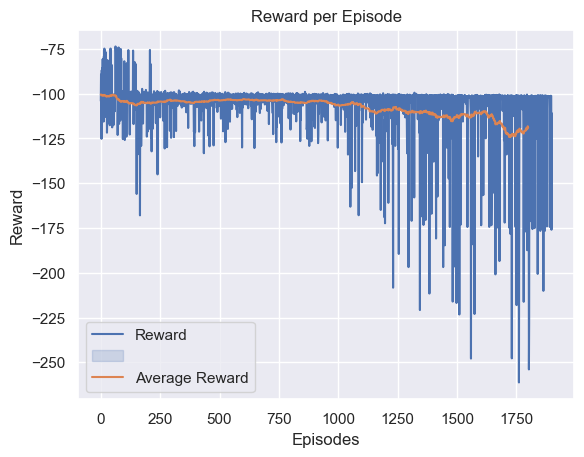

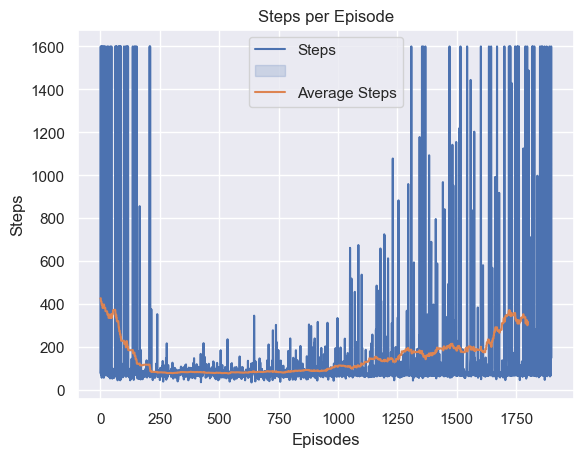

In [32]:
## graphs
import matplotlib.pyplot as plt
import numpy as np

reward = np.load("reward.npy")
steps = np.load("steps.npy")

# create plot with sns
import seaborn as sns
sns.set_theme(style="darkgrid")

# Plot the responses for different events and regions
sns.lineplot(x=range(len(reward)), y=reward)
# average
sns.lineplot(x=range(len(np.convolve(reward, np.ones((100,))/100, mode='valid'))), y=np.convolve(reward, np.ones((100,))/100, mode='valid'))
# legend with average and normal
plt.legend(['Reward','', 'Average Reward'])

plt.xlabel("Episodes")
plt.ylabel("Reward")
plt.title("Reward per Episode")
plt.show()

sns.lineplot(x=range(len(steps)), y=steps)
plt.xlabel("Episodes")
plt.ylabel("Steps")
# average 
sns.lineplot(x=range(len(np.convolve(steps, np.ones((100,))/100, mode='valid'))), y=np.convolve(steps, np.ones((100,))/100, mode='valid'))
plt.title("Steps per Episode")
plt.legend(['Steps','', 'Average Steps'])
plt.show()





In [9]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from stable_baselines3.common.callbacks import BaseCallback
from tqdm import tqdm
from os import listdir
from tensorflow.python.summary.summary_iterator import summary_iterator


In [16]:

episode_rewards = np.load("reward.npy")
steps = np.load("steps.npy")
window=10

# Calculate rolling window metrics
rolling_average = episode_rewards.rolling(window=window, min_periods=window).mean().dropna()
rolling_max = episode_rewards.rolling(window=window, min_periods=window).max().dropna()
rolling_min = episode_rewards.rolling(window=window, min_periods=window).min().dropna()

# Change column name
rolling_average.columns = ['Average Reward']
rolling_max.columns = ['Max Reward']
rolling_min.columns = ['Min Reward']
rolling_data = pd.concat([rolling_average, rolling_max, rolling_min], axis=1)

# Plot
sns.set()
ax = sns.lineplot(data=rolling_data)
ax.fill_between(rolling_average.index, rolling_min.iloc[:, 0], rolling_max.iloc[:, 0], alpha=0.2)
ax.set_title('Learning Curve')
ax.set_ylabel('Reward')
ax.set_xlabel('Episodes')

# Save figure
plt.show
#plt.savefig(log_dir + 'learning_curve' + str(window) + '.png')


AttributeError: 'numpy.ndarray' object has no attribute 'rolling'

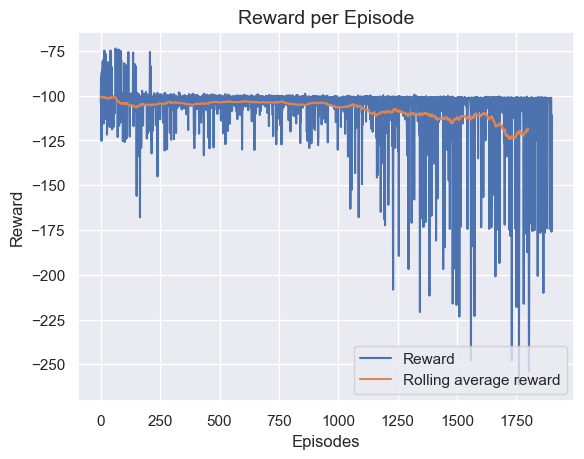

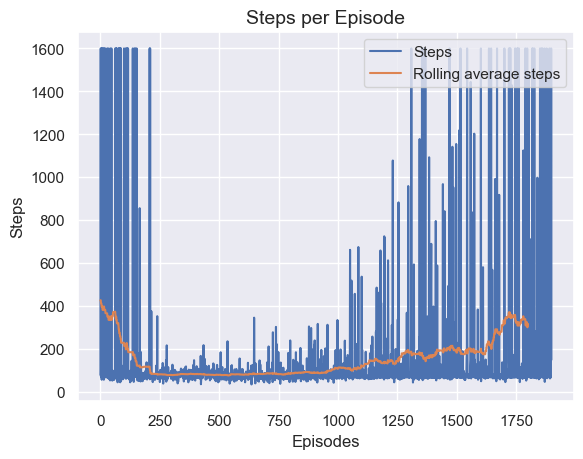

In [36]:
import matplotlib.pyplot as plt
import numpy as np

reward = np.load("reward.npy")
steps = np.load("steps.npy")

# plot reward
plt.plot(reward, label='Reward')
plt.plot(np.convolve(reward, np.ones((100,))/100, mode='valid'), label='Rolling average reward')
plt.xlabel("Episodes", fontsize=12)
plt.ylabel("Reward", fontsize=12)
plt.title("Reward per Episode", fontsize=14)
plt.grid(True)
plt.legend(loc='lower right')
plt.show()

# plot steps
plt.plot(steps, label='Steps')
plt.plot(np.convolve(steps, np.ones((100,))/100, mode='valid'), label='Rolling average steps')
plt.xlabel("Episodes", fontsize=12)
plt.ylabel("Steps", fontsize=12)
plt.title("Steps per Episode", fontsize=14)
plt.grid(True)
plt.legend(loc='upper right')
plt.show()

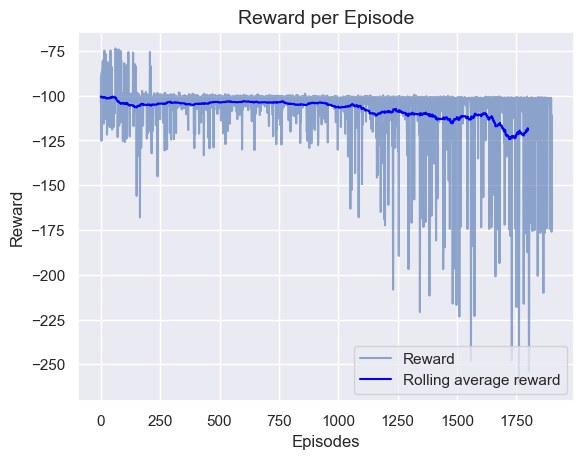

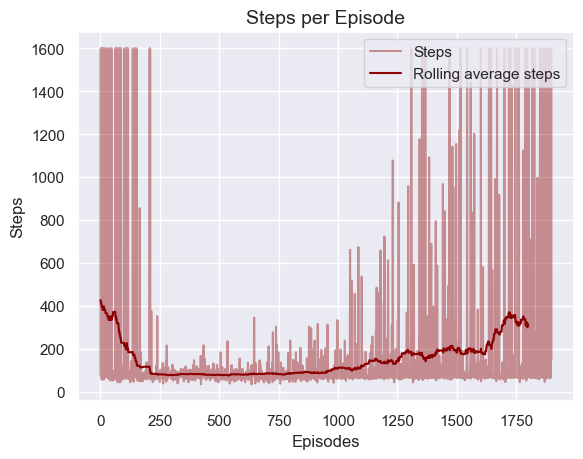

In [52]:
import matplotlib.pyplot as plt
import numpy as np

reward = np.load("reward.npy")
steps = np.load("steps.npy")

# plot reward
plt.plot(reward, alpha=0.6, label='Reward')
plt.plot(np.convolve(reward, np.ones((100,))/100, mode='valid'), color='blue', label='Rolling average reward')
plt.xlabel("Episodes", fontsize=12)
plt.ylabel("Reward", fontsize=12)
plt.title("Reward per Episode", fontsize=14)
plt.grid(True)
plt.legend(loc='lower right')
plt.show()

# plot steps
plt.plot(steps, alpha=0.4, label='Steps', color='darkred')
plt.plot(np.convolve(steps, np.ones((100,))/100, mode='valid'), color='darkred', label='Rolling average steps')
plt.xlabel("Episodes", fontsize=12)
plt.ylabel("Steps", fontsize=12)
plt.title("Steps per Episode", fontsize=14)
plt.grid(True)
plt.legend(loc='upper right')
plt.show()
